# **Importing Library**




In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
sns.set_style(style = 'whitegrid')

# **Importing Data**

In [ ]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset1/master/census_income.csv')
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


# ***EDA***

In [ ]:
df.shape

(32560, 15)

## **checking null value**

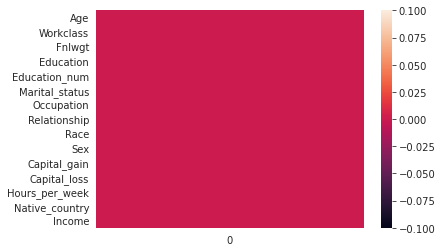

In [ ]:
sns.heatmap(df.isnull().sum().to_frame())

In [ ]:
df.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [ ]:
df['Income']=df['Income'].map({' <=50K':0,' >50K':1})# changing invome to binary classification

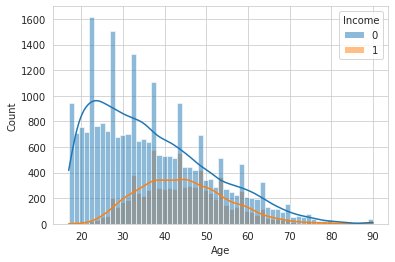

In [ ]:
sns.histplot(x='Age',data=df,kde=True,hue='Income')

Age distribution for income>50k is normaly distributed normaly and its peak occure b/w 35 and 45 where as Age distribution for income<=50k is righ normaly distributed normaly and its peak occure in 20's

## **Data Formatting**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  int64 
dtypes: int64(7), object(8)
memory usage: 3.7+ MB


In [ ]:
df['Native_country'].dtype =='O'

True

In [ ]:
cat=[]
num=[]
for i in df.columns:
  if df[i].dtype == 'O':
    cat.append(i)
  else:
    num.append(i)

## **Visualization**

In [ ]:
num

['Age',
 'Fnlwgt',
 'Education_num',
 'Capital_gain',
 'Capital_loss',
 'Hours_per_week',
 'Income']

Fnlwgt

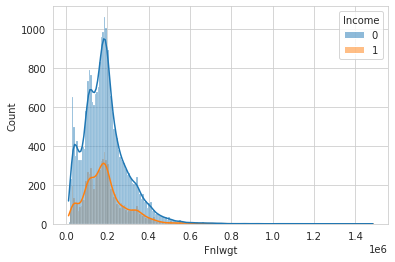

In [ ]:
sns.histplot(x='Fnlwgt',data=df,kde=True,hue='Income')

Highly rightly skewed 

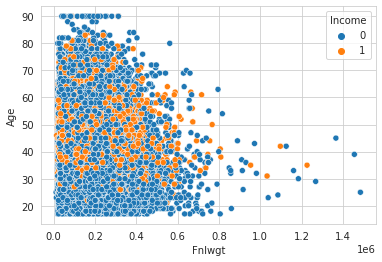

In [ ]:
sns.scatterplot(x='Fnlwgt',y='Age',data=df,hue='Income')

Final weight is not clear estimation for income 

**Education_num**

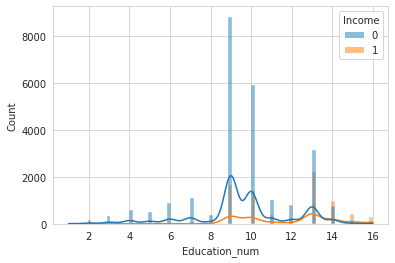

In [ ]:
sns.histplot(x='Education_num',data=df,kde=True,hue='Income')

Higher the education level higher the ratio of people having >50K/<=50K

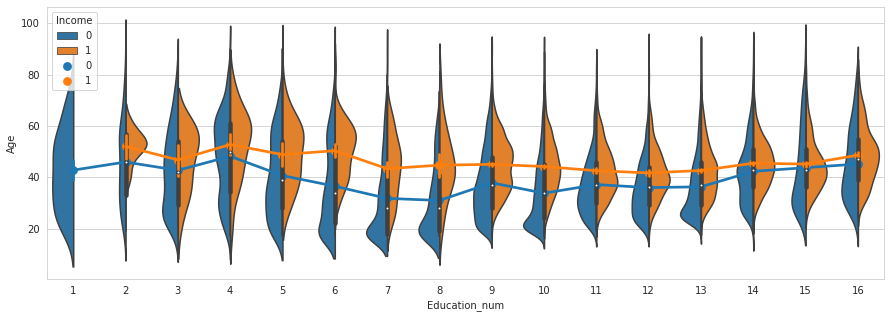

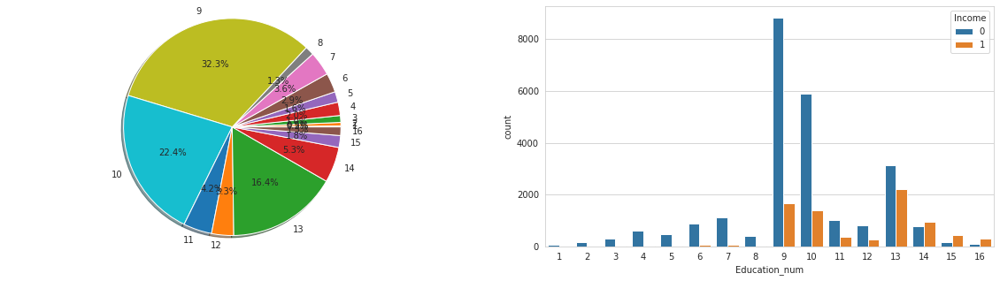

In [ ]:
plt.figure(figsize=(15,5))
sns.violinplot(x='Education_num',y='Age',data=df,hue='Income',split=True)
sns.pointplot(x='Education_num',y='Age',data=df,hue='Income',split=True)
plt.show()
labels = df['Education_num'].astype('category').cat.categories.tolist()
counts = df['Education_num'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
fig1, (ax1,ax2) = plt.subplots(1,2,figsize=(20,5))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True) #autopct is show the % on plot
ax1.axis('equal')
plt.xlabel('Education_num')
sns.countplot(x='Education_num',data=df,ax=ax2,hue='Income')


For education level one there is no persion having income>50K.

Max people(50%) have eduction level 9 and 10

**Capital_gain**

In [ ]:
df['Capital_gain'].value_counts()

0        29849
15024      347
7688       284
7298       246
99999      159
         ...  
4931         1
1455         1
6097         1
22040        1
1111         1
Name: Capital_gain, Length: 119, dtype: int64

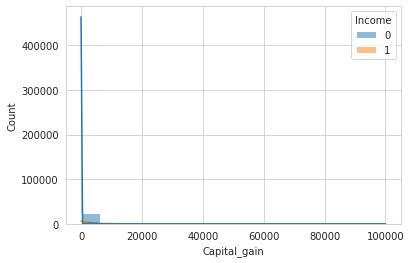

In [ ]:
sns.histplot(x='Capital_gain',data=df,kde=True,hue='Income')

Capital_gain is rigt skewed so to analyse it properly we can temporary drop 0

In [ ]:
temp_df=df.loc[df['Capital_gain']>0]

In [ ]:
df['Capital_gain'].loc[df['Income']==1].value_counts()[:30]

0        6164
15024     347
7688      284
7298      246
99999     159
5178       97
3103       90
4386       58
8614       55
10520      43
14084      41
20051      37
27828      34
13550      27
14344      26
4787       23
9386       22
10605      12
25236      11
6418        9
7430        9
4934        7
15831       6
6514        5
15020       5
5556        5
9562        4
25124       4
4687        3
7896        3
Name: Capital_gain, dtype: int64

In [ ]:
df['Capital_gain'].loc[df['Income']==0].value_counts()[:30]

0       23685
5013       69
3325       53
2174       47
4064       42
4650       41
3137       37
594        34
3908       32
2829       31
6849       27
1055       25
2885       24
3411       24
3464       23
2176       23
4101       20
2597       20
2407       19
4865       17
2202       16
1506       15
3674       14
3942       14
4416       12
4386       12
2580       12
3781       12
4508       12
2463       11
Name: Capital_gain, dtype: int64

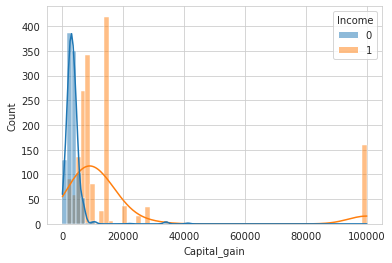

In [ ]:
sns.histplot(x='Capital_gain',data=temp_df,kde=True,hue='Income')

Max people having income<=50K is having capital gain less then 6K and peak occure at 2K

Max people having income>50K is having capital gain less then 30K and peak occure at 10K and exeption is 100K


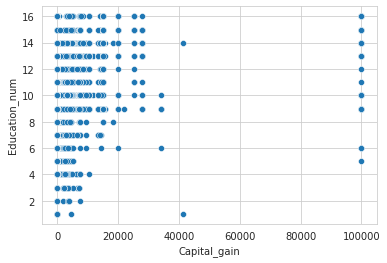

In [ ]:
sns.scatterplot(x='Capital_gain',y='Education_num',data=df,)

capital_gain is proposnal to Education_num

Capital_loss

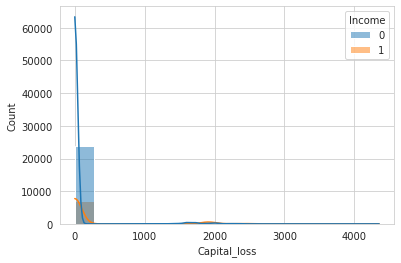

In [ ]:
sns.histplot(x='Capital_loss',data=df,kde=True,hue='Income')

Right skewed data 

In [ ]:
temp_df=df.loc[df['Capital_loss']>0]

In [ ]:
df['Capital_loss'].loc[df['Income']==1].value_counts()[:30]

0       7068
1902     189
1977     168
1887     159
1848      51
2415      49
1485      31
1564      25
2258      13
2559      12
2444      12
2377      11
2824      10
2392       9
2174       7
2246       6
1825       4
2547       4
2231       3
653        2
1755       2
3004       2
2472       1
2282       1
3683       1
2201       1
Name: Capital_loss, dtype: int64

In [ ]:
df['Capital_loss'].loc[df['Income']==0].value_counts()[:30]

0       23973
1602       47
1740       42
1590       40
1876       39
1672       34
2001       24
1669       24
1741       24
1980       23
1719       22
1408       21
2051       21
2002       21
1485       20
1579       20
1721       18
1974       18
1504       18
2339       17
1628       15
2179       15
1762       14
1902       13
2258       12
625        12
1617        9
2042        9
2205        9
1651        9
Name: Capital_loss, dtype: int64

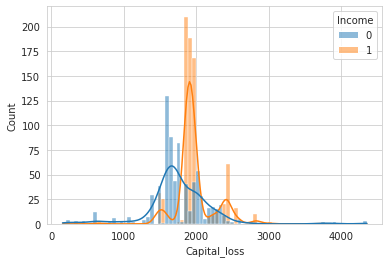

In [ ]:
sns.histplot(x='Capital_loss',data=temp_df,kde=True,hue='Income')

No significant difference



---
Hours_per_week


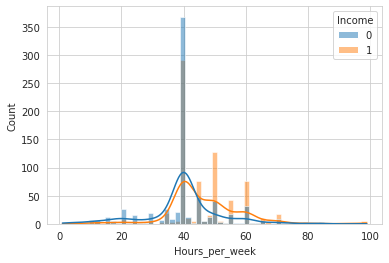

In [ ]:
sns.histplot(x='Hours_per_week',data=temp_df,kde=True,hue='Income')

As hours per week incerased ratio of pepole income>50K to income<=50K has increased

In [ ]:
df['Workclass'].value_counts()

 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1297
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: Workclass, dtype: int64

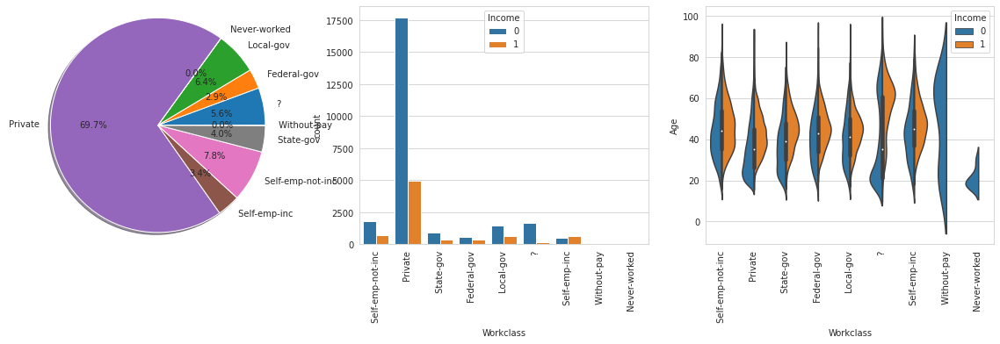

 ?                   0.104031
 Federal-gov         0.386458
 Local-gov           0.294792
 Never-worked             NaN
 Private             0.218673
 Self-emp-inc        0.557348
 Self-emp-not-inc    0.284927
 State-gov           0.272167
 Without-pay              NaN
Name: Workclass, dtype: float64


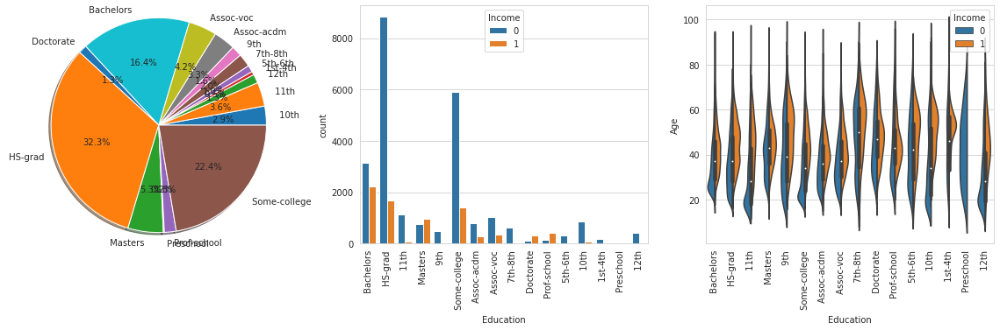

 10th            0.066452
 11th            0.051064
 12th            0.076212
 1st-4th         0.035714
 5th-6th         0.048048
 7th-8th         0.061920
 9th             0.052529
 Assoc-acdm      0.248360
 Assoc-voc       0.261216
 Bachelors       0.414830
 Doctorate       0.740920
 HS-grad         0.159509
 Masters         0.556587
 Preschool            NaN
 Prof-school     0.734375
 Some-college    0.190235
Name: Education, dtype: float64


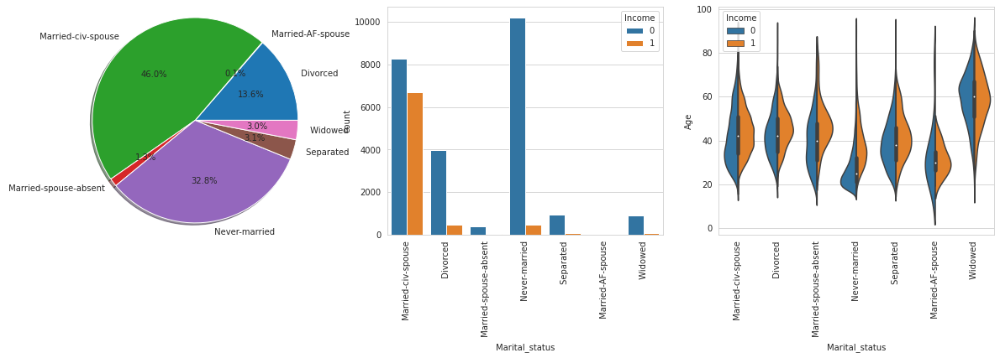

 Divorced                 0.104209
 Married-AF-spouse        0.434783
 Married-civ-spouse       0.446848
 Married-spouse-absent    0.081340
 Never-married            0.045965
 Separated                0.064390
 Widowed                  0.085599
Name: Marital_status, dtype: float64


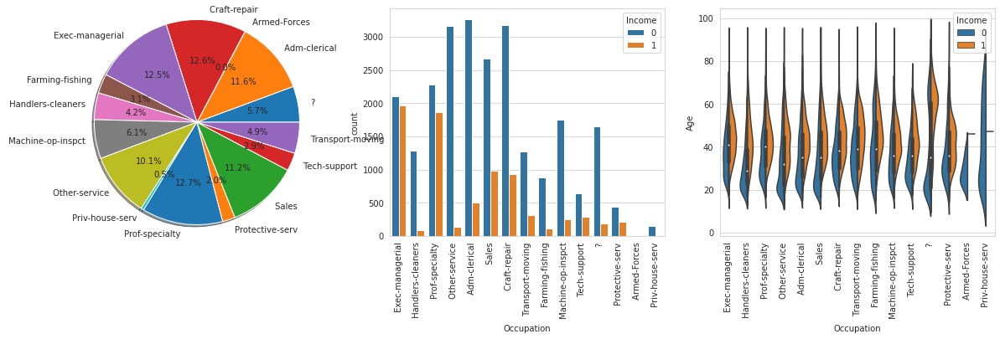

 ?                    0.103635
 Adm-clerical         0.134518
 Armed-Forces         0.111111
 Craft-repair         0.226641
 Exec-managerial      0.484014
 Farming-fishing      0.115694
 Handlers-cleaners    0.062774
 Machine-op-inspct    0.124875
 Other-service        0.041578
 Priv-house-serv      0.006711
 Prof-specialty       0.449034
 Protective-serv      0.325116
 Sales                0.269315
 Tech-support         0.304957
 Transport-moving     0.200376
Name: Occupation, dtype: float64


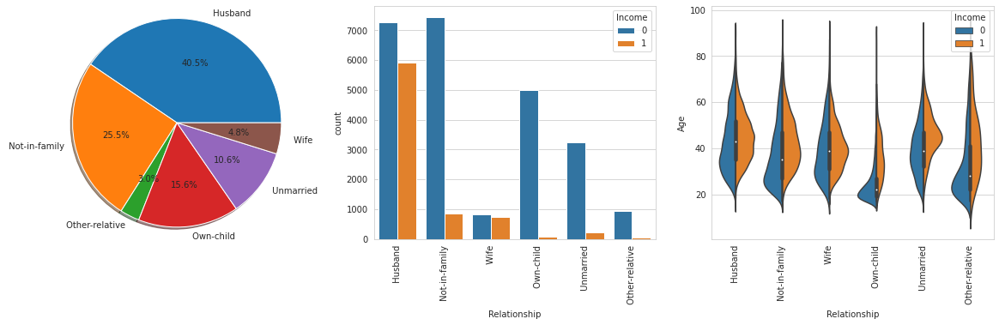

 Husband           0.448571
 Not-in-family     0.103083
 Other-relative    0.037717
 Own-child         0.013220
 Unmarried         0.063262
 Wife              0.475128
Name: Relationship, dtype: float64


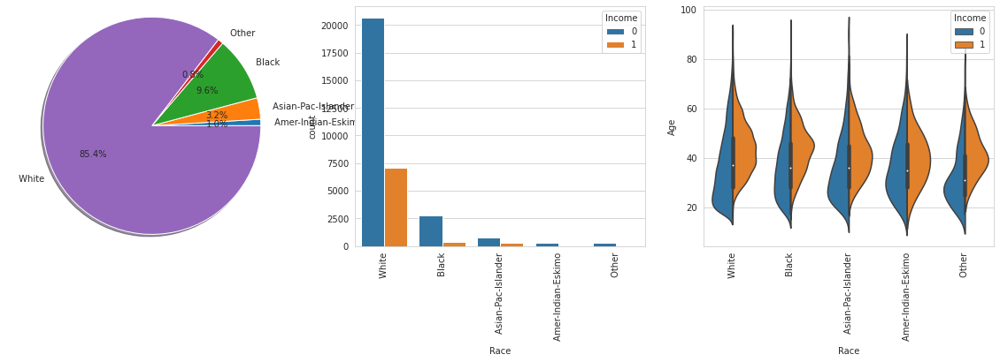

 White                 0.255869
 Black                 0.123880
 Asian-Pac-Islander    0.265640
 Amer-Indian-Eskimo    0.115756
 Other                 0.092251
Name: Race, dtype: float64


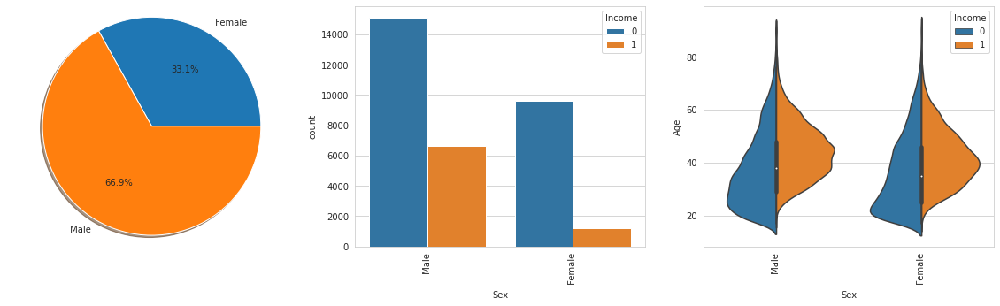

 Male      0.305751
 Female    0.109461
Name: Sex, dtype: float64


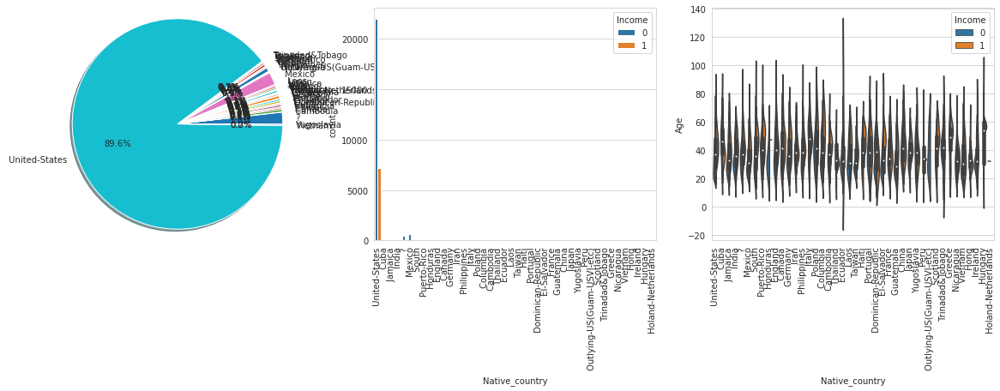

 ?                             0.250429
 Cambodia                      0.368421
 Canada                        0.322314
 China                         0.266667
 Columbia                      0.033898
 Cuba                          0.263158
 Dominican-Republic            0.028571
 Ecuador                       0.142857
 El-Salvador                   0.084906
 England                       0.333333
 France                        0.413793
 Germany                       0.321168
 Greece                        0.275862
 Guatemala                     0.046875
 Haiti                         0.090909
 Holand-Netherlands                 NaN
 Honduras                      0.076923
 Hong                          0.300000
 Hungary                       0.230769
 India                         0.400000
 Iran                          0.418605
 Ireland                       0.208333
 Italy                         0.342466
 Jamaica                       0.123457
 Japan                         0.387097


In [ ]:

for i in cat:
  labels = df[i].astype('category').cat.categories.tolist()
  counts = df[i].value_counts()
  sizes = [counts[var_cat] for var_cat in labels]
  fig1, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,5))
  ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True) #autopct is show the % on plot
  ax1.axis('equal')
  plt.xlabel(i)
  sns.countplot(x=i,data=df,ax=ax2,hue='Income')
  ax2.set_xticklabels(labels=df[i].unique(),rotation=90)
  sns.violinplot(x=i,y='Age',data=df,ax=ax3,split=True,hue='Income')
  ax3.set_xticklabels(labels=df[i].unique(),rotation=90)
  plt.show()
  print(df[i].loc[df['Income']==1].value_counts()/df[i].value_counts())

1- Self-emp-inc in workclass has higest ratio on income>50K to total where as Without-pay and Never worked in workclass has no people having income>50K

2- Education is directhy proposnal to Income

3-Married-civ-spouse in marital status has the higest ratio and Never-married has lowest

4-Exec-managerial in occupation has the higest ratio and Priv-house-serv has lowest 

5-Husband in occupation has the higest ratio and Own-child has lowest

6- Asian-Pac-Islander inRace has higest ratio and others has lowest

5- Male has higher ratio then female.




In [ ]:
a=[]
for age in df['Age']:
  if age<20:
    a.append(1)
  elif age<=30:
    a.append(2)
  elif age<=40:
    a.append(3)
  elif age<=50:
    a.append(4)
  elif age<=60:
    a.append(5)
  elif age>60:
    a.append(6)
df['age_cat']=a

In [ ]:
df['pro']=1
temp_cat=[]
num=[]
count=df.nunique()
for i in df.columns:
  if count[i] <= 20 and df[i].dtype=='int64':
    temp_cat.append(i)
  elif df[i].dtype=="O":
    temp_cat.append(i)
  else:
    num.append(i)

In [ ]:
temp_cat

['Workclass',
 'Education',
 'Education_num',
 'Marital_status',
 'Occupation',
 'Relationship',
 'Race',
 'Sex',
 'Native_country',
 'Income',
 'age_cat',
 'pro']

In [ ]:
df['pro']=1
def per_cat(df,feature,k,l):
  per_list=[]
  no_per_list=[]
  
  for i in df[feature].unique():
    temp=df.loc[df[feature]==i]
    per=(temp[feature].loc[temp['Income']==1].count()/temp[feature].count())*100
    no_per=(temp[feature].loc[temp['Income']==0].count()/temp[feature].count())*100
    print('% of >50K income when '+str(feature)+' is '+str(i)+' and '+str(l)+' is '+str(k)+' = '+str(per))
    per_list.append(per)
    no_per_list.append(no_per)
    if per>=40:
      temp['pro'].loc[temp[feature]==i]=1
    else:
      temp['pro'].loc[temp[feature]==i]=0
    df.loc[df[feature]==i]=temp
  #plt.figure(figsize=(7,5),clear=True)
  plt.subplot(1,2,1)
  plt.bar(x=df[feature].unique(),height=per_list)
  plt.subplot(1,2,2)
  plt.bar(x=df[feature].unique(),height=no_per_list,color='r')
  plt.show()
  plt.xlabel(str(feature)+" when "+str(l)+" is "+str(k))
  per_list=[]
  return(df)


Variable pro is reflecting the relation of union of  two categorical variable and output


% of >50K income when Education is  Bachelors and Workclass is  Self-emp-not-inc = 40.852130325814535
% of >50K income when Education is  HS-grad and Workclass is  Self-emp-not-inc = 20.669745958429562
% of >50K income when Education is  Masters and Workclass is  Self-emp-not-inc = 47.58064516129033
% of >50K income when Education is  Assoc-acdm and Workclass is  Self-emp-not-inc = 25.352112676056336
% of >50K income when Education is  Doctorate and Workclass is  Self-emp-not-inc = 62.0
% of >50K income when Education is  Some-college and Workclass is  Self-emp-not-inc = 22.016460905349795
% of >50K income when Education is  9th and Workclass is  Self-emp-not-inc = 11.76470588235294
% of >50K income when Education is  Prof-school and Workclass is  Self-emp-not-inc = 80.91603053435115
% of >50K income when Education is  12th and Workclass is  Self-emp-not-inc = 15.789473684210526
% of >50K income when Education is  11th and Workclass is  Self-emp-not-inc = 11.666666666666666
% of >50K i

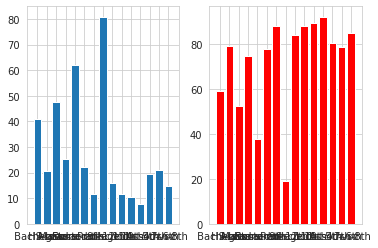

% of >50K income when Education is  HS-grad and Workclass is  Private = 14.383033419023135
% of >50K income when Education is  11th and Workclass is  Private = 4.8754062838569885
% of >50K income when Education is  Bachelors and Workclass is  Private = 42.10081667136018
% of >50K income when Education is  Masters and Workclass is  Private = 59.73154362416108
% of >50K income when Education is  9th and Workclass is  Private = 4.651162790697675
% of >50K income when Education is  Some-college and Workclass is  Private = 18.11935610522183
% of >50K income when Education is  Assoc-acdm and Workclass is  Private = 23.319615912208505
% of >50K income when Education is  Assoc-voc and Workclass is  Private = 25.472636815920396
% of >50K income when Education is  7th-8th and Workclass is  Private = 4.245283018867925
% of >50K income when Education is  Doctorate and Workclass is  Private = 72.92817679558011
% of >50K income when Education is  Prof-school and Workclass is  Private = 66.5369649805

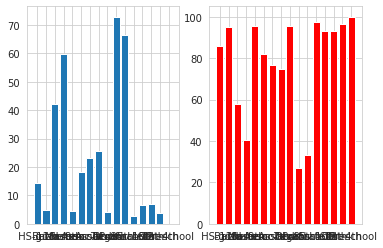

% of >50K income when Education is  Bachelors and Workclass is  State-gov = 33.457249070631974
% of >50K income when Education is  Some-college and Workclass is  State-gov = 9.538461538461538
% of >50K income when Education is  Assoc-voc and Workclass is  State-gov = 26.08695652173913
% of >50K income when Education is  Masters and Workclass is  State-gov = 42.01183431952663
% of >50K income when Education is  HS-grad and Workclass is  State-gov = 18.28358208955224
% of >50K income when Education is  Doctorate and Workclass is  State-gov = 79.7752808988764
% of >50K income when Education is  Assoc-acdm and Workclass is  State-gov = 14.634146341463413
% of >50K income when Education is  11th and Workclass is  State-gov = 7.142857142857142
% of >50K income when Education is  Prof-school and Workclass is  State-gov = 58.06451612903226
% of >50K income when Education is  9th and Workclass is  State-gov = 0.0
% of >50K income when Education is  10th and Workclass is  State-gov = 15.38461538

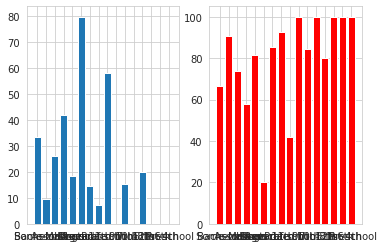

% of >50K income when Education is  9th and Workclass is  Federal-gov = 33.33333333333333
% of >50K income when Education is  Some-college and Workclass is  Federal-gov = 32.28346456692913
% of >50K income when Education is  Bachelors and Workclass is  Federal-gov = 44.81132075471698
% of >50K income when Education is  Doctorate and Workclass is  Federal-gov = 93.75
% of >50K income when Education is  HS-grad and Workclass is  Federal-gov = 27.756653992395435
% of >50K income when Education is  Masters and Workclass is  Federal-gov = 70.1492537313433
% of >50K income when Education is  Assoc-acdm and Workclass is  Federal-gov = 34.54545454545455
% of >50K income when Education is  Assoc-voc and Workclass is  Federal-gov = 39.473684210526315
% of >50K income when Education is  Prof-school and Workclass is  Federal-gov = 79.3103448275862
% of >50K income when Education is  11th and Workclass is  Federal-gov = 11.11111111111111
% of >50K income when Education is  7th-8th and Workclass is 

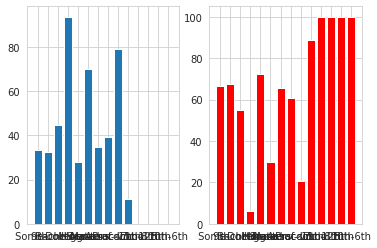

% of >50K income when Education is  Bachelors and Workclass is  Local-gov = 33.9622641509434
% of >50K income when Education is  Assoc-acdm and Workclass is  Local-gov = 31.818181818181817
% of >50K income when Education is  7th-8th and Workclass is  Local-gov = 3.571428571428571
% of >50K income when Education is  HS-grad and Workclass is  Local-gov = 17.892644135188867
% of >50K income when Education is  Some-college and Workclass is  Local-gov = 24.031007751937985
% of >50K income when Education is  Assoc-voc and Workclass is  Local-gov = 29.069767441860467
% of >50K income when Education is  Preschool and Workclass is  Local-gov = 0.0
% of >50K income when Education is  Masters and Workclass is  Local-gov = 50.58479532163743
% of >50K income when Education is  10th and Workclass is  Local-gov = 3.225806451612903
% of >50K income when Education is  11th and Workclass is  Local-gov = 5.555555555555555
% of >50K income when Education is  12th and Workclass is  Local-gov = 10.526315789

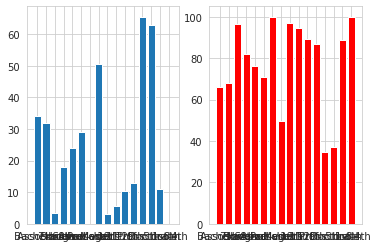

% of >50K income when Education is  Some-college and Workclass is  ? = 6.809338521400778
% of >50K income when Education is  7th-8th and Workclass is  ? = 2.7777777777777777
% of >50K income when Education is  10th and Workclass is  ? = 2.0
% of >50K income when Education is  HS-grad and Workclass is  ? = 8.646616541353383
% of >50K income when Education is  1st-4th and Workclass is  ? = 0.0
% of >50K income when Education is  Bachelors and Workclass is  ? = 26.011560693641616
% of >50K income when Education is  Masters and Workclass is  ? = 37.5
% of >50K income when Education is  Assoc-voc and Workclass is  ? = 21.311475409836063
% of >50K income when Education is  11th and Workclass is  ? = 0.0
% of >50K income when Education is  12th and Workclass is  ? = 5.0
% of >50K income when Education is  5th-6th and Workclass is  ? = 6.666666666666667
% of >50K income when Education is  9th and Workclass is  ? = 1.9607843137254901
% of >50K income when Education is  Assoc-acdm and Workclass 

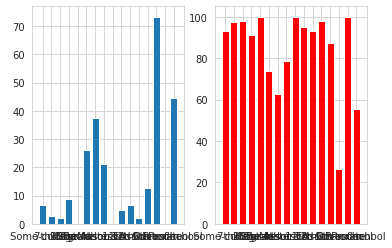

% of >50K income when Education is  HS-grad and Workclass is  Self-emp-inc = 42.65232974910394
% of >50K income when Education is  Some-college and Workclass is  Self-emp-inc = 51.32743362831859
% of >50K income when Education is  Masters and Workclass is  Self-emp-inc = 72.15189873417721
% of >50K income when Education is  7th-8th and Workclass is  Self-emp-inc = 35.714285714285715
% of >50K income when Education is  Bachelors and Workclass is  Self-emp-inc = 62.637362637362635
% of >50K income when Education is  5th-6th and Workclass is  Self-emp-inc = 50.0
% of >50K income when Education is  Doctorate and Workclass is  Self-emp-inc = 82.85714285714286
% of >50K income when Education is  9th and Workclass is  Self-emp-inc = 0.0
% of >50K income when Education is  Assoc-voc and Workclass is  Self-emp-inc = 50.0
% of >50K income when Education is  Prof-school and Workclass is  Self-emp-inc = 96.29629629629629
% of >50K income when Education is  10th and Workclass is  Self-emp-inc = 15.

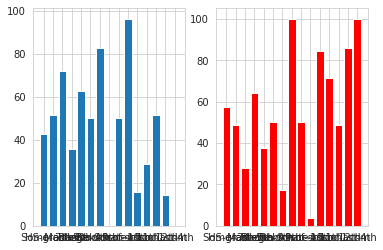

% of >50K income when Education is  7th-8th and Workclass is  Without-pay = 0.0
% of >50K income when Education is  HS-grad and Workclass is  Without-pay = 0.0
% of >50K income when Education is  Assoc-acdm and Workclass is  Without-pay = 0.0
% of >50K income when Education is  Some-college and Workclass is  Without-pay = 0.0


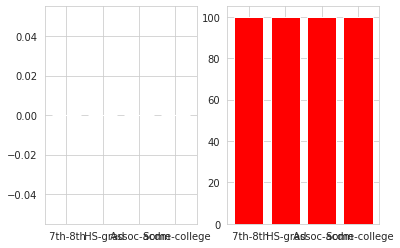

% of >50K income when Education is  10th and Workclass is  Never-worked = 0.0
% of >50K income when Education is  7th-8th and Workclass is  Never-worked = 0.0
% of >50K income when Education is  11th and Workclass is  Never-worked = 0.0
% of >50K income when Education is  Some-college and Workclass is  Never-worked = 0.0
% of >50K income when Education is  HS-grad and Workclass is  Never-worked = 0.0


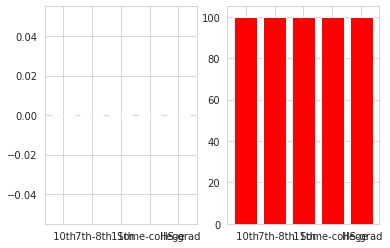

% of >50K income when Education_num is 13 and Workclass is  Self-emp-not-inc = 40.852130325814535
% of >50K income when Education_num is 9 and Workclass is  Self-emp-not-inc = 20.669745958429562
% of >50K income when Education_num is 14 and Workclass is  Self-emp-not-inc = 47.58064516129033
% of >50K income when Education_num is 12 and Workclass is  Self-emp-not-inc = 25.352112676056336
% of >50K income when Education_num is 16 and Workclass is  Self-emp-not-inc = 62.0
% of >50K income when Education_num is 10 and Workclass is  Self-emp-not-inc = 22.016460905349795
% of >50K income when Education_num is 5 and Workclass is  Self-emp-not-inc = 11.76470588235294
% of >50K income when Education_num is 15 and Workclass is  Self-emp-not-inc = 80.91603053435115
% of >50K income when Education_num is 8 and Workclass is  Self-emp-not-inc = 15.789473684210526
% of >50K income when Education_num is 7 and Workclass is  Self-emp-not-inc = 11.666666666666666
% of >50K income when Education_num is 6 

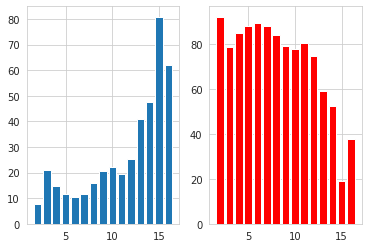

% of >50K income when Education_num is 9 and Workclass is  Private = 14.383033419023135
% of >50K income when Education_num is 7 and Workclass is  Private = 4.8754062838569885
% of >50K income when Education_num is 13 and Workclass is  Private = 42.10081667136018
% of >50K income when Education_num is 14 and Workclass is  Private = 59.73154362416108
% of >50K income when Education_num is 5 and Workclass is  Private = 4.651162790697675
% of >50K income when Education_num is 10 and Workclass is  Private = 18.11935610522183
% of >50K income when Education_num is 12 and Workclass is  Private = 23.319615912208505
% of >50K income when Education_num is 11 and Workclass is  Private = 25.472636815920396
% of >50K income when Education_num is 4 and Workclass is  Private = 4.245283018867925
% of >50K income when Education_num is 16 and Workclass is  Private = 72.92817679558011
% of >50K income when Education_num is 15 and Workclass is  Private = 66.53696498054474
% of >50K income when Education_

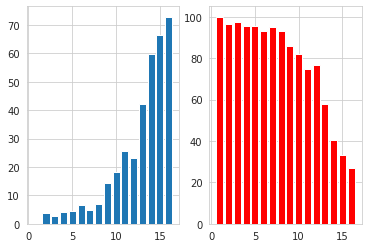

% of >50K income when Education_num is 13 and Workclass is  State-gov = 33.457249070631974
% of >50K income when Education_num is 10 and Workclass is  State-gov = 9.538461538461538
% of >50K income when Education_num is 11 and Workclass is  State-gov = 26.08695652173913
% of >50K income when Education_num is 14 and Workclass is  State-gov = 42.01183431952663
% of >50K income when Education_num is 9 and Workclass is  State-gov = 18.28358208955224
% of >50K income when Education_num is 16 and Workclass is  State-gov = 79.7752808988764
% of >50K income when Education_num is 12 and Workclass is  State-gov = 14.634146341463413
% of >50K income when Education_num is 7 and Workclass is  State-gov = 7.142857142857142
% of >50K income when Education_num is 15 and Workclass is  State-gov = 58.06451612903226
% of >50K income when Education_num is 5 and Workclass is  State-gov = 0.0
% of >50K income when Education_num is 6 and Workclass is  State-gov = 15.384615384615385
% of >50K income when Educ

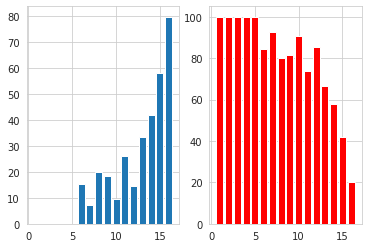

% of >50K income when Education_num is 5 and Workclass is  Federal-gov = 33.33333333333333
% of >50K income when Education_num is 10 and Workclass is  Federal-gov = 32.28346456692913
% of >50K income when Education_num is 13 and Workclass is  Federal-gov = 44.81132075471698
% of >50K income when Education_num is 16 and Workclass is  Federal-gov = 93.75
% of >50K income when Education_num is 9 and Workclass is  Federal-gov = 27.756653992395435
% of >50K income when Education_num is 14 and Workclass is  Federal-gov = 70.1492537313433
% of >50K income when Education_num is 12 and Workclass is  Federal-gov = 34.54545454545455
% of >50K income when Education_num is 11 and Workclass is  Federal-gov = 39.473684210526315
% of >50K income when Education_num is 15 and Workclass is  Federal-gov = 79.3103448275862
% of >50K income when Education_num is 7 and Workclass is  Federal-gov = 11.11111111111111
% of >50K income when Education_num is 4 and Workclass is  Federal-gov = 0.0
% of >50K income w

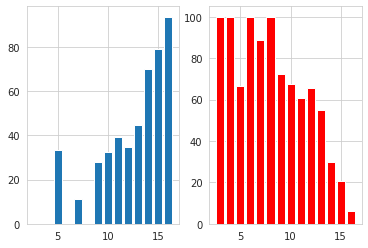

% of >50K income when Education_num is 13 and Workclass is  Local-gov = 33.9622641509434
% of >50K income when Education_num is 12 and Workclass is  Local-gov = 31.818181818181817
% of >50K income when Education_num is 4 and Workclass is  Local-gov = 3.571428571428571
% of >50K income when Education_num is 9 and Workclass is  Local-gov = 17.892644135188867
% of >50K income when Education_num is 10 and Workclass is  Local-gov = 24.031007751937985
% of >50K income when Education_num is 11 and Workclass is  Local-gov = 29.069767441860467
% of >50K income when Education_num is 1 and Workclass is  Local-gov = 0.0
% of >50K income when Education_num is 14 and Workclass is  Local-gov = 50.58479532163743
% of >50K income when Education_num is 6 and Workclass is  Local-gov = 3.225806451612903
% of >50K income when Education_num is 7 and Workclass is  Local-gov = 5.555555555555555
% of >50K income when Education_num is 8 and Workclass is  Local-gov = 10.526315789473683
% of >50K income when Educ

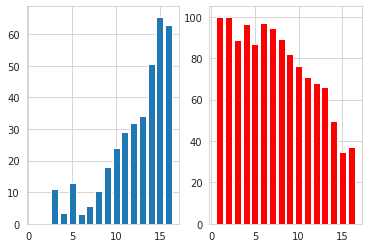

% of >50K income when Education_num is 10 and Workclass is  ? = 6.809338521400778
% of >50K income when Education_num is 4 and Workclass is  ? = 2.7777777777777777
% of >50K income when Education_num is 6 and Workclass is  ? = 2.0
% of >50K income when Education_num is 9 and Workclass is  ? = 8.646616541353383
% of >50K income when Education_num is 2 and Workclass is  ? = 0.0
% of >50K income when Education_num is 13 and Workclass is  ? = 26.011560693641616
% of >50K income when Education_num is 14 and Workclass is  ? = 37.5
% of >50K income when Education_num is 11 and Workclass is  ? = 21.311475409836063
% of >50K income when Education_num is 7 and Workclass is  ? = 0.0
% of >50K income when Education_num is 8 and Workclass is  ? = 5.0
% of >50K income when Education_num is 3 and Workclass is  ? = 6.666666666666667
% of >50K income when Education_num is 5 and Workclass is  ? = 1.9607843137254901
% of >50K income when Education_num is 12 and Workclass is  ? = 12.76595744680851
% of >5

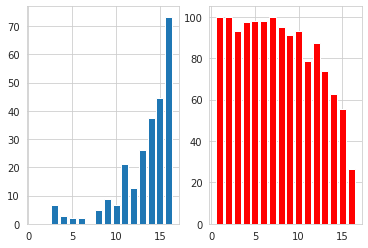

% of >50K income when Education_num is 9 and Workclass is  Self-emp-inc = 42.65232974910394
% of >50K income when Education_num is 10 and Workclass is  Self-emp-inc = 51.32743362831859
% of >50K income when Education_num is 14 and Workclass is  Self-emp-inc = 72.15189873417721
% of >50K income when Education_num is 4 and Workclass is  Self-emp-inc = 35.714285714285715
% of >50K income when Education_num is 13 and Workclass is  Self-emp-inc = 62.637362637362635
% of >50K income when Education_num is 3 and Workclass is  Self-emp-inc = 50.0
% of >50K income when Education_num is 16 and Workclass is  Self-emp-inc = 82.85714285714286
% of >50K income when Education_num is 5 and Workclass is  Self-emp-inc = 0.0
% of >50K income when Education_num is 11 and Workclass is  Self-emp-inc = 50.0
% of >50K income when Education_num is 15 and Workclass is  Self-emp-inc = 96.29629629629629
% of >50K income when Education_num is 6 and Workclass is  Self-emp-inc = 15.789473684210526
% of >50K income wh

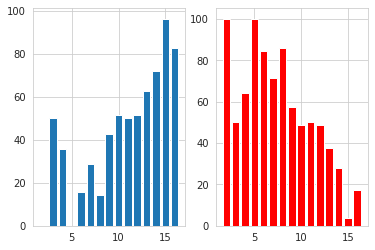

% of >50K income when Education_num is 4 and Workclass is  Without-pay = 0.0
% of >50K income when Education_num is 9 and Workclass is  Without-pay = 0.0
% of >50K income when Education_num is 12 and Workclass is  Without-pay = 0.0
% of >50K income when Education_num is 10 and Workclass is  Without-pay = 0.0


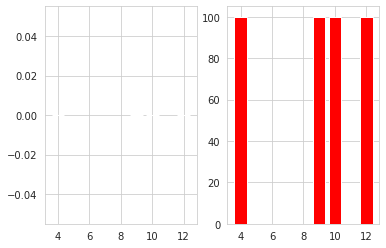

% of >50K income when Education_num is 6 and Workclass is  Never-worked = 0.0
% of >50K income when Education_num is 4 and Workclass is  Never-worked = 0.0
% of >50K income when Education_num is 7 and Workclass is  Never-worked = 0.0
% of >50K income when Education_num is 10 and Workclass is  Never-worked = 0.0
% of >50K income when Education_num is 9 and Workclass is  Never-worked = 0.0


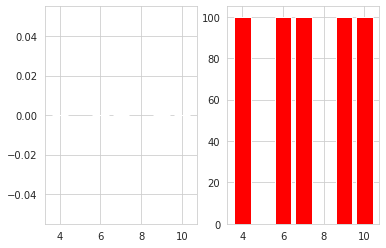

% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Self-emp-not-inc = 36.07142857142857
% of >50K income when Marital_status is  Never-married and Workclass is  Self-emp-not-inc = 12.469437652811736
% of >50K income when Marital_status is  Divorced and Workclass is  Self-emp-not-inc = 15.753424657534246
% of >50K income when Marital_status is  Separated and Workclass is  Self-emp-not-inc = 3.7735849056603774
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  Self-emp-not-inc = 25.806451612903224
% of >50K income when Marital_status is  Widowed and Workclass is  Self-emp-not-inc = 13.513513513513514
% of >50K income when Marital_status is  Married-AF-spouse and Workclass is  Self-emp-not-inc = 50.0


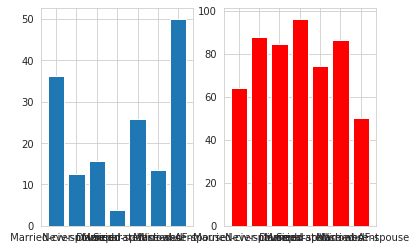

% of >50K income when Marital_status is  Divorced and Workclass is  Private = 9.458159666559794
% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Private = 43.36210439786272
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  Private = 6.622516556291391
% of >50K income when Marital_status is  Never-married and Workclass is  Private = 4.006840947959931
% of >50K income when Marital_status is  Separated and Workclass is  Private = 6.23342175066313
% of >50K income when Marital_status is  Married-AF-spouse and Workclass is  Private = 46.666666666666664
% of >50K income when Marital_status is  Widowed and Workclass is  Private = 7.8231292517006805


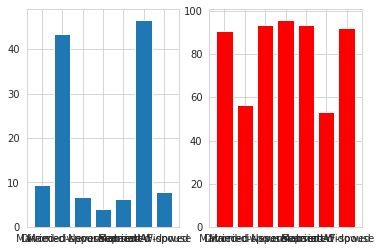

% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  State-gov = 51.53061224489795
% of >50K income when Marital_status is  Widowed and Workclass is  State-gov = 3.8461538461538463
% of >50K income when Marital_status is  Divorced and Workclass is  State-gov = 11.428571428571429
% of >50K income when Marital_status is  Never-married and Workclass is  State-gov = 5.097087378640777
% of >50K income when Marital_status is  Separated and Workclass is  State-gov = 4.651162790697675
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  State-gov = 11.76470588235294
% of >50K income when Marital_status is  Married-AF-spouse and Workclass is  State-gov = 0.0


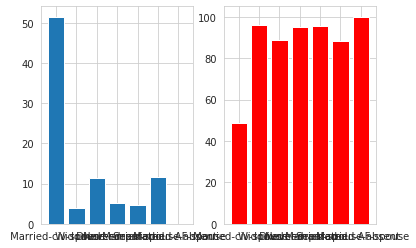

% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Federal-gov = 64.54352441613588
% of >50K income when Marital_status is  Divorced and Workclass is  Federal-gov = 16.666666666666664
% of >50K income when Marital_status is  Never-married and Workclass is  Federal-gov = 10.204081632653061
% of >50K income when Marital_status is  Widowed and Workclass is  Federal-gov = 13.88888888888889
% of >50K income when Marital_status is  Separated and Workclass is  Federal-gov = 19.230769230769234
% of >50K income when Marital_status is  Married-AF-spouse and Workclass is  Federal-gov = 66.66666666666666
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  Federal-gov = 18.181818181818183


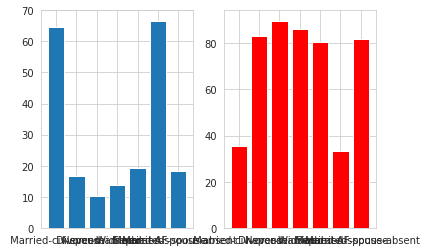

% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Local-gov = 51.02639296187683
% of >50K income when Marital_status is  Never-married and Workclass is  Local-gov = 7.735849056603773
% of >50K income when Marital_status is  Divorced and Workclass is  Local-gov = 10.840108401084011
% of >50K income when Marital_status is  Widowed and Workclass is  Local-gov = 9.30232558139535
% of >50K income when Marital_status is  Separated and Workclass is  Local-gov = 7.936507936507936
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  Local-gov = 4.545454545454546


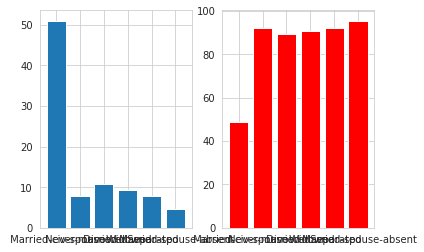

% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  ? = 26.88679245283019
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  ? = 3.4482758620689653
% of >50K income when Marital_status is  Never-married and Workclass is  ? = 1.1749347258485638
% of >50K income when Marital_status is  Divorced and Workclass is  ? = 3.260869565217391
% of >50K income when Marital_status is  Widowed and Workclass is  ? = 2.6143790849673203
% of >50K income when Marital_status is  Separated and Workclass is  ? = 0.0
% of >50K income when Marital_status is  Married-AF-spouse and Workclass is  ? = 0.0


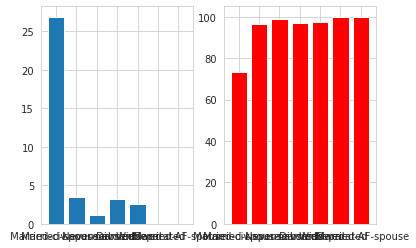

% of >50K income when Marital_status is  Divorced and Workclass is  Self-emp-inc = 24.0
% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Self-emp-inc = 67.62246117084827
% of >50K income when Marital_status is  Never-married and Workclass is  Self-emp-inc = 12.8
% of >50K income when Marital_status is  Separated and Workclass is  Self-emp-inc = 25.0
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  Self-emp-inc = 0.0
% of >50K income when Marital_status is  Widowed and Workclass is  Self-emp-inc = 37.93103448275862


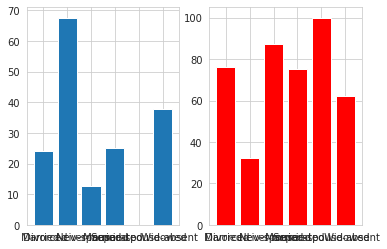

% of >50K income when Marital_status is  Widowed and Workclass is  Without-pay = 0.0
% of >50K income when Marital_status is  Never-married and Workclass is  Without-pay = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Without-pay = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Workclass is  Without-pay = 0.0


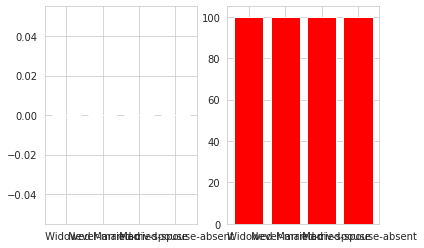

% of >50K income when Marital_status is  Never-married and Workclass is  Never-worked = 0.0
% of >50K income when Marital_status is  Divorced and Workclass is  Never-worked = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Workclass is  Never-worked = 0.0


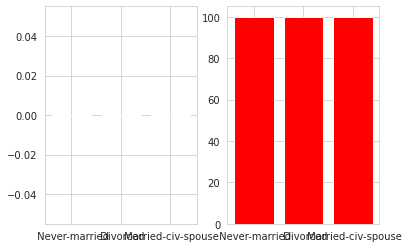

% of >50K income when Occupation is  Exec-managerial and Workclass is  Self-emp-not-inc = 36.734693877551024
% of >50K income when Occupation is  Farming-fishing and Workclass is  Self-emp-not-inc = 14.883720930232558
% of >50K income when Occupation is  Prof-specialty and Workclass is  Self-emp-not-inc = 56.30026809651475
% of >50K income when Occupation is  Sales and Workclass is  Self-emp-not-inc = 33.246753246753244
% of >50K income when Occupation is  Other-service and Workclass is  Self-emp-not-inc = 6.857142857142858
% of >50K income when Occupation is  Craft-repair and Workclass is  Self-emp-not-inc = 17.890772128060263
% of >50K income when Occupation is  Handlers-cleaners and Workclass is  Self-emp-not-inc = 20.0
% of >50K income when Occupation is  Tech-support and Workclass is  Self-emp-not-inc = 42.30769230769231
% of >50K income when Occupation is  Transport-moving and Workclass is  Self-emp-not-inc = 23.770491803278688
% of >50K income when Occupation is  Adm-clerical an

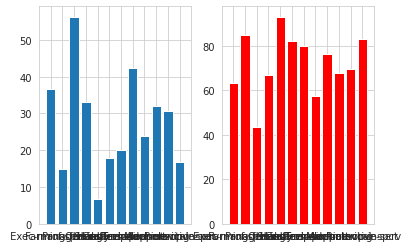

% of >50K income when Occupation is  Handlers-cleaners and Workclass is  Private = 5.734485467399843
% of >50K income when Occupation is  Prof-specialty and Workclass is  Private = 43.57976653696498
% of >50K income when Occupation is  Exec-managerial and Workclass is  Private = 48.12337421033073
% of >50K income when Occupation is  Other-service and Workclass is  Private = 3.64963503649635
% of >50K income when Occupation is  Adm-clerical and Workclass is  Private = 11.330744793505119
% of >50K income when Occupation is  Sales and Workclass is  Private = 23.249490142760028
% of >50K income when Occupation is  Craft-repair and Workclass is  Private = 22.566510172143975
% of >50K income when Occupation is  Transport-moving and Workclass is  Private = 20.063191153238545
% of >50K income when Occupation is  Machine-op-inspct and Workclass is  Private = 11.761630946157867
% of >50K income when Occupation is  Tech-support and Workclass is  Private = 30.027173913043477
% of >50K income when 

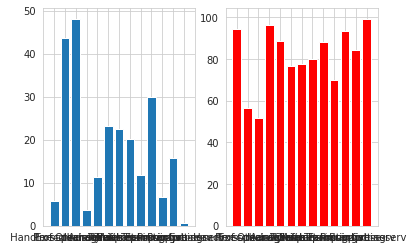

% of >50K income when Occupation is  Prof-specialty and Workclass is  State-gov = 41.30434782608695
% of >50K income when Occupation is  Other-service and Workclass is  State-gov = 3.225806451612903
% of >50K income when Occupation is  Craft-repair and Workclass is  State-gov = 25.0
% of >50K income when Occupation is  Protective-serv and Workclass is  State-gov = 25.0
% of >50K income when Occupation is  Adm-clerical and Workclass is  State-gov = 10.714285714285714
% of >50K income when Occupation is  Machine-op-inspct and Workclass is  State-gov = 38.46153846153847
% of >50K income when Occupation is  Exec-managerial and Workclass is  State-gov = 42.857142857142854
% of >50K income when Occupation is  Transport-moving and Workclass is  State-gov = 17.073170731707318
% of >50K income when Occupation is  Tech-support and Workclass is  State-gov = 15.789473684210526
% of >50K income when Occupation is  Sales and Workclass is  State-gov = 27.27272727272727
% of >50K income when Occupatio

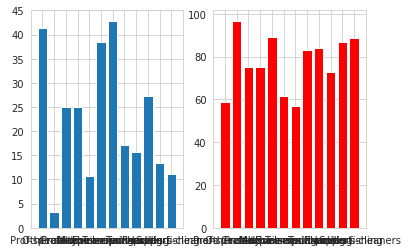

% of >50K income when Occupation is  Farming-fishing and Workclass is  Federal-gov = 25.0
% of >50K income when Occupation is  Adm-clerical and Workclass is  Federal-gov = 31.861198738170348
% of >50K income when Occupation is  Prof-specialty and Workclass is  Federal-gov = 54.285714285714285
% of >50K income when Occupation is  Exec-managerial and Workclass is  Federal-gov = 51.11111111111111
% of >50K income when Occupation is  Other-service and Workclass is  Federal-gov = 8.571428571428571
% of >50K income when Occupation is  Tech-support and Workclass is  Federal-gov = 36.76470588235294
% of >50K income when Occupation is  Sales and Workclass is  Federal-gov = 35.714285714285715
% of >50K income when Occupation is  Armed-Forces and Workclass is  Federal-gov = 11.11111111111111
% of >50K income when Occupation is  Craft-repair and Workclass is  Federal-gov = 32.8125
% of >50K income when Occupation is  Handlers-cleaners and Workclass is  Federal-gov = 8.695652173913043
% of >50K inc

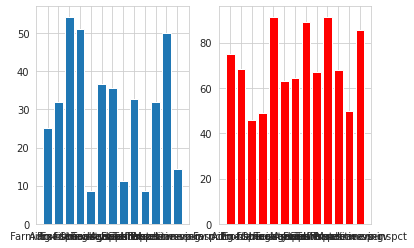

% of >50K income when Occupation is  Tech-support and Workclass is  Local-gov = 39.473684210526315
% of >50K income when Occupation is  Protective-serv and Workclass is  Local-gov = 44.40789473684211
% of >50K income when Occupation is  Farming-fishing and Workclass is  Local-gov = 6.896551724137931
% of >50K income when Occupation is  Handlers-cleaners and Workclass is  Local-gov = 14.893617021276595
% of >50K income when Occupation is  Adm-clerical and Workclass is  Local-gov = 11.66077738515901
% of >50K income when Occupation is  Craft-repair and Workclass is  Local-gov = 27.397260273972602
% of >50K income when Occupation is  Prof-specialty and Workclass is  Local-gov = 36.02836879432624
% of >50K income when Occupation is  Exec-managerial and Workclass is  Local-gov = 47.66355140186916
% of >50K income when Occupation is  Transport-moving and Workclass is  Local-gov = 10.434782608695652
% of >50K income when Occupation is  Machine-op-inspct and Workclass is  Local-gov = 16.666666

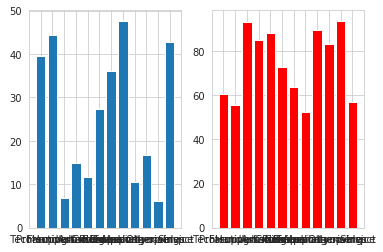

% of >50K income when Occupation is  ? and Workclass is  ? = 10.403050108932462


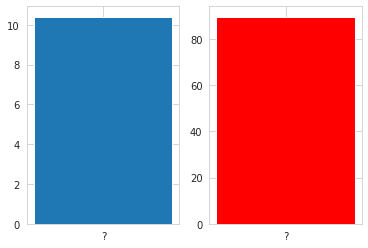

% of >50K income when Occupation is  Exec-managerial and Workclass is  Self-emp-inc = 63.5
% of >50K income when Occupation is  Craft-repair and Workclass is  Self-emp-inc = 35.84905660377358
% of >50K income when Occupation is  Sales and Workclass is  Self-emp-inc = 54.98281786941581
% of >50K income when Occupation is  Machine-op-inspct and Workclass is  Self-emp-inc = 38.46153846153847
% of >50K income when Occupation is  Farming-fishing and Workclass is  Self-emp-inc = 29.411764705882355
% of >50K income when Occupation is  Prof-specialty and Workclass is  Self-emp-inc = 75.625
% of >50K income when Occupation is  Transport-moving and Workclass is  Self-emp-inc = 37.03703703703704
% of >50K income when Occupation is  Tech-support and Workclass is  Self-emp-inc = 66.66666666666666
% of >50K income when Occupation is  Other-service and Workclass is  Self-emp-inc = 22.22222222222222
% of >50K income when Occupation is  Adm-clerical and Workclass is  Self-emp-inc = 29.03225806451613
% 

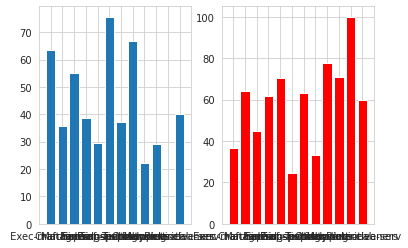

% of >50K income when Occupation is  Farming-fishing and Workclass is  Without-pay = 0.0
% of >50K income when Occupation is  Craft-repair and Workclass is  Without-pay = 0.0
% of >50K income when Occupation is  Handlers-cleaners and Workclass is  Without-pay = 0.0
% of >50K income when Occupation is  Machine-op-inspct and Workclass is  Without-pay = 0.0
% of >50K income when Occupation is  Transport-moving and Workclass is  Without-pay = 0.0
% of >50K income when Occupation is  Adm-clerical and Workclass is  Without-pay = 0.0
% of >50K income when Occupation is  Other-service and Workclass is  Without-pay = 0.0


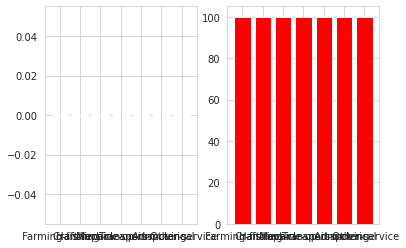

% of >50K income when Occupation is  ? and Workclass is  Never-worked = 0.0


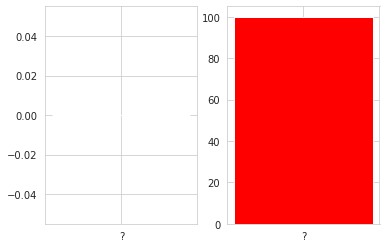

% of >50K income when Relationship is  Husband and Workclass is  Self-emp-not-inc = 35.40856031128405
% of >50K income when Relationship is  Own-child and Workclass is  Self-emp-not-inc = 5.161290322580645
% of >50K income when Relationship is  Unmarried and Workclass is  Self-emp-not-inc = 16.7741935483871
% of >50K income when Relationship is  Not-in-family and Workclass is  Self-emp-not-inc = 15.503875968992247
% of >50K income when Relationship is  Wife and Workclass is  Self-emp-not-inc = 46.34146341463415
% of >50K income when Relationship is  Other-relative and Workclass is  Self-emp-not-inc = 14.000000000000002


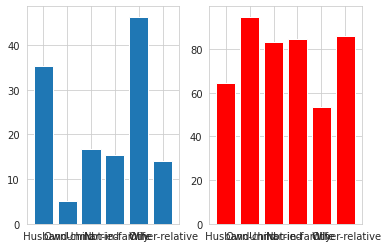

% of >50K income when Relationship is  Not-in-family and Workclass is  Private = 9.44055944055944
% of >50K income when Relationship is  Husband and Workclass is  Private = 43.78208119458703
% of >50K income when Relationship is  Wife and Workclass is  Private = 44.84484484484484
% of >50K income when Relationship is  Own-child and Workclass is  Private = 1.2154124644427204
% of >50K income when Relationship is  Unmarried and Workclass is  Private = 5.205811138014528
% of >50K income when Relationship is  Other-relative and Workclass is  Private = 2.454780361757106


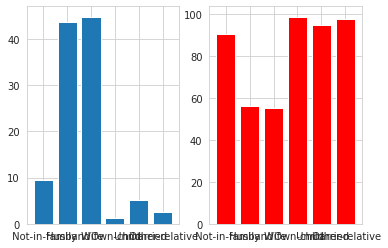

% of >50K income when Relationship is  Husband and Workclass is  State-gov = 50.5859375
% of >50K income when Relationship is  Unmarried and Workclass is  State-gov = 10.062893081761008
% of >50K income when Relationship is  Not-in-family and Workclass is  State-gov = 8.310991957104557
% of >50K income when Relationship is  Own-child and Workclass is  State-gov = 1.8404907975460123
% of >50K income when Relationship is  Wife and Workclass is  State-gov = 61.76470588235294
% of >50K income when Relationship is  Other-relative and Workclass is  State-gov = 9.090909090909092


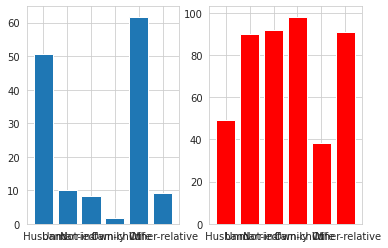

% of >50K income when Relationship is  Husband and Workclass is  Federal-gov = 64.80186480186481
% of >50K income when Relationship is  Own-child and Workclass is  Federal-gov = 0.0
% of >50K income when Relationship is  Not-in-family and Workclass is  Federal-gov = 17.20430107526882
% of >50K income when Relationship is  Unmarried and Workclass is  Federal-gov = 13.492063492063492
% of >50K income when Relationship is  Wife and Workclass is  Federal-gov = 65.85365853658537
% of >50K income when Relationship is  Other-relative and Workclass is  Federal-gov = 4.761904761904762


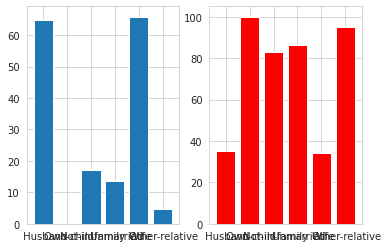

% of >50K income when Relationship is  Husband and Workclass is  Local-gov = 48.77764842840512
% of >50K income when Relationship is  Not-in-family and Workclass is  Local-gov = 13.218390804597702
% of >50K income when Relationship is  Unmarried and Workclass is  Local-gov = 6.333333333333334
% of >50K income when Relationship is  Own-child and Workclass is  Local-gov = 1.8604651162790697
% of >50K income when Relationship is  Wife and Workclass is  Local-gov = 66.23376623376623
% of >50K income when Relationship is  Other-relative and Workclass is  Local-gov = 9.30232558139535


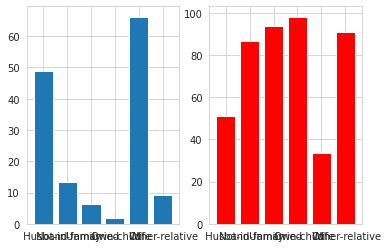

% of >50K income when Relationship is  Husband and Workclass is  ? = 26.380368098159508
% of >50K income when Relationship is  Not-in-family and Workclass is  ? = 4.100227790432802
% of >50K income when Relationship is  Own-child and Workclass is  ? = 0.18587360594795538
% of >50K income when Relationship is  Wife and Workclass is  ? = 30.303030303030305
% of >50K income when Relationship is  Unmarried and Workclass is  ? = 1.1428571428571428
% of >50K income when Relationship is  Other-relative and Workclass is  ? = 1.5873015873015872


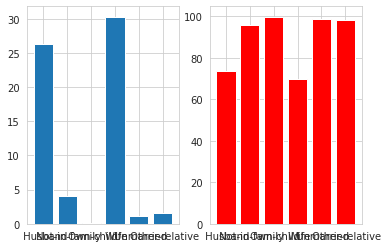

% of >50K income when Relationship is  Not-in-family and Workclass is  Self-emp-inc = 25.595238095238095
% of >50K income when Relationship is  Husband and Workclass is  Self-emp-inc = 67.93893129770993
% of >50K income when Relationship is  Unmarried and Workclass is  Self-emp-inc = 17.647058823529413
% of >50K income when Relationship is  Wife and Workclass is  Self-emp-inc = 61.702127659574465
% of >50K income when Relationship is  Own-child and Workclass is  Self-emp-inc = 7.142857142857142
% of >50K income when Relationship is  Other-relative and Workclass is  Self-emp-inc = 37.5


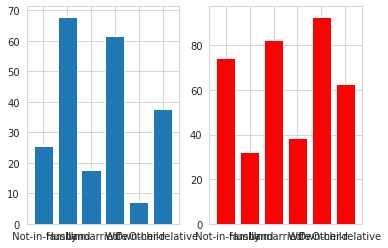

% of >50K income when Relationship is  Unmarried and Workclass is  Without-pay = 0.0
% of >50K income when Relationship is  Own-child and Workclass is  Without-pay = 0.0
% of >50K income when Relationship is  Wife and Workclass is  Without-pay = 0.0
% of >50K income when Relationship is  Husband and Workclass is  Without-pay = 0.0


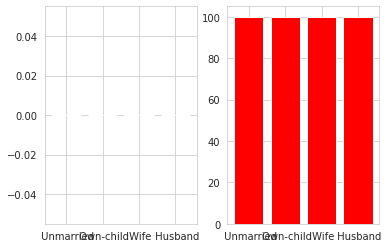

% of >50K income when Relationship is  Own-child and Workclass is  Never-worked = 0.0
% of >50K income when Relationship is  Not-in-family and Workclass is  Never-worked = 0.0
% of >50K income when Relationship is  Wife and Workclass is  Never-worked = 0.0


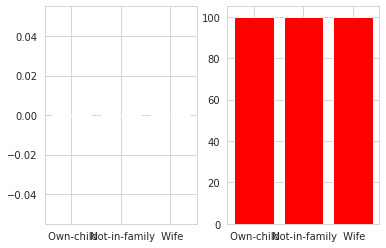

% of >50K income when Race is  White and Workclass is  Self-emp-not-inc = 28.650725875320237
% of >50K income when Race is  Black and Workclass is  Self-emp-not-inc = 21.50537634408602
% of >50K income when Race is  Asian-Pac-Islander and Workclass is  Self-emp-not-inc = 32.87671232876712
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  Self-emp-not-inc = 16.666666666666664
% of >50K income when Race is  Other and Workclass is  Self-emp-not-inc = 55.55555555555556


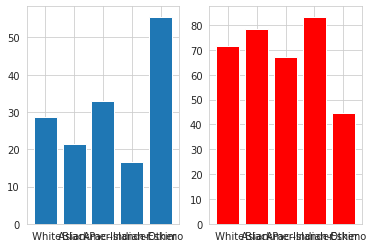

% of >50K income when Race is  White and Workclass is  Private = 23.356009070294785
% of >50K income when Race is  Black and Workclass is  Private = 10.340073529411764
% of >50K income when Race is  Asian-Pac-Islander and Workclass is  Private = 24.544179523141654
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  Private = 9.473684210526317
% of >50K income when Race is  Other and Workclass is  Private = 6.103286384976526


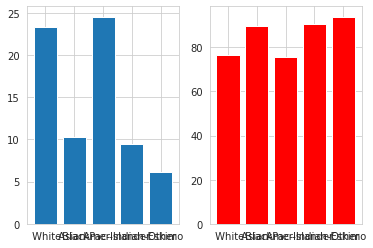

% of >50K income when Race is  Asian-Pac-Islander and Workclass is  State-gov = 22.413793103448278
% of >50K income when Race is  Black and Workclass is  State-gov = 16.352201257861633
% of >50K income when Race is  White and Workclass is  State-gov = 28.84071630537229
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  State-gov = 46.666666666666664
% of >50K income when Race is  Other and Workclass is  State-gov = 25.0


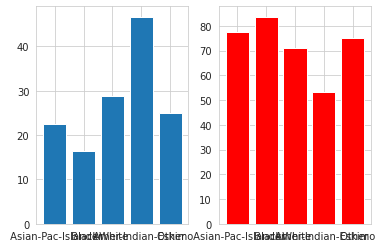

% of >50K income when Race is  Black and Workclass is  Federal-gov = 21.893491124260358
% of >50K income when Race is  White and Workclass is  Federal-gov = 43.27323162274618
% of >50K income when Race is  Asian-Pac-Islander and Workclass is  Federal-gov = 45.45454545454545
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  Federal-gov = 10.526315789473683
% of >50K income when Race is  Other and Workclass is  Federal-gov = 0.0


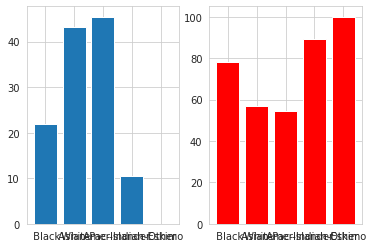

% of >50K income when Race is  White and Workclass is  Local-gov = 31.220930232558143
% of >50K income when Race is  Black and Workclass is  Local-gov = 21.180555555555554
% of >50K income when Race is  Asian-Pac-Islander and Workclass is  Local-gov = 35.8974358974359
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  Local-gov = 5.555555555555555
% of >50K income when Race is  Other and Workclass is  Local-gov = 30.0


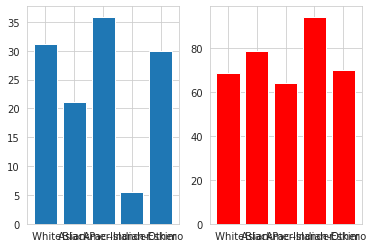

% of >50K income when Race is  Asian-Pac-Islander and Workclass is  ? = 7.6923076923076925
% of >50K income when Race is  White and Workclass is  ? = 11.456953642384105
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  ? = 8.0
% of >50K income when Race is  Black and Workclass is  ? = 4.225352112676056
% of >50K income when Race is  Other and Workclass is  ? = 8.695652173913043


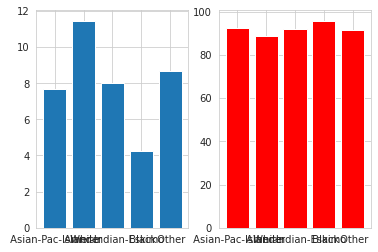

% of >50K income when Race is  White and Workclass is  Self-emp-inc = 56.34615384615385
% of >50K income when Race is  Asian-Pac-Islander and Workclass is  Self-emp-inc = 54.347826086956516
% of >50K income when Race is  Other and Workclass is  Self-emp-inc = 20.0
% of >50K income when Race is  Black and Workclass is  Self-emp-inc = 39.130434782608695
% of >50K income when Race is  Amer-Indian-Eskimo and Workclass is  Self-emp-inc = 50.0


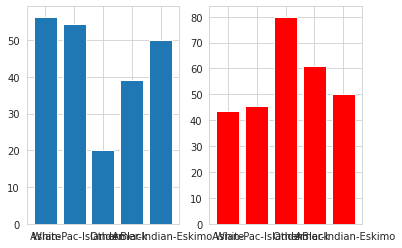

% of >50K income when Race is  White and Workclass is  Without-pay = 0.0
% of >50K income when Race is  Black and Workclass is  Without-pay = 0.0
% of >50K income when Race is  Asian-Pac-Islander and Workclass is  Without-pay = 0.0


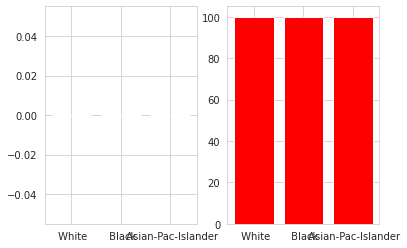

% of >50K income when Race is  White and Workclass is  Never-worked = 0.0
% of >50K income when Race is  Black and Workclass is  Never-worked = 0.0


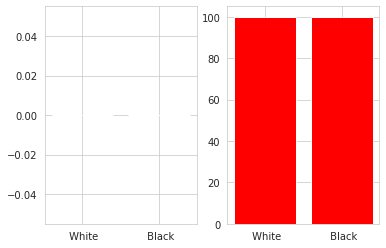

% of >50K income when Sex is  Male and Workclass is  Self-emp-not-inc = 29.971988795518207
% of >50K income when Sex is  Female and Workclass is  Self-emp-not-inc = 20.551378446115287


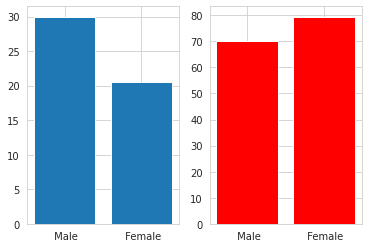

% of >50K income when Sex is  Male and Workclass is  Private = 28.35251605995717
% of >50K income when Sex is  Female and Workclass is  Private = 9.365325077399381


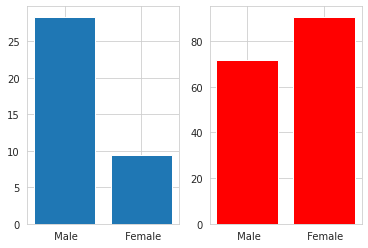

% of >50K income when Sex is  Male and Workclass is  State-gov = 35.27227722772277
% of >50K income when Sex is  Female and Workclass is  State-gov = 13.905930470347649


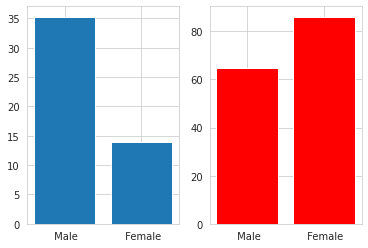

% of >50K income when Sex is  Male and Workclass is  Federal-gov = 48.837209302325576
% of >50K income when Sex is  Female and Workclass is  Federal-gov = 17.77777777777778


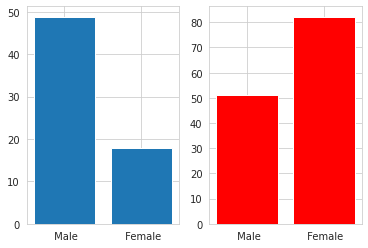

% of >50K income when Sex is  Male and Workclass is  Local-gov = 36.80445151033386
% of >50K income when Sex is  Female and Workclass is  Local-gov = 18.44311377245509


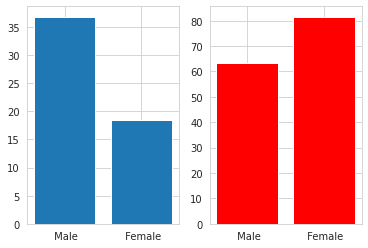

% of >50K income when Sex is  Male and Workclass is  ? = 13.941825476429287
% of >50K income when Sex is  Female and Workclass is  ? = 6.197854588796186


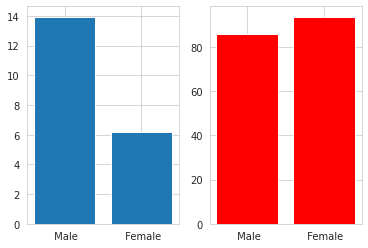

% of >50K income when Sex is  Male and Workclass is  Self-emp-inc = 59.22528032619776
% of >50K income when Sex is  Female and Workclass is  Self-emp-inc = 30.37037037037037


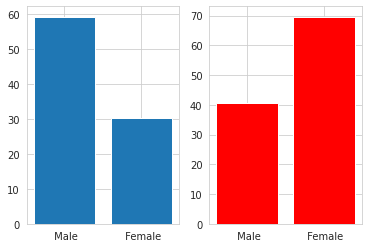

% of >50K income when Sex is  Female and Workclass is  Without-pay = 0.0
% of >50K income when Sex is  Male and Workclass is  Without-pay = 0.0


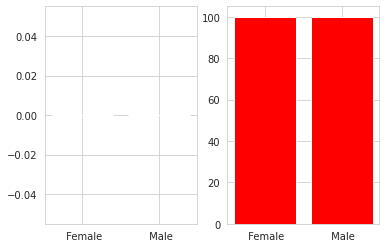

% of >50K income when Sex is  Male and Workclass is  Never-worked = 0.0
% of >50K income when Sex is  Female and Workclass is  Never-worked = 0.0


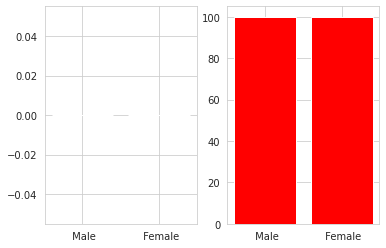

% of >50K income when Native_country is  United-States and Workclass is  Self-emp-not-inc = 28.491137051448334
% of >50K income when Native_country is  Canada and Workclass is  Self-emp-not-inc = 45.45454545454545
% of >50K income when Native_country is  Cambodia and Workclass is  Self-emp-not-inc = 100.0
% of >50K income when Native_country is  Portugal and Workclass is  Self-emp-not-inc = 0.0
% of >50K income when Native_country is  ? and Workclass is  Self-emp-not-inc = 23.809523809523807
% of >50K income when Native_country is  Italy and Workclass is  Self-emp-not-inc = 46.15384615384615
% of >50K income when Native_country is  China and Workclass is  Self-emp-not-inc = 80.0
% of >50K income when Native_country is  India and Workclass is  Self-emp-not-inc = 57.14285714285714
% of >50K income when Native_country is  Cuba and Workclass is  Self-emp-not-inc = 25.0
% of >50K income when Native_country is  El-Salvador and Workclass is  Self-emp-not-inc = 25.0
% of >50K income when Nativ

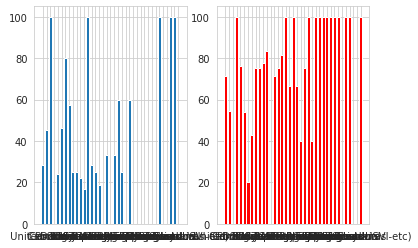

% of >50K income when Native_country is  United-States and Workclass is  Private = 22.55276881052893
% of >50K income when Native_country is  Cuba and Workclass is  Private = 21.73913043478261
% of >50K income when Native_country is  Jamaica and Workclass is  Private = 10.144927536231885
% of >50K income when Native_country is  ? and Workclass is  Private = 21.21951219512195
% of >50K income when Native_country is  Mexico and Workclass is  Private = 3.25497287522604
% of >50K income when Native_country is  Puerto-Rico and Workclass is  Private = 5.88235294117647
% of >50K income when Native_country is  Honduras and Workclass is  Private = 14.285714285714285
% of >50K income when Native_country is  England and Workclass is  Private = 30.158730158730158
% of >50K income when Native_country is  Germany and Workclass is  Private = 32.98969072164948
% of >50K income when Native_country is  Philippines and Workclass is  Private = 26.451612903225808
% of >50K income when Native_country is  Po

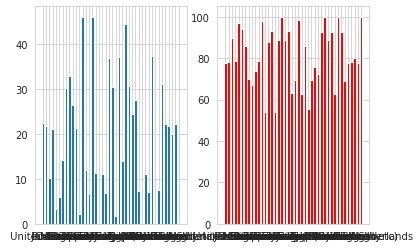

% of >50K income when Native_country is  India and Workclass is  State-gov = 41.66666666666667
% of >50K income when Native_country is  United-States and Workclass is  State-gov = 26.96443341604632
% of >50K income when Native_country is  ? and Workclass is  State-gov = 47.368421052631575
% of >50K income when Native_country is  Philippines and Workclass is  State-gov = 0.0
% of >50K income when Native_country is  Canada and Workclass is  State-gov = 33.33333333333333
% of >50K income when Native_country is  Nicaragua and Workclass is  State-gov = 0.0
% of >50K income when Native_country is  Germany and Workclass is  State-gov = 40.0
% of >50K income when Native_country is  Iran and Workclass is  State-gov = 100.0
% of >50K income when Native_country is  China and Workclass is  State-gov = 22.22222222222222
% of >50K income when Native_country is  Japan and Workclass is  State-gov = 0.0
% of >50K income when Native_country is  Taiwan and Workclass is  State-gov = 16.666666666666664
% o

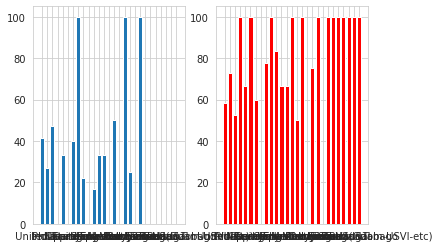

% of >50K income when Native_country is  United-States and Workclass is  Federal-gov = 37.92325056433409
% of >50K income when Native_country is  Iran and Workclass is  Federal-gov = 50.0
% of >50K income when Native_country is  Germany and Workclass is  Federal-gov = 80.0
% of >50K income when Native_country is  Philippines and Workclass is  Federal-gov = 66.66666666666666
% of >50K income when Native_country is  ? and Workclass is  Federal-gov = 35.294117647058826
% of >50K income when Native_country is  Puerto-Rico and Workclass is  Federal-gov = 25.0
% of >50K income when Native_country is  Columbia and Workclass is  Federal-gov = 0.0
% of >50K income when Native_country is  Guatemala and Workclass is  Federal-gov = 100.0
% of >50K income when Native_country is  England and Workclass is  Federal-gov = 50.0
% of >50K income when Native_country is  Cuba and Workclass is  Federal-gov = 50.0
% of >50K income when Native_country is  Japan and Workclass is  Federal-gov = 0.0
% of >50K in

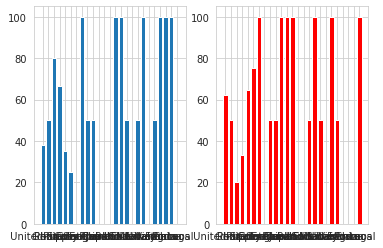

% of >50K income when Native_country is  United-States and Workclass is  Local-gov = 29.39672801635992
% of >50K income when Native_country is  Mexico and Workclass is  Local-gov = 22.22222222222222
% of >50K income when Native_country is  Poland and Workclass is  Local-gov = 33.33333333333333
% of >50K income when Native_country is  Honduras and Workclass is  Local-gov = 0.0
% of >50K income when Native_country is  Portugal and Workclass is  Local-gov = 0.0
% of >50K income when Native_country is  ? and Workclass is  Local-gov = 30.76923076923077
% of >50K income when Native_country is  Jamaica and Workclass is  Local-gov = 50.0
% of >50K income when Native_country is  Vietnam and Workclass is  Local-gov = 0.0
% of >50K income when Native_country is  El-Salvador and Workclass is  Local-gov = 0.0
% of >50K income when Native_country is  Taiwan and Workclass is  Local-gov = 50.0
% of >50K income when Native_country is  Guatemala and Workclass is  Local-gov = 33.33333333333333
% of >50K 

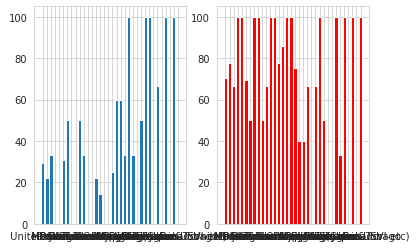

% of >50K income when Native_country is  South and Workclass is  ? = 22.22222222222222
% of >50K income when Native_country is  ? and Workclass is  ? = 14.814814814814813
% of >50K income when Native_country is  United-States and Workclass is  ? = 10.608800482218204
% of >50K income when Native_country is  Italy and Workclass is  ? = 20.0
% of >50K income when Native_country is  Canada and Workclass is  ? = 21.428571428571427
% of >50K income when Native_country is  China and Workclass is  ? = 0.0
% of >50K income when Native_country is  Jamaica and Workclass is  ? = 0.0
% of >50K income when Native_country is  Haiti and Workclass is  ? = 0.0
% of >50K income when Native_country is  Honduras and Workclass is  ? = 0.0
% of >50K income when Native_country is  Germany and Workclass is  ? = 0.0
% of >50K income when Native_country is  Philippines and Workclass is  ? = 10.0
% of >50K income when Native_country is  Mexico and Workclass is  ? = 0.0
% of >50K income when Native_country is  El-

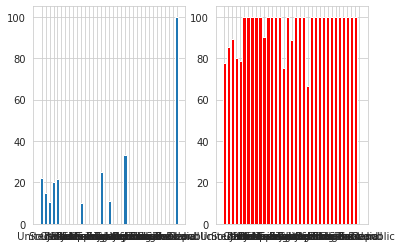

% of >50K income when Native_country is  United-States and Workclass is  Self-emp-inc = 56.30676084762866
% of >50K income when Native_country is  Thailand and Workclass is  Self-emp-inc = 33.33333333333333
% of >50K income when Native_country is  Cuba and Workclass is  Self-emp-inc = 66.66666666666666
% of >50K income when Native_country is  ? and Workclass is  Self-emp-inc = 52.38095238095239
% of >50K income when Native_country is  India and Workclass is  Self-emp-inc = 42.857142857142854
% of >50K income when Native_country is  Mexico and Workclass is  Self-emp-inc = 62.5
% of >50K income when Native_country is  Germany and Workclass is  Self-emp-inc = 33.33333333333333
% of >50K income when Native_country is  England and Workclass is  Self-emp-inc = 100.0
% of >50K income when Native_country is  Canada and Workclass is  Self-emp-inc = 50.0
% of >50K income when Native_country is  Greece and Workclass is  Self-emp-inc = 66.66666666666666
% of >50K income when Native_country is  Tai

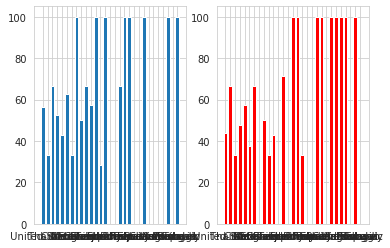

% of >50K income when Native_country is  United-States and Workclass is  Without-pay = 0.0
% of >50K income when Native_country is  Philippines and Workclass is  Without-pay = 0.0


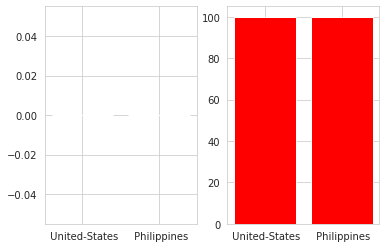

% of >50K income when Native_country is  United-States and Workclass is  Never-worked = 0.0


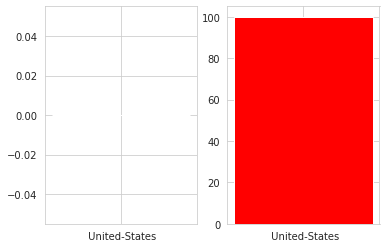

% of >50K income when age_cat is 4 and Workclass is  Self-emp-not-inc = 32.15339233038348
% of >50K income when age_cat is 5 and Workclass is  Self-emp-not-inc = 34.21052631578947
% of >50K income when age_cat is 2 and Workclass is  Self-emp-not-inc = 15.238095238095239
% of >50K income when age_cat is 3 and Workclass is  Self-emp-not-inc = 29.60235640648012
% of >50K income when age_cat is 6 and Workclass is  Self-emp-not-inc = 26.035502958579883
% of >50K income when age_cat is 1 and Workclass is  Self-emp-not-inc = 0.0


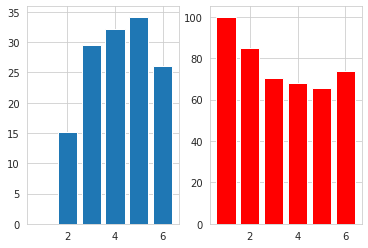

% of >50K income when age_cat is 3 and Workclass is  Private = 27.314888853350393
% of >50K income when age_cat is 5 and Workclass is  Private = 35.33386327503975
% of >50K income when age_cat is 2 and Workclass is  Private = 7.142857142857142
% of >50K income when age_cat is 4 and Workclass is  Private = 36.20269971232574
% of >50K income when age_cat is 1 and Workclass is  Private = 0.07980845969672785
% of >50K income when age_cat is 6 and Workclass is  Private = 20.821661998132587


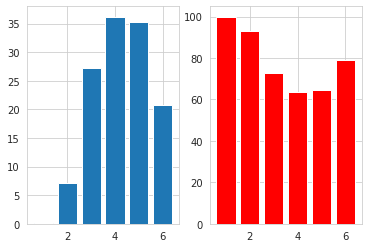

% of >50K income when age_cat is 2 and Workclass is  State-gov = 7.6190476190476195
% of >50K income when age_cat is 4 and Workclass is  State-gov = 40.92219020172911
% of >50K income when age_cat is 5 and Workclass is  State-gov = 43.01675977653631
% of >50K income when age_cat is 3 and Workclass is  State-gov = 24.362606232294617
% of >50K income when age_cat is 1 and Workclass is  State-gov = 0.0
% of >50K income when age_cat is 6 and Workclass is  State-gov = 33.80281690140845


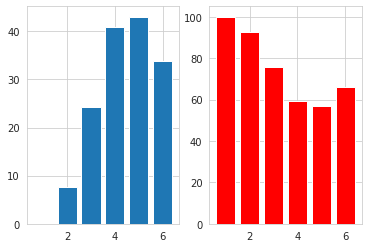

% of >50K income when age_cat is 3 and Workclass is  Federal-gov = 35.65891472868217
% of >50K income when age_cat is 2 and Workclass is  Federal-gov = 12.162162162162163
% of >50K income when age_cat is 5 and Workclass is  Federal-gov = 48.924731182795696
% of >50K income when age_cat is 4 and Workclass is  Federal-gov = 49.16943521594684
% of >50K income when age_cat is 6 and Workclass is  Federal-gov = 37.93103448275862
% of >50K income when age_cat is 1 and Workclass is  Federal-gov = 0.0


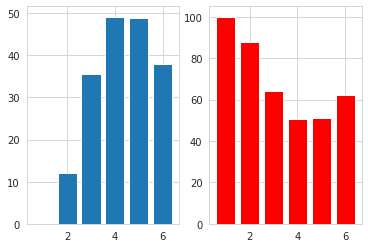

% of >50K income when age_cat is 5 and Workclass is  Local-gov = 35.96491228070175
% of >50K income when age_cat is 2 and Workclass is  Local-gov = 11.89873417721519
% of >50K income when age_cat is 3 and Workclass is  Local-gov = 30.185185185185187
% of >50K income when age_cat is 4 and Workclass is  Local-gov = 41.58730158730159
% of >50K income when age_cat is 6 and Workclass is  Local-gov = 14.56953642384106
% of >50K income when age_cat is 1 and Workclass is  Local-gov = 0.0


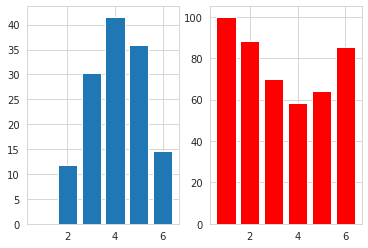

% of >50K income when age_cat is 5 and Workclass is  ? = 24.861878453038674
% of >50K income when age_cat is 3 and Workclass is  ? = 10.679611650485436
% of >50K income when age_cat is 2 and Workclass is  ? = 2.010968921389397
% of >50K income when age_cat is 6 and Workclass is  ? = 17.849898580121703
% of >50K income when age_cat is 1 and Workclass is  ? = 0.37174721189591076
% of >50K income when age_cat is 4 and Workclass is  ? = 17.142857142857142


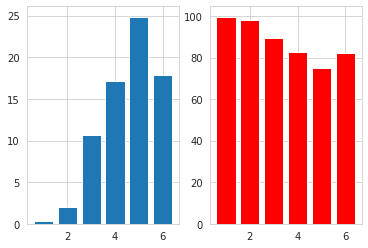

% of >50K income when age_cat is 4 and Workclass is  Self-emp-inc = 61.30790190735694
% of >50K income when age_cat is 3 and Workclass is  Self-emp-inc = 52.34375
% of >50K income when age_cat is 5 and Workclass is  Self-emp-inc = 66.8122270742358
% of >50K income when age_cat is 6 and Workclass is  Self-emp-inc = 58.74125874125874
% of >50K income when age_cat is 2 and Workclass is  Self-emp-inc = 24.761904761904763
% of >50K income when age_cat is 1 and Workclass is  Self-emp-inc = 0.0


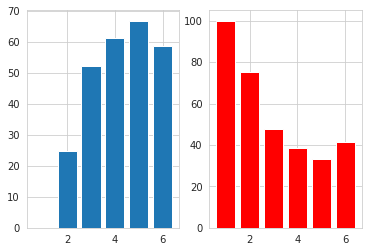

% of >50K income when age_cat is 6 and Workclass is  Without-pay = 0.0
% of >50K income when age_cat is 1 and Workclass is  Without-pay = 0.0
% of >50K income when age_cat is 2 and Workclass is  Without-pay = 0.0
% of >50K income when age_cat is 4 and Workclass is  Without-pay = 0.0
% of >50K income when age_cat is 5 and Workclass is  Without-pay = 0.0


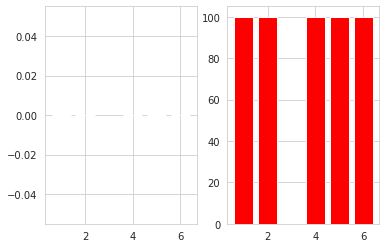

% of >50K income when age_cat is 1 and Workclass is  Never-worked = 0.0
% of >50K income when age_cat is 2 and Workclass is  Never-worked = 0.0


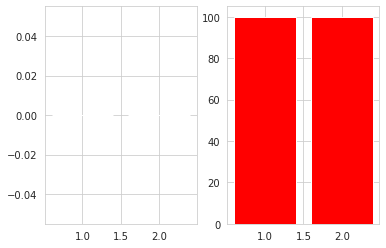

% of >50K income when Education is  Bachelors and Education_num is 13 = 41.48300336197236


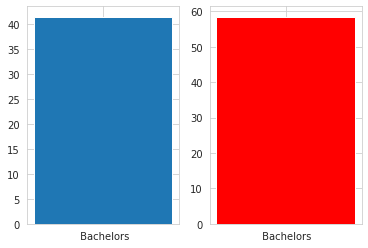

% of >50K income when Education is  HS-grad and Education_num is 9 = 15.950861822683555


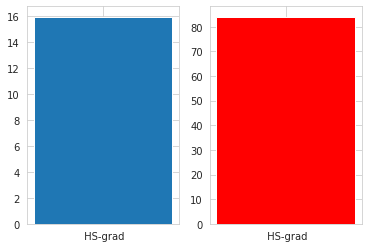

% of >50K income when Education is  11th and Education_num is 7 = 5.106382978723404


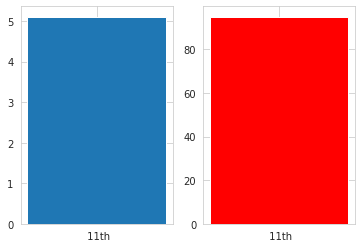

% of >50K income when Education is  Masters and Education_num is 14 = 55.65873476494486


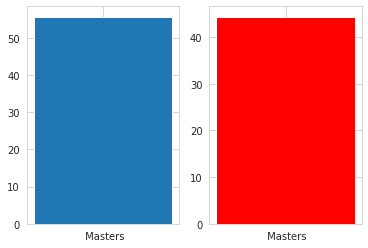

% of >50K income when Education is  9th and Education_num is 5 = 5.252918287937743


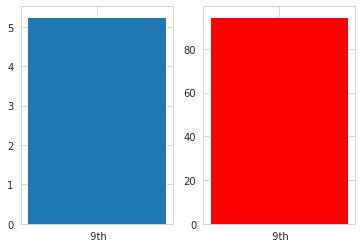

% of >50K income when Education is  Some-college and Education_num is 10 = 19.023453572898095


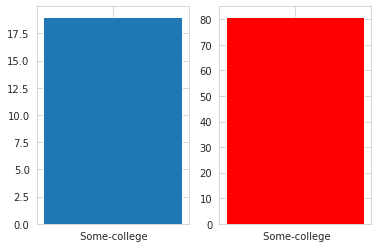

% of >50K income when Education is  Assoc-acdm and Education_num is 12 = 24.835988753514528


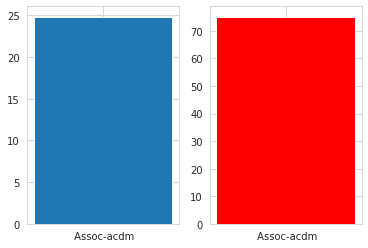

% of >50K income when Education is  Assoc-voc and Education_num is 11 = 26.121562952243128


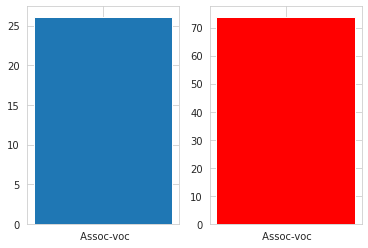

% of >50K income when Education is  7th-8th and Education_num is 4 = 6.191950464396285


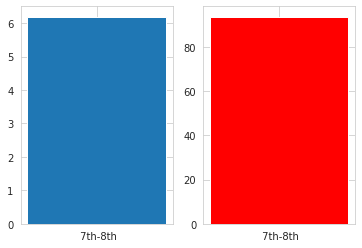

% of >50K income when Education is  Doctorate and Education_num is 16 = 74.09200968523002


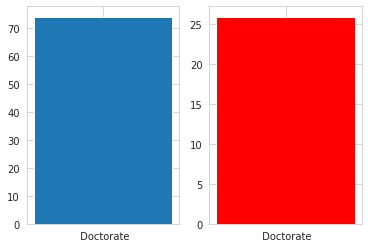

% of >50K income when Education is  Prof-school and Education_num is 15 = 73.4375


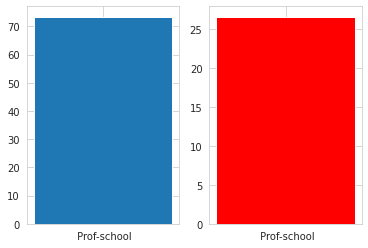

% of >50K income when Education is  5th-6th and Education_num is 3 = 4.804804804804805


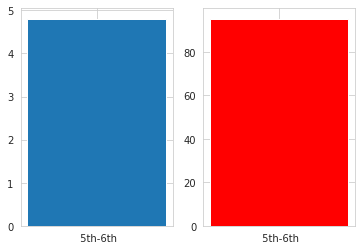

% of >50K income when Education is  10th and Education_num is 6 = 6.645230439442658


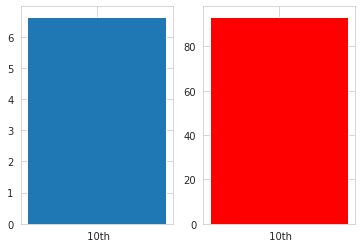

% of >50K income when Education is  1st-4th and Education_num is 2 = 3.571428571428571


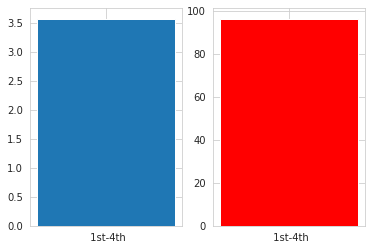

% of >50K income when Education is  Preschool and Education_num is 1 = 0.0


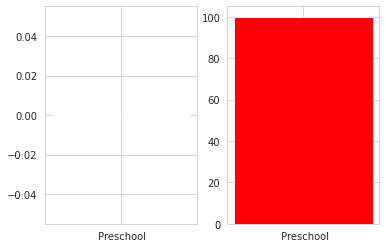

% of >50K income when Education is  12th and Education_num is 8 = 7.621247113163972


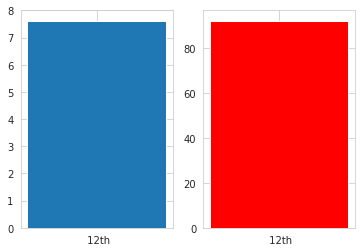

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 13 = 67.01589595375722
% of >50K income when Marital_status is  Never-married and Education_num is 13 = 10.144927536231885
% of >50K income when Marital_status is  Divorced and Education_num is 13 = 23.26007326007326
% of >50K income when Marital_status is  Separated and Education_num is 13 = 17.391304347826086
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 13 = 19.11764705882353
% of >50K income when Marital_status is  Widowed and Education_num is 13 = 29.268292682926827
% of >50K income when Marital_status is  Married-AF-spouse and Education_num is 13 = 100.0


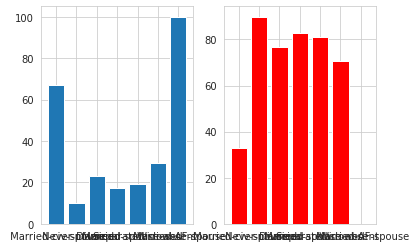

% of >50K income when Marital_status is  Divorced and Education_num is 9 = 5.083694978301303
% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 9 = 31.145510835913313
% of >50K income when Marital_status is  Never-married and Education_num is 9 = 1.4891550663645192
% of >50K income when Marital_status is  Separated and Education_num is 9 = 1.7241379310344827
% of >50K income when Marital_status is  Married-AF-spouse and Education_num is 9 = 23.076923076923077
% of >50K income when Marital_status is  Widowed and Education_num is 9 = 5.555555555555555
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 9 = 4.132231404958678


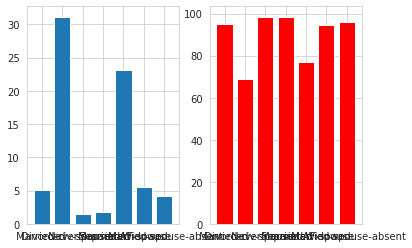

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 7 = 12.429378531073446
% of >50K income when Marital_status is  Never-married and Education_num is 7 = 1.023890784982935
% of >50K income when Marital_status is  Separated and Education_num is 7 = 0.0
% of >50K income when Marital_status is  Widowed and Education_num is 7 = 5.263157894736842
% of >50K income when Marital_status is  Divorced and Education_num is 7 = 6.153846153846154
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 7 = 0.0


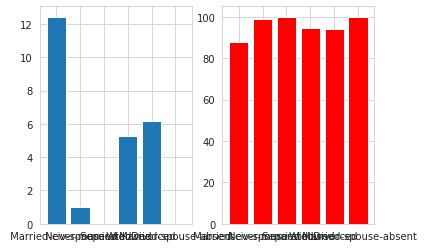

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 14 = 77.16849451645065
% of >50K income when Marital_status is  Never-married and Education_num is 14 = 21.03960396039604
% of >50K income when Marital_status is  Divorced and Education_num is 14 = 32.18884120171674
% of >50K income when Marital_status is  Widowed and Education_num is 14 = 21.951219512195124
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 14 = 29.411764705882355
% of >50K income when Marital_status is  Separated and Education_num is 14 = 44.0


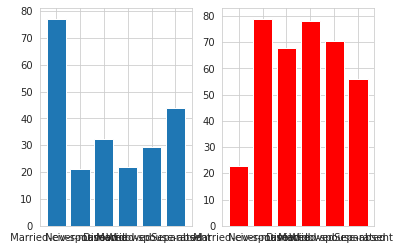

% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 5 = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 5 = 8.695652173913043
% of >50K income when Marital_status is  Never-married and Education_num is 5 = 1.2903225806451613
% of >50K income when Marital_status is  Widowed and Education_num is 5 = 8.695652173913043
% of >50K income when Marital_status is  Divorced and Education_num is 5 = 4.6875
% of >50K income when Marital_status is  Separated and Education_num is 5 = 0.0


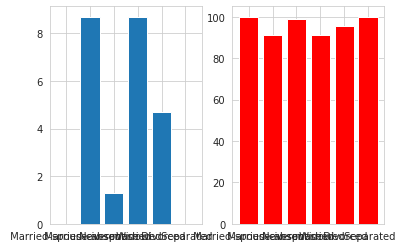

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 10 = 43.39957416607523
% of >50K income when Marital_status is  Never-married and Education_num is 10 = 1.8070235254006135
% of >50K income when Marital_status is  Divorced and Education_num is 10 = 7.015902712815715
% of >50K income when Marital_status is  Separated and Education_num is 10 = 7.2727272727272725
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 10 = 7.894736842105263
% of >50K income when Marital_status is  Widowed and Education_num is 10 = 6.976744186046512
% of >50K income when Marital_status is  Married-AF-spouse and Education_num is 10 = 66.66666666666666


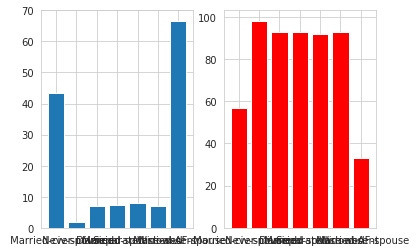

% of >50K income when Marital_status is  Never-married and Education_num is 12 = 5.044510385756676
% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 12 = 49.130434782608695
% of >50K income when Marital_status is  Divorced and Education_num is 12 = 7.8817733990147785
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 12 = 0.0
% of >50K income when Marital_status is  Separated and Education_num is 12 = 10.0
% of >50K income when Marital_status is  Married-AF-spouse and Education_num is 12 = 0.0
% of >50K income when Marital_status is  Widowed and Education_num is 12 = 13.043478260869565


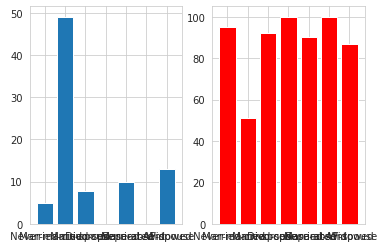

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 11 = 45.86357039187228
% of >50K income when Marital_status is  Never-married and Education_num is 11 = 4.143646408839778
% of >50K income when Marital_status is  Widowed and Education_num is 11 = 7.317073170731707
% of >50K income when Marital_status is  Divorced and Education_num is 11 = 10.256410256410255
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 11 = 0.0
% of >50K income when Marital_status is  Separated and Education_num is 11 = 4.761904761904762
% of >50K income when Marital_status is  Married-AF-spouse and Education_num is 11 = 100.0


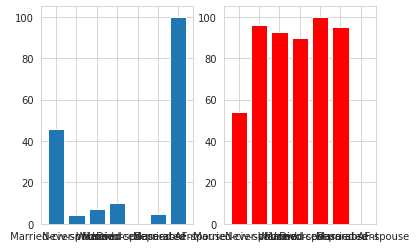

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 4 = 9.749303621169917
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 4 = 7.142857142857142
% of >50K income when Marital_status is  Divorced and Education_num is 4 = 0.0
% of >50K income when Marital_status is  Separated and Education_num is 4 = 0.0
% of >50K income when Marital_status is  Never-married and Education_num is 4 = 2.6548672566371683
% of >50K income when Marital_status is  Widowed and Education_num is 4 = 1.5625


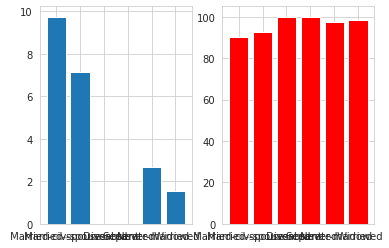

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 16 = 83.56643356643356
% of >50K income when Marital_status is  Never-married and Education_num is 16 = 47.94520547945205
% of >50K income when Marital_status is  Separated and Education_num is 16 = 57.14285714285714
% of >50K income when Marital_status is  Divorced and Education_num is 16 = 66.66666666666666
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 16 = 42.857142857142854
% of >50K income when Marital_status is  Widowed and Education_num is 16 = 42.857142857142854


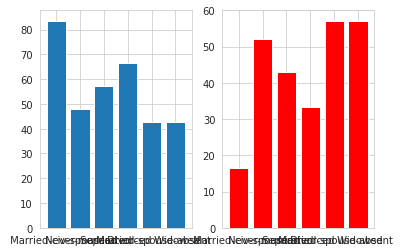

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 15 = 83.98058252427184
% of >50K income when Marital_status is  Never-married and Education_num is 15 = 45.16129032258064
% of >50K income when Marital_status is  Divorced and Education_num is 15 = 49.09090909090909
% of >50K income when Marital_status is  Widowed and Education_num is 15 = 20.0
% of >50K income when Marital_status is  Separated and Education_num is 15 = 75.0
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 15 = 33.33333333333333


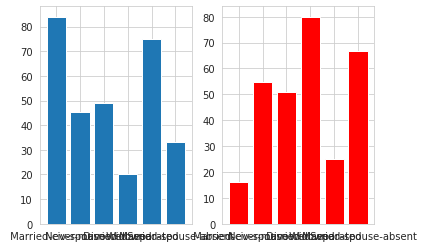

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 3 = 8.720930232558139
% of >50K income when Marital_status is  Never-married and Education_num is 3 = 1.1235955056179776
% of >50K income when Marital_status is  Divorced and Education_num is 3 = 0.0
% of >50K income when Marital_status is  Widowed and Education_num is 3 = 0.0
% of >50K income when Marital_status is  Separated and Education_num is 3 = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 3 = 0.0


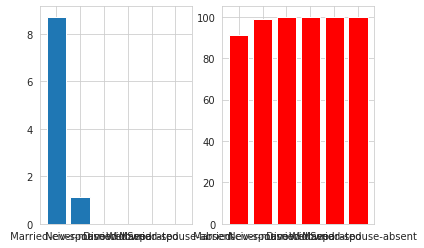

% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 6 = 15.759312320916905
% of >50K income when Marital_status is  Never-married and Education_num is 6 = 0.8310249307479225
% of >50K income when Marital_status is  Divorced and Education_num is 6 = 1.6666666666666667
% of >50K income when Marital_status is  Widowed and Education_num is 6 = 2.564102564102564
% of >50K income when Marital_status is  Separated and Education_num is 6 = 2.0408163265306123
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 6 = 0.0


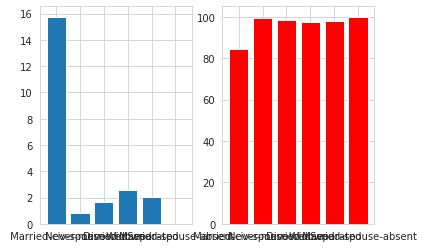

% of >50K income when Marital_status is  Divorced and Education_num is 2 = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 2 = 7.4074074074074066
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 2 = 0.0
% of >50K income when Marital_status is  Widowed and Education_num is 2 = 0.0
% of >50K income when Marital_status is  Never-married and Education_num is 2 = 0.0
% of >50K income when Marital_status is  Separated and Education_num is 2 = 0.0


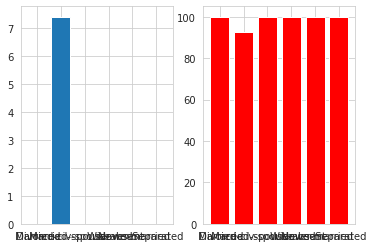

% of >50K income when Marital_status is  Never-married and Education_num is 1 = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 1 = 0.0
% of >50K income when Marital_status is  Widowed and Education_num is 1 = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 1 = 0.0
% of >50K income when Marital_status is  Separated and Education_num is 1 = 0.0
% of >50K income when Marital_status is  Divorced and Education_num is 1 = 0.0


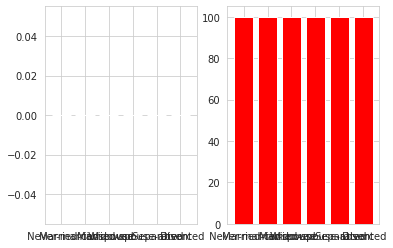

% of >50K income when Marital_status is  Divorced and Education_num is 8 = 5.128205128205128
% of >50K income when Marital_status is  Never-married and Education_num is 8 = 0.43103448275862066
% of >50K income when Marital_status is  Married-civ-spouse and Education_num is 8 = 22.30769230769231
% of >50K income when Marital_status is  Separated and Education_num is 8 = 0.0
% of >50K income when Marital_status is  Widowed and Education_num is 8 = 10.0
% of >50K income when Marital_status is  Married-spouse-absent and Education_num is 8 = 0.0


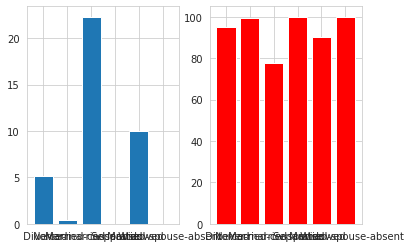

% of >50K income when Occupation is  Exec-managerial and Education_num is 13 = 56.90284879474069
% of >50K income when Occupation is  Prof-specialty and Education_num is 13 = 38.72909698996656
% of >50K income when Occupation is  Adm-clerical and Education_num is 13 = 23.564356435643564
% of >50K income when Occupation is  Tech-support and Education_num is 13 = 33.91304347826087
% of >50K income when Occupation is  Sales and Education_num is 13 = 47.21878862793572
% of >50K income when Occupation is  Other-service and Education_num is 13 = 16.022099447513813
% of >50K income when Occupation is  Protective-serv and Education_num is 13 = 56.00000000000001
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 13 = 22.0
% of >50K income when Occupation is  Craft-repair and Education_num is 13 = 38.93805309734513
% of >50K income when Occupation is  ? and Education_num is 13 = 26.011560693641616
% of >50K income when Occupation is  Transport-moving and Education_num is

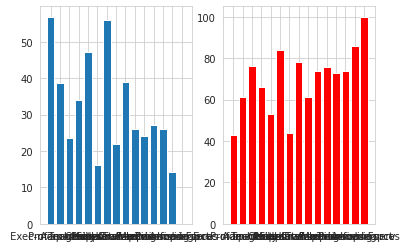

% of >50K income when Occupation is  Handlers-cleaners and Education_num is 9 = 6.219312602291326
% of >50K income when Occupation is  Exec-managerial and Education_num is 9 = 32.342007434944236
% of >50K income when Occupation is  Farming-fishing and Education_num is 9 = 11.633663366336634
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 9 = 13.685239491691103
% of >50K income when Occupation is  Other-service and Education_num is 9 = 4.137392661982826
% of >50K income when Occupation is  Tech-support and Education_num is 9 = 29.559748427672954
% of >50K income when Occupation is  Craft-repair and Education_num is 9 = 21.071800208116546
% of >50K income when Occupation is  Adm-clerical and Education_num is 9 = 11.941391941391942
% of >50K income when Occupation is  Transport-moving and Education_num is 9 = 20.363636363636363
% of >50K income when Occupation is  Sales and Education_num is 9 = 18.709073900841908
% of >50K income when Occupation is  Protective-

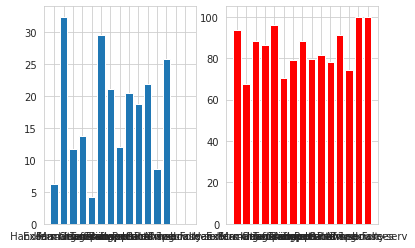

% of >50K income when Occupation is  Handlers-cleaners and Education_num is 7 = 4.0650406504065035
% of >50K income when Occupation is  Sales and Education_num is 7 = 3.4722222222222223
% of >50K income when Occupation is  Transport-moving and Education_num is 7 = 7.608695652173914
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 7 = 3.0303030303030303
% of >50K income when Occupation is  Other-service and Education_num is 7 = 2.5210084033613445
% of >50K income when Occupation is  Craft-repair and Education_num is 7 = 10.285714285714285
% of >50K income when Occupation is  Exec-managerial and Education_num is 7 = 20.588235294117645
% of >50K income when Occupation is  ? and Education_num is 7 = 0.0
% of >50K income when Occupation is  Adm-clerical and Education_num is 7 = 4.477611940298507
% of >50K income when Occupation is  Farming-fishing and Education_num is 7 = 5.405405405405405
% of >50K income when Occupation is  Prof-specialty and Education_num is 7 

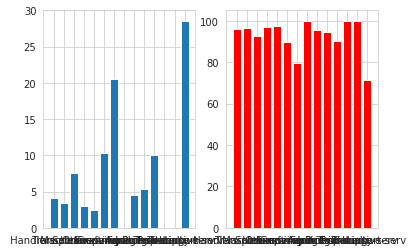

% of >50K income when Occupation is  Exec-managerial and Education_num is 14 = 74.25149700598801
% of >50K income when Occupation is  Prof-specialty and Education_num is 14 = 49.644549763033176
% of >50K income when Occupation is  Sales and Education_num is 14 = 59.70149253731343
% of >50K income when Occupation is  Protective-serv and Education_num is 14 = 46.666666666666664
% of >50K income when Occupation is  Farming-fishing and Education_num is 14 = 30.0
% of >50K income when Occupation is  ? and Education_num is 14 = 37.5
% of >50K income when Occupation is  Craft-repair and Education_num is 14 = 45.45454545454545
% of >50K income when Occupation is  Tech-support and Education_num is 14 = 54.054054054054056
% of >50K income when Occupation is  Transport-moving and Education_num is 14 = 40.0
% of >50K income when Occupation is  Other-service and Education_num is 14 = 5.263157894736842
% of >50K income when Occupation is  Adm-clerical and Education_num is 14 = 33.82352941176471
% of

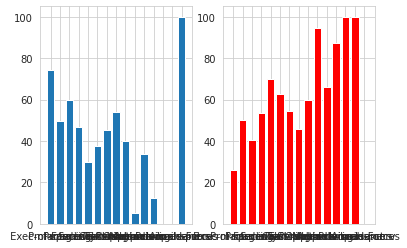

% of >50K income when Occupation is  Other-service and Education_num is 5 = 1.9801980198019802
% of >50K income when Occupation is  Farming-fishing and Education_num is 5 = 3.571428571428571
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 5 = 3.9473684210526314
% of >50K income when Occupation is  Sales and Education_num is 5 = 12.5
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 5 = 6.122448979591836
% of >50K income when Occupation is  Craft-repair and Education_num is 5 = 7.291666666666667
% of >50K income when Occupation is  Priv-house-serv and Education_num is 5 = 0.0
% of >50K income when Occupation is  ? and Education_num is 5 = 1.9607843137254901
% of >50K income when Occupation is  Exec-managerial and Education_num is 5 = 15.384615384615385
% of >50K income when Occupation is  Tech-support and Education_num is 5 = 0.0
% of >50K income when Occupation is  Transport-moving and Education_num is 5 = 8.571428571428571
% of >50

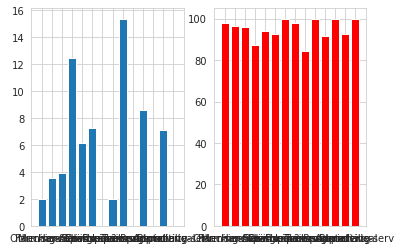

% of >50K income when Occupation is  Exec-managerial and Education_num is 10 = 35.49488054607509
% of >50K income when Occupation is  ? and Education_num is 10 = 6.782945736434108
% of >50K income when Occupation is  Sales and Education_num is 10 = 21.209117938553025
% of >50K income when Occupation is  Adm-clerical and Education_num is 10 = 11.085089773614364
% of >50K income when Occupation is  Other-service and Education_num is 10 = 3.329065300896287
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 10 = 14.193548387096774
% of >50K income when Occupation is  Tech-support and Education_num is 10 = 27.472527472527474
% of >50K income when Occupation is  Prof-specialty and Education_num is 10 = 27.209302325581397
% of >50K income when Occupation is  Craft-repair and Education_num is 10 = 27.764976958525345
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 10 = 7.116104868913857
% of >50K income when Occupation is  Transport-moving an

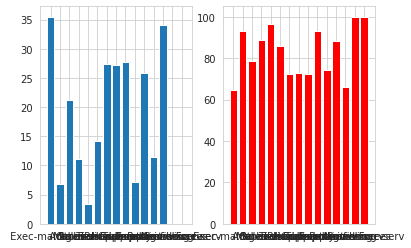

% of >50K income when Occupation is  Sales and Education_num is 12 = 27.083333333333332
% of >50K income when Occupation is  Protective-serv and Education_num is 12 = 35.294117647058826
% of >50K income when Occupation is  Prof-specialty and Education_num is 12 = 26.811594202898554
% of >50K income when Occupation is  Adm-clerical and Education_num is 12 = 15.544041450777202
% of >50K income when Occupation is  Exec-managerial and Education_num is 12 = 45.51724137931035
% of >50K income when Occupation is  Tech-support and Education_num is 12 = 27.397260273972602
% of >50K income when Occupation is  Other-service and Education_num is 12 = 7.6923076923076925
% of >50K income when Occupation is  Craft-repair and Education_num is 12 = 27.82608695652174
% of >50K income when Occupation is  Farming-fishing and Education_num is 12 = 21.428571428571427
% of >50K income when Occupation is  ? and Education_num is 12 = 12.76595744680851
% of >50K income when Occupation is  Handlers-cleaners and 

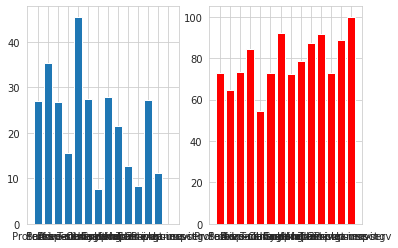

% of >50K income when Occupation is  Craft-repair and Education_num is 11 = 32.142857142857146
% of >50K income when Occupation is  Prof-specialty and Education_num is 11 = 34.705882352941174
% of >50K income when Occupation is  Other-service and Education_num is 11 = 7.82608695652174
% of >50K income when Occupation is  Adm-clerical and Education_num is 11 = 10.778443113772456
% of >50K income when Occupation is  Exec-managerial and Education_num is 11 = 42.66666666666667
% of >50K income when Occupation is  ? and Education_num is 11 = 21.311475409836063
% of >50K income when Occupation is  Tech-support and Education_num is 11 = 29.365079365079367
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 11 = 22.22222222222222
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 11 = 7.142857142857142
% of >50K income when Occupation is  Transport-moving and Education_num is 11 = 27.500000000000004
% of >50K income when Occupation is  Sales and

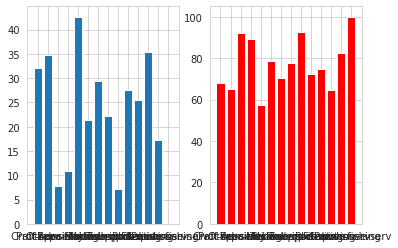

% of >50K income when Occupation is  Transport-moving and Education_num is 4 = 11.666666666666666
% of >50K income when Occupation is  ? and Education_num is 4 = 2.73972602739726
% of >50K income when Occupation is  Farming-fishing and Education_num is 4 = 7.142857142857142
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 4 = 6.451612903225806
% of >50K income when Occupation is  Craft-repair and Education_num is 4 = 6.896551724137931
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 4 = 0.0
% of >50K income when Occupation is  Other-service and Education_num is 4 = 1.0204081632653061
% of >50K income when Occupation is  Protective-serv and Education_num is 4 = 0.0
% of >50K income when Occupation is  Sales and Education_num is 4 = 13.793103448275861
% of >50K income when Occupation is  Exec-managerial and Education_num is 4 = 31.57894736842105
% of >50K income when Occupation is  Prof-specialty and Education_num is 4 = 0.0
% of >50K

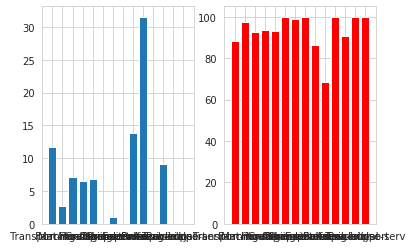

% of >50K income when Occupation is  Prof-specialty and Education_num is 16 = 72.58566978193146
% of >50K income when Occupation is  Exec-managerial and Education_num is 16 = 90.9090909090909
% of >50K income when Occupation is  ? and Education_num is 16 = 73.33333333333333
% of >50K income when Occupation is  Adm-clerical and Education_num is 16 = 40.0
% of >50K income when Occupation is  Sales and Education_num is 16 = 62.5
% of >50K income when Occupation is  Tech-support and Education_num is 16 = 33.33333333333333
% of >50K income when Occupation is  Craft-repair and Education_num is 16 = 50.0
% of >50K income when Occupation is  Other-service and Education_num is 16 = 100.0
% of >50K income when Occupation is  Farming-fishing and Education_num is 16 = 100.0
% of >50K income when Occupation is  Transport-moving and Education_num is 16 = 0.0
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 16 = 100.0


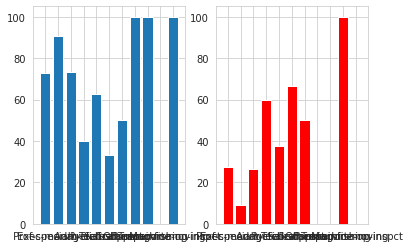

% of >50K income when Occupation is  Prof-specialty and Education_num is 15 = 76.99115044247787
% of >50K income when Occupation is  Farming-fishing and Education_num is 15 = 25.0
% of >50K income when Occupation is  Transport-moving and Education_num is 15 = 100.0
% of >50K income when Occupation is  Exec-managerial and Education_num is 15 = 73.07692307692307
% of >50K income when Occupation is  Sales and Education_num is 15 = 61.111111111111114
% of >50K income when Occupation is  Adm-clerical and Education_num is 15 = 44.44444444444444
% of >50K income when Occupation is  Craft-repair and Education_num is 15 = 71.42857142857143
% of >50K income when Occupation is  Tech-support and Education_num is 15 = 42.857142857142854
% of >50K income when Occupation is  Protective-serv and Education_num is 15 = 100.0
% of >50K income when Occupation is  ? and Education_num is 15 = 44.44444444444444
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 15 = 0.0
% of >50K inc

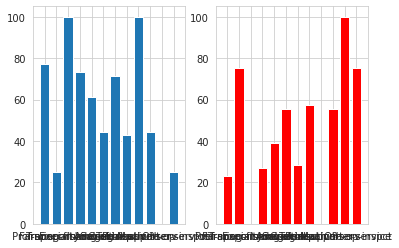

% of >50K income when Occupation is  Machine-op-inspct and Education_num is 3 = 5.357142857142857
% of >50K income when Occupation is  Transport-moving and Education_num is 3 = 7.142857142857142
% of >50K income when Occupation is  Other-service and Education_num is 3 = 0.0
% of >50K income when Occupation is  Craft-repair and Education_num is 3 = 6.976744186046512
% of >50K income when Occupation is  ? and Education_num is 3 = 6.666666666666667
% of >50K income when Occupation is  Farming-fishing and Education_num is 3 = 0.0
% of >50K income when Occupation is  Adm-clerical and Education_num is 3 = 0.0
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 3 = 5.0
% of >50K income when Occupation is  Priv-house-serv and Education_num is 3 = 0.0
% of >50K income when Occupation is  Sales and Education_num is 3 = 25.0
% of >50K income when Occupation is  Exec-managerial and Education_num is 3 = 100.0
% of >50K income when Occupation is  Protective-serv and Education

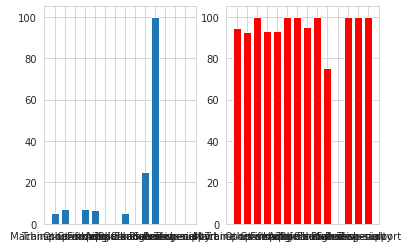

% of >50K income when Occupation is  ? and Education_num is 6 = 1.9607843137254901
% of >50K income when Occupation is  Craft-repair and Education_num is 6 = 11.176470588235295
% of >50K income when Occupation is  Other-service and Education_num is 6 = 0.5154639175257731
% of >50K income when Occupation is  Adm-clerical and Education_num is 6 = 0.0
% of >50K income when Occupation is  Farming-fishing and Education_num is 6 = 2.272727272727273
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 6 = 2.8169014084507045
% of >50K income when Occupation is  Transport-moving and Education_num is 6 = 20.238095238095237
% of >50K income when Occupation is  Exec-managerial and Education_num is 6 = 25.0
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 6 = 5.9405940594059405
% of >50K income when Occupation is  Sales and Education_num is 6 = 4.938271604938271
% of >50K income when Occupation is  Protective-serv and Education_num is 6 = 0.0
% of >

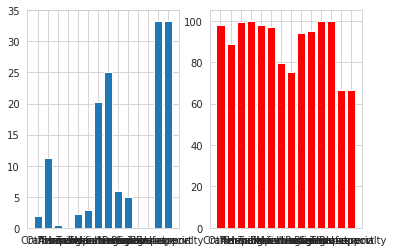

% of >50K income when Occupation is  ? and Education_num is 2 = 0.0
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 2 = 4.3478260869565215
% of >50K income when Occupation is  Craft-repair and Education_num is 2 = 8.695652173913043
% of >50K income when Occupation is  Priv-house-serv and Education_num is 2 = 0.0
% of >50K income when Occupation is  Other-service and Education_num is 2 = 0.0
% of >50K income when Occupation is  Sales and Education_num is 2 = 0.0
% of >50K income when Occupation is  Exec-managerial and Education_num is 2 = 50.0
% of >50K income when Occupation is  Transport-moving and Education_num is 2 = 0.0
% of >50K income when Occupation is  Farming-fishing and Education_num is 2 = 5.555555555555555
% of >50K income when Occupation is  Prof-specialty and Education_num is 2 = 0.0
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 2 = 0.0
% of >50K income when Occupation is  Protective-serv and Education_num is 2 = 0

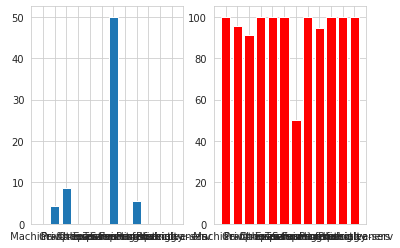

% of >50K income when Occupation is  Machine-op-inspct and Education_num is 1 = 0.0
% of >50K income when Occupation is  Other-service and Education_num is 1 = 0.0
% of >50K income when Occupation is  Craft-repair and Education_num is 1 = 0.0
% of >50K income when Occupation is  Farming-fishing and Education_num is 1 = 0.0
% of >50K income when Occupation is  ? and Education_num is 1 = 0.0
% of >50K income when Occupation is  Priv-house-serv and Education_num is 1 = 0.0
% of >50K income when Occupation is  Prof-specialty and Education_num is 1 = 0.0
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 1 = 0.0
% of >50K income when Occupation is  Adm-clerical and Education_num is 1 = 0.0


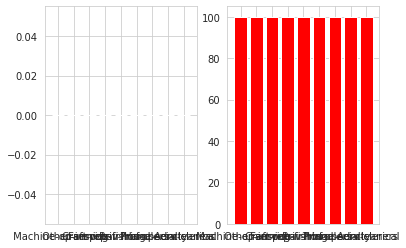

% of >50K income when Occupation is  Craft-repair and Education_num is 8 = 15.517241379310345
% of >50K income when Occupation is  ? and Education_num is 8 = 5.0
% of >50K income when Occupation is  Tech-support and Education_num is 8 = 33.33333333333333
% of >50K income when Occupation is  Handlers-cleaners and Education_num is 8 = 5.263157894736842
% of >50K income when Occupation is  Other-service and Education_num is 8 = 1.1764705882352942
% of >50K income when Occupation is  Machine-op-inspct and Education_num is 8 = 2.857142857142857
% of >50K income when Occupation is  Transport-moving and Education_num is 8 = 17.94871794871795
% of >50K income when Occupation is  Sales and Education_num is 8 = 10.638297872340425
% of >50K income when Occupation is  Adm-clerical and Education_num is 8 = 2.631578947368421
% of >50K income when Occupation is  Protective-serv and Education_num is 8 = 0.0
% of >50K income when Occupation is  Prof-specialty and Education_num is 8 = 20.0
% of >50K inc

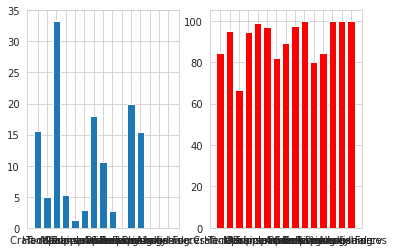

% of >50K income when Relationship is  Husband and Education_num is 13 = 67.6531031648171
% of >50K income when Relationship is  Wife and Education_num is 13 = 67.21311475409836
% of >50K income when Relationship is  Own-child and Education_num is 13 = 4.588910133843212
% of >50K income when Relationship is  Not-in-family and Education_num is 13 = 16.887019230769234
% of >50K income when Relationship is  Other-relative and Education_num is 13 = 6.896551724137931
% of >50K income when Relationship is  Unmarried and Education_num is 13 = 17.251461988304094


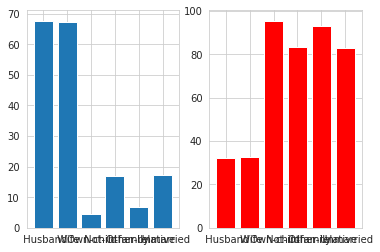

% of >50K income when Relationship is  Not-in-family and Education_num is 9 = 4.529201430274136
% of >50K income when Relationship is  Husband and Education_num is 9 = 31.175508296330918
% of >50K income when Relationship is  Own-child and Education_num is 9 = 0.7978723404255319
% of >50K income when Relationship is  Unmarried and Education_num is 9 = 2.667682926829268
% of >50K income when Relationship is  Wife and Education_num is 9 = 34.33734939759036
% of >50K income when Relationship is  Other-relative and Education_num is 9 = 2.3017902813299234


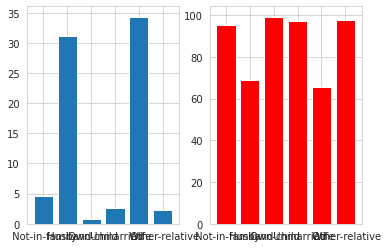

% of >50K income when Relationship is  Husband and Education_num is 7 = 12.861736334405144
% of >50K income when Relationship is  Unmarried and Education_num is 7 = 3.6231884057971016
% of >50K income when Relationship is  Own-child and Education_num is 7 = 0.4694835680751174
% of >50K income when Relationship is  Not-in-family and Education_num is 7 = 4.265402843601896
% of >50K income when Relationship is  Other-relative and Education_num is 7 = 1.694915254237288
% of >50K income when Relationship is  Wife and Education_num is 7 = 10.0


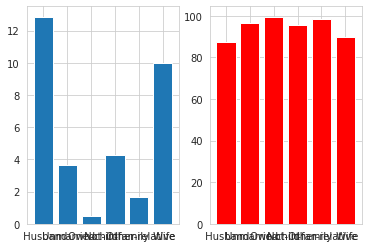

% of >50K income when Relationship is  Wife and Education_num is 14 = 81.25
% of >50K income when Relationship is  Not-in-family and Education_num is 14 = 27.852998065764023
% of >50K income when Relationship is  Unmarried and Education_num is 14 = 26.24113475177305
% of >50K income when Relationship is  Husband and Education_num is 14 = 76.74943566591422
% of >50K income when Relationship is  Other-relative and Education_num is 14 = 27.27272727272727
% of >50K income when Relationship is  Own-child and Education_num is 14 = 7.142857142857142


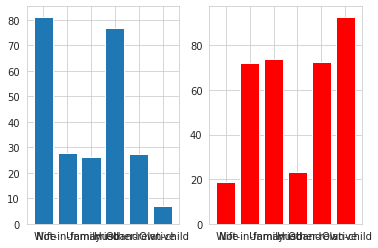

% of >50K income when Relationship is  Not-in-family and Education_num is 5 = 3.6036036036036037
% of >50K income when Relationship is  Husband and Education_num is 5 = 7.920792079207921
% of >50K income when Relationship is  Own-child and Education_num is 5 = 1.25
% of >50K income when Relationship is  Other-relative and Education_num is 5 = 0.0
% of >50K income when Relationship is  Unmarried and Education_num is 5 = 4.285714285714286
% of >50K income when Relationship is  Wife and Education_num is 5 = 14.285714285714285


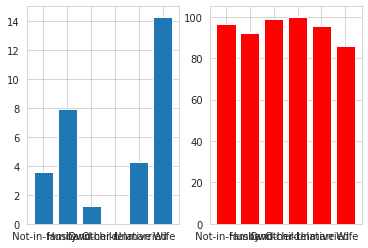

% of >50K income when Relationship is  Husband and Education_num is 10 = 43.49232012934519
% of >50K income when Relationship is  Own-child and Education_num is 10 = 0.8695652173913043
% of >50K income when Relationship is  Wife and Education_num is 10 = 44.66019417475729
% of >50K income when Relationship is  Not-in-family and Education_num is 10 = 6.566499721758487
% of >50K income when Relationship is  Other-relative and Education_num is 10 = 5.0761421319796955
% of >50K income when Relationship is  Unmarried and Education_num is 10 = 3.802281368821293


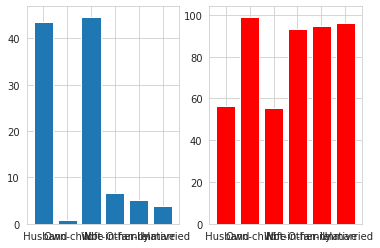

% of >50K income when Relationship is  Not-in-family and Education_num is 12 = 9.06344410876133
% of >50K income when Relationship is  Husband and Education_num is 12 = 48.68421052631579
% of >50K income when Relationship is  Unmarried and Education_num is 12 = 7.462686567164178
% of >50K income when Relationship is  Wife and Education_num is 12 = 51.31578947368421
% of >50K income when Relationship is  Own-child and Education_num is 12 = 0.0
% of >50K income when Relationship is  Other-relative and Education_num is 12 = 6.666666666666667


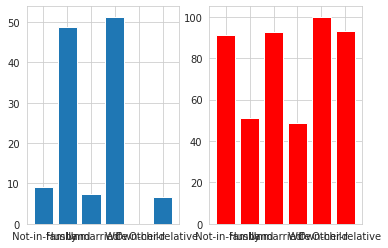

% of >50K income when Relationship is  Husband and Education_num is 11 = 44.46308724832215
% of >50K income when Relationship is  Not-in-family and Education_num is 11 = 8.547008547008547
% of >50K income when Relationship is  Wife and Education_num is 11 = 57.831325301204814
% of >50K income when Relationship is  Own-child and Education_num is 11 = 2.7777777777777777
% of >50K income when Relationship is  Unmarried and Education_num is 11 = 5.978260869565218
% of >50K income when Relationship is  Other-relative and Education_num is 11 = 12.5


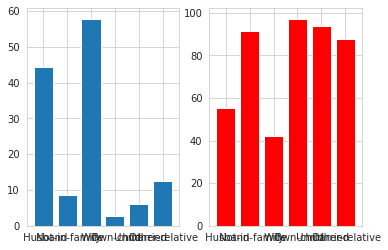

% of >50K income when Relationship is  Husband and Education_num is 4 = 10.21021021021021
% of >50K income when Relationship is  Not-in-family and Education_num is 4 = 3.6231884057971016
% of >50K income when Relationship is  Unmarried and Education_num is 4 = 0.0
% of >50K income when Relationship is  Other-relative and Education_num is 4 = 0.0
% of >50K income when Relationship is  Own-child and Education_num is 4 = 0.0
% of >50K income when Relationship is  Wife and Education_num is 4 = 5.0


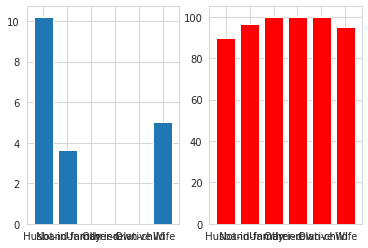

% of >50K income when Relationship is  Husband and Education_num is 16 = 83.77358490566039
% of >50K income when Relationship is  Not-in-family and Education_num is 16 = 53.125
% of >50K income when Relationship is  Own-child and Education_num is 16 = 14.285714285714285
% of >50K income when Relationship is  Unmarried and Education_num is 16 = 59.09090909090909
% of >50K income when Relationship is  Wife and Education_num is 16 = 85.0
% of >50K income when Relationship is  Other-relative and Education_num is 16 = 66.66666666666666


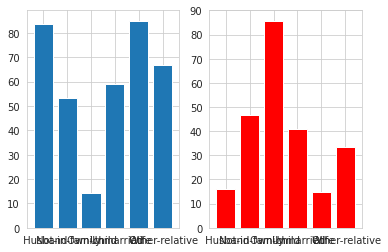

% of >50K income when Relationship is  Wife and Education_num is 15 = 84.61538461538461
% of >50K income when Relationship is  Husband and Education_num is 15 = 84.15584415584415
% of >50K income when Relationship is  Not-in-family and Education_num is 15 = 52.03252032520326
% of >50K income when Relationship is  Unmarried and Education_num is 15 = 45.83333333333333
% of >50K income when Relationship is  Own-child and Education_num is 15 = 14.285714285714285
% of >50K income when Relationship is  Other-relative and Education_num is 15 = 0.0


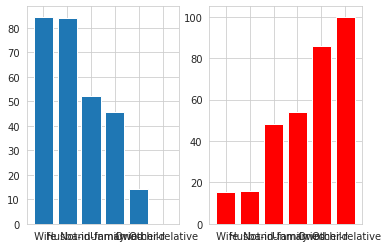

% of >50K income when Relationship is  Husband and Education_num is 3 = 8.724832214765101
% of >50K income when Relationship is  Other-relative and Education_num is 3 = 2.5
% of >50K income when Relationship is  Not-in-family and Education_num is 3 = 0.0
% of >50K income when Relationship is  Own-child and Education_num is 3 = 0.0
% of >50K income when Relationship is  Unmarried and Education_num is 3 = 0.0
% of >50K income when Relationship is  Wife and Education_num is 3 = 14.285714285714285


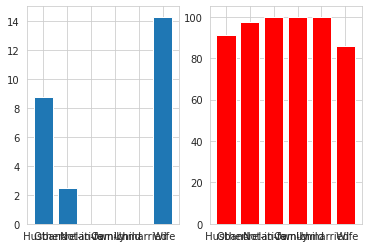

% of >50K income when Relationship is  Husband and Education_num is 6 = 16.61341853035144
% of >50K income when Relationship is  Own-child and Education_num is 6 = 0.8888888888888888
% of >50K income when Relationship is  Not-in-family and Education_num is 6 = 0.9523809523809524
% of >50K income when Relationship is  Unmarried and Education_num is 6 = 3.5398230088495577
% of >50K income when Relationship is  Wife and Education_num is 6 = 6.896551724137931
% of >50K income when Relationship is  Other-relative and Education_num is 6 = 0.0


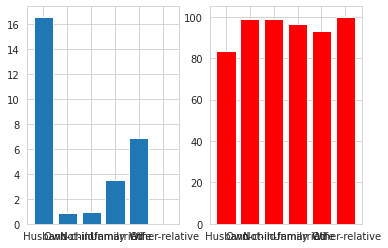

% of >50K income when Relationship is  Not-in-family and Education_num is 2 = 0.0
% of >50K income when Relationship is  Husband and Education_num is 2 = 8.571428571428571
% of >50K income when Relationship is  Unmarried and Education_num is 2 = 0.0
% of >50K income when Relationship is  Own-child and Education_num is 2 = 0.0
% of >50K income when Relationship is  Wife and Education_num is 2 = 0.0
% of >50K income when Relationship is  Other-relative and Education_num is 2 = 0.0


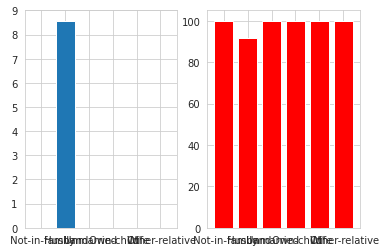

% of >50K income when Relationship is  Not-in-family and Education_num is 1 = 0.0
% of >50K income when Relationship is  Husband and Education_num is 1 = 0.0
% of >50K income when Relationship is  Unmarried and Education_num is 1 = 0.0
% of >50K income when Relationship is  Other-relative and Education_num is 1 = 0.0
% of >50K income when Relationship is  Wife and Education_num is 1 = 0.0
% of >50K income when Relationship is  Own-child and Education_num is 1 = 0.0


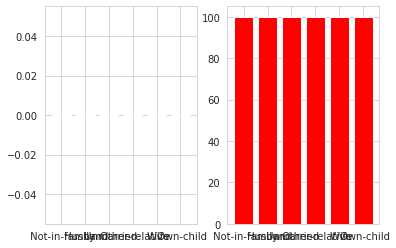

% of >50K income when Relationship is  Not-in-family and Education_num is 8 = 4.123711340206185
% of >50K income when Relationship is  Other-relative and Education_num is 8 = 4.3478260869565215
% of >50K income when Relationship is  Husband and Education_num is 8 = 24.271844660194176
% of >50K income when Relationship is  Own-child and Education_num is 8 = 0.0
% of >50K income when Relationship is  Unmarried and Education_num is 8 = 0.0
% of >50K income when Relationship is  Wife and Education_num is 8 = 16.666666666666664


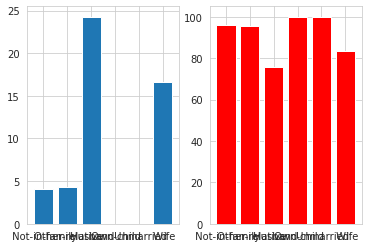

% of >50K income when Race is  White and Education_num is 13 = 43.04635761589404
% of >50K income when Race is  Black and Education_num is 13 = 29.09090909090909
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 13 = 33.56401384083045
% of >50K income when Race is  Other and Education_num is 13 = 15.151515151515152
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 13 = 38.095238095238095


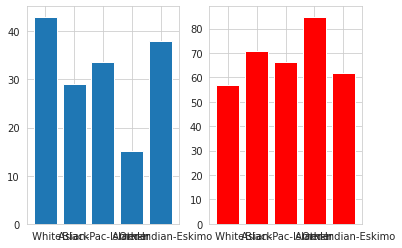

% of >50K income when Race is  White and Education_num is 9 = 17.318059299191376
% of >50K income when Race is  Black and Education_num is 9 = 7.325383304940375
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 9 = 15.04424778761062
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 9 = 9.243697478991598
% of >50K income when Race is  Other and Education_num is 9 = 2.564102564102564


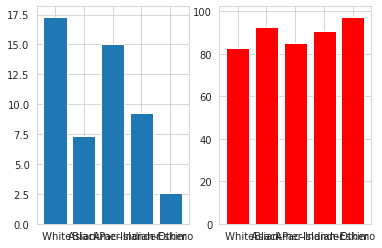

% of >50K income when Race is  Black and Education_num is 7 = 4.57516339869281
% of >50K income when Race is  White and Education_num is 7 = 5.117707267144319
% of >50K income when Race is  Other and Education_num is 7 = 0.0
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 7 = 4.761904761904762
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 7 = 14.285714285714285


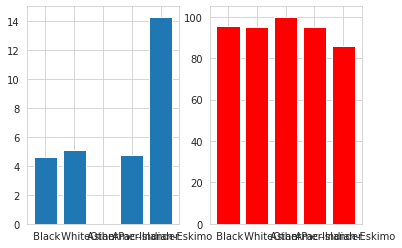

% of >50K income when Race is  White and Education_num is 14 = 56.66883539362394
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 14 = 48.86363636363637
% of >50K income when Race is  Black and Education_num is 14 = 46.51162790697674
% of >50K income when Race is  Other and Education_num is 14 = 28.57142857142857
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 14 = 60.0


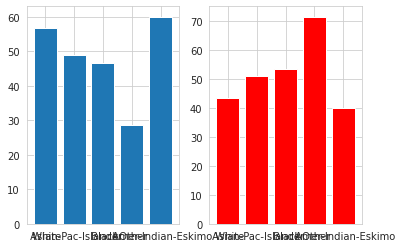

% of >50K income when Race is  Black and Education_num is 5 = 4.49438202247191
% of >50K income when Race is  White and Education_num is 5 = 5.459057071960298
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 5 = 11.11111111111111
% of >50K income when Race is  Other and Education_num is 5 = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 5 = 0.0


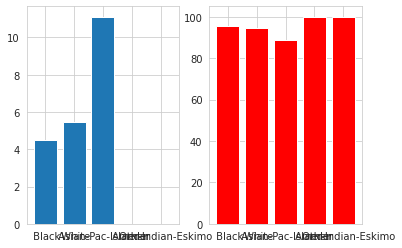

% of >50K income when Race is  Black and Education_num is 10 = 11.528150134048257
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 10 = 15.865384615384615
% of >50K income when Race is  White and Education_num is 10 = 20.219107459320124
% of >50K income when Race is  Other and Education_num is 10 = 13.725490196078432
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 10 = 7.59493670886076


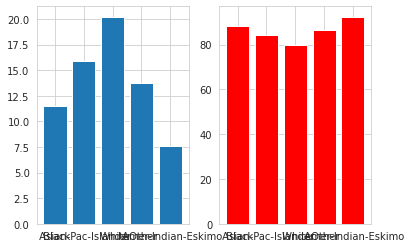

% of >50K income when Race is  Black and Education_num is 12 = 17.75700934579439
% of >50K income when Race is  White and Education_num is 12 = 25.683060109289617
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 12 = 12.5
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 12 = 27.586206896551722
% of >50K income when Race is  Other and Education_num is 12 = 25.0


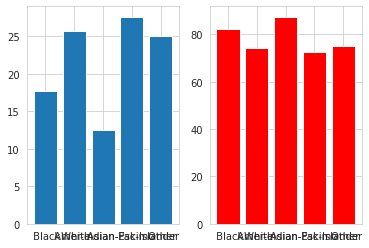

% of >50K income when Race is  Asian-Pac-Islander and Education_num is 11 = 23.684210526315788
% of >50K income when Race is  White and Education_num is 11 = 27.5890637945319
% of >50K income when Race is  Black and Education_num is 11 = 16.071428571428573
% of >50K income when Race is  Other and Education_num is 11 = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 11 = 5.263157894736842


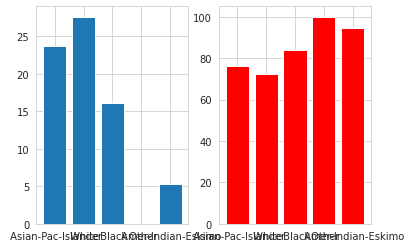

% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 4 = 0.0
% of >50K income when Race is  White and Education_num is 4 = 6.871609403254973
% of >50K income when Race is  Other and Education_num is 4 = 0.0
% of >50K income when Race is  Black and Education_num is 4 = 3.571428571428571
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 4 = 0.0


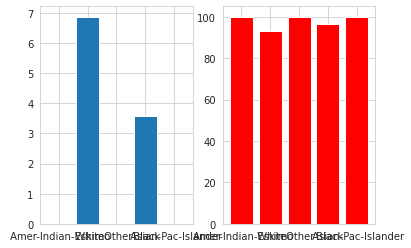

% of >50K income when Race is  White and Education_num is 16 = 74.79674796747967
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 16 = 64.28571428571429
% of >50K income when Race is  Black and Education_num is 16 = 81.81818181818183
% of >50K income when Race is  Other and Education_num is 16 = 50.0
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 16 = 66.66666666666666


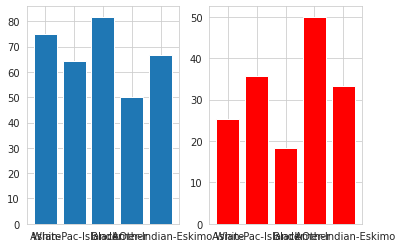

% of >50K income when Race is  White and Education_num is 15 = 74.31906614785993
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 15 = 65.85365853658537
% of >50K income when Race is  Black and Education_num is 15 = 53.333333333333336
% of >50K income when Race is  Other and Education_num is 15 = 100.0
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 15 = 100.0


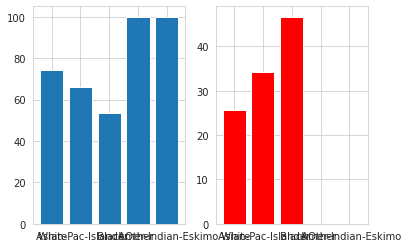

% of >50K income when Race is  White and Education_num is 3 = 4.301075268817205
% of >50K income when Race is  Black and Education_num is 3 = 0.0
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 3 = 16.666666666666664
% of >50K income when Race is  Other and Education_num is 3 = 7.6923076923076925
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 3 = 0.0


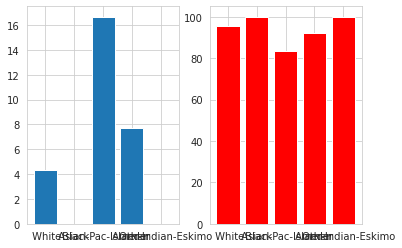

% of >50K income when Race is  White and Education_num is 6 = 7.086614173228346
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 6 = 0.0
% of >50K income when Race is  Black and Education_num is 6 = 4.511278195488721
% of >50K income when Race is  Other and Education_num is 6 = 11.11111111111111
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 6 = 7.6923076923076925


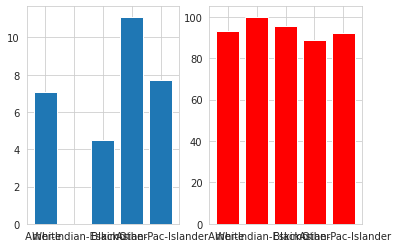

% of >50K income when Race is  White and Education_num is 2 = 3.731343283582089
% of >50K income when Race is  Black and Education_num is 2 = 6.25
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 2 = 0.0
% of >50K income when Race is  Other and Education_num is 2 = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 2 = 0.0


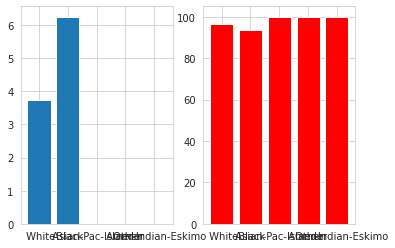

% of >50K income when Race is  White and Education_num is 1 = 0.0
% of >50K income when Race is  Black and Education_num is 1 = 0.0
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 1 = 0.0
% of >50K income when Race is  Other and Education_num is 1 = 0.0


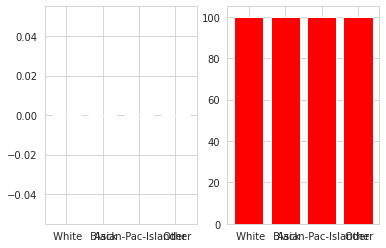

% of >50K income when Race is  White and Education_num is 8 = 8.059701492537313
% of >50K income when Race is  Black and Education_num is 8 = 7.142857142857142
% of >50K income when Race is  Asian-Pac-Islander and Education_num is 8 = 11.11111111111111
% of >50K income when Race is  Other and Education_num is 8 = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Education_num is 8 = 0.0


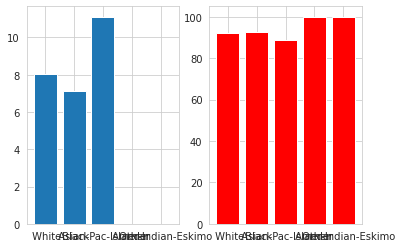

% of >50K income when Sex is  Male and Education_num is 13 = 50.388219544846045
% of >50K income when Sex is  Female and Education_num is 13 = 20.93885114268067


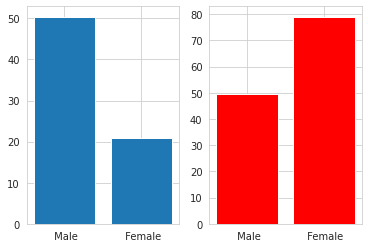

% of >50K income when Sex is  Male and Education_num is 9 = 20.37688088876389
% of >50K income when Sex is  Female and Education_num is 9 = 6.666666666666667


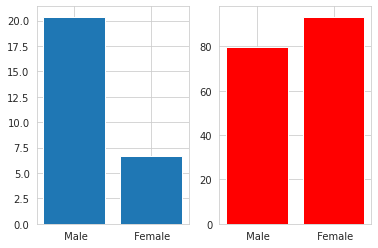

% of >50K income when Sex is  Male and Education_num is 7 = 6.998654104979811
% of >50K income when Sex is  Female and Education_num is 7 = 1.8518518518518516


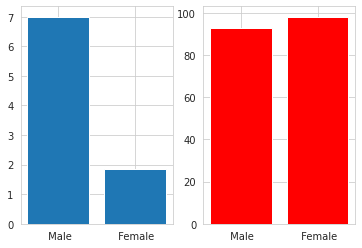

% of >50K income when Sex is  Female and Education_num is 14 = 33.3955223880597
% of >50K income when Sex is  Male and Education_num is 14 = 65.71187868576243


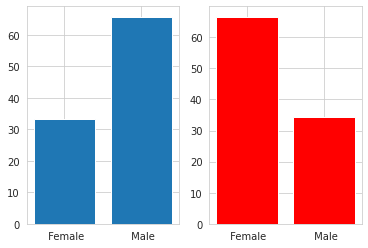

% of >50K income when Sex is  Female and Education_num is 5 = 3.4722222222222223
% of >50K income when Sex is  Male and Education_num is 5 = 5.9459459459459465


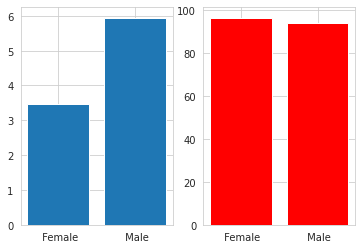

% of >50K income when Sex is  Male and Education_num is 10 = 26.53288740245262
% of >50K income when Sex is  Female and Education_num is 10 = 7.020669992872416


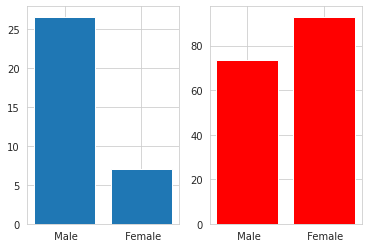

% of >50K income when Sex is  Male and Education_num is 12 = 32.35294117647059
% of >50K income when Sex is  Female and Education_num is 12 = 13.30166270783848


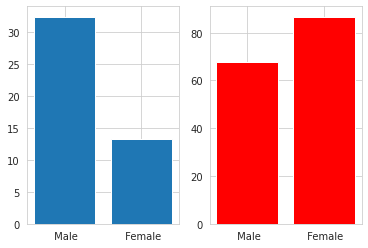

% of >50K income when Sex is  Male and Education_num is 11 = 33.33333333333333
% of >50K income when Sex is  Female and Education_num is 11 = 13.4


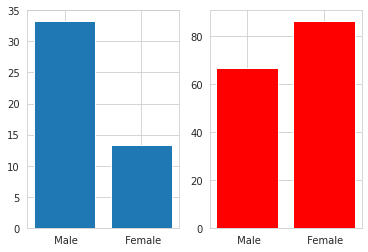

% of >50K income when Sex is  Male and Education_num is 4 = 8.024691358024691
% of >50K income when Sex is  Female and Education_num is 4 = 0.625


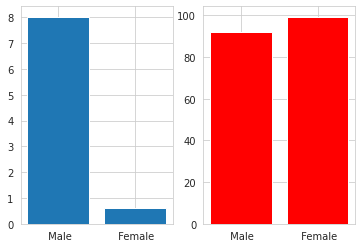

% of >50K income when Sex is  Male and Education_num is 16 = 78.2874617737003
% of >50K income when Sex is  Female and Education_num is 16 = 58.139534883720934


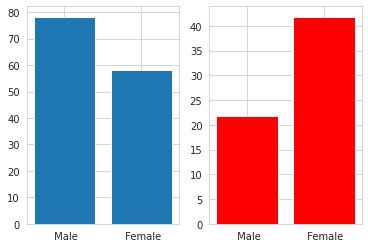

% of >50K income when Sex is  Female and Education_num is 15 = 45.65217391304348
% of >50K income when Sex is  Male and Education_num is 15 = 78.71900826446281


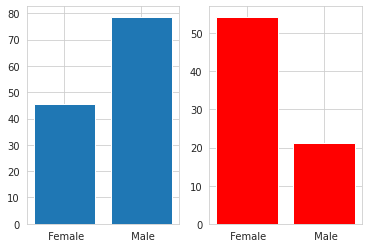

% of >50K income when Sex is  Male and Education_num is 3 = 5.622489959839357
% of >50K income when Sex is  Female and Education_num is 3 = 2.380952380952381


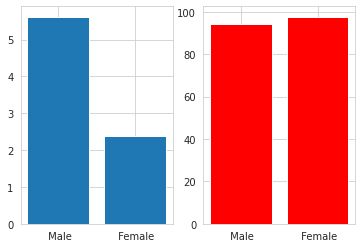

% of >50K income when Sex is  Male and Education_num is 6 = 9.247648902821316
% of >50K income when Sex is  Female and Education_num is 6 = 1.0169491525423728


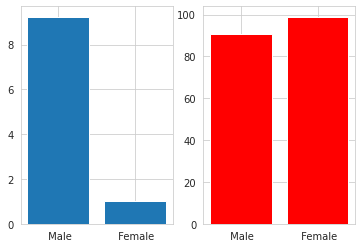

% of >50K income when Sex is  Female and Education_num is 2 = 0.0
% of >50K income when Sex is  Male and Education_num is 2 = 4.918032786885246


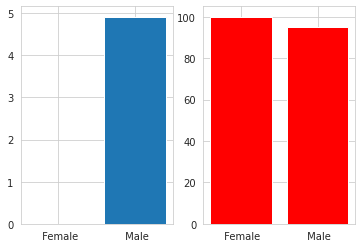

% of >50K income when Sex is  Female and Education_num is 1 = 0.0
% of >50K income when Sex is  Male and Education_num is 1 = 0.0


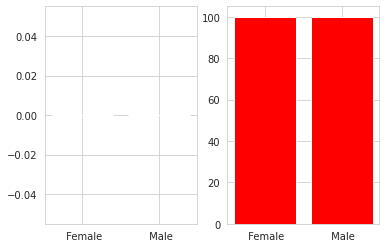

% of >50K income when Sex is  Male and Education_num is 8 = 10.034602076124568
% of >50K income when Sex is  Female and Education_num is 8 = 2.7777777777777777


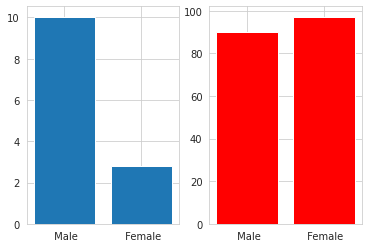

% of >50K income when Native_country is  United-States and Education_num is 13 = 42.30849947534103
% of >50K income when Native_country is  Cuba and Education_num is 13 = 23.52941176470588
% of >50K income when Native_country is  India and Education_num is 13 = 33.33333333333333
% of >50K income when Native_country is  Germany and Education_num is 13 = 35.294117647058826
% of >50K income when Native_country is  Philippines and Education_num is 13 = 48.0
% of >50K income when Native_country is  Poland and Education_num is 13 = 27.27272727272727
% of >50K income when Native_country is  Iran and Education_num is 13 = 40.0
% of >50K income when Native_country is  ? and Education_num is 13 = 35.86206896551724
% of >50K income when Native_country is  Canada and Education_num is 13 = 37.5
% of >50K income when Native_country is  Honduras and Education_num is 13 = 0.0
% of >50K income when Native_country is  England and Education_num is 13 = 52.17391304347826
% of >50K income when Native_count

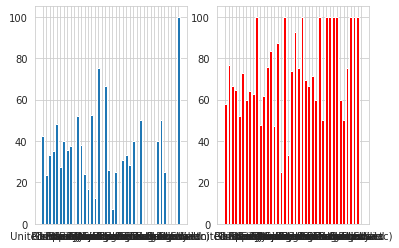

% of >50K income when Native_country is  United-States and Education_num is 9 = 16.316223459080604
% of >50K income when Native_country is  ? and Education_num is 9 = 9.774436090225564
% of >50K income when Native_country is  Mexico and Education_num is 9 = 6.2015503875969
% of >50K income when Native_country is  Canada and Education_num is 9 = 25.806451612903224
% of >50K income when Native_country is  England and Education_num is 9 = 21.428571428571427
% of >50K income when Native_country is  Italy and Education_num is 9 = 41.17647058823529
% of >50K income when Native_country is  Cambodia and Education_num is 9 = 28.57142857142857
% of >50K income when Native_country is  Haiti and Education_num is 9 = 0.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 9 = 11.11111111111111
% of >50K income when Native_country is  Poland and Education_num is 9 = 10.0
% of >50K income when Native_country is  Portugal and Education_num is 9 = 20.0
% of >50K income when

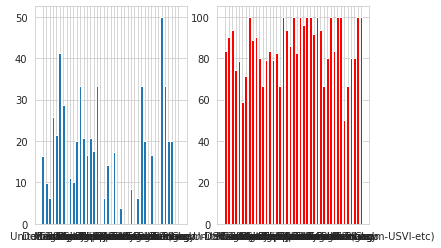

% of >50K income when Native_country is  United-States and Education_num is 7 = 5.154639175257731
% of >50K income when Native_country is  Puerto-Rico and Education_num is 7 = 12.5
% of >50K income when Native_country is  Mexico and Education_num is 7 = 0.0
% of >50K income when Native_country is  South and Education_num is 7 = 0.0
% of >50K income when Native_country is  ? and Education_num is 7 = 12.5
% of >50K income when Native_country is  Haiti and Education_num is 7 = 0.0
% of >50K income when Native_country is  Germany and Education_num is 7 = 0.0
% of >50K income when Native_country is  India and Education_num is 7 = 0.0
% of >50K income when Native_country is  Guatemala and Education_num is 7 = 0.0
% of >50K income when Native_country is  Canada and Education_num is 7 = 0.0
% of >50K income when Native_country is  Cuba and Education_num is 7 = 0.0
% of >50K income when Native_country is  Vietnam and Education_num is 7 = 33.33333333333333
% of >50K income when Native_country is

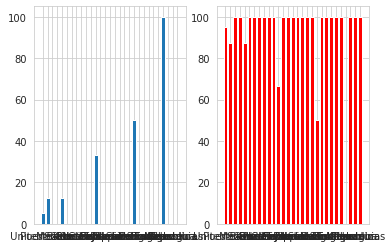

% of >50K income when Native_country is  United-States and Education_num is 14 = 56.71250818598559
% of >50K income when Native_country is  Iran and Education_num is 14 = 66.66666666666666
% of >50K income when Native_country is  ? and Education_num is 14 = 46.93877551020408
% of >50K income when Native_country is  Taiwan and Education_num is 14 = 46.15384615384615
% of >50K income when Native_country is  Dominican-Republic and Education_num is 14 = 0.0
% of >50K income when Native_country is  South and Education_num is 14 = 28.57142857142857
% of >50K income when Native_country is  India and Education_num is 14 = 48.148148148148145
% of >50K income when Native_country is  Mexico and Education_num is 14 = 60.0
% of >50K income when Native_country is  Poland and Education_num is 14 = 50.0
% of >50K income when Native_country is  England and Education_num is 14 = 55.55555555555556
% of >50K income when Native_country is  China and Education_num is 14 = 36.36363636363637
% of >50K income 

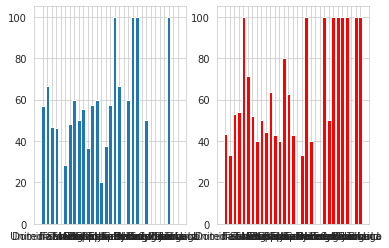

% of >50K income when Native_country is  Jamaica and Education_num is 5 = 0.0
% of >50K income when Native_country is  United-States and Education_num is 5 = 5.822784810126582
% of >50K income when Native_country is  Portugal and Education_num is 5 = 0.0
% of >50K income when Native_country is  Mexico and Education_num is 5 = 0.0
% of >50K income when Native_country is  El-Salvador and Education_num is 5 = 0.0
% of >50K income when Native_country is  ? and Education_num is 5 = 12.5
% of >50K income when Native_country is  Canada and Education_num is 5 = 0.0
% of >50K income when Native_country is  Trinadad&Tobago and Education_num is 5 = 33.33333333333333
% of >50K income when Native_country is  Haiti and Education_num is 5 = 0.0
% of >50K income when Native_country is  Nicaragua and Education_num is 5 = 0.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 5 = 0.0
% of >50K income when Native_country is  Cuba and Education_num is 5 = 0.0
% of >50K income

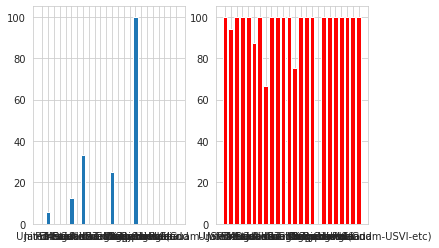

% of >50K income when Native_country is  United-States and Education_num is 10 = 19.258160237388726
% of >50K income when Native_country is  South and Education_num is 10 = 16.666666666666664
% of >50K income when Native_country is  ? and Education_num is 10 = 16.346153846153847
% of >50K income when Native_country is  Mexico and Education_num is 10 = 6.349206349206349
% of >50K income when Native_country is  Thailand and Education_num is 10 = 33.33333333333333
% of >50K income when Native_country is  Canada and Education_num is 10 = 36.0
% of >50K income when Native_country is  Laos and Education_num is 10 = 0.0
% of >50K income when Native_country is  Philippines and Education_num is 10 = 21.951219512195124
% of >50K income when Native_country is  France and Education_num is 10 = 33.33333333333333
% of >50K income when Native_country is  Germany and Education_num is 10 = 26.47058823529412
% of >50K income when Native_country is  Japan and Education_num is 10 = 9.090909090909092
% of 

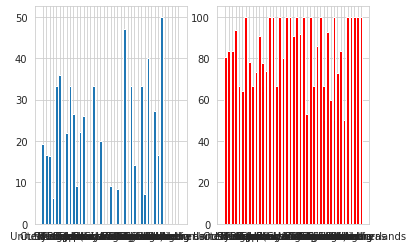

% of >50K income when Native_country is  United-States and Education_num is 12 = 25.15274949083503
% of >50K income when Native_country is  England and Education_num is 12 = 40.0
% of >50K income when Native_country is  Iran and Education_num is 12 = 0.0
% of >50K income when Native_country is  ? and Education_num is 12 = 25.0
% of >50K income when Native_country is  Portugal and Education_num is 12 = 0.0
% of >50K income when Native_country is  Philippines and Education_num is 12 = 16.666666666666664
% of >50K income when Native_country is  Haiti and Education_num is 12 = 0.0
% of >50K income when Native_country is  Italy and Education_num is 12 = 25.0
% of >50K income when Native_country is  Germany and Education_num is 12 = 20.0
% of >50K income when Native_country is  Columbia and Education_num is 12 = 0.0
% of >50K income when Native_country is  Jamaica and Education_num is 12 = 0.0
% of >50K income when Native_country is  France and Education_num is 12 = 66.66666666666666
% of >5

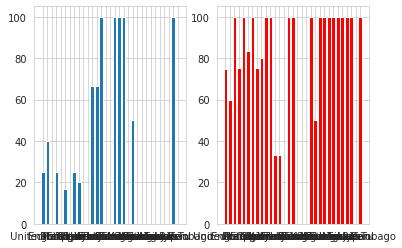

% of >50K income when Native_country is  ? and Education_num is 11 = 25.0
% of >50K income when Native_country is  United-States and Education_num is 11 = 26.066718386346004
% of >50K income when Native_country is  Puerto-Rico and Education_num is 11 = 50.0
% of >50K income when Native_country is  Columbia and Education_num is 11 = 0.0
% of >50K income when Native_country is  Portugal and Education_num is 11 = 50.0
% of >50K income when Native_country is  India and Education_num is 11 = 50.0
% of >50K income when Native_country is  Peru and Education_num is 11 = 0.0
% of >50K income when Native_country is  Germany and Education_num is 11 = 60.0
% of >50K income when Native_country is  Canada and Education_num is 11 = 42.857142857142854
% of >50K income when Native_country is  Mexico and Education_num is 11 = 11.11111111111111
% of >50K income when Native_country is  England and Education_num is 11 = 0.0
% of >50K income when Native_country is  Greece and Education_num is 11 = 50.0
% of

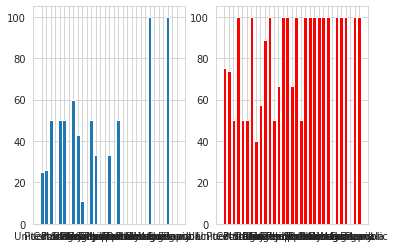

% of >50K income when Native_country is  Mexico and Education_num is 4 = 3.7735849056603774
% of >50K income when Native_country is  ? and Education_num is 4 = 15.789473684210526
% of >50K income when Native_country is  United-States and Education_num is 4 = 6.212424849699398
% of >50K income when Native_country is  Ecuador and Education_num is 4 = 0.0
% of >50K income when Native_country is  Puerto-Rico and Education_num is 4 = 0.0
% of >50K income when Native_country is  Cuba and Education_num is 4 = 0.0
% of >50K income when Native_country is  China and Education_num is 4 = 0.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 4 = 0.0
% of >50K income when Native_country is  Greece and Education_num is 4 = 50.0
% of >50K income when Native_country is  Portugal and Education_num is 4 = 0.0
% of >50K income when Native_country is  Italy and Education_num is 4 = 25.0
% of >50K income when Native_country is  Guatemala and Education_num is 4 = 0.0
% of >50K

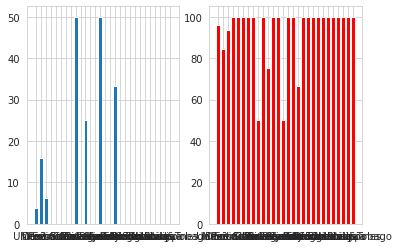

% of >50K income when Native_country is  United-States and Education_num is 16 = 75.91463414634147
% of >50K income when Native_country is  Taiwan and Education_num is 16 = 87.5
% of >50K income when Native_country is  China and Education_num is 16 = 55.55555555555556
% of >50K income when Native_country is  ? and Education_num is 16 = 65.21739130434783
% of >50K income when Native_country is  England and Education_num is 16 = 25.0
% of >50K income when Native_country is  Canada and Education_num is 16 = 50.0
% of >50K income when Native_country is  India and Education_num is 16 = 60.0
% of >50K income when Native_country is  Mexico and Education_num is 16 = 100.0
% of >50K income when Native_country is  Iran and Education_num is 16 = 80.0
% of >50K income when Native_country is  Germany and Education_num is 16 = 83.33333333333334
% of >50K income when Native_country is  El-Salvador and Education_num is 16 = 100.0
% of >50K income when Native_country is  Italy and Education_num is 16 =

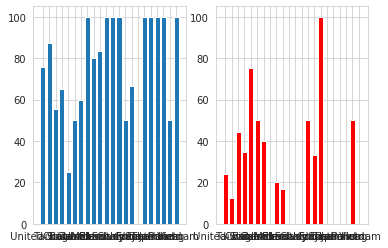

% of >50K income when Native_country is  Honduras and Education_num is 15 = 100.0
% of >50K income when Native_country is  United-States and Education_num is 15 = 74.5019920318725
% of >50K income when Native_country is  ? and Education_num is 15 = 52.94117647058824
% of >50K income when Native_country is  Greece and Education_num is 15 = 100.0
% of >50K income when Native_country is  China and Education_num is 15 = 0.0
% of >50K income when Native_country is  Columbia and Education_num is 15 = 50.0
% of >50K income when Native_country is  Italy and Education_num is 15 = 50.0
% of >50K income when Native_country is  Philippines and Education_num is 15 = 60.0
% of >50K income when Native_country is  Mexico and Education_num is 15 = 50.0
% of >50K income when Native_country is  Taiwan and Education_num is 15 = 100.0
% of >50K income when Native_country is  Haiti and Education_num is 15 = 0.0
% of >50K income when Native_country is  India and Education_num is 15 = 75.0
% of >50K income wh

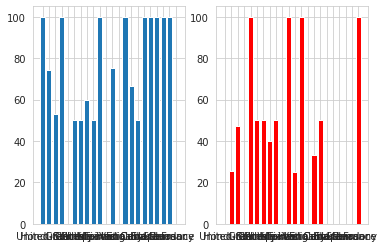

% of >50K income when Native_country is  Mexico and Education_num is 3 = 2.027027027027027
% of >50K income when Native_country is  United-States and Education_num is 3 = 5.154639175257731
% of >50K income when Native_country is  El-Salvador and Education_num is 3 = 0.0
% of >50K income when Native_country is  Cuba and Education_num is 3 = 0.0
% of >50K income when Native_country is  Guatemala and Education_num is 3 = 12.5
% of >50K income when Native_country is  Puerto-Rico and Education_num is 3 = 16.666666666666664
% of >50K income when Native_country is  Italy and Education_num is 3 = 10.0
% of >50K income when Native_country is  ? and Education_num is 3 = 13.333333333333334
% of >50K income when Native_country is  Vietnam and Education_num is 3 = 50.0
% of >50K income when Native_country is  Laos and Education_num is 3 = 50.0
% of >50K income when Native_country is  Philippines and Education_num is 3 = 14.285714285714285
% of >50K income when Native_country is  Nicaragua and Educa

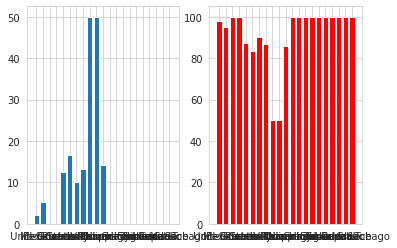

% of >50K income when Native_country is  United-States and Education_num is 6 = 6.9575471698113205
% of >50K income when Native_country is  ? and Education_num is 6 = 8.333333333333332
% of >50K income when Native_country is  Mexico and Education_num is 6 = 0.0
% of >50K income when Native_country is  Guatemala and Education_num is 6 = 0.0
% of >50K income when Native_country is  El-Salvador and Education_num is 6 = 0.0
% of >50K income when Native_country is  Germany and Education_num is 6 = 0.0
% of >50K income when Native_country is  Columbia and Education_num is 6 = 0.0
% of >50K income when Native_country is  China and Education_num is 6 = 0.0
% of >50K income when Native_country is  Greece and Education_num is 6 = 0.0
% of >50K income when Native_country is  Canada and Education_num is 6 = 0.0
% of >50K income when Native_country is  Ecuador and Education_num is 6 = 0.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 6 = 0.0
% of >50K income when 

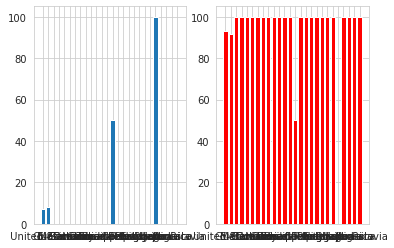

% of >50K income when Native_country is  United-States and Education_num is 2 = 2.1739130434782608
% of >50K income when Native_country is  Mexico and Education_num is 2 = 4.6875
% of >50K income when Native_country is  Guatemala and Education_num is 2 = 0.0
% of >50K income when Native_country is  El-Salvador and Education_num is 2 = 0.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 2 = 0.0
% of >50K income when Native_country is  Portugal and Education_num is 2 = 0.0
% of >50K income when Native_country is  ? and Education_num is 2 = 0.0
% of >50K income when Native_country is  Cambodia and Education_num is 2 = 0.0
% of >50K income when Native_country is  Puerto-Rico and Education_num is 2 = 0.0
% of >50K income when Native_country is  Cuba and Education_num is 2 = 0.0
% of >50K income when Native_country is  Poland and Education_num is 2 = 0.0
% of >50K income when Native_country is  Philippines and Education_num is 2 = 0.0
% of >50K income when Na

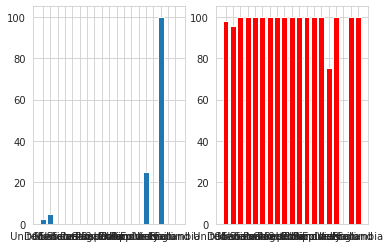

% of >50K income when Native_country is  United-States and Education_num is 1 = 0.0
% of >50K income when Native_country is  Mexico and Education_num is 1 = 0.0
% of >50K income when Native_country is  El-Salvador and Education_num is 1 = 0.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 1 = 0.0
% of >50K income when Native_country is  Cambodia and Education_num is 1 = 0.0
% of >50K income when Native_country is  Philippines and Education_num is 1 = 0.0
% of >50K income when Native_country is  China and Education_num is 1 = 0.0
% of >50K income when Native_country is  ? and Education_num is 1 = 0.0
% of >50K income when Native_country is  India and Education_num is 1 = 0.0
% of >50K income when Native_country is  Nicaragua and Education_num is 1 = 0.0
% of >50K income when Native_country is  Laos and Education_num is 1 = 0.0
% of >50K income when Native_country is  Hong and Education_num is 1 = 0.0
% of >50K income when Native_country is  Guatemala an

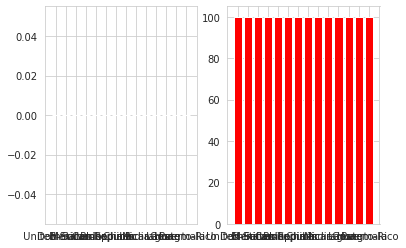

% of >50K income when Native_country is  United-States and Education_num is 8 = 7.671232876712329
% of >50K income when Native_country is  Jamaica and Education_num is 8 = 0.0
% of >50K income when Native_country is  Mexico and Education_num is 8 = 0.0
% of >50K income when Native_country is  Trinadad&Tobago and Education_num is 8 = 0.0
% of >50K income when Native_country is  Italy and Education_num is 8 = 0.0
% of >50K income when Native_country is  Cuba and Education_num is 8 = 33.33333333333333
% of >50K income when Native_country is  ? and Education_num is 8 = 12.5
% of >50K income when Native_country is  Guatemala and Education_num is 8 = 0.0
% of >50K income when Native_country is  Germany and Education_num is 8 = 0.0
% of >50K income when Native_country is  Nicaragua and Education_num is 8 = 100.0
% of >50K income when Native_country is  Dominican-Republic and Education_num is 8 = 0.0
% of >50K income when Native_country is  Columbia and Education_num is 8 = 0.0
% of >50K incom

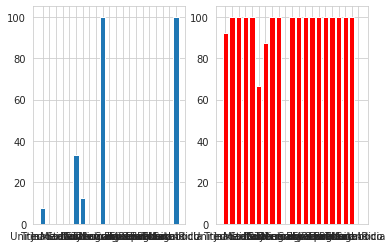

% of >50K income when age_cat is 4 and Education_num is 13 = 56.48854961832062
% of >50K income when age_cat is 2 and Education_num is 13 = 16.313423249839435
% of >50K income when age_cat is 5 and Education_num is 13 = 57.51748251748252
% of >50K income when age_cat is 3 and Education_num is 13 = 47.241165530068194
% of >50K income when age_cat is 6 and Education_num is 13 = 45.33333333333333
% of >50K income when age_cat is 1 and Education_num is 13 = 0.0


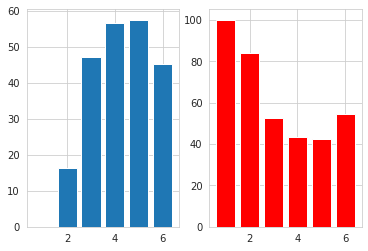

% of >50K income when age_cat is 3 and Education_num is 9 = 17.002081887578072
% of >50K income when age_cat is 5 and Education_num is 9 = 28.098591549295776
% of >50K income when age_cat is 2 and Education_num is 9 = 4.736842105263158
% of >50K income when age_cat is 1 and Education_num is 9 = 0.0
% of >50K income when age_cat is 4 and Education_num is 9 = 24.813084112149532
% of >50K income when age_cat is 6 and Education_num is 9 = 15.32567049808429


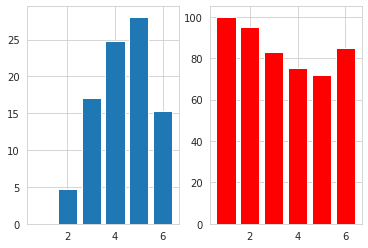

% of >50K income when age_cat is 5 and Education_num is 7 = 11.320754716981133
% of >50K income when age_cat is 3 and Education_num is 7 = 5.825242718446602
% of >50K income when age_cat is 4 and Education_num is 7 = 12.587412587412588
% of >50K income when age_cat is 1 and Education_num is 7 = 0.0
% of >50K income when age_cat is 2 and Education_num is 7 = 4.743083003952568
% of >50K income when age_cat is 6 and Education_num is 7 = 7.894736842105263


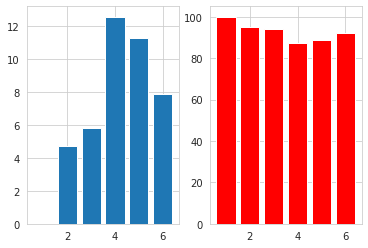

% of >50K income when age_cat is 3 and Education_num is 14 = 55.72354211663067
% of >50K income when age_cat is 4 and Education_num is 14 = 61.850649350649356
% of >50K income when age_cat is 6 and Education_num is 14 = 45.16129032258064
% of >50K income when age_cat is 2 and Education_num is 14 = 23.737373737373737
% of >50K income when age_cat is 5 and Education_num is 14 = 67.601246105919
% of >50K income when age_cat is 1 and Education_num is 14 = 0.0


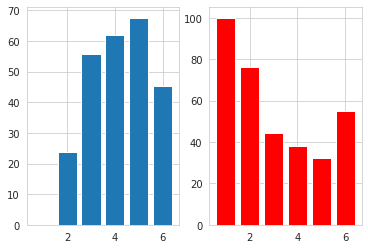

% of >50K income when age_cat is 4 and Education_num is 5 = 6.25
% of >50K income when age_cat is 3 and Education_num is 5 = 6.0344827586206895
% of >50K income when age_cat is 2 and Education_num is 5 = 1.680672268907563
% of >50K income when age_cat is 5 and Education_num is 5 = 8.88888888888889
% of >50K income when age_cat is 1 and Education_num is 5 = 0.0
% of >50K income when age_cat is 6 and Education_num is 5 = 7.142857142857142


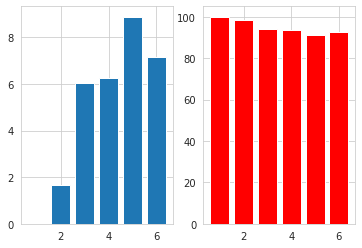

% of >50K income when age_cat is 3 and Education_num is 10 = 23.56051703877791
% of >50K income when age_cat is 5 and Education_num is 10 = 39.19463087248322
% of >50K income when age_cat is 2 and Education_num is 10 = 5.005731753916699
% of >50K income when age_cat is 4 and Education_num is 10 = 33.759772565742715
% of >50K income when age_cat is 1 and Education_num is 10 = 0.0
% of >50K income when age_cat is 6 and Education_num is 10 = 23.655913978494624


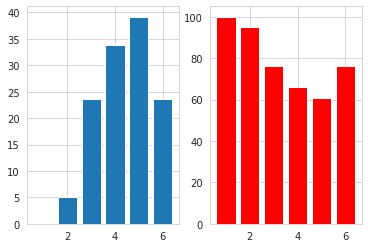

% of >50K income when age_cat is 3 and Education_num is 12 = 28.997289972899733
% of >50K income when age_cat is 2 and Education_num is 12 = 8.950617283950617
% of >50K income when age_cat is 4 and Education_num is 12 = 34.439834024896264
% of >50K income when age_cat is 5 and Education_num is 12 = 35.35353535353536
% of >50K income when age_cat is 6 and Education_num is 12 = 33.33333333333333
% of >50K income when age_cat is 1 and Education_num is 12 = 0.0


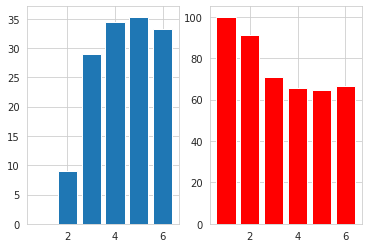

% of >50K income when age_cat is 3 and Education_num is 11 = 28.13852813852814
% of >50K income when age_cat is 4 and Education_num is 11 = 35.10971786833856
% of >50K income when age_cat is 2 and Education_num is 11 = 10.880829015544041
% of >50K income when age_cat is 5 and Education_num is 11 = 42.95774647887324
% of >50K income when age_cat is 6 and Education_num is 11 = 22.857142857142858
% of >50K income when age_cat is 1 and Education_num is 11 = 0.0


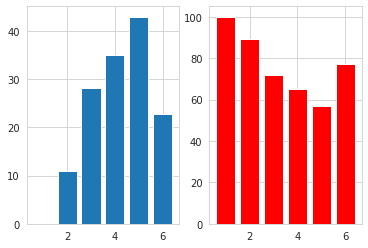

% of >50K income when age_cat is 3 and Education_num is 4 = 7.368421052631578
% of >50K income when age_cat is 5 and Education_num is 4 = 7.194244604316546
% of >50K income when age_cat is 4 and Education_num is 4 = 5.511811023622047
% of >50K income when age_cat is 2 and Education_num is 4 = 1.0309278350515463
% of >50K income when age_cat is 6 and Education_num is 4 = 8.187134502923977
% of >50K income when age_cat is 1 and Education_num is 4 = 5.88235294117647


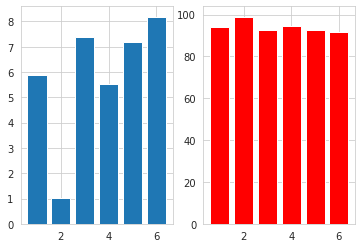

% of >50K income when age_cat is 3 and Education_num is 16 = 67.64705882352942
% of >50K income when age_cat is 4 and Education_num is 16 = 80.46875
% of >50K income when age_cat is 5 and Education_num is 16 = 81.44329896907216
% of >50K income when age_cat is 2 and Education_num is 16 = 31.818181818181817
% of >50K income when age_cat is 6 and Education_num is 16 = 75.0


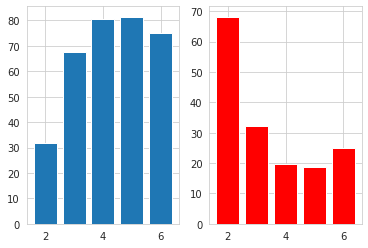

% of >50K income when age_cat is 4 and Education_num is 15 = 87.24489795918367
% of >50K income when age_cat is 3 and Education_num is 15 = 80.11695906432749
% of >50K income when age_cat is 2 and Education_num is 15 = 24.59016393442623
% of >50K income when age_cat is 6 and Education_num is 15 = 58.46153846153847
% of >50K income when age_cat is 5 and Education_num is 15 = 74.69879518072288


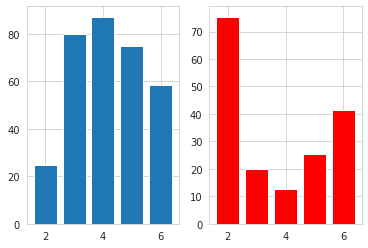

% of >50K income when age_cat is 4 and Education_num is 3 = 4.10958904109589
% of >50K income when age_cat is 2 and Education_num is 3 = 1.1764705882352942
% of >50K income when age_cat is 1 and Education_num is 3 = 0.0
% of >50K income when age_cat is 5 and Education_num is 3 = 11.475409836065573
% of >50K income when age_cat is 3 and Education_num is 3 = 6.779661016949152
% of >50K income when age_cat is 6 and Education_num is 3 = 2.083333333333333


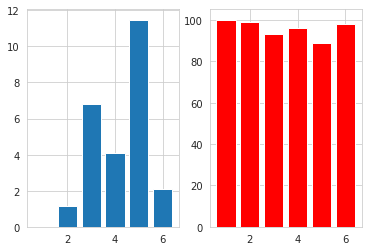

% of >50K income when age_cat is 6 and Education_num is 6 = 8.333333333333332
% of >50K income when age_cat is 1 and Education_num is 6 = 0.0
% of >50K income when age_cat is 2 and Education_num is 6 = 0.5025125628140703
% of >50K income when age_cat is 5 and Education_num is 6 = 16.129032258064516
% of >50K income when age_cat is 3 and Education_num is 6 = 7.428571428571429
% of >50K income when age_cat is 4 and Education_num is 6 = 12.931034482758621


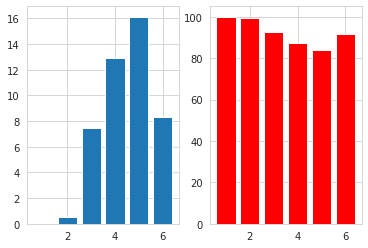

% of >50K income when age_cat is 6 and Education_num is 2 = 0.0
% of >50K income when age_cat is 5 and Education_num is 2 = 11.627906976744185
% of >50K income when age_cat is 4 and Education_num is 2 = 3.3333333333333335
% of >50K income when age_cat is 3 and Education_num is 2 = 0.0
% of >50K income when age_cat is 2 and Education_num is 2 = 0.0
% of >50K income when age_cat is 1 and Education_num is 2 = 0.0


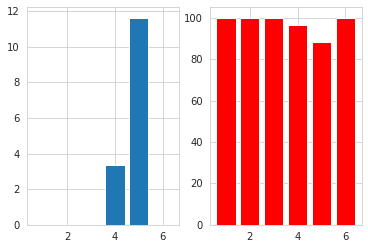

% of >50K income when age_cat is 5 and Education_num is 1 = 0.0
% of >50K income when age_cat is 6 and Education_num is 1 = 0.0
% of >50K income when age_cat is 3 and Education_num is 1 = 0.0
% of >50K income when age_cat is 2 and Education_num is 1 = 0.0
% of >50K income when age_cat is 4 and Education_num is 1 = 0.0
% of >50K income when age_cat is 1 and Education_num is 1 = 0.0


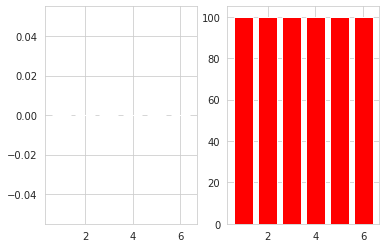

% of >50K income when age_cat is 3 and Education_num is 8 = 10.975609756097562
% of >50K income when age_cat is 5 and Education_num is 8 = 13.636363636363635
% of >50K income when age_cat is 1 and Education_num is 8 = 0.7936507936507936
% of >50K income when age_cat is 4 and Education_num is 8 = 20.0
% of >50K income when age_cat is 2 and Education_num is 8 = 2.7522935779816518
% of >50K income when age_cat is 6 and Education_num is 8 = 18.181818181818183


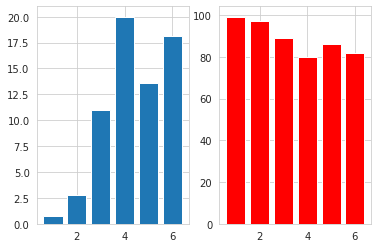

% of >50K income when Education is  Bachelors and Occupation is  Exec-managerial = 56.90284879474069
% of >50K income when Education is  Masters and Occupation is  Exec-managerial = 74.25149700598801
% of >50K income when Education is  HS-grad and Occupation is  Exec-managerial = 32.342007434944236
% of >50K income when Education is  Some-college and Occupation is  Exec-managerial = 35.49488054607509
% of >50K income when Education is  Assoc-acdm and Occupation is  Exec-managerial = 45.51724137931035
% of >50K income when Education is  Assoc-voc and Occupation is  Exec-managerial = 42.66666666666667
% of >50K income when Education is  11th and Occupation is  Exec-managerial = 20.588235294117645
% of >50K income when Education is  Doctorate and Occupation is  Exec-managerial = 90.9090909090909
% of >50K income when Education is  10th and Occupation is  Exec-managerial = 25.0
% of >50K income when Education is  9th and Occupation is  Exec-managerial = 15.384615384615385
% of >50K income 

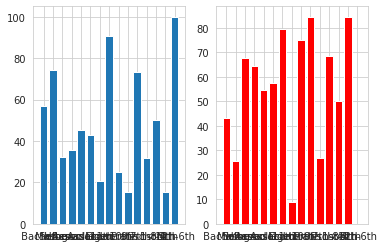

% of >50K income when Education is  HS-grad and Occupation is  Handlers-cleaners = 6.219312602291326
% of >50K income when Education is  11th and Occupation is  Handlers-cleaners = 4.0650406504065035
% of >50K income when Education is  Some-college and Occupation is  Handlers-cleaners = 7.116104868913857
% of >50K income when Education is  9th and Occupation is  Handlers-cleaners = 6.122448979591836
% of >50K income when Education is  Bachelors and Occupation is  Handlers-cleaners = 22.0
% of >50K income when Education is  7th-8th and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Education is  Assoc-voc and Occupation is  Handlers-cleaners = 7.142857142857142
% of >50K income when Education is  12th and Occupation is  Handlers-cleaners = 5.263157894736842
% of >50K income when Education is  10th and Occupation is  Handlers-cleaners = 2.8169014084507045
% of >50K income when Education is  5th-6th and Occupation is  Handlers-cleaners = 5.0
% of >50K income when Education i

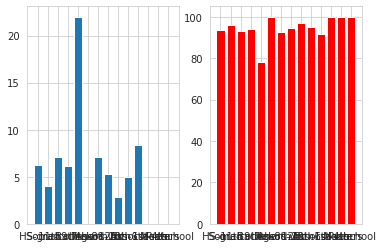

% of >50K income when Education is  Bachelors and Occupation is  Prof-specialty = 38.72909698996656
% of >50K income when Education is  Masters and Occupation is  Prof-specialty = 49.644549763033176
% of >50K income when Education is  Doctorate and Occupation is  Prof-specialty = 72.58566978193146
% of >50K income when Education is  Assoc-acdm and Occupation is  Prof-specialty = 26.811594202898554
% of >50K income when Education is  Assoc-voc and Occupation is  Prof-specialty = 34.705882352941174
% of >50K income when Education is  Prof-school and Occupation is  Prof-specialty = 76.99115044247787
% of >50K income when Education is  Some-college and Occupation is  Prof-specialty = 27.209302325581397
% of >50K income when Education is  HS-grad and Occupation is  Prof-specialty = 25.75107296137339
% of >50K income when Education is  11th and Occupation is  Prof-specialty = 10.0
% of >50K income when Education is  12th and Occupation is  Prof-specialty = 20.0
% of >50K income when Educatio

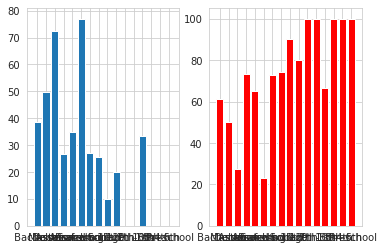

% of >50K income when Education is  9th and Occupation is  Other-service = 1.9801980198019802
% of >50K income when Education is  HS-grad and Occupation is  Other-service = 4.137392661982826
% of >50K income when Education is  Some-college and Occupation is  Other-service = 3.329065300896287
% of >50K income when Education is  Assoc-voc and Occupation is  Other-service = 7.82608695652174
% of >50K income when Education is  11th and Occupation is  Other-service = 2.5210084033613445
% of >50K income when Education is  Bachelors and Occupation is  Other-service = 16.022099447513813
% of >50K income when Education is  10th and Occupation is  Other-service = 0.5154639175257731
% of >50K income when Education is  5th-6th and Occupation is  Other-service = 0.0
% of >50K income when Education is  Assoc-acdm and Occupation is  Other-service = 7.6923076923076925
% of >50K income when Education is  7th-8th and Occupation is  Other-service = 1.0204081632653061
% of >50K income when Education is  1

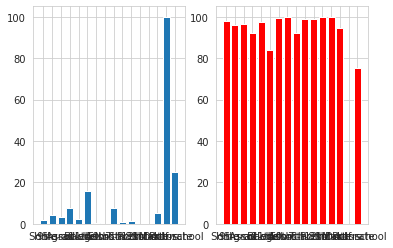

% of >50K income when Education is  Bachelors and Occupation is  Adm-clerical = 23.564356435643564
% of >50K income when Education is  Some-college and Occupation is  Adm-clerical = 11.085089773614364
% of >50K income when Education is  HS-grad and Occupation is  Adm-clerical = 11.941391941391942
% of >50K income when Education is  Assoc-acdm and Occupation is  Adm-clerical = 15.544041450777202
% of >50K income when Education is  Assoc-voc and Occupation is  Adm-clerical = 10.778443113772456
% of >50K income when Education is  10th and Occupation is  Adm-clerical = 0.0
% of >50K income when Education is  11th and Occupation is  Adm-clerical = 4.477611940298507
% of >50K income when Education is  5th-6th and Occupation is  Adm-clerical = 0.0
% of >50K income when Education is  Masters and Occupation is  Adm-clerical = 33.82352941176471
% of >50K income when Education is  12th and Occupation is  Adm-clerical = 2.631578947368421
% of >50K income when Education is  Doctorate and Occupation

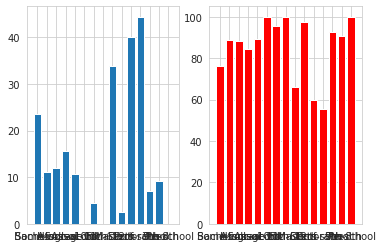

% of >50K income when Education is  Assoc-acdm and Occupation is  Sales = 27.083333333333332
% of >50K income when Education is  11th and Occupation is  Sales = 3.4722222222222223
% of >50K income when Education is  Some-college and Occupation is  Sales = 21.209117938553025
% of >50K income when Education is  Bachelors and Occupation is  Sales = 47.21878862793572
% of >50K income when Education is  HS-grad and Occupation is  Sales = 18.709073900841908
% of >50K income when Education is  9th and Occupation is  Sales = 12.5
% of >50K income when Education is  Masters and Occupation is  Sales = 59.70149253731343
% of >50K income when Education is  Assoc-voc and Occupation is  Sales = 25.471698113207548
% of >50K income when Education is  10th and Occupation is  Sales = 4.938271604938271
% of >50K income when Education is  12th and Occupation is  Sales = 10.638297872340425
% of >50K income when Education is  7th-8th and Occupation is  Sales = 13.793103448275861
% of >50K income when Educat

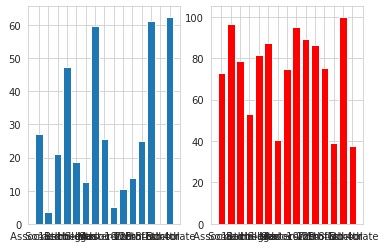

% of >50K income when Education is  Assoc-voc and Occupation is  Craft-repair = 32.142857142857146
% of >50K income when Education is  HS-grad and Occupation is  Craft-repair = 21.071800208116546
% of >50K income when Education is  Some-college and Occupation is  Craft-repair = 27.764976958525345
% of >50K income when Education is  11th and Occupation is  Craft-repair = 10.285714285714285
% of >50K income when Education is  Bachelors and Occupation is  Craft-repair = 38.93805309734513
% of >50K income when Education is  10th and Occupation is  Craft-repair = 11.176470588235295
% of >50K income when Education is  7th-8th and Occupation is  Craft-repair = 6.896551724137931
% of >50K income when Education is  Masters and Occupation is  Craft-repair = 45.45454545454545
% of >50K income when Education is  9th and Occupation is  Craft-repair = 7.291666666666667
% of >50K income when Education is  5th-6th and Occupation is  Craft-repair = 6.976744186046512
% of >50K income when Education is  

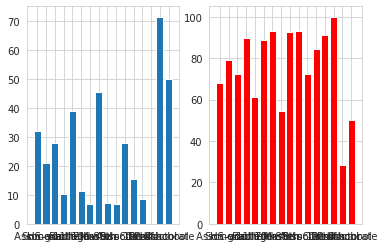

% of >50K income when Education is  7th-8th and Occupation is  Transport-moving = 11.666666666666666
% of >50K income when Education is  11th and Occupation is  Transport-moving = 7.608695652173914
% of >50K income when Education is  HS-grad and Occupation is  Transport-moving = 20.363636363636363
% of >50K income when Education is  5th-6th and Occupation is  Transport-moving = 7.142857142857142
% of >50K income when Education is  Some-college and Occupation is  Transport-moving = 25.795053003533567
% of >50K income when Education is  Bachelors and Occupation is  Transport-moving = 24.193548387096776
% of >50K income when Education is  Assoc-voc and Occupation is  Transport-moving = 27.500000000000004
% of >50K income when Education is  10th and Occupation is  Transport-moving = 20.238095238095237
% of >50K income when Education is  12th and Occupation is  Transport-moving = 17.94871794871795
% of >50K income when Education is  Masters and Occupation is  Transport-moving = 40.0
% of >5

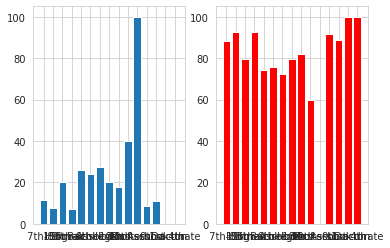

% of >50K income when Education is  HS-grad and Occupation is  Farming-fishing = 11.633663366336634
% of >50K income when Education is  9th and Occupation is  Farming-fishing = 3.571428571428571
% of >50K income when Education is  7th-8th and Occupation is  Farming-fishing = 7.142857142857142
% of >50K income when Education is  Masters and Occupation is  Farming-fishing = 30.0
% of >50K income when Education is  Some-college and Occupation is  Farming-fishing = 11.494252873563218
% of >50K income when Education is  Assoc-acdm and Occupation is  Farming-fishing = 21.428571428571427
% of >50K income when Education is  Bachelors and Occupation is  Farming-fishing = 27.27272727272727
% of >50K income when Education is  11th and Occupation is  Farming-fishing = 5.405405405405405
% of >50K income when Education is  5th-6th and Occupation is  Farming-fishing = 0.0
% of >50K income when Education is  10th and Occupation is  Farming-fishing = 2.272727272727273
% of >50K income when Education is

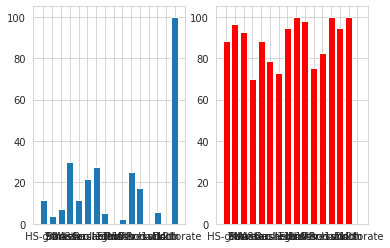

% of >50K income when Education is  HS-grad and Occupation is  Machine-op-inspct = 13.685239491691103
% of >50K income when Education is  11th and Occupation is  Machine-op-inspct = 3.0303030303030303
% of >50K income when Education is  Some-college and Occupation is  Machine-op-inspct = 14.193548387096774
% of >50K income when Education is  9th and Occupation is  Machine-op-inspct = 3.9473684210526314
% of >50K income when Education is  5th-6th and Occupation is  Machine-op-inspct = 5.357142857142857
% of >50K income when Education is  7th-8th and Occupation is  Machine-op-inspct = 6.451612903225806
% of >50K income when Education is  Preschool and Occupation is  Machine-op-inspct = 0.0
% of >50K income when Education is  Assoc-voc and Occupation is  Machine-op-inspct = 22.22222222222222
% of >50K income when Education is  1st-4th and Occupation is  Machine-op-inspct = 4.3478260869565215
% of >50K income when Education is  12th and Occupation is  Machine-op-inspct = 2.857142857142857


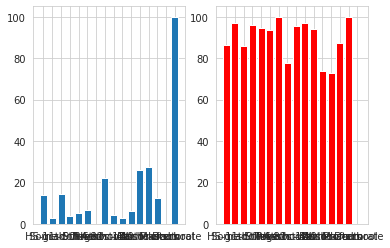

% of >50K income when Education is  HS-grad and Occupation is  Tech-support = 29.559748427672954
% of >50K income when Education is  Bachelors and Occupation is  Tech-support = 33.91304347826087
% of >50K income when Education is  Some-college and Occupation is  Tech-support = 27.472527472527474
% of >50K income when Education is  Assoc-acdm and Occupation is  Tech-support = 27.397260273972602
% of >50K income when Education is  Assoc-voc and Occupation is  Tech-support = 29.365079365079367
% of >50K income when Education is  12th and Occupation is  Tech-support = 33.33333333333333
% of >50K income when Education is  Masters and Occupation is  Tech-support = 54.054054054054056
% of >50K income when Education is  9th and Occupation is  Tech-support = 0.0
% of >50K income when Education is  11th and Occupation is  Tech-support = 0.0
% of >50K income when Education is  Prof-school and Occupation is  Tech-support = 42.857142857142854
% of >50K income when Education is  10th and Occupation 

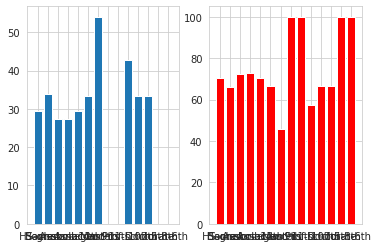

% of >50K income when Education is  Some-college and Occupation is  ? = 6.782945736434108
% of >50K income when Education is  7th-8th and Occupation is  ? = 2.73972602739726
% of >50K income when Education is  10th and Occupation is  ? = 1.9607843137254901
% of >50K income when Education is  HS-grad and Occupation is  ? = 8.630393996247655
% of >50K income when Education is  1st-4th and Occupation is  ? = 0.0
% of >50K income when Education is  Bachelors and Occupation is  ? = 26.011560693641616
% of >50K income when Education is  Masters and Occupation is  ? = 37.5
% of >50K income when Education is  Assoc-voc and Occupation is  ? = 21.311475409836063
% of >50K income when Education is  11th and Occupation is  ? = 0.0
% of >50K income when Education is  12th and Occupation is  ? = 5.0
% of >50K income when Education is  5th-6th and Occupation is  ? = 6.666666666666667
% of >50K income when Education is  9th and Occupation is  ? = 1.9607843137254901
% of >50K income when Education is  

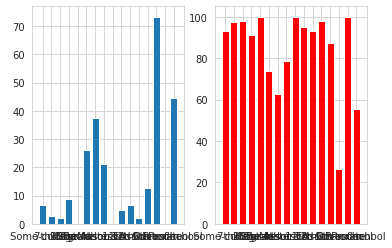

% of >50K income when Education is  Assoc-acdm and Occupation is  Protective-serv = 35.294117647058826
% of >50K income when Education is  HS-grad and Occupation is  Protective-serv = 21.86046511627907
% of >50K income when Education is  Bachelors and Occupation is  Protective-serv = 56.00000000000001
% of >50K income when Education is  Masters and Occupation is  Protective-serv = 46.666666666666664
% of >50K income when Education is  Some-college and Occupation is  Protective-serv = 34.15841584158416
% of >50K income when Education is  Assoc-voc and Occupation is  Protective-serv = 35.41666666666667
% of >50K income when Education is  7th-8th and Occupation is  Protective-serv = 0.0
% of >50K income when Education is  10th and Occupation is  Protective-serv = 0.0
% of >50K income when Education is  12th and Occupation is  Protective-serv = 0.0
% of >50K income when Education is  9th and Occupation is  Protective-serv = 0.0
% of >50K income when Education is  Prof-school and Occupation

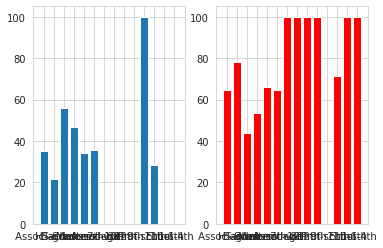

% of >50K income when Education is  HS-grad and Occupation is  Armed-Forces = 0.0
% of >50K income when Education is  Some-college and Occupation is  Armed-Forces = 0.0
% of >50K income when Education is  Bachelors and Occupation is  Armed-Forces = 0.0
% of >50K income when Education is  12th and Occupation is  Armed-Forces = 0.0
% of >50K income when Education is  Masters and Occupation is  Armed-Forces = 100.0


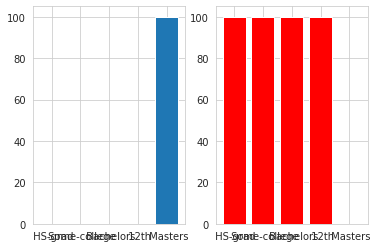

% of >50K income when Education is  1st-4th and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  9th and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  HS-grad and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  5th-6th and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  Some-college and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  10th and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  11th and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  Assoc-acdm and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  Bachelors and Occupation is  Priv-house-serv = 14.285714285714285
% of >50K income when Education is  12th and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  Assoc-voc and Occupation is  Priv-house-serv = 0.0
% of >50K income when Education is  7th-8th and Occ

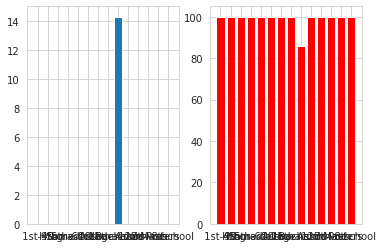

% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Exec-managerial = 68.16693944353518
% of >50K income when Marital_status is  Divorced and Occupation is  Exec-managerial = 23.67549668874172
% of >50K income when Marital_status is  Never-married and Occupation is  Exec-managerial = 14.017521902377972
% of >50K income when Marital_status is  Widowed and Occupation is  Exec-managerial = 20.43010752688172
% of >50K income when Marital_status is  Separated and Occupation is  Exec-managerial = 20.212765957446805
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Exec-managerial = 25.806451612903224
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Exec-managerial = 100.0


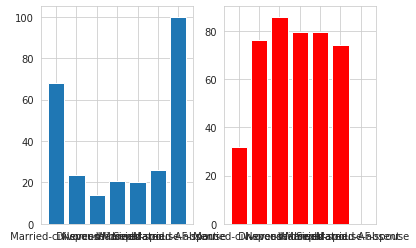

% of >50K income when Marital_status is  Divorced and Occupation is  Handlers-cleaners = 3.125
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Handlers-cleaners = 16.916488222698074
% of >50K income when Marital_status is  Never-married and Occupation is  Handlers-cleaners = 0.28735632183908044
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Marital_status is  Widowed and Occupation is  Handlers-cleaners = 5.555555555555555
% of >50K income when Marital_status is  Separated and Occupation is  Handlers-cleaners = 0.0


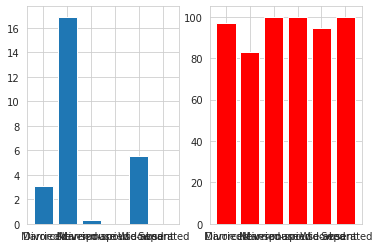

% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Prof-specialty = 70.88428974600188
% of >50K income when Marital_status is  Never-married and Occupation is  Prof-specialty = 14.343598055105348
% of >50K income when Marital_status is  Widowed and Occupation is  Prof-specialty = 20.652173913043477
% of >50K income when Marital_status is  Divorced and Occupation is  Prof-specialty = 22.263450834879407
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Prof-specialty = 23.404255319148938
% of >50K income when Marital_status is  Separated and Occupation is  Prof-specialty = 22.22222222222222
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Prof-specialty = 100.0


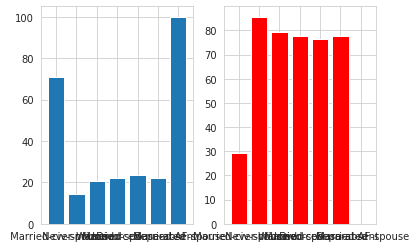

% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Other-service = 3.389830508474576
% of >50K income when Marital_status is  Separated and Occupation is  Other-service = 1.0526315789473684
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Other-service = 14.384508990318118
% of >50K income when Marital_status is  Never-married and Occupation is  Other-service = 0.7312614259597806
% of >50K income when Marital_status is  Widowed and Occupation is  Other-service = 2.2598870056497176
% of >50K income when Marital_status is  Divorced and Occupation is  Other-service = 2.19560878243513
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Other-service = 50.0


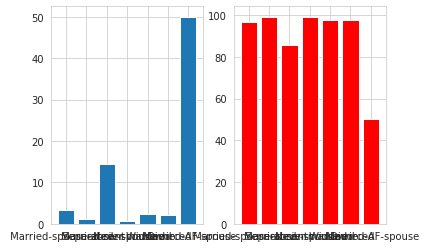

% of >50K income when Marital_status is  Never-married and Occupation is  Adm-clerical = 2.0754716981132075
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Adm-clerical = 44.11764705882353
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Adm-clerical = 20.0
% of >50K income when Marital_status is  Separated and Occupation is  Adm-clerical = 2.0408163265306123
% of >50K income when Marital_status is  Divorced and Occupation is  Adm-clerical = 3.1746031746031744
% of >50K income when Marital_status is  Widowed and Occupation is  Adm-clerical = 4.294478527607362
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Adm-clerical = 3.389830508474576


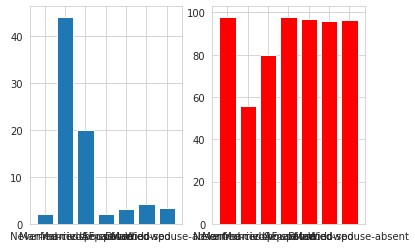

% of >50K income when Marital_status is  Never-married and Occupation is  Sales = 4.548900682335103
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Sales = 50.51112447384245
% of >50K income when Marital_status is  Separated and Occupation is  Sales = 5.376344086021505
% of >50K income when Marital_status is  Divorced and Occupation is  Sales = 12.672811059907835
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Sales = 8.823529411764707
% of >50K income when Marital_status is  Widowed and Occupation is  Sales = 19.047619047619047
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Sales = 0.0


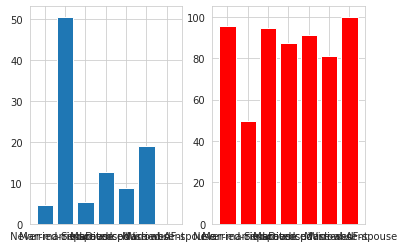

% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Craft-repair = 32.488299531981276
% of >50K income when Marital_status is  Never-married and Occupation is  Craft-repair = 4.013761467889909
% of >50K income when Marital_status is  Divorced and Occupation is  Craft-repair = 9.698275862068966
% of >50K income when Marital_status is  Separated and Occupation is  Craft-repair = 5.825242718446602
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Craft-repair = 7.6923076923076925
% of >50K income when Marital_status is  Widowed and Occupation is  Craft-repair = 9.75609756097561
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Craft-repair = 66.66666666666666


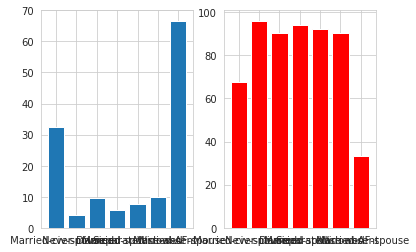

% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Transport-moving = 29.275653923541245
% of >50K income when Marital_status is  Never-married and Occupation is  Transport-moving = 2.6470588235294117
% of >50K income when Marital_status is  Separated and Occupation is  Transport-moving = 8.108108108108109
% of >50K income when Marital_status is  Divorced and Occupation is  Transport-moving = 7.734806629834254
% of >50K income when Marital_status is  Widowed and Occupation is  Transport-moving = 8.0
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Transport-moving = 5.263157894736842
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Transport-moving = 0.0


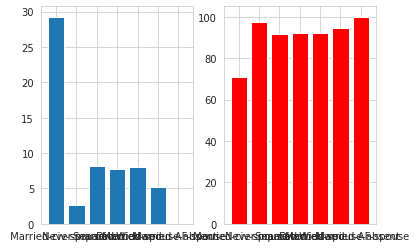

% of >50K income when Marital_status is  Never-married and Occupation is  Farming-fishing = 1.7301038062283738
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Farming-fishing = 17.565217391304348
% of >50K income when Marital_status is  Divorced and Occupation is  Farming-fishing = 7.8125
% of >50K income when Marital_status is  Separated and Occupation is  Farming-fishing = 5.555555555555555
% of >50K income when Marital_status is  Widowed and Occupation is  Farming-fishing = 4.3478260869565215
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Farming-fishing = 4.166666666666666
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Farming-fishing = 100.0


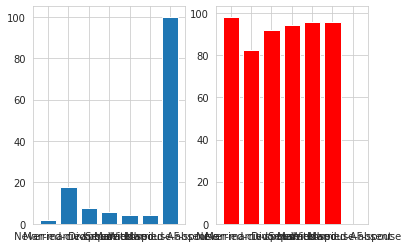

% of >50K income when Marital_status is  Never-married and Occupation is  Machine-op-inspct = 0.8756567425569177
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Machine-op-inspct = 24.117053481331986
% of >50K income when Marital_status is  Divorced and Occupation is  Machine-op-inspct = 1.444043321299639
% of >50K income when Marital_status is  Separated and Occupation is  Machine-op-inspct = 1.1904761904761905
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Machine-op-inspct = 3.8461538461538463
% of >50K income when Marital_status is  Widowed and Occupation is  Machine-op-inspct = 0.0


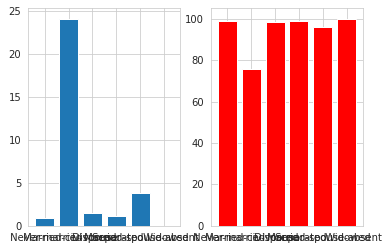

% of >50K income when Marital_status is  Divorced and Occupation is  Tech-support = 12.142857142857142
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Tech-support = 60.396039603960396
% of >50K income when Marital_status is  Never-married and Occupation is  Tech-support = 5.13595166163142
% of >50K income when Marital_status is  Widowed and Occupation is  Tech-support = 10.526315789473683
% of >50K income when Marital_status is  Separated and Occupation is  Tech-support = 10.714285714285714
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Tech-support = 0.0


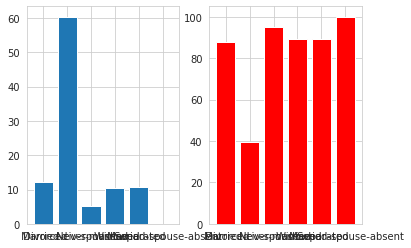

% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  ? = 26.84458398744113
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  ? = 3.4482758620689653
% of >50K income when Marital_status is  Never-married and Occupation is  ? = 1.1673151750972763
% of >50K income when Marital_status is  Divorced and Occupation is  ? = 3.2432432432432434
% of >50K income when Marital_status is  Widowed and Occupation is  ? = 2.6143790849673203
% of >50K income when Marital_status is  Separated and Occupation is  ? = 0.0
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  ? = 0.0


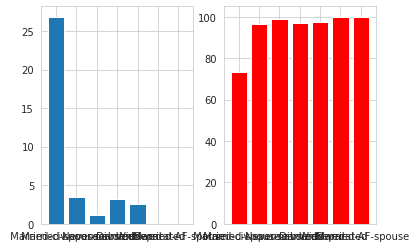

% of >50K income when Marital_status is  Never-married and Occupation is  Protective-serv = 9.615384615384617
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Protective-serv = 47.25848563968668
% of >50K income when Marital_status is  Widowed and Occupation is  Protective-serv = 11.11111111111111
% of >50K income when Marital_status is  Divorced and Occupation is  Protective-serv = 16.455696202531644
% of >50K income when Marital_status is  Separated and Occupation is  Protective-serv = 6.25
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Protective-serv = 0.0
% of >50K income when Marital_status is  Married-AF-spouse and Occupation is  Protective-serv = 0.0


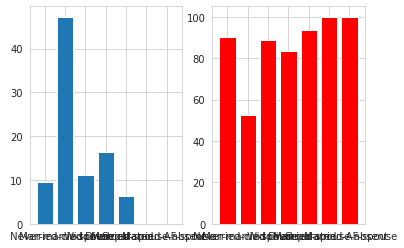

% of >50K income when Marital_status is  Never-married and Occupation is  Armed-Forces = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Armed-Forces = 33.33333333333333


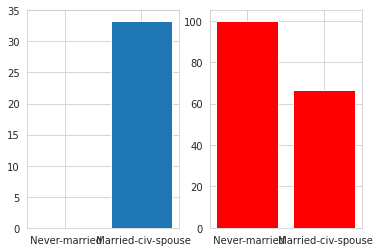

% of >50K income when Marital_status is  Widowed and Occupation is  Priv-house-serv = 4.545454545454546
% of >50K income when Marital_status is  Married-spouse-absent and Occupation is  Priv-house-serv = 0.0
% of >50K income when Marital_status is  Divorced and Occupation is  Priv-house-serv = 0.0
% of >50K income when Marital_status is  Never-married and Occupation is  Priv-house-serv = 0.0
% of >50K income when Marital_status is  Separated and Occupation is  Priv-house-serv = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Occupation is  Priv-house-serv = 0.0


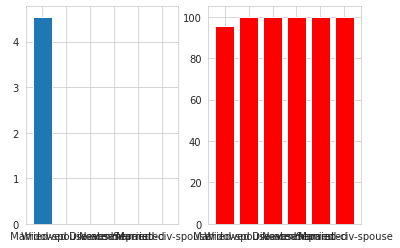

% of >50K income when Relationship is  Husband and Occupation is  Exec-managerial = 68.77000457247371
% of >50K income when Relationship is  Wife and Occupation is  Exec-managerial = 65.0
% of >50K income when Relationship is  Unmarried and Occupation is  Exec-managerial = 15.977961432506888
% of >50K income when Relationship is  Not-in-family and Occupation is  Exec-managerial = 23.612512613521695
% of >50K income when Relationship is  Own-child and Occupation is  Exec-managerial = 2.9535864978902953
% of >50K income when Relationship is  Other-relative and Occupation is  Exec-managerial = 18.75


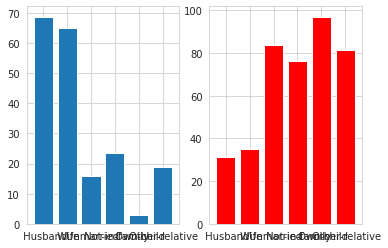

% of >50K income when Relationship is  Not-in-family and Occupation is  Handlers-cleaners = 1.6181229773462782
% of >50K income when Relationship is  Husband and Occupation is  Handlers-cleaners = 16.933638443935926
% of >50K income when Relationship is  Own-child and Occupation is  Handlers-cleaners = 0.23923444976076555
% of >50K income when Relationship is  Unmarried and Occupation is  Handlers-cleaners = 1.0101010101010102
% of >50K income when Relationship is  Other-relative and Occupation is  Handlers-cleaners = 1.098901098901099
% of >50K income when Relationship is  Wife and Occupation is  Handlers-cleaners = 25.0


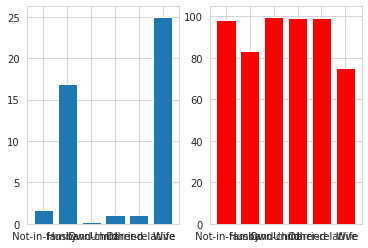

% of >50K income when Relationship is  Wife and Occupation is  Prof-specialty = 74.5928338762215
% of >50K income when Relationship is  Not-in-family and Occupation is  Prof-specialty = 20.61369000786782
% of >50K income when Relationship is  Husband and Occupation is  Prof-specialty = 70.73170731707317
% of >50K income when Relationship is  Own-child and Occupation is  Prof-specialty = 5.379746835443038
% of >50K income when Relationship is  Other-relative and Occupation is  Prof-specialty = 13.793103448275861
% of >50K income when Relationship is  Unmarried and Occupation is  Prof-specialty = 17.447916666666664


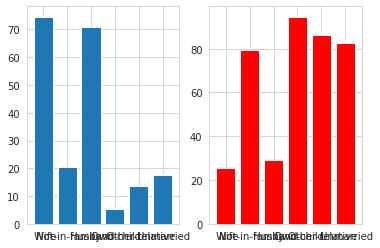

% of >50K income when Relationship is  Not-in-family and Occupation is  Other-service = 1.9730010384215992
% of >50K income when Relationship is  Unmarried and Occupation is  Other-service = 1.8115942028985508
% of >50K income when Relationship is  Husband and Occupation is  Other-service = 13.953488372093023
% of >50K income when Relationship is  Own-child and Occupation is  Other-service = 0.22446689113355783
% of >50K income when Relationship is  Wife and Occupation is  Other-service = 18.0327868852459
% of >50K income when Relationship is  Other-relative and Occupation is  Other-service = 0.5263157894736842


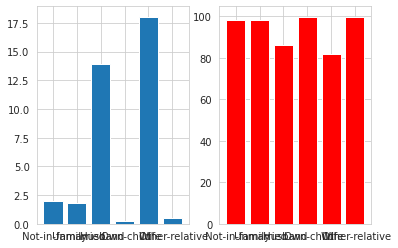

% of >50K income when Relationship is  Own-child and Occupation is  Adm-clerical = 1.2953367875647668
% of >50K income when Relationship is  Wife and Occupation is  Adm-clerical = 47.875354107648725
% of >50K income when Relationship is  Unmarried and Occupation is  Adm-clerical = 2.2941970310391366
% of >50K income when Relationship is  Husband and Occupation is  Adm-clerical = 43.09210526315789
% of >50K income when Relationship is  Not-in-family and Occupation is  Adm-clerical = 3.87263339070568
% of >50K income when Relationship is  Other-relative and Occupation is  Adm-clerical = 3.007518796992481


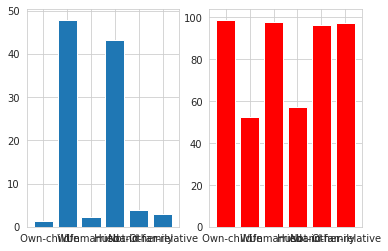

% of >50K income when Relationship is  Not-in-family and Occupation is  Sales = 12.372304199772985
% of >50K income when Relationship is  Husband and Occupation is  Sales = 52.191235059760956
% of >50K income when Relationship is  Own-child and Occupation is  Sales = 1.5492957746478873
% of >50K income when Relationship is  Wife and Occupation is  Sales = 36.15384615384615
% of >50K income when Relationship is  Other-relative and Occupation is  Sales = 3.8461538461538463
% of >50K income when Relationship is  Unmarried and Occupation is  Sales = 8.150470219435736


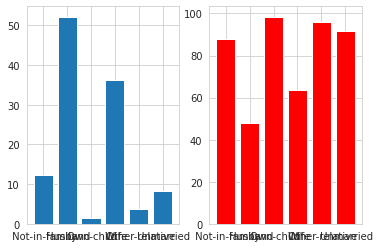

% of >50K income when Relationship is  Husband and Occupation is  Craft-repair = 32.576662684189564
% of >50K income when Relationship is  Own-child and Occupation is  Craft-repair = 3.1578947368421053
% of >50K income when Relationship is  Not-in-family and Occupation is  Craft-repair = 8.014354066985646
% of >50K income when Relationship is  Unmarried and Occupation is  Craft-repair = 6.882591093117409
% of >50K income when Relationship is  Other-relative and Occupation is  Craft-repair = 4.0
% of >50K income when Relationship is  Wife and Occupation is  Craft-repair = 44.0


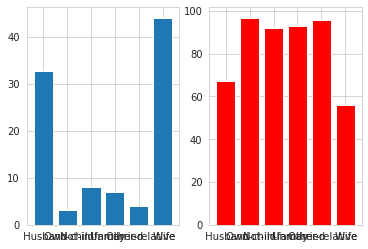

% of >50K income when Relationship is  Husband and Occupation is  Transport-moving = 29.235537190082646
% of >50K income when Relationship is  Unmarried and Occupation is  Transport-moving = 8.0
% of >50K income when Relationship is  Other-relative and Occupation is  Transport-moving = 6.666666666666667
% of >50K income when Relationship is  Not-in-family and Occupation is  Transport-moving = 6.349206349206349
% of >50K income when Relationship is  Own-child and Occupation is  Transport-moving = 0.0
% of >50K income when Relationship is  Wife and Occupation is  Transport-moving = 41.17647058823529


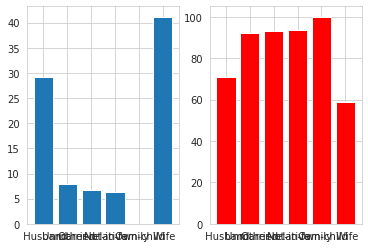

% of >50K income when Relationship is  Own-child and Occupation is  Farming-fishing = 0.6756756756756757
% of >50K income when Relationship is  Husband and Occupation is  Farming-fishing = 18.231046931407942
% of >50K income when Relationship is  Not-in-family and Occupation is  Farming-fishing = 6.0109289617486334
% of >50K income when Relationship is  Unmarried and Occupation is  Farming-fishing = 1.5873015873015872
% of >50K income when Relationship is  Wife and Occupation is  Farming-fishing = 0.0
% of >50K income when Relationship is  Other-relative and Occupation is  Farming-fishing = 3.225806451612903


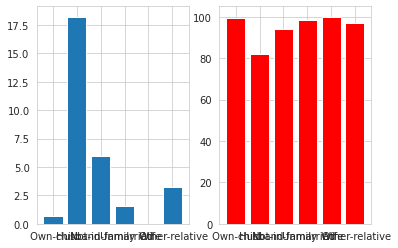

% of >50K income when Relationship is  Unmarried and Occupation is  Machine-op-inspct = 0.8733624454148471
% of >50K income when Relationship is  Own-child and Occupation is  Machine-op-inspct = 0.38022813688212925
% of >50K income when Relationship is  Husband and Occupation is  Machine-op-inspct = 24.9718785151856
% of >50K income when Relationship is  Not-in-family and Occupation is  Machine-op-inspct = 1.735357917570499
% of >50K income when Relationship is  Wife and Occupation is  Machine-op-inspct = 20.238095238095237
% of >50K income when Relationship is  Other-relative and Occupation is  Machine-op-inspct = 0.0


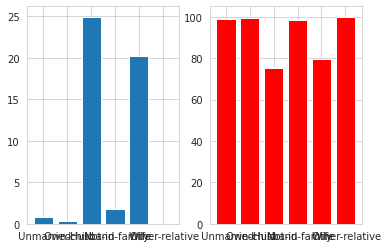

% of >50K income when Relationship is  Unmarried and Occupation is  Tech-support = 6.862745098039216
% of >50K income when Relationship is  Husband and Occupation is  Tech-support = 60.285714285714285
% of >50K income when Relationship is  Not-in-family and Occupation is  Tech-support = 10.915492957746478
% of >50K income when Relationship is  Own-child and Occupation is  Tech-support = 1.6666666666666667
% of >50K income when Relationship is  Other-relative and Occupation is  Tech-support = 8.695652173913043
% of >50K income when Relationship is  Wife and Occupation is  Tech-support = 61.224489795918366


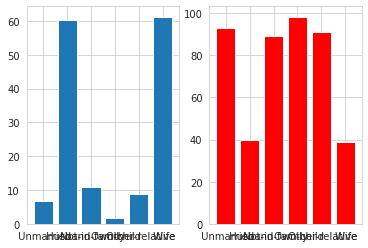

% of >50K income when Relationship is  Husband and Occupation is  ? = 26.380368098159508
% of >50K income when Relationship is  Not-in-family and Occupation is  ? = 4.090909090909091
% of >50K income when Relationship is  Own-child and Occupation is  ? = 0.1841620626151013
% of >50K income when Relationship is  Wife and Occupation is  ? = 30.075187969924812
% of >50K income when Relationship is  Unmarried and Occupation is  ? = 1.1428571428571428
% of >50K income when Relationship is  Other-relative and Occupation is  ? = 1.5873015873015872


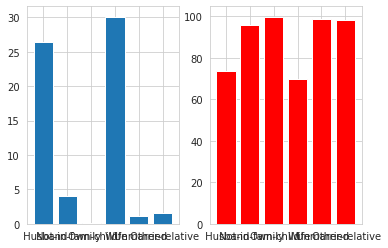

% of >50K income when Relationship is  Not-in-family and Occupation is  Protective-serv = 19.28571428571429
% of >50K income when Relationship is  Husband and Occupation is  Protective-serv = 48.11827956989247
% of >50K income when Relationship is  Unmarried and Occupation is  Protective-serv = 2.7027027027027026
% of >50K income when Relationship is  Own-child and Occupation is  Protective-serv = 2.5
% of >50K income when Relationship is  Other-relative and Occupation is  Protective-serv = 0.0
% of >50K income when Relationship is  Wife and Occupation is  Protective-serv = 28.57142857142857


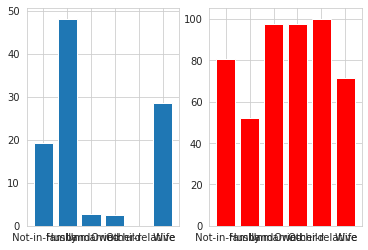

% of >50K income when Relationship is  Own-child and Occupation is  Armed-Forces = 0.0
% of >50K income when Relationship is  Not-in-family and Occupation is  Armed-Forces = 0.0
% of >50K income when Relationship is  Husband and Occupation is  Armed-Forces = 50.0
% of >50K income when Relationship is  Other-relative and Occupation is  Armed-Forces = 0.0


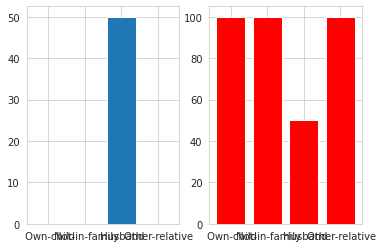

% of >50K income when Relationship is  Not-in-family and Occupation is  Priv-house-serv = 0.0
% of >50K income when Relationship is  Unmarried and Occupation is  Priv-house-serv = 2.857142857142857
% of >50K income when Relationship is  Own-child and Occupation is  Priv-house-serv = 0.0
% of >50K income when Relationship is  Other-relative and Occupation is  Priv-house-serv = 0.0
% of >50K income when Relationship is  Wife and Occupation is  Priv-house-serv = 0.0


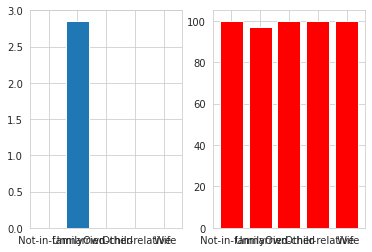

% of >50K income when Race is  White and Occupation is  Exec-managerial = 49.86286341195831
% of >50K income when Race is  Black and Occupation is  Exec-managerial = 34.42622950819672
% of >50K income when Race is  Other and Occupation is  Exec-managerial = 18.181818181818183
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Exec-managerial = 45.18518518518518
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Exec-managerial = 10.0


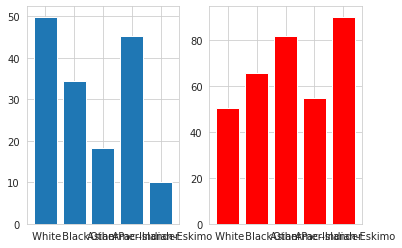

% of >50K income when Race is  White and Occupation is  Handlers-cleaners = 6.525573192239858
% of >50K income when Race is  Black and Occupation is  Handlers-cleaners = 6.145251396648044
% of >50K income when Race is  Other and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Handlers-cleaners = 4.3478260869565215


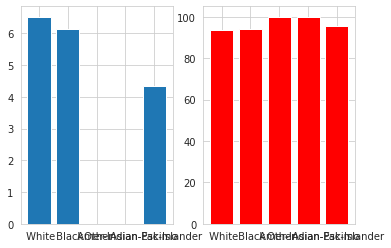

% of >50K income when Race is  Black and Occupation is  Prof-specialty = 27.615062761506277
% of >50K income when Race is  White and Occupation is  Prof-specialty = 46.06956998082717
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Prof-specialty = 48.924731182795696
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Prof-specialty = 33.33333333333333
% of >50K income when Race is  Other and Occupation is  Prof-specialty = 29.03225806451613


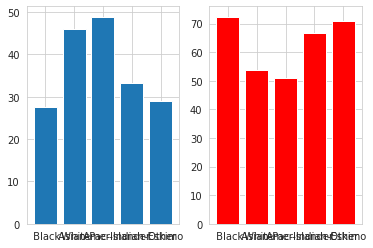

% of >50K income when Race is  Black and Occupation is  Other-service = 2.9772329246935203
% of >50K income when Race is  White and Occupation is  Other-service = 4.003170828378914
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Other-service = 13.28125
% of >50K income when Race is  Other and Occupation is  Other-service = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Other-service = 6.0606060606060606


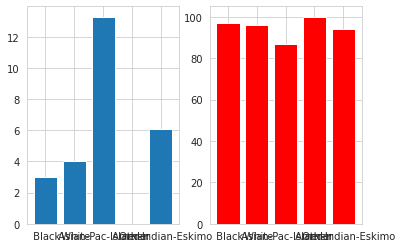

% of >50K income when Race is  White and Occupation is  Adm-clerical = 14.239377229970806
% of >50K income when Race is  Black and Occupation is  Adm-clerical = 8.571428571428571
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Adm-clerical = 15.827338129496402
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Adm-clerical = 9.67741935483871
% of >50K income when Race is  Other and Occupation is  Adm-clerical = 3.8461538461538463


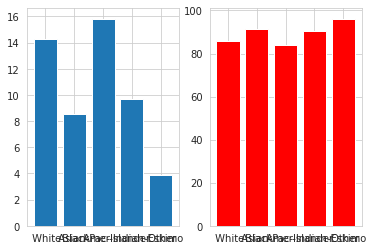

% of >50K income when Race is  Black and Occupation is  Sales = 12.204724409448819
% of >50K income when Race is  White and Occupation is  Sales = 28.544949026876736
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Sales = 19.444444444444446
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Sales = 15.384615384615385
% of >50K income when Race is  Other and Occupation is  Sales = 12.0


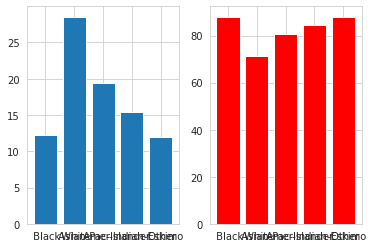

% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Craft-repair = 28.08988764044944
% of >50K income when Race is  White and Occupation is  Craft-repair = 22.847861396859773
% of >50K income when Race is  Black and Occupation is  Craft-repair = 20.081967213114755
% of >50K income when Race is  Other and Occupation is  Craft-repair = 17.857142857142858
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Craft-repair = 13.636363636363635


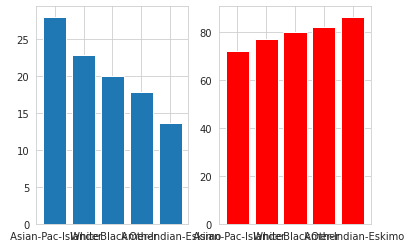

% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Transport-moving = 12.0
% of >50K income when Race is  White and Occupation is  Transport-moving = 21.61764705882353
% of >50K income when Race is  Black and Occupation is  Transport-moving = 10.588235294117647
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Transport-moving = 14.285714285714285
% of >50K income when Race is  Other and Occupation is  Transport-moving = 7.142857142857142


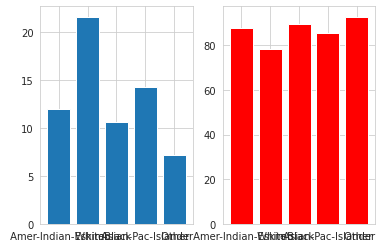

% of >50K income when Race is  White and Occupation is  Farming-fishing = 12.349726775956285
% of >50K income when Race is  Black and Occupation is  Farming-fishing = 0.0
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Farming-fishing = 12.5
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Farming-fishing = 0.0
% of >50K income when Race is  Other and Occupation is  Farming-fishing = 0.0


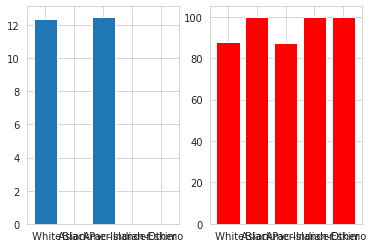

% of >50K income when Race is  White and Occupation is  Machine-op-inspct = 13.469894475481068
% of >50K income when Race is  Black and Occupation is  Machine-op-inspct = 8.02919708029197
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Machine-op-inspct = 16.94915254237288
% of >50K income when Race is  Other and Occupation is  Machine-op-inspct = 2.564102564102564
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Machine-op-inspct = 0.0


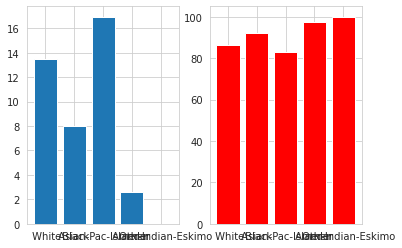

% of >50K income when Race is  White and Occupation is  Tech-support = 32.00992555831266
% of >50K income when Race is  Black and Occupation is  Tech-support = 18.30985915492958
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Tech-support = 27.27272727272727
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Tech-support = 0.0
% of >50K income when Race is  Other and Occupation is  Tech-support = 0.0


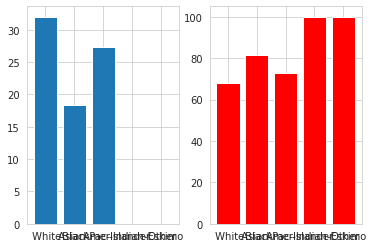

% of >50K income when Race is  Asian-Pac-Islander and Occupation is  ? = 7.6923076923076925
% of >50K income when Race is  White and Occupation is  ? = 11.41914191419142
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  ? = 8.0
% of >50K income when Race is  Black and Occupation is  ? = 4.186046511627907
% of >50K income when Race is  Other and Occupation is  ? = 8.695652173913043


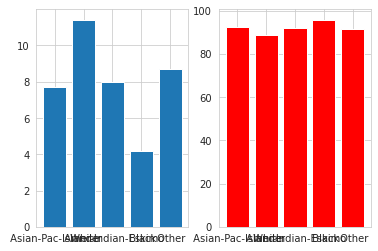

% of >50K income when Race is  White and Occupation is  Protective-serv = 34.296724470134876
% of >50K income when Race is  Black and Occupation is  Protective-serv = 24.509803921568626
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Protective-serv = 33.33333333333333
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Protective-serv = 25.0
% of >50K income when Race is  Other and Occupation is  Protective-serv = 20.0


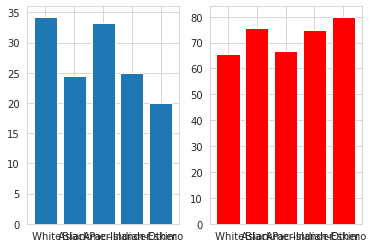

% of >50K income when Race is  White and Occupation is  Armed-Forces = 14.285714285714285
% of >50K income when Race is  Black and Occupation is  Armed-Forces = 0.0
% of >50K income when Race is  Amer-Indian-Eskimo and Occupation is  Armed-Forces = 0.0


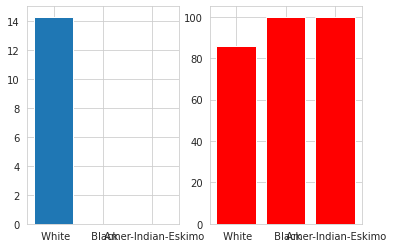

% of >50K income when Race is  Black and Occupation is  Priv-house-serv = 0.0
% of >50K income when Race is  White and Occupation is  Priv-house-serv = 0.8771929824561403
% of >50K income when Race is  Asian-Pac-Islander and Occupation is  Priv-house-serv = 0.0
% of >50K income when Race is  Other and Occupation is  Priv-house-serv = 0.0


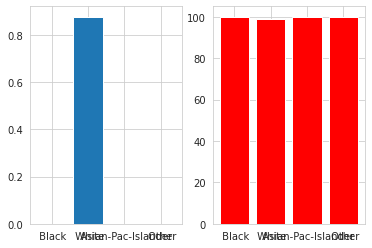

% of >50K income when Sex is  Male and Occupation is  Exec-managerial = 58.06673546611627
% of >50K income when Sex is  Female and Occupation is  Exec-managerial = 24.158757549611735


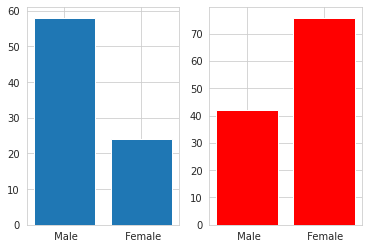

% of >50K income when Sex is  Male and Occupation is  Handlers-cleaners = 6.799336650082918
% of >50K income when Sex is  Female and Occupation is  Handlers-cleaners = 2.4390243902439024


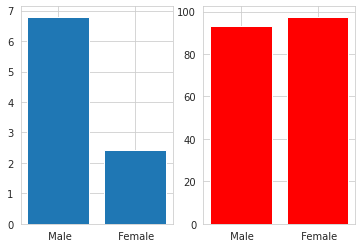

% of >50K income when Sex is  Female and Occupation is  Prof-specialty = 25.412541254125415
% of >50K income when Sex is  Male and Occupation is  Prof-specialty = 56.15238095238095


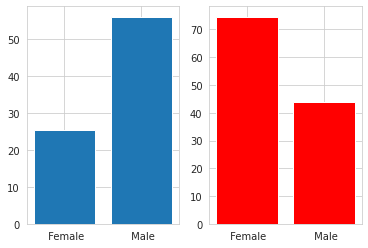

% of >50K income when Sex is  Female and Occupation is  Other-service = 2.833333333333333
% of >50K income when Sex is  Male and Occupation is  Other-service = 5.752508361204013


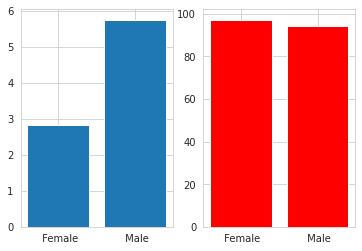

% of >50K income when Sex is  Female and Occupation is  Adm-clerical = 8.356326369728025
% of >50K income when Sex is  Male and Occupation is  Adm-clerical = 23.944805194805195


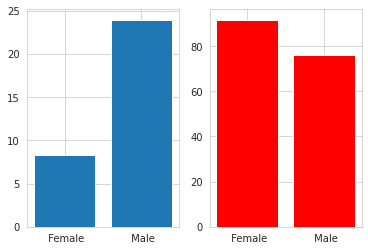

% of >50K income when Sex is  Male and Occupation is  Sales = 37.49476330121491
% of >50K income when Sex is  Female and Occupation is  Sales = 6.967537608867776


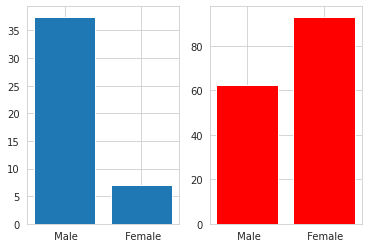

% of >50K income when Sex is  Male and Occupation is  Craft-repair = 23.445963373742586
% of >50K income when Sex is  Female and Occupation is  Craft-repair = 9.00900900900901


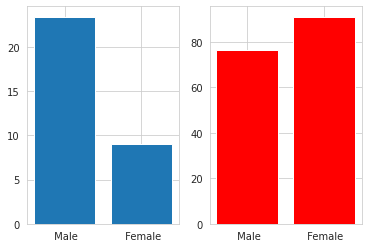

% of >50K income when Sex is  Male and Occupation is  Transport-moving = 20.637027206370274
% of >50K income when Sex is  Female and Occupation is  Transport-moving = 10.0


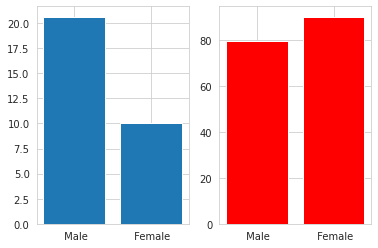

% of >50K income when Sex is  Male and Occupation is  Farming-fishing = 12.16361679224973
% of >50K income when Sex is  Female and Occupation is  Farming-fishing = 3.076923076923077


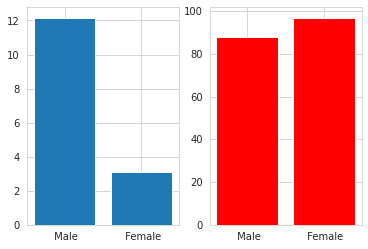

% of >50K income when Sex is  Male and Occupation is  Machine-op-inspct = 15.84022038567493
% of >50K income when Sex is  Female and Occupation is  Machine-op-inspct = 3.6363636363636362


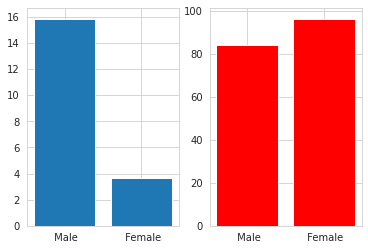

% of >50K income when Sex is  Female and Occupation is  Tech-support = 12.931034482758621
% of >50K income when Sex is  Male and Occupation is  Tech-support = 41.03448275862069


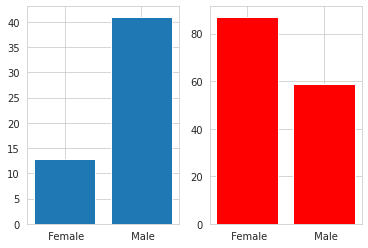

% of >50K income when Sex is  Male and Occupation is  ? = 13.872255489021956
% of >50K income when Sex is  Female and Occupation is  ? = 6.183115338882283


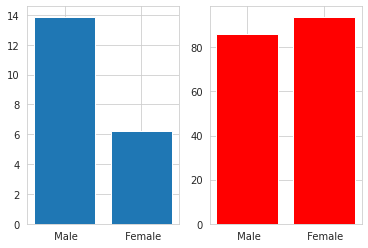

% of >50K income when Sex is  Male and Occupation is  Protective-serv = 35.07853403141361
% of >50K income when Sex is  Female and Occupation is  Protective-serv = 13.157894736842104


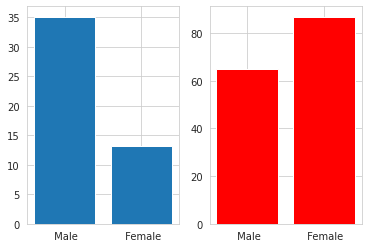

% of >50K income when Sex is  Male and Occupation is  Armed-Forces = 11.11111111111111


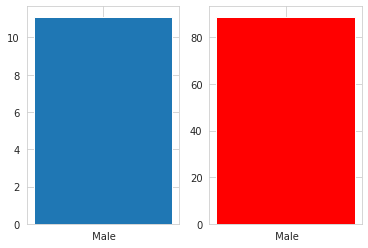

% of >50K income when Sex is  Female and Occupation is  Priv-house-serv = 0.7092198581560284
% of >50K income when Sex is  Male and Occupation is  Priv-house-serv = 0.0


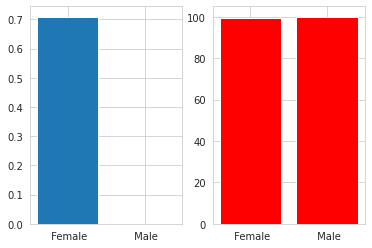

% of >50K income when Native_country is  United-States and Occupation is  Exec-managerial = 48.674698795180724
% of >50K income when Native_country is  England and Occupation is  Exec-managerial = 50.0
% of >50K income when Native_country is  Germany and Occupation is  Exec-managerial = 36.84210526315789
% of >50K income when Native_country is  Philippines and Occupation is  Exec-managerial = 38.46153846153847
% of >50K income when Native_country is  Iran and Occupation is  Exec-managerial = 50.0
% of >50K income when Native_country is  Thailand and Occupation is  Exec-managerial = 50.0
% of >50K income when Native_country is  Taiwan and Occupation is  Exec-managerial = 54.54545454545454
% of >50K income when Native_country is  ? and Occupation is  Exec-managerial = 41.891891891891895
% of >50K income when Native_country is  Dominican-Republic and Occupation is  Exec-managerial = 0.0
% of >50K income when Native_country is  India and Occupation is  Exec-managerial = 80.0
% of >50K inco

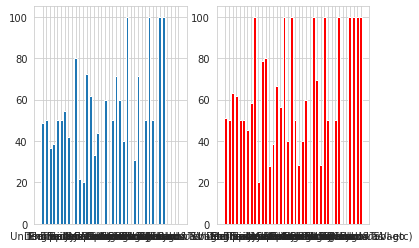

% of >50K income when Native_country is  United-States and Occupation is  Handlers-cleaners = 6.139613120269134
% of >50K income when Native_country is  Puerto-Rico and Occupation is  Handlers-cleaners = 25.0
% of >50K income when Native_country is  Dominican-Republic and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Native_country is  El-Salvador and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Native_country is  Canada and Occupation is  Handlers-cleaners = 50.0
% of >50K income when Native_country is  ? and Occupation is  Handlers-cleaners = 15.0
% of >50K income when Native_country is  Mexico and Occupation is  Handlers-cleaners = 1.4285714285714286
% of >50K income when Native_country is  Portugal and Occupation is  Handlers-cleaners = 0.0
% of >50K income when Native_country is  Guatemala and Occupation is  Handlers-cleaners = 11.11111111111111
% of >50K income when Native_country is  Ireland and Occupation is  Handlers-cleaners = 0.0
% of >50K inco

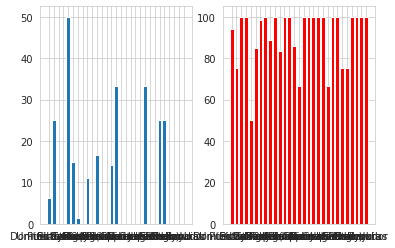

% of >50K income when Native_country is  Cuba and Occupation is  Prof-specialty = 54.54545454545454
% of >50K income when Native_country is  United-States and Occupation is  Prof-specialty = 44.679122664500404
% of >50K income when Native_country is  India and Occupation is  Prof-specialty = 62.5
% of >50K income when Native_country is  Honduras and Occupation is  Prof-specialty = 100.0
% of >50K income when Native_country is  Iran and Occupation is  Prof-specialty = 66.66666666666666
% of >50K income when Native_country is  Germany and Occupation is  Prof-specialty = 46.875
% of >50K income when Native_country is  Canada and Occupation is  Prof-specialty = 33.33333333333333
% of >50K income when Native_country is  Taiwan and Occupation is  Prof-specialty = 61.904761904761905
% of >50K income when Native_country is  Poland and Occupation is  Prof-specialty = 57.14285714285714
% of >50K income when Native_country is  ? and Occupation is  Prof-specialty = 47.05882352941176
% of >50K inco

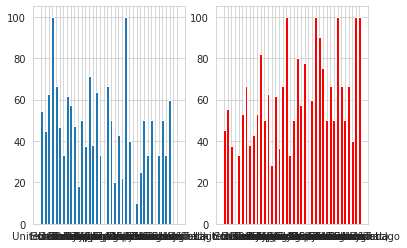

% of >50K income when Native_country is  Jamaica and Occupation is  Other-service = 5.0
% of >50K income when Native_country is  United-States and Occupation is  Other-service = 3.8170687792581925
% of >50K income when Native_country is  ? and Occupation is  Other-service = 6.024096385542169
% of >50K income when Native_country is  Puerto-Rico and Occupation is  Other-service = 0.0
% of >50K income when Native_country is  Mexico and Occupation is  Other-service = 2.4390243902439024
% of >50K income when Native_country is  Cuba and Occupation is  Other-service = 7.6923076923076925
% of >50K income when Native_country is  Canada and Occupation is  Other-service = 8.333333333333332
% of >50K income when Native_country is  Iran and Occupation is  Other-service = 25.0
% of >50K income when Native_country is  El-Salvador and Occupation is  Other-service = 2.5
% of >50K income when Native_country is  France and Occupation is  Other-service = 0.0
% of >50K income when Native_country is  Italy 

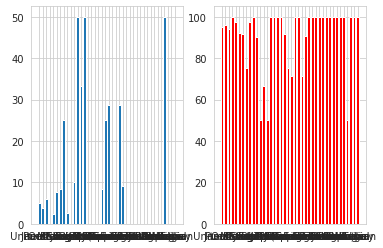

% of >50K income when Native_country is  United-States and Occupation is  Adm-clerical = 13.2830626450116
% of >50K income when Native_country is  Mexico and Occupation is  Adm-clerical = 2.7777777777777777
% of >50K income when Native_country is  Columbia and Occupation is  Adm-clerical = 0.0
% of >50K income when Native_country is  ? and Occupation is  Adm-clerical = 18.367346938775512
% of >50K income when Native_country is  Laos and Occupation is  Adm-clerical = 25.0
% of >50K income when Native_country is  Philippines and Occupation is  Adm-clerical = 38.88888888888889
% of >50K income when Native_country is  Honduras and Occupation is  Adm-clerical = 0.0
% of >50K income when Native_country is  India and Occupation is  Adm-clerical = 9.090909090909092
% of >50K income when Native_country is  England and Occupation is  Adm-clerical = 14.285714285714285
% of >50K income when Native_country is  Italy and Occupation is  Adm-clerical = 62.5
% of >50K income when Native_country is  Jam

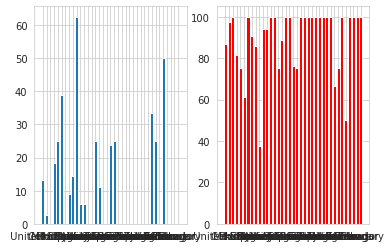

% of >50K income when Native_country is  United-States and Occupation is  Sales = 27.586206896551722
% of >50K income when Native_country is  ? and Occupation is  Sales = 19.696969696969695
% of >50K income when Native_country is  Poland and Occupation is  Sales = 0.0
% of >50K income when Native_country is  Haiti and Occupation is  Sales = 0.0
% of >50K income when Native_country is  Cuba and Occupation is  Sales = 30.0
% of >50K income when Native_country is  Germany and Occupation is  Sales = 23.076923076923077
% of >50K income when Native_country is  China and Occupation is  Sales = 20.0
% of >50K income when Native_country is  India and Occupation is  Sales = 7.142857142857142
% of >50K income when Native_country is  Canada and Occupation is  Sales = 66.66666666666666
% of >50K income when Native_country is  Taiwan and Occupation is  Sales = 0.0
% of >50K income when Native_country is  Mexico and Occupation is  Sales = 16.666666666666664
% of >50K income when Native_country is  It

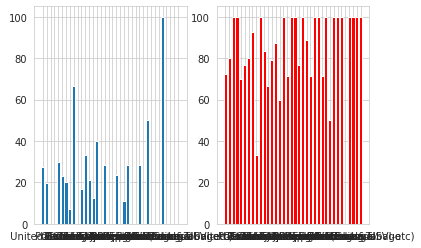

% of >50K income when Native_country is  ? and Occupation is  Craft-repair = 30.434782608695656
% of >50K income when Native_country is  United-States and Occupation is  Craft-repair = 23.337856173677068
% of >50K income when Native_country is  Ecuador and Occupation is  Craft-repair = 25.0
% of >50K income when Native_country is  Portugal and Occupation is  Craft-repair = 8.333333333333332
% of >50K income when Native_country is  Philippines and Occupation is  Craft-repair = 35.714285714285715
% of >50K income when Native_country is  Mexico and Occupation is  Craft-repair = 7.000000000000001
% of >50K income when Native_country is  Haiti and Occupation is  Craft-repair = 25.0
% of >50K income when Native_country is  Japan and Occupation is  Craft-repair = 14.285714285714285
% of >50K income when Native_country is  Iran and Occupation is  Craft-repair = 33.33333333333333
% of >50K income when Native_country is  Dominican-Republic and Occupation is  Craft-repair = 0.0
% of >50K income w

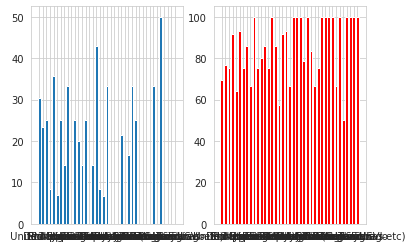

% of >50K income when Native_country is  Mexico and Occupation is  Transport-moving = 10.0
% of >50K income when Native_country is  United-States and Occupation is  Transport-moving = 20.4560697518444
% of >50K income when Native_country is  Cuba and Occupation is  Transport-moving = 12.5
% of >50K income when Native_country is  ? and Occupation is  Transport-moving = 4.0
% of >50K income when Native_country is  Puerto-Rico and Occupation is  Transport-moving = 0.0
% of >50K income when Native_country is  Canada and Occupation is  Transport-moving = 37.5
% of >50K income when Native_country is  Italy and Occupation is  Transport-moving = 100.0
% of >50K income when Native_country is  Vietnam and Occupation is  Transport-moving = 0.0
% of >50K income when Native_country is  Haiti and Occupation is  Transport-moving = 0.0
% of >50K income when Native_country is  Germany and Occupation is  Transport-moving = 33.33333333333333
% of >50K income when Native_country is  El-Salvador and Occupa

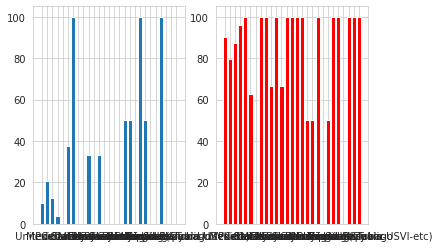

% of >50K income when Native_country is  United-States and Occupation is  Farming-fishing = 12.627986348122866
% of >50K income when Native_country is  Cambodia and Occupation is  Farming-fishing = 100.0
% of >50K income when Native_country is  Poland and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  Guatemala and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  Mexico and Occupation is  Farming-fishing = 2.5974025974025974
% of >50K income when Native_country is  England and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  ? and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  Philippines and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  Italy and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  Puerto-Rico and Occupation is  Farming-fishing = 0.0
% of >50K income when Native_country is  Vietnam and Occupati

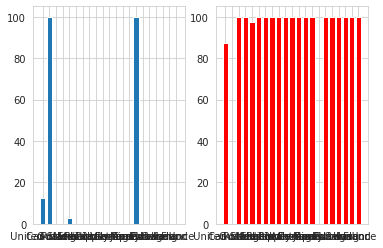

% of >50K income when Native_country is  United-States and Occupation is  Machine-op-inspct = 13.278008298755188
% of >50K income when Native_country is  Puerto-Rico and Occupation is  Machine-op-inspct = 0.0
% of >50K income when Native_country is  Mexico and Occupation is  Machine-op-inspct = 3.260869565217391
% of >50K income when Native_country is  ? and Occupation is  Machine-op-inspct = 13.88888888888889
% of >50K income when Native_country is  Dominican-Republic and Occupation is  Machine-op-inspct = 0.0
% of >50K income when Native_country is  Germany and Occupation is  Machine-op-inspct = 40.0
% of >50K income when Native_country is  Peru and Occupation is  Machine-op-inspct = 0.0
% of >50K income when Native_country is  China and Occupation is  Machine-op-inspct = 0.0
% of >50K income when Native_country is  Trinadad&Tobago and Occupation is  Machine-op-inspct = 0.0
% of >50K income when Native_country is  Guatemala and Occupation is  Machine-op-inspct = 0.0
% of >50K income 

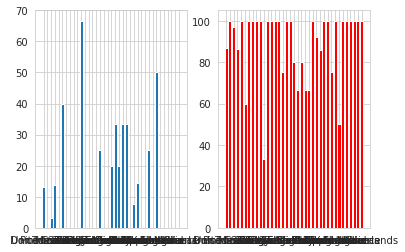

% of >50K income when Native_country is  United-States and Occupation is  Tech-support = 30.23529411764706
% of >50K income when Native_country is  Canada and Occupation is  Tech-support = 66.66666666666666
% of >50K income when Native_country is  Germany and Occupation is  Tech-support = 50.0
% of >50K income when Native_country is  Poland and Occupation is  Tech-support = 0.0
% of >50K income when Native_country is  Guatemala and Occupation is  Tech-support = 100.0
% of >50K income when Native_country is  England and Occupation is  Tech-support = 50.0
% of >50K income when Native_country is  ? and Occupation is  Tech-support = 31.25
% of >50K income when Native_country is  Ecuador and Occupation is  Tech-support = 0.0
% of >50K income when Native_country is  Philippines and Occupation is  Tech-support = 28.57142857142857
% of >50K income when Native_country is  Mexico and Occupation is  Tech-support = 0.0
% of >50K income when Native_country is  Jamaica and Occupation is  Tech-suppor

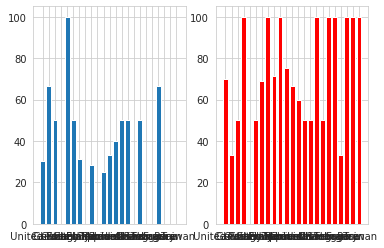

% of >50K income when Native_country is  South and Occupation is  ? = 22.22222222222222
% of >50K income when Native_country is  ? and Occupation is  ? = 14.814814814814813
% of >50K income when Native_country is  United-States and Occupation is  ? = 10.56422569027611
% of >50K income when Native_country is  Italy and Occupation is  ? = 20.0
% of >50K income when Native_country is  Canada and Occupation is  ? = 21.428571428571427
% of >50K income when Native_country is  China and Occupation is  ? = 0.0
% of >50K income when Native_country is  Jamaica and Occupation is  ? = 0.0
% of >50K income when Native_country is  Haiti and Occupation is  ? = 0.0
% of >50K income when Native_country is  Honduras and Occupation is  ? = 0.0
% of >50K income when Native_country is  Germany and Occupation is  ? = 0.0
% of >50K income when Native_country is  Philippines and Occupation is  ? = 10.0
% of >50K income when Native_country is  Mexico and Occupation is  ? = 0.0
% of >50K income when Native_coun

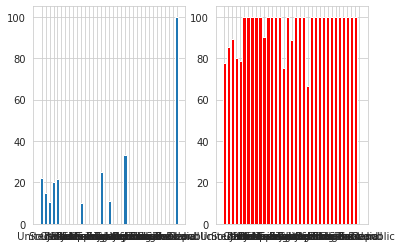

% of >50K income when Native_country is  United-States and Occupation is  Protective-serv = 33.4983498349835
% of >50K income when Native_country is  Portugal and Occupation is  Protective-serv = 0.0
% of >50K income when Native_country is  Cuba and Occupation is  Protective-serv = 0.0
% of >50K income when Native_country is  Haiti and Occupation is  Protective-serv = 0.0
% of >50K income when Native_country is  England and Occupation is  Protective-serv = 33.33333333333333
% of >50K income when Native_country is  ? and Occupation is  Protective-serv = 20.0
% of >50K income when Native_country is  Japan and Occupation is  Protective-serv = 0.0
% of >50K income when Native_country is  Mexico and Occupation is  Protective-serv = 25.0
% of >50K income when Native_country is  Germany and Occupation is  Protective-serv = 0.0
% of >50K income when Native_country is  Canada and Occupation is  Protective-serv = 0.0
% of >50K income when Native_country is  Dominican-Republic and Occupation is  

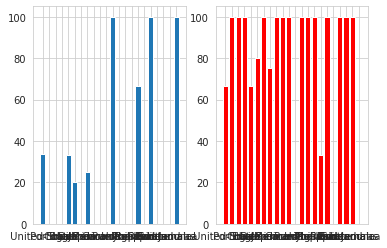

% of >50K income when Native_country is  United-States and Occupation is  Armed-Forces = 11.11111111111111


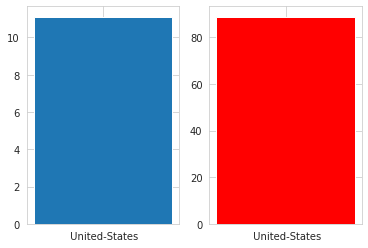

% of >50K income when Native_country is  United-States and Occupation is  Priv-house-serv = 1.1111111111111112
% of >50K income when Native_country is  Guatemala and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  ? and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  Mexico and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  El-Salvador and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  Ecuador and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  France and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  Cuba and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  Jamaica and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  Thailand and Occupation is  Priv-house-serv = 0.0
% of >50K income when Native_country is  England and Occupation is  Priv-house-serv

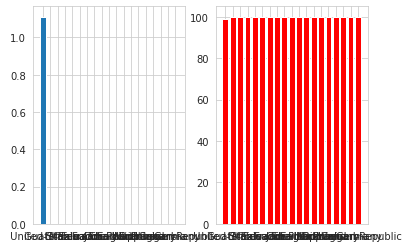

% of >50K income when age_cat is 4 and Occupation is  Exec-managerial = 59.2094196804037
% of >50K income when age_cat is 3 and Occupation is  Exec-managerial = 48.54771784232365
% of >50K income when age_cat is 5 and Occupation is  Exec-managerial = 62.4441132637854
% of >50K income when age_cat is 2 and Occupation is  Exec-managerial = 18.155619596541786
% of >50K income when age_cat is 6 and Occupation is  Exec-managerial = 46.52777777777778
% of >50K income when age_cat is 1 and Occupation is  Exec-managerial = 0.0


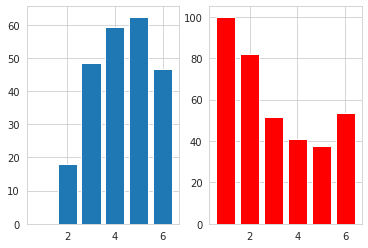

% of >50K income when age_cat is 3 and Occupation is  Handlers-cleaners = 8.91089108910891
% of >50K income when age_cat is 5 and Occupation is  Handlers-cleaners = 15.294117647058824
% of >50K income when age_cat is 2 and Occupation is  Handlers-cleaners = 2.5041736227045077
% of >50K income when age_cat is 4 and Occupation is  Handlers-cleaners = 13.186813186813188
% of >50K income when age_cat is 1 and Occupation is  Handlers-cleaners = 0.0
% of >50K income when age_cat is 6 and Occupation is  Handlers-cleaners = 15.217391304347828


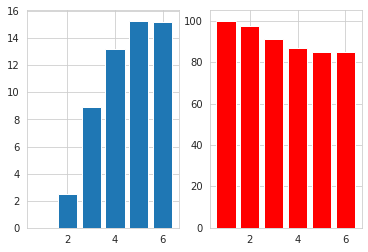

% of >50K income when age_cat is 2 and Occupation is  Prof-specialty = 17.15526601520087
% of >50K income when age_cat is 3 and Occupation is  Prof-specialty = 50.452674897119344
% of >50K income when age_cat is 4 and Occupation is  Prof-specialty = 55.7476231633535
% of >50K income when age_cat is 5 and Occupation is  Prof-specialty = 58.37837837837838
% of >50K income when age_cat is 1 and Occupation is  Prof-specialty = 0.0
% of >50K income when age_cat is 6 and Occupation is  Prof-specialty = 46.8503937007874


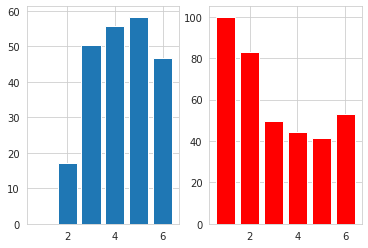

% of >50K income when age_cat is 4 and Occupation is  Other-service = 8.842105263157894
% of >50K income when age_cat is 5 and Occupation is  Other-service = 6.58682634730539
% of >50K income when age_cat is 2 and Occupation is  Other-service = 2.1718602455146363
% of >50K income when age_cat is 1 and Occupation is  Other-service = 0.22371364653243847
% of >50K income when age_cat is 3 and Occupation is  Other-service = 5.366492146596859
% of >50K income when age_cat is 6 and Occupation is  Other-service = 3.7037037037037033


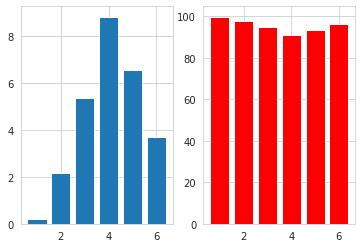

% of >50K income when age_cat is 2 and Occupation is  Adm-clerical = 4.303599374021909
% of >50K income when age_cat is 1 and Occupation is  Adm-clerical = 0.0
% of >50K income when age_cat is 4 and Occupation is  Adm-clerical = 23.41269841269841
% of >50K income when age_cat is 5 and Occupation is  Adm-clerical = 20.19002375296912
% of >50K income when age_cat is 3 and Occupation is  Adm-clerical = 17.595628415300546
% of >50K income when age_cat is 6 and Occupation is  Adm-clerical = 13.24200913242009


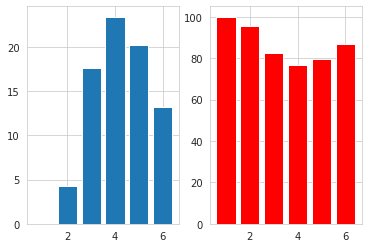

% of >50K income when age_cat is 3 and Occupation is  Sales = 36.717827626918535
% of >50K income when age_cat is 2 and Occupation is  Sales = 8.317757009345794
% of >50K income when age_cat is 1 and Occupation is  Sales = 0.0
% of >50K income when age_cat is 5 and Occupation is  Sales = 41.00877192982456
% of >50K income when age_cat is 6 and Occupation is  Sales = 32.677165354330704
% of >50K income when age_cat is 4 and Occupation is  Sales = 44.14668547249647


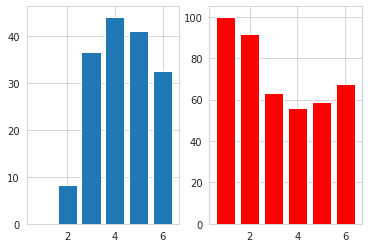

% of >50K income when age_cat is 3 and Occupation is  Craft-repair = 21.647940074906366
% of >50K income when age_cat is 1 and Occupation is  Craft-repair = 0.0
% of >50K income when age_cat is 4 and Occupation is  Craft-repair = 33.952528379772964
% of >50K income when age_cat is 2 and Occupation is  Craft-repair = 7.661290322580645
% of >50K income when age_cat is 6 and Occupation is  Craft-repair = 17.307692307692307
% of >50K income when age_cat is 5 and Occupation is  Craft-repair = 36.11111111111111


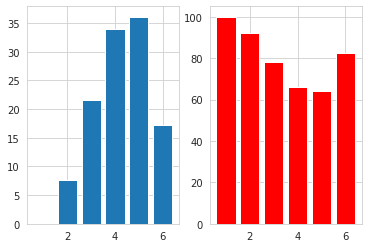

% of >50K income when age_cat is 3 and Occupation is  Transport-moving = 18.181818181818183
% of >50K income when age_cat is 4 and Occupation is  Transport-moving = 27.083333333333332
% of >50K income when age_cat is 2 and Occupation is  Transport-moving = 9.283819628647215
% of >50K income when age_cat is 5 and Occupation is  Transport-moving = 31.782945736434108
% of >50K income when age_cat is 6 and Occupation is  Transport-moving = 17.0
% of >50K income when age_cat is 1 and Occupation is  Transport-moving = 0.0


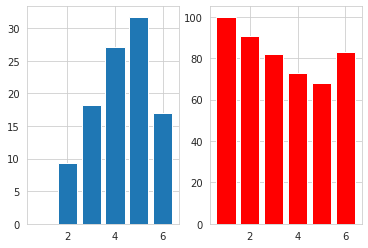

% of >50K income when age_cat is 2 and Occupation is  Farming-fishing = 2.643171806167401
% of >50K income when age_cat is 3 and Occupation is  Farming-fishing = 10.483870967741936
% of >50K income when age_cat is 6 and Occupation is  Farming-fishing = 13.178294573643413
% of >50K income when age_cat is 4 and Occupation is  Farming-fishing = 20.618556701030926
% of >50K income when age_cat is 1 and Occupation is  Farming-fishing = 0.0
% of >50K income when age_cat is 5 and Occupation is  Farming-fishing = 17.449664429530202


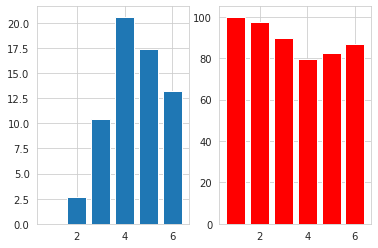

% of >50K income when age_cat is 3 and Occupation is  Machine-op-inspct = 16.34782608695652
% of >50K income when age_cat is 4 and Occupation is  Machine-op-inspct = 18.021978021978022
% of >50K income when age_cat is 2 and Occupation is  Machine-op-inspct = 3.9669421487603307
% of >50K income when age_cat is 5 and Occupation is  Machine-op-inspct = 17.959183673469386
% of >50K income when age_cat is 1 and Occupation is  Machine-op-inspct = 0.0
% of >50K income when age_cat is 6 and Occupation is  Machine-op-inspct = 8.21917808219178


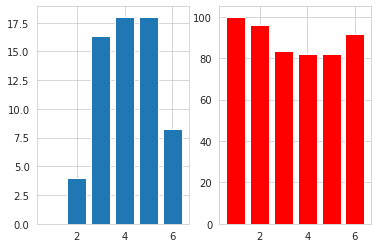

% of >50K income when age_cat is 5 and Occupation is  Tech-support = 56.86274509803921
% of >50K income when age_cat is 2 and Occupation is  Tech-support = 10.355987055016183
% of >50K income when age_cat is 4 and Occupation is  Tech-support = 47.0873786407767
% of >50K income when age_cat is 6 and Occupation is  Tech-support = 37.93103448275862
% of >50K income when age_cat is 3 and Occupation is  Tech-support = 31.365313653136536
% of >50K income when age_cat is 1 and Occupation is  Tech-support = 0.0


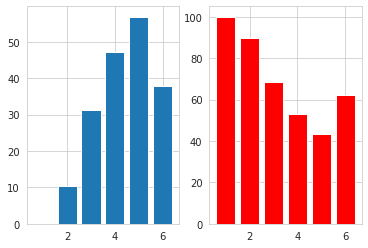

% of >50K income when age_cat is 5 and Occupation is  ? = 24.861878453038674
% of >50K income when age_cat is 3 and Occupation is  ? = 10.679611650485436
% of >50K income when age_cat is 2 and Occupation is  ? = 2.0
% of >50K income when age_cat is 6 and Occupation is  ? = 17.849898580121703
% of >50K income when age_cat is 1 and Occupation is  ? = 0.3663003663003663
% of >50K income when age_cat is 4 and Occupation is  ? = 17.142857142857142


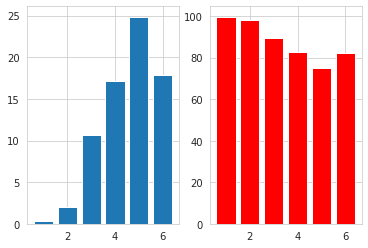

% of >50K income when age_cat is 2 and Occupation is  Protective-serv = 16.129032258064516
% of >50K income when age_cat is 4 and Occupation is  Protective-serv = 50.349650349650354
% of >50K income when age_cat is 3 and Occupation is  Protective-serv = 36.84210526315789
% of >50K income when age_cat is 1 and Occupation is  Protective-serv = 0.0
% of >50K income when age_cat is 6 and Occupation is  Protective-serv = 11.627906976744185
% of >50K income when age_cat is 5 and Occupation is  Protective-serv = 44.73684210526316


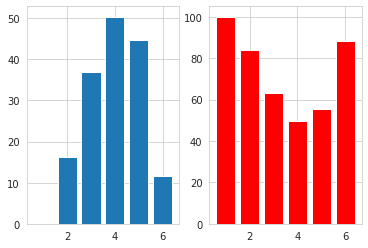

% of >50K income when age_cat is 2 and Occupation is  Armed-Forces = 0.0
% of >50K income when age_cat is 3 and Occupation is  Armed-Forces = 0.0
% of >50K income when age_cat is 4 and Occupation is  Armed-Forces = 100.0


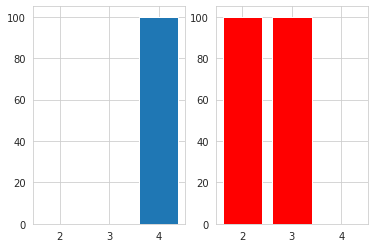

% of >50K income when age_cat is 5 and Occupation is  Priv-house-serv = 0.0
% of >50K income when age_cat is 6 and Occupation is  Priv-house-serv = 0.0
% of >50K income when age_cat is 3 and Occupation is  Priv-house-serv = 0.0
% of >50K income when age_cat is 1 and Occupation is  Priv-house-serv = 0.0
% of >50K income when age_cat is 4 and Occupation is  Priv-house-serv = 4.3478260869565215
% of >50K income when age_cat is 2 and Occupation is  Priv-house-serv = 0.0


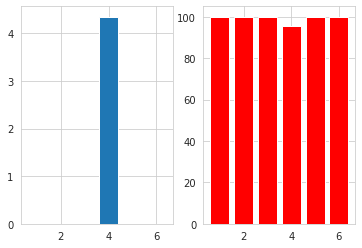

% of >50K income when Education is  Bachelors and Race is  White = 43.04635761589404
% of >50K income when Education is  HS-grad and Race is  White = 17.318059299191376
% of >50K income when Education is  Masters and Race is  White = 56.66883539362394
% of >50K income when Education is  11th and Race is  White = 5.117707267144319
% of >50K income when Education is  Doctorate and Race is  White = 74.79674796747967
% of >50K income when Education is  Assoc-acdm and Race is  White = 25.683060109289617
% of >50K income when Education is  Some-college and Race is  White = 20.219107459320124
% of >50K income when Education is  9th and Race is  White = 5.459057071960298
% of >50K income when Education is  Assoc-voc and Race is  White = 27.5890637945319
% of >50K income when Education is  Prof-school and Race is  White = 74.31906614785993
% of >50K income when Education is  5th-6th and Race is  White = 4.301075268817205
% of >50K income when Education is  7th-8th and Race is  White = 6.8716094

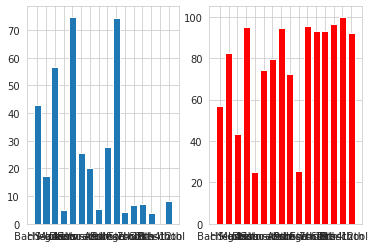

% of >50K income when Education is  11th and Race is  Black = 4.57516339869281
% of >50K income when Education is  Bachelors and Race is  Black = 29.09090909090909
% of >50K income when Education is  9th and Race is  Black = 4.49438202247191
% of >50K income when Education is  Some-college and Race is  Black = 11.528150134048257
% of >50K income when Education is  Assoc-acdm and Race is  Black = 17.75700934579439
% of >50K income when Education is  HS-grad and Race is  Black = 7.325383304940375
% of >50K income when Education is  Assoc-voc and Race is  Black = 16.071428571428573
% of >50K income when Education is  10th and Race is  Black = 4.511278195488721
% of >50K income when Education is  12th and Race is  Black = 7.142857142857142
% of >50K income when Education is  5th-6th and Race is  Black = 0.0
% of >50K income when Education is  1st-4th and Race is  Black = 6.25
% of >50K income when Education is  7th-8th and Race is  Black = 3.571428571428571
% of >50K income when Education 

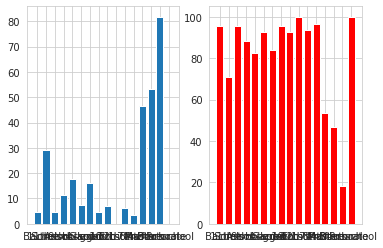

% of >50K income when Education is  Bachelors and Race is  Asian-Pac-Islander = 33.56401384083045
% of >50K income when Education is  Assoc-voc and Race is  Asian-Pac-Islander = 23.684210526315788
% of >50K income when Education is  Some-college and Race is  Asian-Pac-Islander = 15.865384615384615
% of >50K income when Education is  HS-grad and Race is  Asian-Pac-Islander = 15.04424778761062
% of >50K income when Education is  Masters and Race is  Asian-Pac-Islander = 48.86363636363637
% of >50K income when Education is  Doctorate and Race is  Asian-Pac-Islander = 64.28571428571429
% of >50K income when Education is  11th and Race is  Asian-Pac-Islander = 4.761904761904762
% of >50K income when Education is  Assoc-acdm and Race is  Asian-Pac-Islander = 27.586206896551722
% of >50K income when Education is  Prof-school and Race is  Asian-Pac-Islander = 65.85365853658537
% of >50K income when Education is  7th-8th and Race is  Asian-Pac-Islander = 0.0
% of >50K income when Education is  

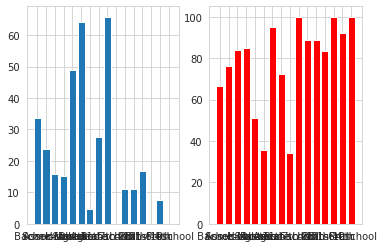

% of >50K income when Education is  7th-8th and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Education is  Some-college and Race is  Amer-Indian-Eskimo = 7.59493670886076
% of >50K income when Education is  10th and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Education is  HS-grad and Race is  Amer-Indian-Eskimo = 9.243697478991598
% of >50K income when Education is  Assoc-acdm and Race is  Amer-Indian-Eskimo = 12.5
% of >50K income when Education is  11th and Race is  Amer-Indian-Eskimo = 14.285714285714285
% of >50K income when Education is  Bachelors and Race is  Amer-Indian-Eskimo = 38.095238095238095
% of >50K income when Education is  Assoc-voc and Race is  Amer-Indian-Eskimo = 5.263157894736842
% of >50K income when Education is  Prof-school and Race is  Amer-Indian-Eskimo = 100.0
% of >50K income when Education is  9th and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Education is  Masters and Race is  Amer-Indian-Eskimo = 60.0
% of >50K income 

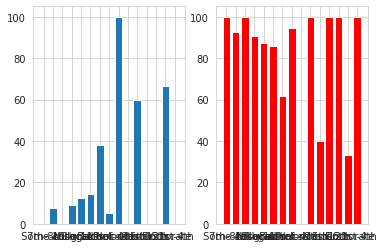

% of >50K income when Education is  Some-college and Race is  Other = 13.725490196078432
% of >50K income when Education is  11th and Race is  Other = 0.0
% of >50K income when Education is  7th-8th and Race is  Other = 0.0
% of >50K income when Education is  Bachelors and Race is  Other = 15.151515151515152
% of >50K income when Education is  HS-grad and Race is  Other = 2.564102564102564
% of >50K income when Education is  10th and Race is  Other = 11.11111111111111
% of >50K income when Education is  Assoc-voc and Race is  Other = 0.0
% of >50K income when Education is  9th and Race is  Other = 0.0
% of >50K income when Education is  Masters and Race is  Other = 28.57142857142857
% of >50K income when Education is  12th and Race is  Other = 0.0
% of >50K income when Education is  1st-4th and Race is  Other = 0.0
% of >50K income when Education is  Assoc-acdm and Race is  Other = 25.0
% of >50K income when Education is  5th-6th and Race is  Other = 7.6923076923076925
% of >50K income

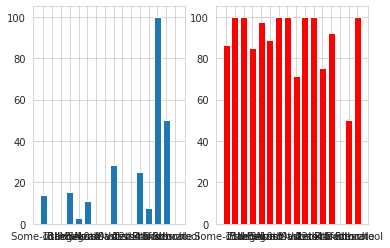

% of >50K income when Marital_status is  Married-civ-spouse and Race is  White = 45.52572706935123
% of >50K income when Marital_status is  Divorced and Race is  White = 10.745325256781669
% of >50K income when Marital_status is  Never-married and Race is  White = 4.899497487437186
% of >50K income when Marital_status is  Married-AF-spouse and Race is  White = 40.909090909090914
% of >50K income when Marital_status is  Separated and Race is  White = 7.949790794979079
% of >50K income when Marital_status is  Married-spouse-absent and Race is  White = 9.621993127147768
% of >50K income when Marital_status is  Widowed and Race is  White = 9.854014598540147


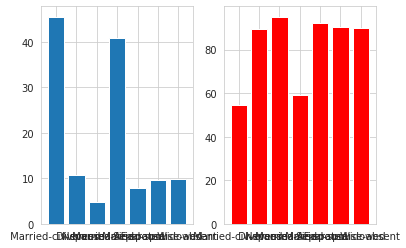

% of >50K income when Marital_status is  Married-civ-spouse and Race is  Black = 36.43966547192354
% of >50K income when Marital_status is  Married-spouse-absent and Race is  Black = 3.225806451612903
% of >50K income when Marital_status is  Never-married and Race is  Black = 2.526002971768202
% of >50K income when Marital_status is  Separated and Race is  Black = 1.8867924528301887
% of >50K income when Marital_status is  Divorced and Race is  Black = 8.041237113402062
% of >50K income when Marital_status is  Widowed and Race is  Black = 0.78125
% of >50K income when Marital_status is  Married-AF-spouse and Race is  Black = 100.0


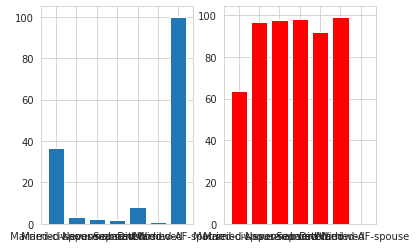

% of >50K income when Marital_status is  Married-civ-spouse and Race is  Asian-Pac-Islander = 46.25984251968504
% of >50K income when Marital_status is  Never-married and Race is  Asian-Pac-Islander = 5.64516129032258
% of >50K income when Marital_status is  Divorced and Race is  Asian-Pac-Islander = 12.0
% of >50K income when Marital_status is  Married-spouse-absent and Race is  Asian-Pac-Islander = 9.75609756097561
% of >50K income when Marital_status is  Widowed and Race is  Asian-Pac-Islander = 12.5
% of >50K income when Marital_status is  Separated and Race is  Asian-Pac-Islander = 21.052631578947366


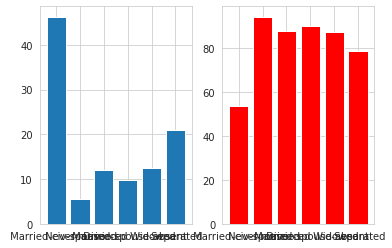

% of >50K income when Marital_status is  Married-civ-spouse and Race is  Amer-Indian-Eskimo = 21.551724137931032
% of >50K income when Marital_status is  Never-married and Race is  Amer-Indian-Eskimo = 4.854368932038835
% of >50K income when Marital_status is  Divorced and Race is  Amer-Indian-Eskimo = 10.0
% of >50K income when Marital_status is  Married-spouse-absent and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Marital_status is  Widowed and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Marital_status is  Separated and Race is  Amer-Indian-Eskimo = 0.0


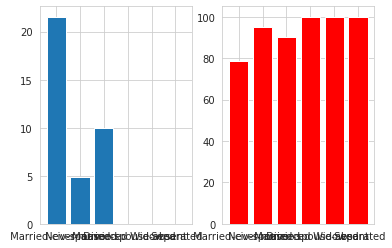

% of >50K income when Marital_status is  Married-civ-spouse and Race is  Other = 20.952380952380953
% of >50K income when Marital_status is  Divorced and Race is  Other = 3.8461538461538463
% of >50K income when Marital_status is  Widowed and Race is  Other = 0.0
% of >50K income when Marital_status is  Never-married and Race is  Other = 1.9047619047619049
% of >50K income when Marital_status is  Married-spouse-absent and Race is  Other = 0.0
% of >50K income when Marital_status is  Separated and Race is  Other = 0.0


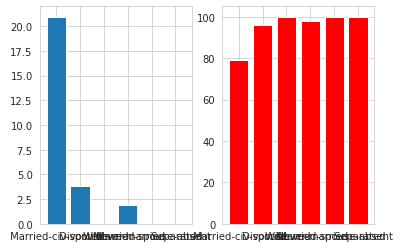

% of >50K income when Relationship is  Husband and Race is  White = 45.4606365159129
% of >50K income when Relationship is  Not-in-family and Race is  White = 10.766423357664232
% of >50K income when Relationship is  Wife and Race is  White = 49.96186117467582
% of >50K income when Relationship is  Own-child and Race is  White = 1.3866039952996476
% of >50K income when Relationship is  Unmarried and Race is  White = 7.266158169409875
% of >50K income when Relationship is  Other-relative and Race is  White = 3.890489913544669


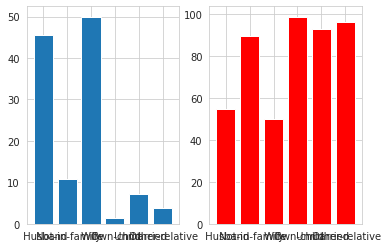

% of >50K income when Relationship is  Husband and Race is  Black = 37.85394932935917
% of >50K income when Relationship is  Wife and Race is  Black = 33.33333333333333
% of >50K income when Relationship is  Not-in-family and Race is  Black = 6.527093596059114
% of >50K income when Relationship is  Unmarried and Race is  Black = 3.3810143042912877
% of >50K income when Relationship is  Own-child and Race is  Black = 0.36036036036036034
% of >50K income when Relationship is  Other-relative and Race is  Black = 0.6097560975609756


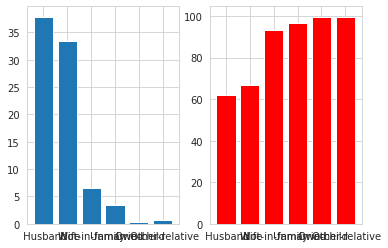

% of >50K income when Relationship is  Husband and Race is  Asian-Pac-Islander = 49.75609756097561
% of >50K income when Relationship is  Wife and Race is  Asian-Pac-Islander = 39.130434782608695
% of >50K income when Relationship is  Other-relative and Race is  Asian-Pac-Islander = 7.317073170731707
% of >50K income when Relationship is  Unmarried and Race is  Asian-Pac-Islander = 9.89010989010989
% of >50K income when Relationship is  Not-in-family and Race is  Asian-Pac-Islander = 11.682242990654206
% of >50K income when Relationship is  Own-child and Race is  Asian-Pac-Islander = 2.8901734104046244


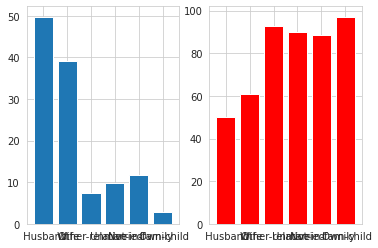

% of >50K income when Relationship is  Husband and Race is  Amer-Indian-Eskimo = 18.478260869565215
% of >50K income when Relationship is  Not-in-family and Race is  Amer-Indian-Eskimo = 9.876543209876543
% of >50K income when Relationship is  Own-child and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Relationship is  Unmarried and Race is  Amer-Indian-Eskimo = 3.4482758620689653
% of >50K income when Relationship is  Other-relative and Race is  Amer-Indian-Eskimo = 7.6923076923076925
% of >50K income when Relationship is  Wife and Race is  Amer-Indian-Eskimo = 42.10526315789473


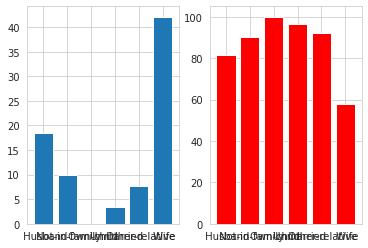

% of >50K income when Relationship is  Wife and Race is  Other = 25.0
% of >50K income when Relationship is  Other-relative and Race is  Other = 7.142857142857142
% of >50K income when Relationship is  Unmarried and Race is  Other = 0.0
% of >50K income when Relationship is  Husband and Race is  Other = 18.75
% of >50K income when Relationship is  Not-in-family and Race is  Other = 4.10958904109589
% of >50K income when Relationship is  Own-child and Race is  Other = 2.7027027027027026


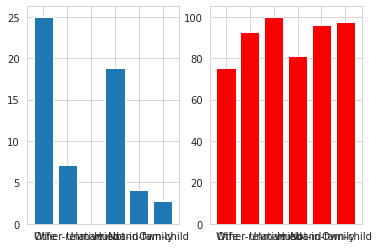

% of >50K income when Sex is  Male and Race is  White = 31.758201637719708
% of >50K income when Sex is  Female and Race is  White = 11.895394584586901


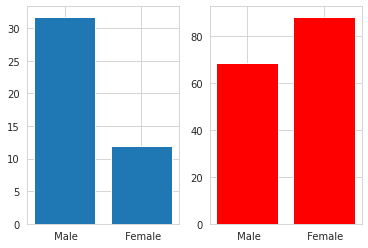

% of >50K income when Sex is  Male and Race is  Black = 18.929254302103253
% of >50K income when Sex is  Female and Race is  Black = 5.787781350482315


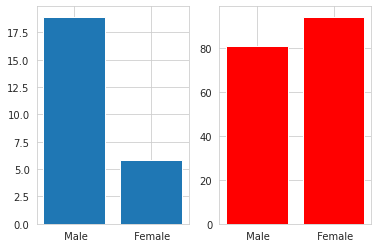

% of >50K income when Sex is  Male and Race is  Asian-Pac-Islander = 33.62193362193362
% of >50K income when Sex is  Female and Race is  Asian-Pac-Islander = 12.427745664739884


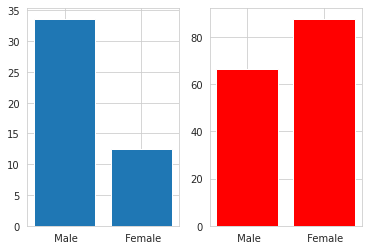

% of >50K income when Sex is  Male and Race is  Amer-Indian-Eskimo = 12.5
% of >50K income when Sex is  Female and Race is  Amer-Indian-Eskimo = 10.084033613445378


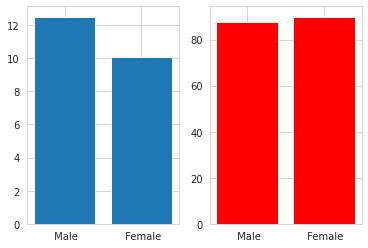

% of >50K income when Sex is  Female and Race is  Other = 5.5045871559633035
% of >50K income when Sex is  Male and Race is  Other = 11.728395061728394


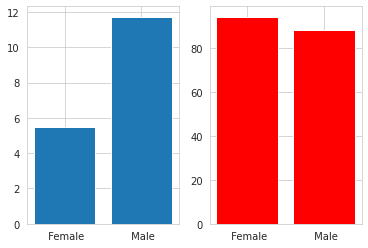

% of >50K income when Native_country is  United-States and Race is  White = 26.167056986729122
% of >50K income when Native_country is  Puerto-Rico and Race is  White = 10.975609756097562
% of >50K income when Native_country is  ? and Race is  White = 27.72020725388601
% of >50K income when Native_country is  Honduras and Race is  White = 8.333333333333332
% of >50K income when Native_country is  Mexico and Race is  White = 5.423728813559322
% of >50K income when Native_country is  Cuba and Race is  White = 26.666666666666668
% of >50K income when Native_country is  England and Race is  White = 34.5679012345679
% of >50K income when Native_country is  Canada and Race is  White = 31.932773109243694
% of >50K income when Native_country is  Iran and Race is  White = 42.857142857142854
% of >50K income when Native_country is  Italy and Race is  White = 34.24657534246575
% of >50K income when Native_country is  Poland and Race is  White = 20.33898305084746
% of >50K income when Native_count

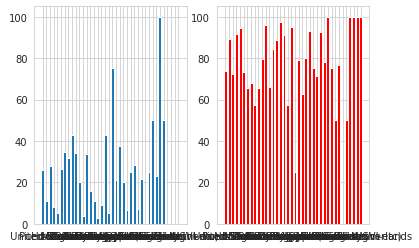

% of >50K income when Native_country is  United-States and Race is  Black = 12.39406779661017
% of >50K income when Native_country is  Cuba and Race is  Black = 33.33333333333333
% of >50K income when Native_country is  Jamaica and Race is  Black = 12.0
% of >50K income when Native_country is  Germany and Race is  Black = 25.0
% of >50K income when Native_country is  Haiti and Race is  Black = 9.30232558139535
% of >50K income when Native_country is  ? and Race is  Black = 13.541666666666666
% of >50K income when Native_country is  Japan and Race is  Black = 0.0
% of >50K income when Native_country is  Outlying-US(Guam-USVI-etc) and Race is  Black = 0.0
% of >50K income when Native_country is  Trinadad&Tobago and Race is  Black = 12.5
% of >50K income when Native_country is  Dominican-Republic and Race is  Black = 8.333333333333332
% of >50K income when Native_country is  England and Race is  Black = 25.0
% of >50K income when Native_country is  Honduras and Race is  Black = 0.0
% of >

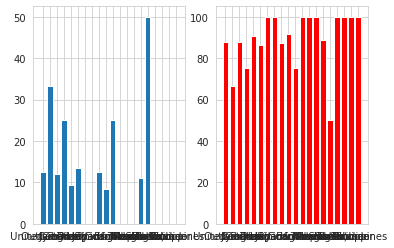

% of >50K income when Native_country is  India and Race is  Asian-Pac-Islander = 41.17647058823529
% of >50K income when Native_country is  ? and Race is  Asian-Pac-Islander = 27.710843373493976
% of >50K income when Native_country is  South and Race is  Asian-Pac-Islander = 19.480519480519483
% of >50K income when Native_country is  United-States and Race is  Asian-Pac-Islander = 23.28767123287671
% of >50K income when Native_country is  Philippines and Race is  Asian-Pac-Islander = 29.25531914893617
% of >50K income when Native_country is  England and Race is  Asian-Pac-Islander = 0.0
% of >50K income when Native_country is  Cambodia and Race is  Asian-Pac-Islander = 38.88888888888889
% of >50K income when Native_country is  Thailand and Race is  Asian-Pac-Islander = 12.5
% of >50K income when Native_country is  Laos and Race is  Asian-Pac-Islander = 11.11111111111111
% of >50K income when Native_country is  Taiwan and Race is  Asian-Pac-Islander = 35.41666666666667
% of >50K income 

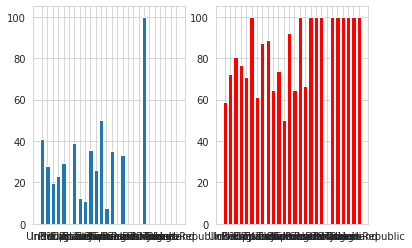

% of >50K income when Native_country is  Mexico and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Native_country is  United-States and Race is  Amer-Indian-Eskimo = 11.824324324324325
% of >50K income when Native_country is  Germany and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Native_country is  South and Race is  Amer-Indian-Eskimo = 50.0
% of >50K income when Native_country is  Puerto-Rico and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Native_country is  Columbia and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Native_country is  Philippines and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when Native_country is  Hong and Race is  Amer-Indian-Eskimo = 0.0


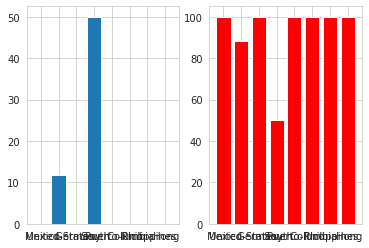

% of >50K income when Native_country is  United-States and Race is  Other = 10.077519379844961
% of >50K income when Native_country is  Puerto-Rico and Race is  Other = 9.523809523809524
% of >50K income when Native_country is  ? and Race is  Other = 16.666666666666664
% of >50K income when Native_country is  Dominican-Republic and Race is  Other = 0.0
% of >50K income when Native_country is  Mexico and Race is  Other = 2.5
% of >50K income when Native_country is  Germany and Race is  Other = 0.0
% of >50K income when Native_country is  Guatemala and Race is  Other = 0.0
% of >50K income when Native_country is  Jamaica and Race is  Other = 0.0
% of >50K income when Native_country is  Columbia and Race is  Other = 0.0
% of >50K income when Native_country is  Ecuador and Race is  Other = 11.11111111111111
% of >50K income when Native_country is  India and Race is  Other = 40.0
% of >50K income when Native_country is  Nicaragua and Race is  Other = 0.0
% of >50K income when Native_country

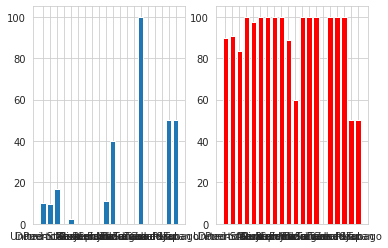

% of >50K income when age_cat is 4 and Race is  White = 40.02351360429963
% of >50K income when age_cat is 3 and Race is  White = 30.238983284984112
% of >50K income when age_cat is 5 and Race is  White = 39.57174638487208
% of >50K income when age_cat is 2 and Race is  White = 8.028904054596547
% of >50K income when age_cat is 1 and Race is  White = 0.13679890560875513
% of >50K income when age_cat is 6 and Race is  White = 24.868483978957435


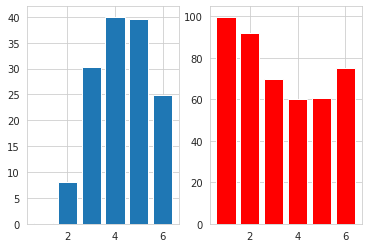

% of >50K income when age_cat is 5 and Race is  Black = 19.51219512195122
% of >50K income when age_cat is 2 and Race is  Black = 3.850385038503851
% of >50K income when age_cat is 4 and Race is  Black = 23.47826086956522
% of >50K income when age_cat is 3 and Race is  Black = 12.075029308323563
% of >50K income when age_cat is 1 and Race is  Black = 0.0
% of >50K income when age_cat is 6 and Race is  Black = 8.982035928143713


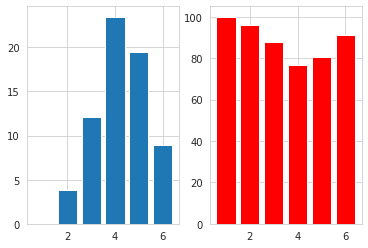

% of >50K income when age_cat is 2 and Race is  Asian-Pac-Islander = 10.802469135802468
% of >50K income when age_cat is 3 and Race is  Asian-Pac-Islander = 31.08108108108108
% of >50K income when age_cat is 5 and Race is  Asian-Pac-Islander = 41.34615384615385
% of >50K income when age_cat is 4 and Race is  Asian-Pac-Islander = 39.565217391304344
% of >50K income when age_cat is 6 and Race is  Asian-Pac-Islander = 26.31578947368421
% of >50K income when age_cat is 1 and Race is  Asian-Pac-Islander = 0.0


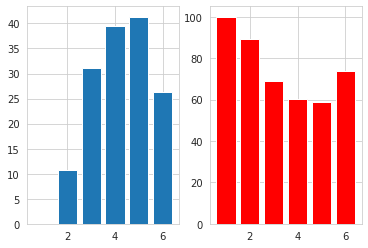

% of >50K income when age_cat is 3 and Race is  Amer-Indian-Eskimo = 13.333333333333334
% of >50K income when age_cat is 5 and Race is  Amer-Indian-Eskimo = 10.81081081081081
% of >50K income when age_cat is 2 and Race is  Amer-Indian-Eskimo = 7.368421052631578
% of >50K income when age_cat is 4 and Race is  Amer-Indian-Eskimo = 18.75
% of >50K income when age_cat is 1 and Race is  Amer-Indian-Eskimo = 0.0
% of >50K income when age_cat is 6 and Race is  Amer-Indian-Eskimo = 8.333333333333332


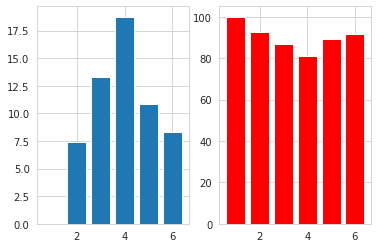

% of >50K income when age_cat is 2 and Race is  Other = 2.631578947368421
% of >50K income when age_cat is 3 and Race is  Other = 14.925373134328357
% of >50K income when age_cat is 6 and Race is  Other = 0.0
% of >50K income when age_cat is 4 and Race is  Other = 15.555555555555555
% of >50K income when age_cat is 1 and Race is  Other = 0.0
% of >50K income when age_cat is 5 and Race is  Other = 22.727272727272727


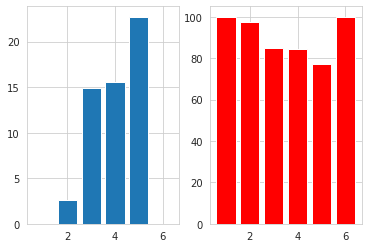

% of >50K income when Education is  Bachelors and Native_country is  United-States = 42.30849947534103
% of >50K income when Education is  HS-grad and Native_country is  United-States = 16.316223459080604
% of >50K income when Education is  11th and Native_country is  United-States = 5.154639175257731
% of >50K income when Education is  Masters and Native_country is  United-States = 56.71250818598559
% of >50K income when Education is  Some-college and Native_country is  United-States = 19.258160237388726
% of >50K income when Education is  Assoc-acdm and Native_country is  United-States = 25.15274949083503
% of >50K income when Education is  Doctorate and Native_country is  United-States = 75.91463414634147
% of >50K income when Education is  9th and Native_country is  United-States = 5.822784810126582
% of >50K income when Education is  Assoc-voc and Native_country is  United-States = 26.066718386346004
% of >50K income when Education is  10th and Native_country is  United-States = 6

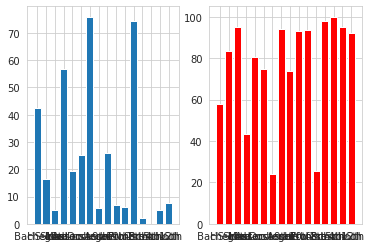

% of >50K income when Education is  Bachelors and Native_country is  Cuba = 23.52941176470588
% of >50K income when Education is  5th-6th and Native_country is  Cuba = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Cuba = 20.833333333333336
% of >50K income when Education is  7th-8th and Native_country is  Cuba = 0.0
% of >50K income when Education is  Masters and Native_country is  Cuba = 60.0
% of >50K income when Education is  Some-college and Native_country is  Cuba = 47.05882352941176
% of >50K income when Education is  11th and Native_country is  Cuba = 0.0
% of >50K income when Education is  9th and Native_country is  Cuba = 0.0
% of >50K income when Education is  12th and Native_country is  Cuba = 33.33333333333333
% of >50K income when Education is  1st-4th and Native_country is  Cuba = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Cuba = 0.0
% of >50K income when Education is  Doctorate and Native_country is  Cuba = 50.0
% o

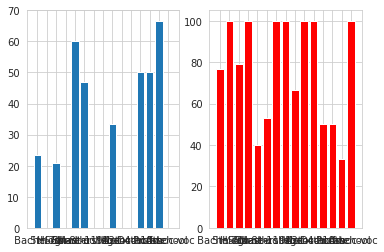

% of >50K income when Education is  9th and Native_country is  Jamaica = 0.0
% of >50K income when Education is  12th and Native_country is  Jamaica = 0.0
% of >50K income when Education is  Some-college and Native_country is  Jamaica = 26.08695652173913
% of >50K income when Education is  Bachelors and Native_country is  Jamaica = 12.5
% of >50K income when Education is  HS-grad and Native_country is  Jamaica = 3.8461538461538463
% of >50K income when Education is  Assoc-acdm and Native_country is  Jamaica = 0.0
% of >50K income when Education is  11th and Native_country is  Jamaica = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Jamaica = 33.33333333333333
% of >50K income when Education is  5th-6th and Native_country is  Jamaica = 0.0
% of >50K income when Education is  10th and Native_country is  Jamaica = 0.0
% of >50K income when Education is  Doctorate and Native_country is  Jamaica = 100.0
% of >50K income when Education is  Masters and Native_country

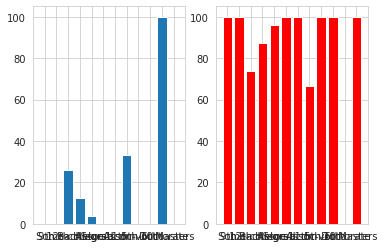

% of >50K income when Education is  Bachelors and Native_country is  India = 33.33333333333333
% of >50K income when Education is  Assoc-voc and Native_country is  India = 50.0
% of >50K income when Education is  Masters and Native_country is  India = 48.148148148148145
% of >50K income when Education is  HS-grad and Native_country is  India = 33.33333333333333
% of >50K income when Education is  11th and Native_country is  India = 0.0
% of >50K income when Education is  Doctorate and Native_country is  India = 60.0
% of >50K income when Education is  Some-college and Native_country is  India = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  India = 66.66666666666666
% of >50K income when Education is  Prof-school and Native_country is  India = 75.0
% of >50K income when Education is  9th and Native_country is  India = 0.0
% of >50K income when Education is  10th and Native_country is  India = 0.0
% of >50K income when Education is  Preschool and Native_countr

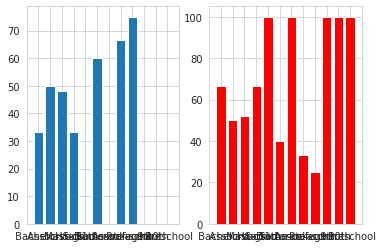

% of >50K income when Education is  Assoc-voc and Native_country is  ? = 25.0
% of >50K income when Education is  Some-college and Native_country is  ? = 16.346153846153847
% of >50K income when Education is  HS-grad and Native_country is  ? = 9.774436090225564
% of >50K income when Education is  7th-8th and Native_country is  ? = 15.789473684210526
% of >50K income when Education is  Masters and Native_country is  ? = 46.93877551020408
% of >50K income when Education is  Bachelors and Native_country is  ? = 35.86206896551724
% of >50K income when Education is  Assoc-acdm and Native_country is  ? = 25.0
% of >50K income when Education is  11th and Native_country is  ? = 12.5
% of >50K income when Education is  10th and Native_country is  ? = 8.333333333333332
% of >50K income when Education is  9th and Native_country is  ? = 12.5
% of >50K income when Education is  Doctorate and Native_country is  ? = 65.21739130434783
% of >50K income when Education is  Prof-school and Native_country 

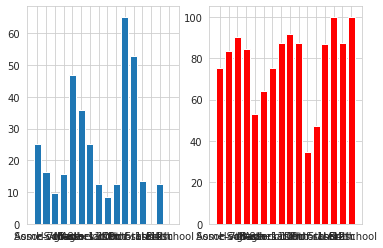

% of >50K income when Education is  7th-8th and Native_country is  Mexico = 3.7735849056603774
% of >50K income when Education is  5th-6th and Native_country is  Mexico = 2.027027027027027
% of >50K income when Education is  HS-grad and Native_country is  Mexico = 6.2015503875969
% of >50K income when Education is  Some-college and Native_country is  Mexico = 6.349206349206349
% of >50K income when Education is  1st-4th and Native_country is  Mexico = 4.6875
% of >50K income when Education is  9th and Native_country is  Mexico = 0.0
% of >50K income when Education is  11th and Native_country is  Mexico = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Mexico = 24.137931034482758
% of >50K income when Education is  Masters and Native_country is  Mexico = 60.0
% of >50K income when Education is  10th and Native_country is  Mexico = 0.0
% of >50K income when Education is  12th and Native_country is  Mexico = 0.0
% of >50K income when Education is  Preschool and Na

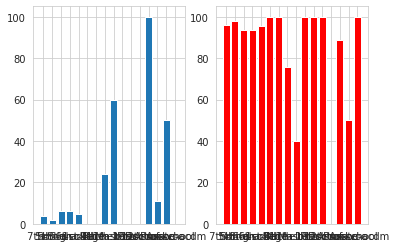

% of >50K income when Education is  Some-college and Native_country is  South = 16.666666666666664
% of >50K income when Education is  11th and Native_country is  South = 0.0
% of >50K income when Education is  Masters and Native_country is  South = 28.57142857142857
% of >50K income when Education is  HS-grad and Native_country is  South = 17.391304347826086
% of >50K income when Education is  Bachelors and Native_country is  South = 26.08695652173913
% of >50K income when Education is  Assoc-voc and Native_country is  South = 0.0
% of >50K income when Education is  Doctorate and Native_country is  South = 0.0
% of >50K income when Education is  Prof-school and Native_country is  South = 100.0
% of >50K income when Education is  7th-8th and Native_country is  South = 0.0


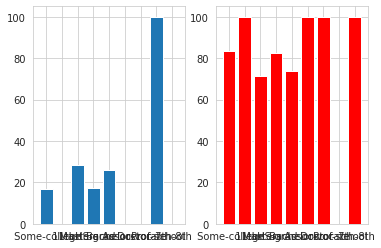

% of >50K income when Education is  11th and Native_country is  Puerto-Rico = 12.5
% of >50K income when Education is  Assoc-voc and Native_country is  Puerto-Rico = 50.0
% of >50K income when Education is  7th-8th and Native_country is  Puerto-Rico = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Puerto-Rico = 16.666666666666664
% of >50K income when Education is  Some-college and Native_country is  Puerto-Rico = 20.0
% of >50K income when Education is  HS-grad and Native_country is  Puerto-Rico = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Puerto-Rico = 30.76923076923077
% of >50K income when Education is  9th and Native_country is  Puerto-Rico = 25.0
% of >50K income when Education is  1st-4th and Native_country is  Puerto-Rico = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Puerto-Rico = 0.0
% of >50K income when Education is  10th and Native_country is  Puerto-Rico = 0.0
% of >50K income when Educatio

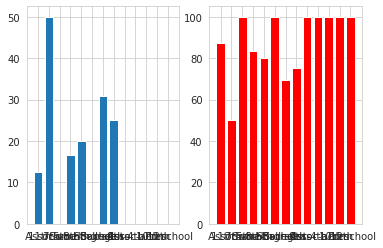

% of >50K income when Education is  Prof-school and Native_country is  Honduras = 100.0
% of >50K income when Education is  Bachelors and Native_country is  Honduras = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Honduras = 0.0
% of >50K income when Education is  1st-4th and Native_country is  Honduras = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Honduras = 0.0
% of >50K income when Education is  Some-college and Native_country is  Honduras = 0.0
% of >50K income when Education is  11th and Native_country is  Honduras = 0.0


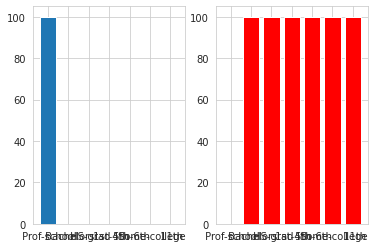

% of >50K income when Education is  Assoc-acdm and Native_country is  England = 40.0
% of >50K income when Education is  HS-grad and Native_country is  England = 21.428571428571427
% of >50K income when Education is  Bachelors and Native_country is  England = 52.17391304347826
% of >50K income when Education is  Masters and Native_country is  England = 55.55555555555556
% of >50K income when Education is  Doctorate and Native_country is  England = 25.0
% of >50K income when Education is  Assoc-voc and Native_country is  England = 0.0
% of >50K income when Education is  Some-college and Native_country is  England = 27.27272727272727
% of >50K income when Education is  Prof-school and Native_country is  England = 100.0
% of >50K income when Education is  5th-6th and Native_country is  England = 0.0
% of >50K income when Education is  11th and Native_country is  England = 0.0
% of >50K income when Education is  10th and Native_country is  England = 0.0
% of >50K income when Education is  

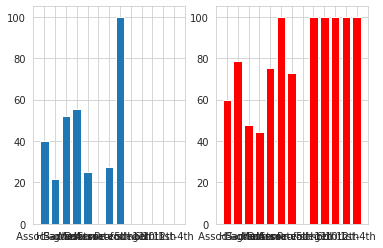

% of >50K income when Education is  HS-grad and Native_country is  Canada = 25.806451612903224
% of >50K income when Education is  Some-college and Native_country is  Canada = 36.0
% of >50K income when Education is  Bachelors and Native_country is  Canada = 37.5
% of >50K income when Education is  9th and Native_country is  Canada = 0.0
% of >50K income when Education is  Doctorate and Native_country is  Canada = 50.0
% of >50K income when Education is  Assoc-voc and Native_country is  Canada = 42.857142857142854
% of >50K income when Education is  11th and Native_country is  Canada = 0.0
% of >50K income when Education is  Masters and Native_country is  Canada = 37.5
% of >50K income when Education is  10th and Native_country is  Canada = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Canada = 50.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Canada = 100.0
% of >50K income when Education is  Prof-school and Native_country is  Canada =

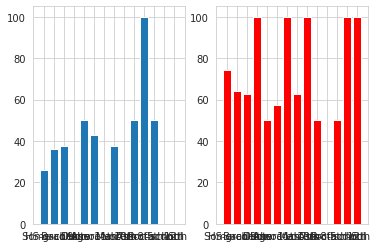

% of >50K income when Education is  Bachelors and Native_country is  Germany = 35.294117647058826
% of >50K income when Education is  Some-college and Native_country is  Germany = 26.47058823529412
% of >50K income when Education is  HS-grad and Native_country is  Germany = 20.689655172413794
% of >50K income when Education is  11th and Native_country is  Germany = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Germany = 60.0
% of >50K income when Education is  Masters and Native_country is  Germany = 20.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Germany = 20.0
% of >50K income when Education is  Doctorate and Native_country is  Germany = 83.33333333333334
% of >50K income when Education is  10th and Native_country is  Germany = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Germany = 0.0
% of >50K income when Education is  12th and Native_country is  Germany = 0.0
% of >50K income when Education is  Prof-sc

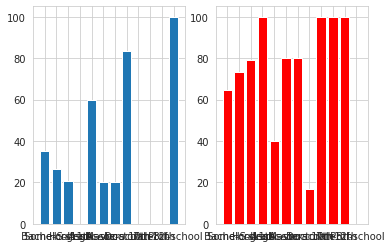

% of >50K income when Education is  Masters and Native_country is  Iran = 66.66666666666666
% of >50K income when Education is  Bachelors and Native_country is  Iran = 40.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Iran = 0.0
% of >50K income when Education is  Some-college and Native_country is  Iran = 22.22222222222222
% of >50K income when Education is  Doctorate and Native_country is  Iran = 80.0
% of >50K income when Education is  HS-grad and Native_country is  Iran = 50.0


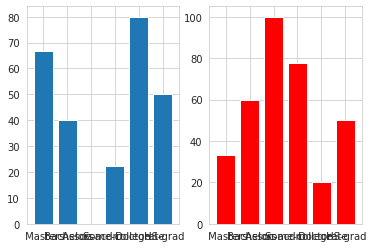

% of >50K income when Education is  Bachelors and Native_country is  Philippines = 48.0
% of >50K income when Education is  Some-college and Native_country is  Philippines = 21.951219512195124
% of >50K income when Education is  Assoc-acdm and Native_country is  Philippines = 16.666666666666664
% of >50K income when Education is  HS-grad and Native_country is  Philippines = 6.25
% of >50K income when Education is  Masters and Native_country is  Philippines = 57.14285714285714
% of >50K income when Education is  Prof-school and Native_country is  Philippines = 60.0
% of >50K income when Education is  11th and Native_country is  Philippines = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Philippines = 14.285714285714285
% of >50K income when Education is  Assoc-voc and Native_country is  Philippines = 33.33333333333333
% of >50K income when Education is  10th and Native_country is  Philippines = 0.0
% of >50K income when Education is  9th and Native_country is  P

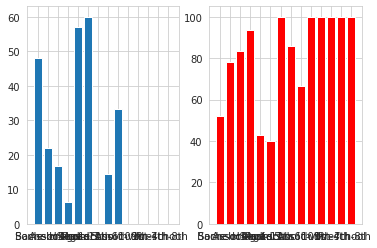

% of >50K income when Education is  HS-grad and Native_country is  Italy = 41.17647058823529
% of >50K income when Education is  Some-college and Native_country is  Italy = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Italy = 75.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Italy = 25.0
% of >50K income when Education is  5th-6th and Native_country is  Italy = 10.0
% of >50K income when Education is  Prof-school and Native_country is  Italy = 50.0
% of >50K income when Education is  12th and Native_country is  Italy = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Italy = 25.0
% of >50K income when Education is  Doctorate and Native_country is  Italy = 100.0
% of >50K income when Education is  10th and Native_country is  Italy = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Italy = 0.0
% of >50K income when Education is  Masters and Native_country is  Italy = 100.0
% of >50K income 

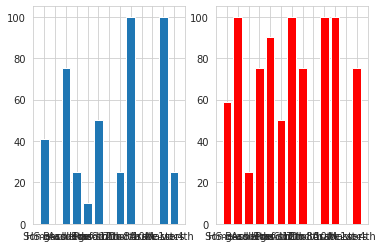

% of >50K income when Education is  Bachelors and Native_country is  Poland = 27.27272727272727
% of >50K income when Education is  HS-grad and Native_country is  Poland = 10.0
% of >50K income when Education is  Masters and Native_country is  Poland = 50.0
% of >50K income when Education is  Some-college and Native_country is  Poland = 8.333333333333332
% of >50K income when Education is  7th-8th and Native_country is  Poland = 33.33333333333333
% of >50K income when Education is  Assoc-acdm and Native_country is  Poland = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Poland = 50.0
% of >50K income when Education is  1st-4th and Native_country is  Poland = 0.0
% of >50K income when Education is  11th and Native_country is  Poland = 50.0
% of >50K income when Education is  9th and Native_country is  Poland = 0.0
% of >50K income when Education is  Doctorate and Native_country is  Poland = 100.0


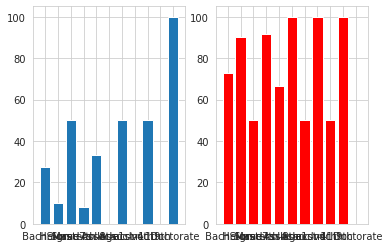

% of >50K income when Education is  Assoc-voc and Native_country is  Columbia = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Columbia = 50.0
% of >50K income when Education is  HS-grad and Native_country is  Columbia = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Columbia = 0.0
% of >50K income when Education is  10th and Native_country is  Columbia = 0.0
% of >50K income when Education is  Doctorate and Native_country is  Columbia = 100.0
% of >50K income when Education is  5th-6th and Native_country is  Columbia = 0.0
% of >50K income when Education is  Some-college and Native_country is  Columbia = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Columbia = 0.0
% of >50K income when Education is  12th and Native_country is  Columbia = 0.0
% of >50K income when Education is  9th and Native_country is  Columbia = 0.0
% of >50K income when Education is  Masters and Native_country is  Columbia = 0.0
% of 

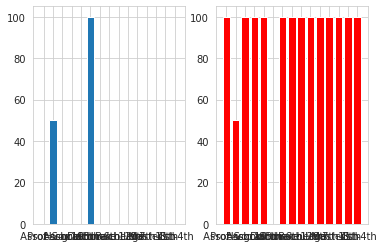

% of >50K income when Education is  HS-grad and Native_country is  Cambodia = 28.57142857142857
% of >50K income when Education is  Bachelors and Native_country is  Cambodia = 66.66666666666666
% of >50K income when Education is  1st-4th and Native_country is  Cambodia = 0.0
% of >50K income when Education is  Some-college and Native_country is  Cambodia = 40.0
% of >50K income when Education is  7th-8th and Native_country is  Cambodia = 0.0
% of >50K income when Education is  Preschool and Native_country is  Cambodia = 0.0
% of >50K income when Education is  12th and Native_country is  Cambodia = 100.0


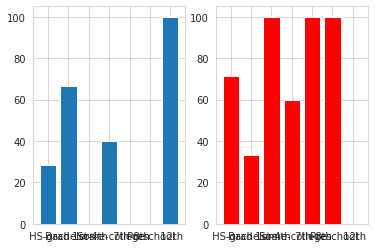

% of >50K income when Education is  Some-college and Native_country is  Thailand = 33.33333333333333
% of >50K income when Education is  HS-grad and Native_country is  Thailand = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Thailand = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Thailand = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Thailand = 100.0
% of >50K income when Education is  Doctorate and Native_country is  Thailand = 100.0
% of >50K income when Education is  12th and Native_country is  Thailand = 0.0
% of >50K income when Education is  Masters and Native_country is  Thailand = 0.0


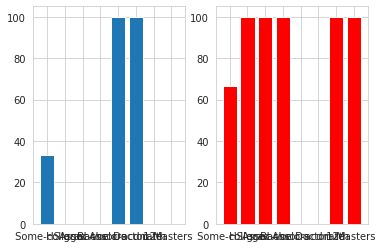

% of >50K income when Education is  7th-8th and Native_country is  Ecuador = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Ecuador = 20.0
% of >50K income when Education is  Some-college and Native_country is  Ecuador = 14.285714285714285
% of >50K income when Education is  10th and Native_country is  Ecuador = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Ecuador = 0.0
% of >50K income when Education is  11th and Native_country is  Ecuador = 0.0
% of >50K income when Education is  Masters and Native_country is  Ecuador = 50.0
% of >50K income when Education is  12th and Native_country is  Ecuador = 0.0
% of >50K income when Education is  1st-4th and Native_country is  Ecuador = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Ecuador = 0.0


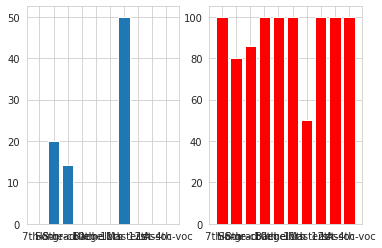

% of >50K income when Education is  Some-college and Native_country is  Laos = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Laos = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Laos = 50.0
% of >50K income when Education is  11th and Native_country is  Laos = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Laos = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Laos = 100.0
% of >50K income when Education is  Preschool and Native_country is  Laos = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Laos = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Laos = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Laos = 0.0


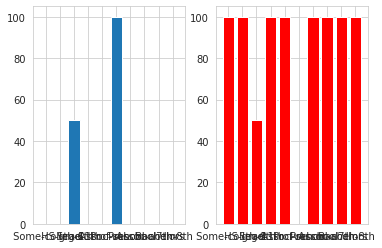

% of >50K income when Education is  Masters and Native_country is  Taiwan = 46.15384615384615
% of >50K income when Education is  Doctorate and Native_country is  Taiwan = 87.5
% of >50K income when Education is  Bachelors and Native_country is  Taiwan = 16.666666666666664
% of >50K income when Education is  HS-grad and Native_country is  Taiwan = 33.33333333333333
% of >50K income when Education is  Some-college and Native_country is  Taiwan = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Taiwan = 100.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Taiwan = 0.0


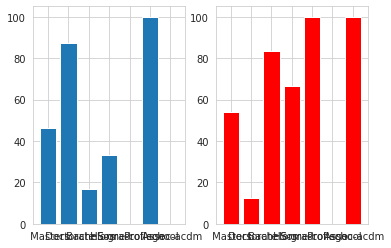

% of >50K income when Education is  HS-grad and Native_country is  Haiti = 0.0
% of >50K income when Education is  11th and Native_country is  Haiti = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Haiti = 0.0
% of >50K income when Education is  Some-college and Native_country is  Haiti = 9.090909090909092
% of >50K income when Education is  9th and Native_country is  Haiti = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Haiti = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Haiti = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Haiti = 40.0
% of >50K income when Education is  10th and Native_country is  Haiti = 0.0
% of >50K income when Education is  1st-4th and Native_country is  Haiti = 100.0
% of >50K income when Education is  7th-8th and Native_country is  Haiti = 0.0


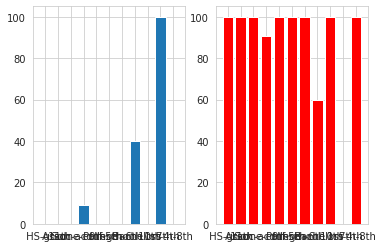

% of >50K income when Education is  9th and Native_country is  Portugal = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Portugal = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Portugal = 50.0
% of >50K income when Education is  HS-grad and Native_country is  Portugal = 20.0
% of >50K income when Education is  1st-4th and Native_country is  Portugal = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Portugal = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Portugal = 0.0
% of >50K income when Education is  10th and Native_country is  Portugal = 0.0
% of >50K income when Education is  12th and Native_country is  Portugal = 0.0
% of >50K income when Education is  Masters and Native_country is  Portugal = 100.0


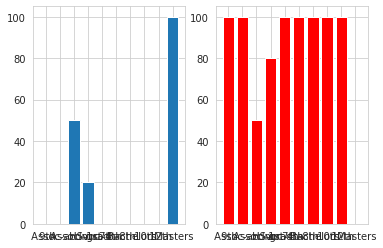

% of >50K income when Education is  HS-grad and Native_country is  Dominican-Republic = 11.11111111111111
% of >50K income when Education is  Masters and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  Some-college and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  1st-4th and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  9th and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  10th and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  Preschool and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Dominican-Republic = 0.0
% of >50K income when Education is  11th and Native_country is  

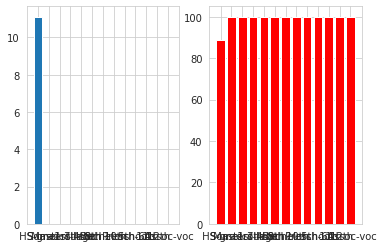

% of >50K income when Education is  5th-6th and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  9th and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  1st-4th and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  HS-grad and Native_country is  El-Salvador = 14.285714285714285
% of >50K income when Education is  Bachelors and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  Preschool and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  10th and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  Some-college and Native_country is  El-Salvador = 7.142857142857142
% of >50K income when Education is  Doctorate and Native_country is  El-Salvador = 100.0
% of >50K income when Education is  11th and Native_country is  El-Salvador = 0.0
% of >50K income when Education is  Masters and Native_country is  El-Salvador = 100.0
% of >50K income when Education

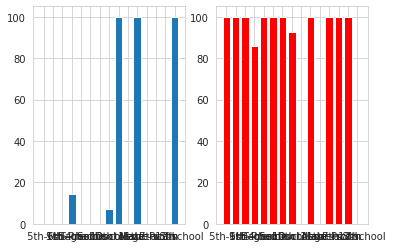

% of >50K income when Education is  Some-college and Native_country is  France = 33.33333333333333
% of >50K income when Education is  Bachelors and Native_country is  France = 28.57142857142857
% of >50K income when Education is  Assoc-acdm and Native_country is  France = 66.66666666666666
% of >50K income when Education is  HS-grad and Native_country is  France = 33.33333333333333
% of >50K income when Education is  Masters and Native_country is  France = 60.0
% of >50K income when Education is  Doctorate and Native_country is  France = 66.66666666666666
% of >50K income when Education is  Assoc-voc and Native_country is  France = 0.0
% of >50K income when Education is  Prof-school and Native_country is  France = 0.0


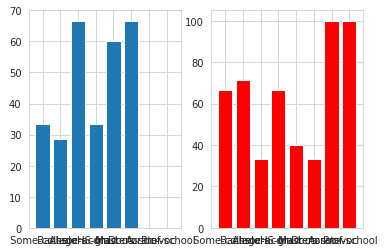

% of >50K income when Education is  5th-6th and Native_country is  Guatemala = 12.5
% of >50K income when Education is  1st-4th and Native_country is  Guatemala = 0.0
% of >50K income when Education is  11th and Native_country is  Guatemala = 0.0
% of >50K income when Education is  Some-college and Native_country is  Guatemala = 33.33333333333333
% of >50K income when Education is  10th and Native_country is  Guatemala = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Guatemala = 0.0
% of >50K income when Education is  12th and Native_country is  Guatemala = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Guatemala = 0.0
% of >50K income when Education is  9th and Native_country is  Guatemala = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Guatemala = 0.0
% of >50K income when Education is  Preschool and Native_country is  Guatemala = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Guatema

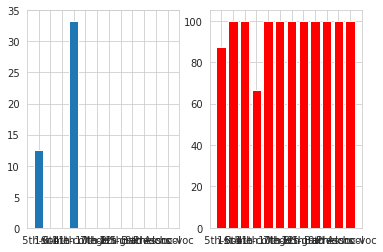

% of >50K income when Education is  Bachelors and Native_country is  China = 38.095238095238095
% of >50K income when Education is  Doctorate and Native_country is  China = 55.55555555555556
% of >50K income when Education is  HS-grad and Native_country is  China = 16.666666666666664
% of >50K income when Education is  Masters and Native_country is  China = 36.36363636363637
% of >50K income when Education is  7th-8th and Native_country is  China = 0.0
% of >50K income when Education is  Some-college and Native_country is  China = 0.0
% of >50K income when Education is  Prof-school and Native_country is  China = 0.0
% of >50K income when Education is  9th and Native_country is  China = 0.0
% of >50K income when Education is  10th and Native_country is  China = 0.0
% of >50K income when Education is  Preschool and Native_country is  China = 0.0


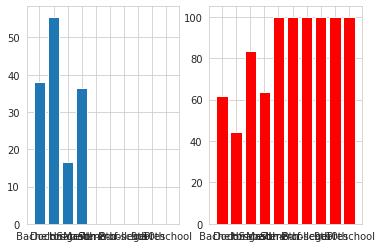

% of >50K income when Education is  Some-college and Native_country is  Japan = 9.090909090909092
% of >50K income when Education is  Bachelors and Native_country is  Japan = 52.63157894736842
% of >50K income when Education is  HS-grad and Native_country is  Japan = 17.647058823529413
% of >50K income when Education is  Masters and Native_country is  Japan = 57.14285714285714
% of >50K income when Education is  Assoc-voc and Native_country is  Japan = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Japan = 100.0
% of >50K income when Education is  10th and Native_country is  Japan = 100.0
% of >50K income when Education is  Doctorate and Native_country is  Japan = 100.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Japan = 100.0


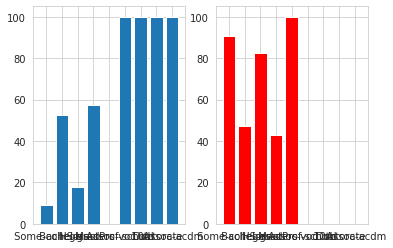

% of >50K income when Education is  HS-grad and Native_country is  Yugoslavia = 33.33333333333333
% of >50K income when Education is  Some-college and Native_country is  Yugoslavia = 33.33333333333333
% of >50K income when Education is  9th and Native_country is  Yugoslavia = 100.0
% of >50K income when Education is  Bachelors and Native_country is  Yugoslavia = 50.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Yugoslavia = 50.0
% of >50K income when Education is  7th-8th and Native_country is  Yugoslavia = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Yugoslavia = 0.0
% of >50K income when Education is  10th and Native_country is  Yugoslavia = 0.0


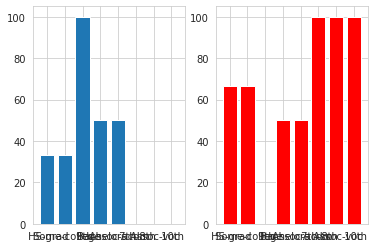

% of >50K income when Education is  Assoc-voc and Native_country is  Peru = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Peru = 33.33333333333333
% of >50K income when Education is  HS-grad and Native_country is  Peru = 0.0
% of >50K income when Education is  Some-college and Native_country is  Peru = 16.666666666666664
% of >50K income when Education is  Masters and Native_country is  Peru = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Peru = 0.0
% of >50K income when Education is  10th and Native_country is  Peru = 0.0
% of >50K income when Education is  11th and Native_country is  Peru = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Peru = 0.0


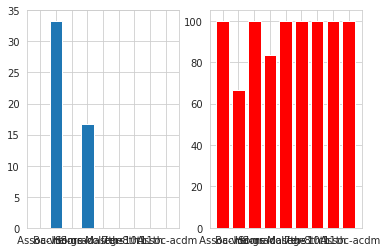

% of >50K income when Education is  Some-college and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Education is  9th and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0


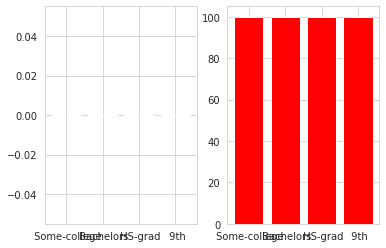

% of >50K income when Education is  Some-college and Native_country is  Scotland = 33.33333333333333
% of >50K income when Education is  11th and Native_country is  Scotland = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Scotland = 20.0
% of >50K income when Education is  Masters and Native_country is  Scotland = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Scotland = 100.0


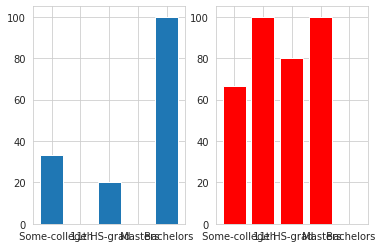

% of >50K income when Education is  Some-college and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Education is  9th and Native_country is  Trinadad&Tobago = 33.33333333333333
% of >50K income when Education is  12th and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Trinadad&Tobago = 16.666666666666664
% of >50K income when Education is  11th and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Education is  Masters and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Trinadad&Tobago = 0.0


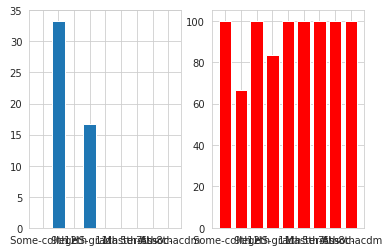

% of >50K income when Education is  HS-grad and Native_country is  Greece = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Greece = 100.0
% of >50K income when Education is  7th-8th and Native_country is  Greece = 50.0
% of >50K income when Education is  Some-college and Native_country is  Greece = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Greece = 50.0
% of >50K income when Education is  10th and Native_country is  Greece = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Greece = 50.0
% of >50K income when Education is  Masters and Native_country is  Greece = 66.66666666666666
% of >50K income when Education is  11th and Native_country is  Greece = 100.0
% of >50K income when Education is  5th-6th and Native_country is  Greece = 0.0


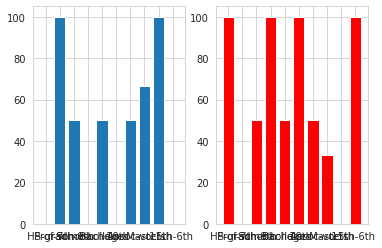

% of >50K income when Education is  Bachelors and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  Some-college and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  9th and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  5th-6th and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  12th and Native_country is  Nicaragua = 100.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  Masters and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Nicaragua = 100.0
% of >50K income when Education is  10th and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  11th and Native_country is  Nicaragua = 0.0
% of >50K income when Education is  Preschool and Native_country is  Nicaragua = 0.0

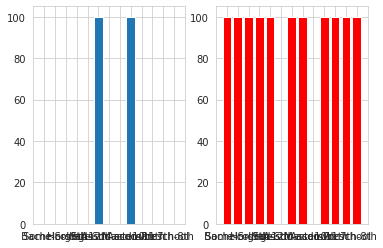

% of >50K income when Education is  Bachelors and Native_country is  Vietnam = 7.142857142857142
% of >50K income when Education is  Some-college and Native_country is  Vietnam = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Vietnam = 6.25
% of >50K income when Education is  11th and Native_country is  Vietnam = 33.33333333333333
% of >50K income when Education is  5th-6th and Native_country is  Vietnam = 50.0
% of >50K income when Education is  7th-8th and Native_country is  Vietnam = 0.0
% of >50K income when Education is  Prof-school and Native_country is  Vietnam = 0.0
% of >50K income when Education is  9th and Native_country is  Vietnam = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Vietnam = 0.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Vietnam = 0.0
% of >50K income when Education is  10th and Native_country is  Vietnam = 0.0
% of >50K income when Education is  12th and Native_country is  Vietnam =

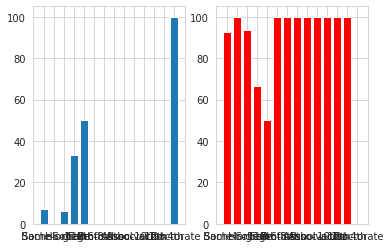

% of >50K income when Education is  Bachelors and Native_country is  Hong = 25.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Hong = 100.0
% of >50K income when Education is  11th and Native_country is  Hong = 0.0
% of >50K income when Education is  7th-8th and Native_country is  Hong = 0.0
% of >50K income when Education is  HS-grad and Native_country is  Hong = 0.0
% of >50K income when Education is  9th and Native_country is  Hong = 0.0
% of >50K income when Education is  Masters and Native_country is  Hong = 100.0
% of >50K income when Education is  Assoc-voc and Native_country is  Hong = 0.0
% of >50K income when Education is  Some-college and Native_country is  Hong = 0.0
% of >50K income when Education is  Preschool and Native_country is  Hong = 0.0
% of >50K income when Education is  Doctorate and Native_country is  Hong = 50.0


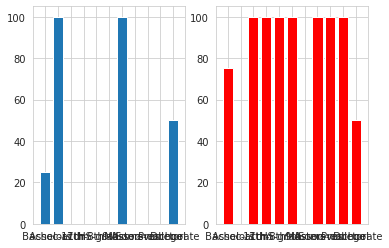

% of >50K income when Education is  HS-grad and Native_country is  Ireland = 8.333333333333332
% of >50K income when Education is  Bachelors and Native_country is  Ireland = 40.0
% of >50K income when Education is  11th and Native_country is  Ireland = 0.0
% of >50K income when Education is  Some-college and Native_country is  Ireland = 50.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Ireland = 100.0
% of >50K income when Education is  Assoc-voc and Native_country is  Ireland = 0.0
% of >50K income when Education is  9th and Native_country is  Ireland = 0.0
% of >50K income when Education is  Masters and Native_country is  Ireland = 0.0


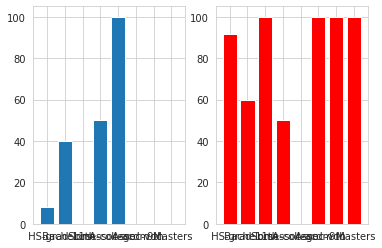

% of >50K income when Education is  HS-grad and Native_country is  Hungary = 20.0
% of >50K income when Education is  Some-college and Native_country is  Hungary = 0.0
% of >50K income when Education is  Bachelors and Native_country is  Hungary = 25.0
% of >50K income when Education is  Assoc-acdm and Native_country is  Hungary = 0.0
% of >50K income when Education is  Assoc-voc and Native_country is  Hungary = 100.0


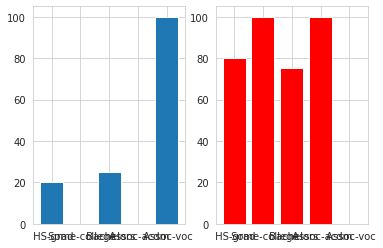

% of >50K income when Education is  Some-college and Native_country is  Holand-Netherlands = 0.0


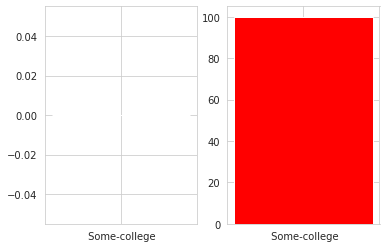

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  United-States = 45.758527827648116
% of >50K income when Marital_status is  Divorced and Native_country is  United-States = 10.451705910619895
% of >50K income when Marital_status is  Never-married and Native_country is  United-States = 4.677385675506369
% of >50K income when Marital_status is  Separated and Native_country is  United-States = 6.795016987542468
% of >50K income when Marital_status is  Married-AF-spouse and Native_country is  United-States = 43.47826086956522
% of >50K income when Marital_status is  Widowed and Native_country is  United-States = 8.314855875831485
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  United-States = 10.276679841897234


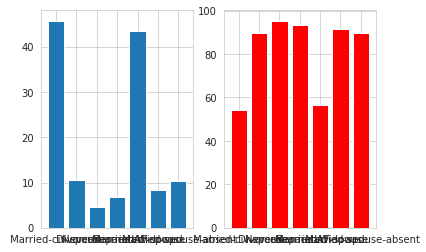

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Cuba = 48.97959183673469
% of >50K income when Marital_status is  Widowed and Native_country is  Cuba = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Cuba = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Cuba = 6.666666666666667
% of >50K income when Marital_status is  Never-married and Native_country is  Cuba = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Cuba = 0.0


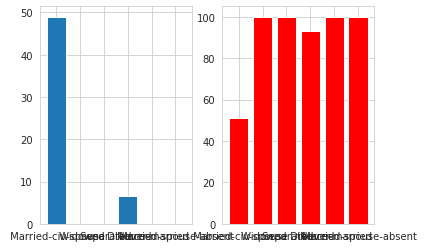

% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Jamaica = 14.285714285714285
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Jamaica = 37.5
% of >50K income when Marital_status is  Never-married and Native_country is  Jamaica = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Jamaica = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Jamaica = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Jamaica = 0.0


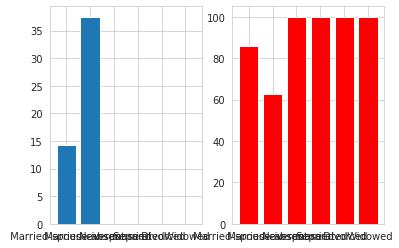

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  India = 51.5625
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  India = 11.11111111111111
% of >50K income when Marital_status is  Never-married and Native_country is  India = 14.285714285714285
% of >50K income when Marital_status is  Widowed and Native_country is  India = 50.0
% of >50K income when Marital_status is  Separated and Native_country is  India = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  India = 100.0


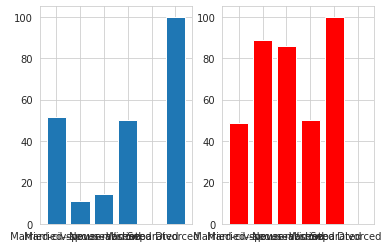

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  ? = 44.36619718309859
% of >50K income when Marital_status is  Never-married and Native_country is  ? = 6.153846153846154
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  ? = 9.523809523809524
% of >50K income when Marital_status is  Separated and Native_country is  ? = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  ? = 10.204081632653061
% of >50K income when Marital_status is  Widowed and Native_country is  ? = 7.142857142857142


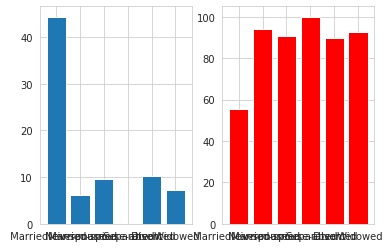

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Mexico = 8.681672025723474
% of >50K income when Marital_status is  Never-married and Native_country is  Mexico = 1.3043478260869565
% of >50K income when Marital_status is  Divorced and Native_country is  Mexico = 9.090909090909092
% of >50K income when Marital_status is  Separated and Native_country is  Mexico = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Mexico = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Mexico = 11.11111111111111


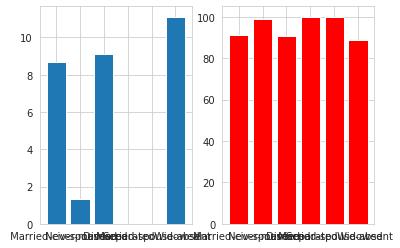

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  South = 33.33333333333333
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  South = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  South = 3.7037037037037033
% of >50K income when Marital_status is  Widowed and Native_country is  South = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  South = 33.33333333333333
% of >50K income when Marital_status is  Separated and Native_country is  South = 0.0


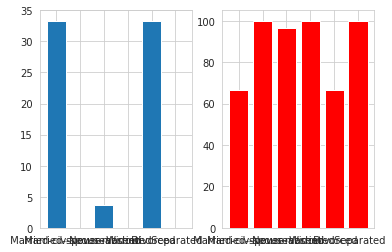

% of >50K income when Marital_status is  Never-married and Native_country is  Puerto-Rico = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Puerto-Rico = 20.930232558139537
% of >50K income when Marital_status is  Divorced and Native_country is  Puerto-Rico = 20.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Puerto-Rico = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Puerto-Rico = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Puerto-Rico = 0.0


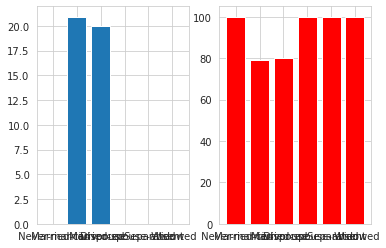

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Honduras = 50.0
% of >50K income when Marital_status is  Divorced and Native_country is  Honduras = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Honduras = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Honduras = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  Honduras = 0.0


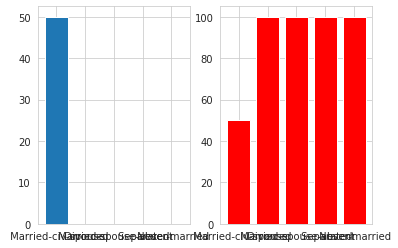

% of >50K income when Marital_status is  Divorced and Native_country is  England = 23.52941176470588
% of >50K income when Marital_status is  Never-married and Native_country is  England = 10.714285714285714
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  England = 58.97435897435898
% of >50K income when Marital_status is  Widowed and Native_country is  England = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  England = 0.0


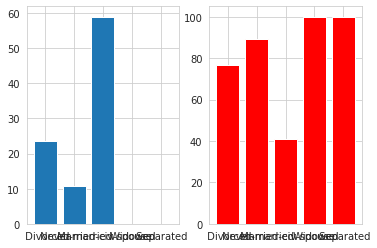

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Canada = 60.317460317460316
% of >50K income when Marital_status is  Never-married and Native_country is  Canada = 3.0303030303030303
% of >50K income when Marital_status is  Divorced and Native_country is  Canada = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Canada = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Canada = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Canada = 0.0


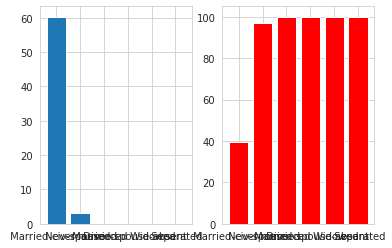

% of >50K income when Marital_status is  Never-married and Native_country is  Germany = 5.88235294117647
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Germany = 58.730158730158735
% of >50K income when Marital_status is  Widowed and Native_country is  Germany = 33.33333333333333
% of >50K income when Marital_status is  Divorced and Native_country is  Germany = 7.6923076923076925
% of >50K income when Marital_status is  Separated and Native_country is  Germany = 16.666666666666664
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Germany = 0.0


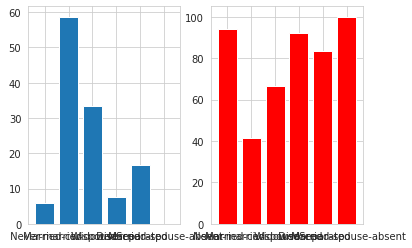

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Iran = 62.5
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Iran = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Iran = 14.285714285714285
% of >50K income when Marital_status is  Widowed and Native_country is  Iran = 50.0
% of >50K income when Marital_status is  Never-married and Native_country is  Iran = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Iran = 100.0


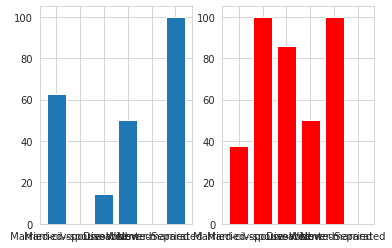

% of >50K income when Marital_status is  Never-married and Native_country is  Philippines = 5.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Philippines = 52.42718446601942
% of >50K income when Marital_status is  Divorced and Native_country is  Philippines = 8.333333333333332
% of >50K income when Marital_status is  Separated and Native_country is  Philippines = 25.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Philippines = 9.090909090909092
% of >50K income when Marital_status is  Widowed and Native_country is  Philippines = 0.0


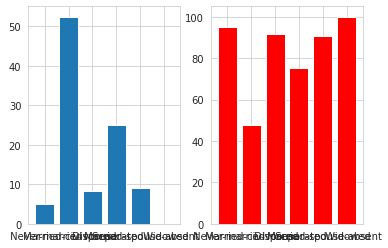

% of >50K income when Marital_status is  Never-married and Native_country is  Italy = 33.33333333333333
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Italy = 40.816326530612244
% of >50K income when Marital_status is  Divorced and Native_country is  Italy = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Italy = 50.0
% of >50K income when Marital_status is  Separated and Native_country is  Italy = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Italy = 0.0


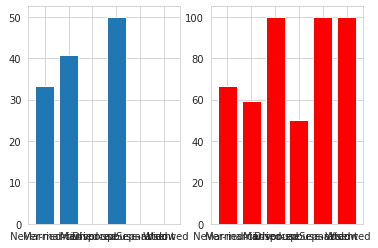

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Poland = 35.483870967741936
% of >50K income when Marital_status is  Never-married and Native_country is  Poland = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Poland = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Poland = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Poland = 25.0
% of >50K income when Marital_status is  Separated and Native_country is  Poland = 0.0


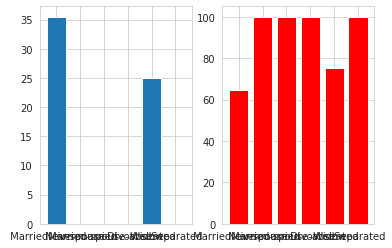

% of >50K income when Marital_status is  Widowed and Native_country is  Columbia = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Columbia = 5.263157894736842
% of >50K income when Marital_status is  Never-married and Native_country is  Columbia = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Columbia = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Columbia = 16.666666666666664
% of >50K income when Marital_status is  Divorced and Native_country is  Columbia = 0.0


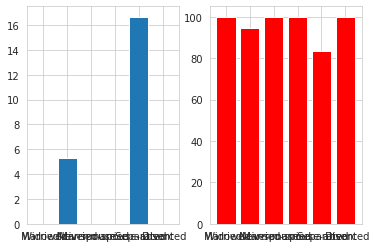

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Cambodia = 54.54545454545454
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Cambodia = 100.0
% of >50K income when Marital_status is  Never-married and Native_country is  Cambodia = 0.0


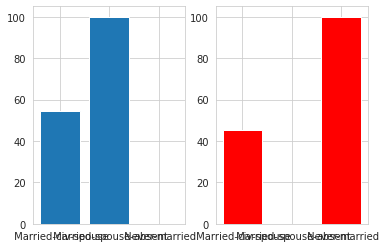

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Thailand = 50.0
% of >50K income when Marital_status is  Divorced and Native_country is  Thailand = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  Thailand = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Thailand = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Thailand = 0.0


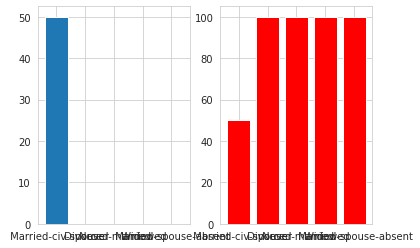

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Ecuador = 26.666666666666668
% of >50K income when Marital_status is  Never-married and Native_country is  Ecuador = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Ecuador = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Ecuador = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Ecuador = 0.0


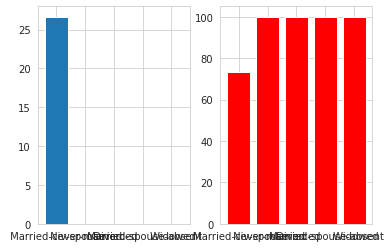

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Laos = 18.181818181818183
% of >50K income when Marital_status is  Never-married and Native_country is  Laos = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Laos = 0.0


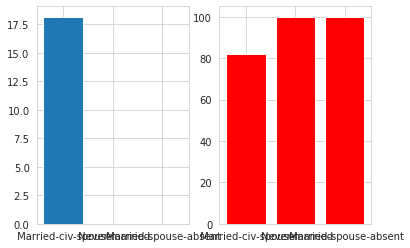

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Taiwan = 64.28571428571429
% of >50K income when Marital_status is  Never-married and Native_country is  Taiwan = 9.523809523809524
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Taiwan = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Taiwan = 0.0


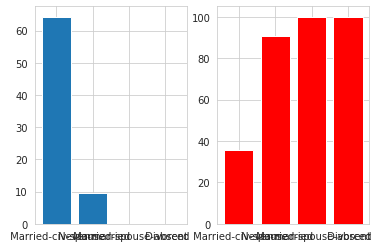

% of >50K income when Marital_status is  Never-married and Native_country is  Haiti = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Haiti = 26.666666666666668
% of >50K income when Marital_status is  Divorced and Native_country is  Haiti = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Haiti = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Haiti = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Haiti = 0.0


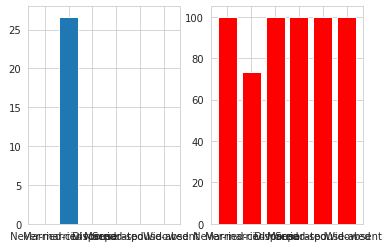

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Portugal = 14.285714285714285
% of >50K income when Marital_status is  Divorced and Native_country is  Portugal = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  Portugal = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Portugal = 50.0
% of >50K income when Marital_status is  Widowed and Native_country is  Portugal = 0.0


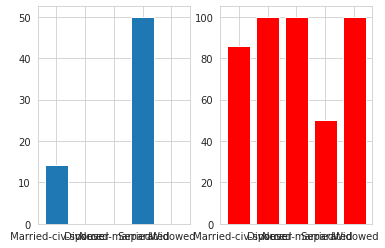

% of >50K income when Marital_status is  Never-married and Native_country is  Dominican-Republic = 3.7037037037037033
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Dominican-Republic = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Dominican-Republic = 4.761904761904762
% of >50K income when Marital_status is  Divorced and Native_country is  Dominican-Republic = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Dominican-Republic = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Dominican-Republic = 0.0


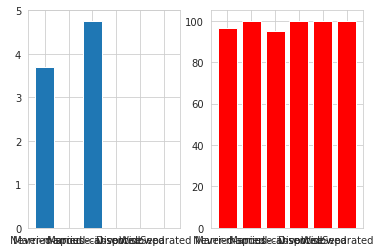

% of >50K income when Marital_status is  Never-married and Native_country is  El-Salvador = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  El-Salvador = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  El-Salvador = 25.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  El-Salvador = 21.62162162162162
% of >50K income when Marital_status is  Separated and Native_country is  El-Salvador = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  El-Salvador = 0.0


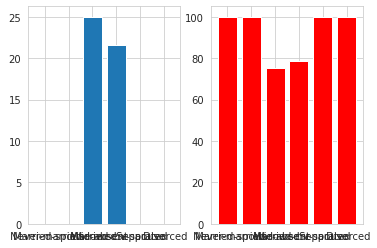

% of >50K income when Marital_status is  Divorced and Native_country is  France = 16.666666666666664
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  France = 75.0
% of >50K income when Marital_status is  Never-married and Native_country is  France = 11.11111111111111
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  France = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  France = 100.0


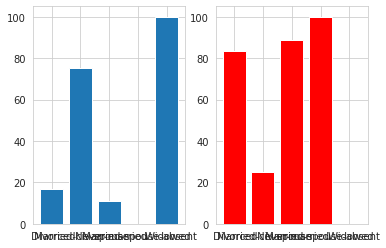

% of >50K income when Marital_status is  Separated and Native_country is  Guatemala = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Guatemala = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Guatemala = 6.666666666666667
% of >50K income when Marital_status is  Never-married and Native_country is  Guatemala = 3.225806451612903
% of >50K income when Marital_status is  Divorced and Native_country is  Guatemala = 25.0
% of >50K income when Marital_status is  Widowed and Native_country is  Guatemala = 0.0


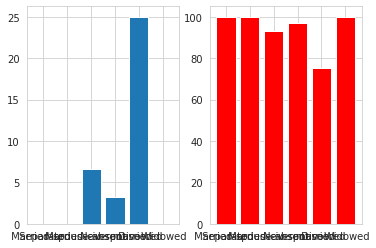

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  China = 38.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  China = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  China = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  China = 9.090909090909092
% of >50K income when Marital_status is  Widowed and Native_country is  China = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  China = 0.0


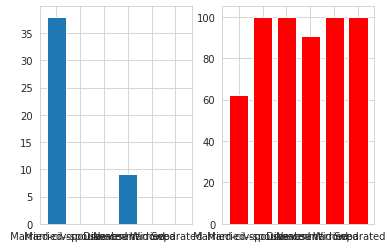

% of >50K income when Marital_status is  Never-married and Native_country is  Japan = 11.76470588235294
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Japan = 61.29032258064516
% of >50K income when Marital_status is  Divorced and Native_country is  Japan = 20.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Japan = 100.0
% of >50K income when Marital_status is  Separated and Native_country is  Japan = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Japan = 0.0


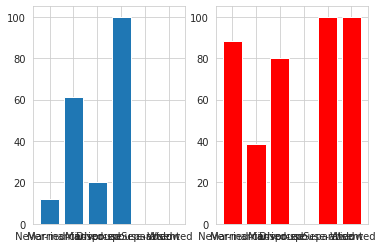

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Yugoslavia = 50.0
% of >50K income when Marital_status is  Never-married and Native_country is  Yugoslavia = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Yugoslavia = 0.0


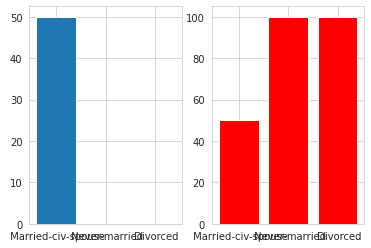

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Peru = 20.0
% of >50K income when Marital_status is  Divorced and Native_country is  Peru = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  Peru = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Peru = 0.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Peru = 0.0


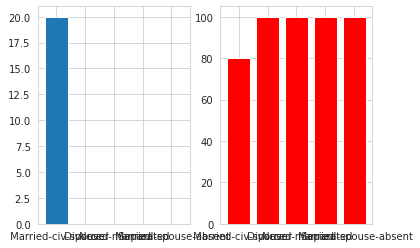

% of >50K income when Marital_status is  Never-married and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0


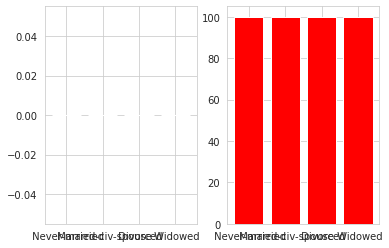

% of >50K income when Marital_status is  Divorced and Native_country is  Scotland = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  Scotland = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Scotland = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Scotland = 50.0


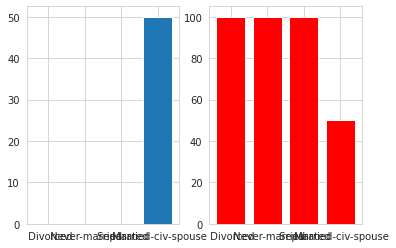

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Trinadad&Tobago = 22.22222222222222
% of >50K income when Marital_status is  Never-married and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Trinadad&Tobago = 0.0


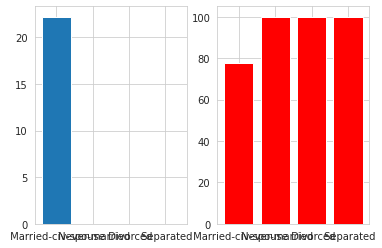

% of >50K income when Marital_status is  Never-married and Native_country is  Greece = 16.666666666666664
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Greece = 28.57142857142857
% of >50K income when Marital_status is  Divorced and Native_country is  Greece = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Greece = 100.0


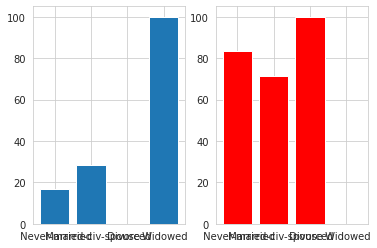

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Nicaragua = 14.285714285714285
% of >50K income when Marital_status is  Divorced and Native_country is  Nicaragua = 0.0
% of >50K income when Marital_status is  Widowed and Native_country is  Nicaragua = 0.0
% of >50K income when Marital_status is  Never-married and Native_country is  Nicaragua = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Nicaragua = 0.0


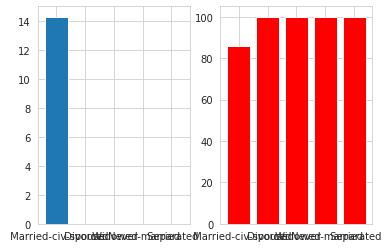

% of >50K income when Marital_status is  Never-married and Native_country is  Vietnam = 2.857142857142857
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Vietnam = 15.384615384615385
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Vietnam = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Vietnam = 0.0


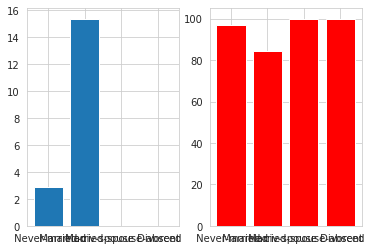

% of >50K income when Marital_status is  Never-married and Native_country is  Hong = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Hong = 46.15384615384615
% of >50K income when Marital_status is  Separated and Native_country is  Hong = 0.0


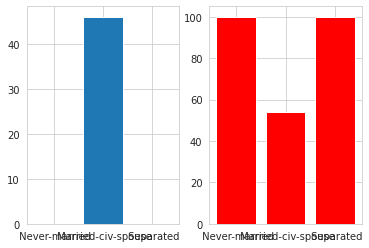

% of >50K income when Marital_status is  Never-married and Native_country is  Ireland = 9.090909090909092
% of >50K income when Marital_status is  Divorced and Native_country is  Ireland = 0.0
% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Ireland = 50.0
% of >50K income when Marital_status is  Married-spouse-absent and Native_country is  Ireland = 0.0
% of >50K income when Marital_status is  Separated and Native_country is  Ireland = 0.0


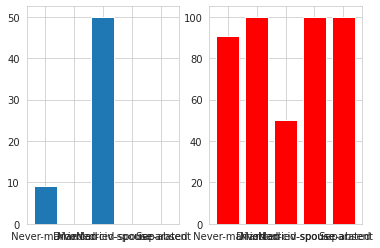

% of >50K income when Marital_status is  Married-civ-spouse and Native_country is  Hungary = 33.33333333333333
% of >50K income when Marital_status is  Widowed and Native_country is  Hungary = 0.0
% of >50K income when Marital_status is  Divorced and Native_country is  Hungary = 100.0
% of >50K income when Marital_status is  Never-married and Native_country is  Hungary = 0.0


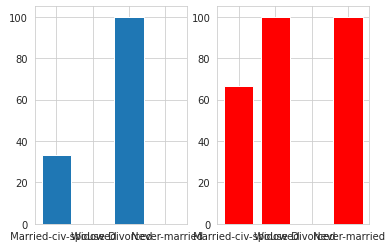

% of >50K income when Marital_status is  Never-married and Native_country is  Holand-Netherlands = 0.0


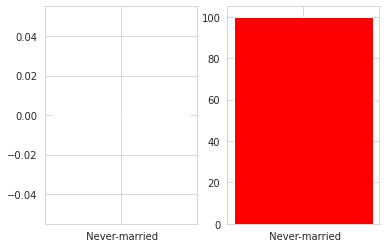

% of >50K income when Relationship is  Husband and Native_country is  United-States = 45.73813337829862
% of >50K income when Relationship is  Not-in-family and Native_country is  United-States = 10.535405872193436
% of >50K income when Relationship is  Wife and Native_country is  United-States = 49.301983835415136
% of >50K income when Relationship is  Own-child and Native_country is  United-States = 1.2577275634193137
% of >50K income when Relationship is  Unmarried and Native_country is  United-States = 6.462248598747116
% of >50K income when Relationship is  Other-relative and Native_country is  United-States = 3.8793103448275863


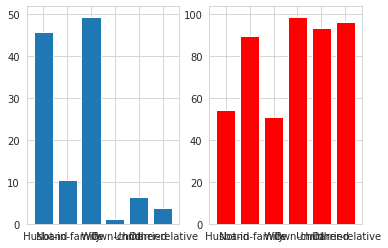

% of >50K income when Relationship is  Wife and Native_country is  Cuba = 50.0
% of >50K income when Relationship is  Husband and Native_country is  Cuba = 51.21951219512195
% of >50K income when Relationship is  Unmarried and Native_country is  Cuba = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Cuba = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Cuba = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Cuba = 5.555555555555555


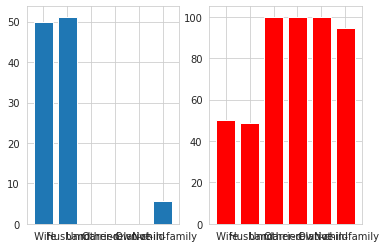

% of >50K income when Relationship is  Not-in-family and Native_country is  Jamaica = 3.8461538461538463
% of >50K income when Relationship is  Husband and Native_country is  Jamaica = 38.095238095238095
% of >50K income when Relationship is  Own-child and Native_country is  Jamaica = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Jamaica = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Jamaica = 33.33333333333333
% of >50K income when Relationship is  Unmarried and Native_country is  Jamaica = 0.0


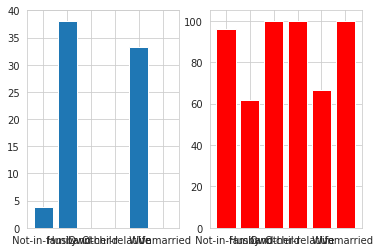

% of >50K income when Relationship is  Husband and Native_country is  India = 55.172413793103445
% of >50K income when Relationship is  Wife and Native_country is  India = 50.0
% of >50K income when Relationship is  Not-in-family and Native_country is  India = 23.52941176470588
% of >50K income when Relationship is  Own-child and Native_country is  India = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  India = 28.57142857142857
% of >50K income when Relationship is  Other-relative and Native_country is  India = 16.666666666666664


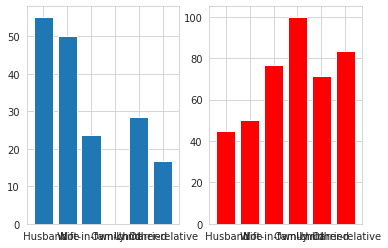

% of >50K income when Relationship is  Husband and Native_country is  ? = 45.52845528455284
% of >50K income when Relationship is  Own-child and Native_country is  ? = 3.1746031746031744
% of >50K income when Relationship is  Not-in-family and Native_country is  ? = 10.06711409395973
% of >50K income when Relationship is  Wife and Native_country is  ? = 38.23529411764706
% of >50K income when Relationship is  Unmarried and Native_country is  ? = 4.838709677419355
% of >50K income when Relationship is  Other-relative and Native_country is  ? = 3.4482758620689653


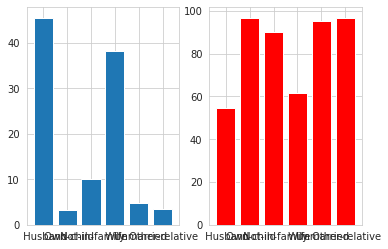

% of >50K income when Relationship is  Husband and Native_country is  Mexico = 9.022556390977442
% of >50K income when Relationship is  Own-child and Native_country is  Mexico = 1.7857142857142856
% of >50K income when Relationship is  Unmarried and Native_country is  Mexico = 2.380952380952381
% of >50K income when Relationship is  Other-relative and Native_country is  Mexico = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Mexico = 8.695652173913043
% of >50K income when Relationship is  Not-in-family and Native_country is  Mexico = 3.2520325203252036


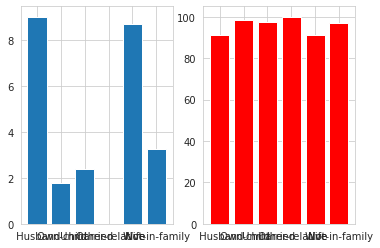

% of >50K income when Relationship is  Husband and Native_country is  South = 40.0
% of >50K income when Relationship is  Own-child and Native_country is  South = 0.0
% of >50K income when Relationship is  Wife and Native_country is  South = 12.5
% of >50K income when Relationship is  Other-relative and Native_country is  South = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  South = 25.0
% of >50K income when Relationship is  Unmarried and Native_country is  South = 9.090909090909092


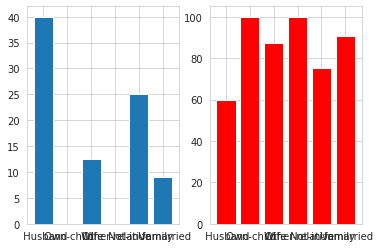

% of >50K income when Relationship is  Unmarried and Native_country is  Puerto-Rico = 3.571428571428571
% of >50K income when Relationship is  Husband and Native_country is  Puerto-Rico = 21.875
% of >50K income when Relationship is  Own-child and Native_country is  Puerto-Rico = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Puerto-Rico = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Puerto-Rico = 8.695652173913043
% of >50K income when Relationship is  Wife and Native_country is  Puerto-Rico = 18.181818181818183


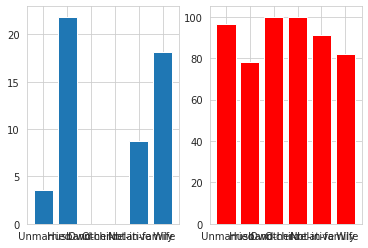

% of >50K income when Relationship is  Wife and Native_country is  Honduras = 50.0
% of >50K income when Relationship is  Unmarried and Native_country is  Honduras = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Honduras = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Honduras = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Honduras = 0.0


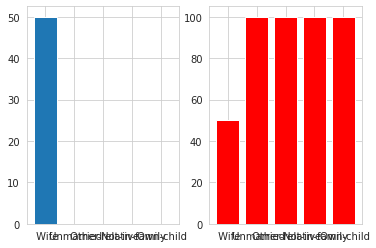

% of >50K income when Relationship is  Unmarried and Native_country is  England = 12.5
% of >50K income when Relationship is  Not-in-family and Native_country is  England = 17.647058823529413
% of >50K income when Relationship is  Husband and Native_country is  England = 59.375
% of >50K income when Relationship is  Own-child and Native_country is  England = 0.0
% of >50K income when Relationship is  Wife and Native_country is  England = 66.66666666666666
% of >50K income when Relationship is  Other-relative and Native_country is  England = 0.0


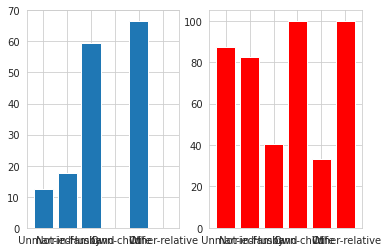

% of >50K income when Relationship is  Husband and Native_country is  Canada = 56.60377358490566
% of >50K income when Relationship is  Own-child and Native_country is  Canada = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Canada = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Canada = 2.7027027027027026
% of >50K income when Relationship is  Other-relative and Native_country is  Canada = 100.0
% of >50K income when Relationship is  Wife and Native_country is  Canada = 77.77777777777779


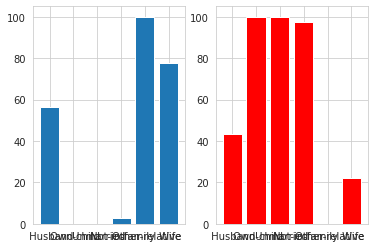

% of >50K income when Relationship is  Own-child and Native_country is  Germany = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Germany = 10.81081081081081
% of >50K income when Relationship is  Wife and Native_country is  Germany = 50.0
% of >50K income when Relationship is  Husband and Native_country is  Germany = 60.0
% of >50K income when Relationship is  Unmarried and Native_country is  Germany = 13.043478260869565
% of >50K income when Relationship is  Other-relative and Native_country is  Germany = 0.0


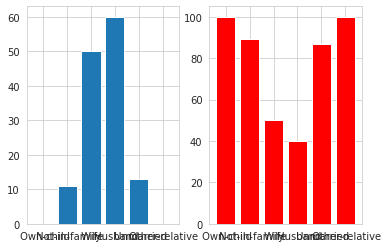

% of >50K income when Relationship is  Husband and Native_country is  Iran = 61.904761904761905
% of >50K income when Relationship is  Not-in-family and Native_country is  Iran = 11.11111111111111
% of >50K income when Relationship is  Other-relative and Native_country is  Iran = 100.0
% of >50K income when Relationship is  Unmarried and Native_country is  Iran = 25.0
% of >50K income when Relationship is  Wife and Native_country is  Iran = 66.66666666666666
% of >50K income when Relationship is  Own-child and Native_country is  Iran = 0.0


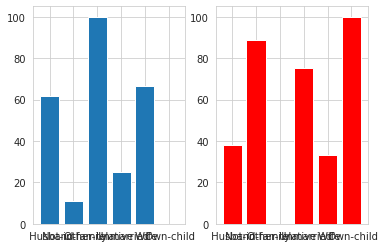

% of >50K income when Relationship is  Other-relative and Native_country is  Philippines = 10.0
% of >50K income when Relationship is  Own-child and Native_country is  Philippines = 5.88235294117647
% of >50K income when Relationship is  Unmarried and Native_country is  Philippines = 10.526315789473683
% of >50K income when Relationship is  Not-in-family and Native_country is  Philippines = 9.375
% of >50K income when Relationship is  Husband and Native_country is  Philippines = 58.44155844155844
% of >50K income when Relationship is  Wife and Native_country is  Philippines = 43.75


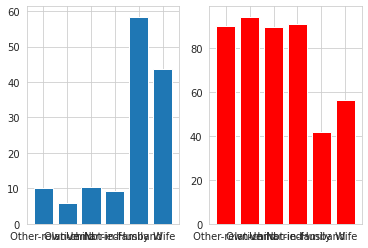

% of >50K income when Relationship is  Own-child and Native_country is  Italy = 20.0
% of >50K income when Relationship is  Wife and Native_country is  Italy = 50.0
% of >50K income when Relationship is  Unmarried and Native_country is  Italy = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Italy = 40.476190476190474
% of >50K income when Relationship is  Not-in-family and Native_country is  Italy = 26.666666666666668
% of >50K income when Relationship is  Other-relative and Native_country is  Italy = 0.0


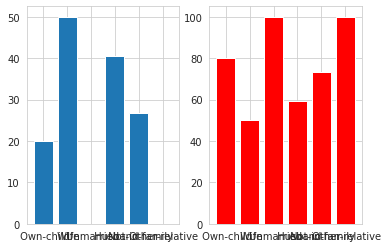

% of >50K income when Relationship is  Husband and Native_country is  Poland = 38.46153846153847
% of >50K income when Relationship is  Not-in-family and Native_country is  Poland = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Poland = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Poland = 33.33333333333333
% of >50K income when Relationship is  Other-relative and Native_country is  Poland = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Poland = 16.666666666666664


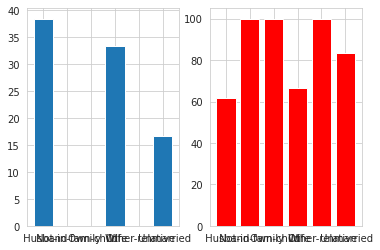

% of >50K income when Relationship is  Not-in-family and Native_country is  Columbia = 5.0
% of >50K income when Relationship is  Husband and Native_country is  Columbia = 6.25
% of >50K income when Relationship is  Unmarried and Native_country is  Columbia = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Columbia = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Columbia = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Columbia = 0.0


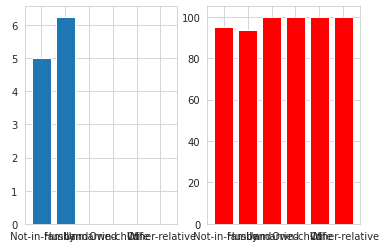

% of >50K income when Relationship is  Husband and Native_country is  Cambodia = 55.55555555555556
% of >50K income when Relationship is  Not-in-family and Native_country is  Cambodia = 25.0
% of >50K income when Relationship is  Other-relative and Native_country is  Cambodia = 33.33333333333333
% of >50K income when Relationship is  Unmarried and Native_country is  Cambodia = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Cambodia = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Cambodia = 0.0


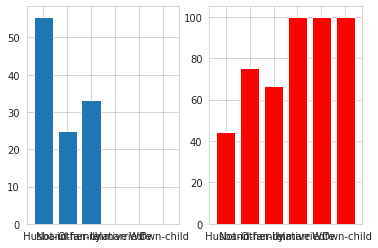

% of >50K income when Relationship is  Husband and Native_country is  Thailand = 50.0
% of >50K income when Relationship is  Unmarried and Native_country is  Thailand = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Thailand = 50.0
% of >50K income when Relationship is  Own-child and Native_country is  Thailand = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Thailand = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Thailand = 0.0


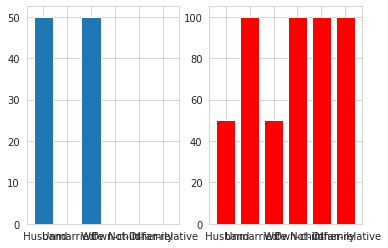

% of >50K income when Relationship is  Husband and Native_country is  Ecuador = 27.27272727272727
% of >50K income when Relationship is  Not-in-family and Native_country is  Ecuador = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Ecuador = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Ecuador = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Ecuador = 14.285714285714285
% of >50K income when Relationship is  Wife and Native_country is  Ecuador = 0.0


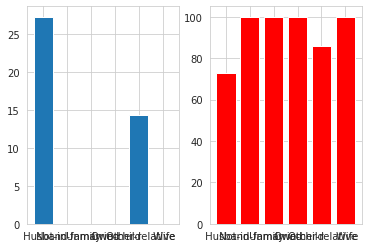

% of >50K income when Relationship is  Wife and Native_country is  Laos = 25.0
% of >50K income when Relationship is  Husband and Native_country is  Laos = 14.285714285714285
% of >50K income when Relationship is  Not-in-family and Native_country is  Laos = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Laos = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Laos = 0.0


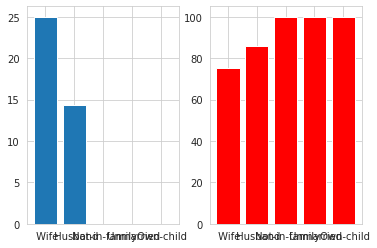

% of >50K income when Relationship is  Husband and Native_country is  Taiwan = 65.21739130434783
% of >50K income when Relationship is  Own-child and Native_country is  Taiwan = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Taiwan = 25.0
% of >50K income when Relationship is  Wife and Native_country is  Taiwan = 60.0
% of >50K income when Relationship is  Other-relative and Native_country is  Taiwan = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Taiwan = 0.0


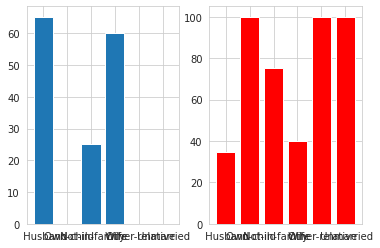

% of >50K income when Relationship is  Unmarried and Native_country is  Haiti = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Haiti = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Haiti = 20.0
% of >50K income when Relationship is  Other-relative and Native_country is  Haiti = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Haiti = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Haiti = 33.33333333333333


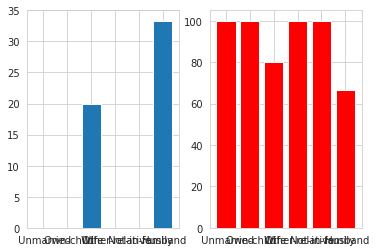

% of >50K income when Relationship is  Husband and Native_country is  Portugal = 11.76470588235294
% of >50K income when Relationship is  Unmarried and Native_country is  Portugal = 20.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Portugal = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Portugal = 25.0
% of >50K income when Relationship is  Own-child and Native_country is  Portugal = 0.0


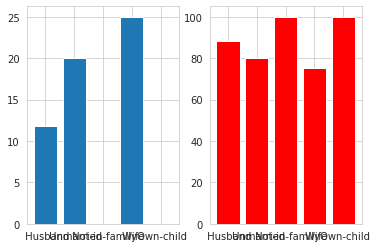

% of >50K income when Relationship is  Not-in-family and Native_country is  Dominican-Republic = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Dominican-Republic = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Dominican-Republic = 8.333333333333332
% of >50K income when Relationship is  Other-relative and Native_country is  Dominican-Republic = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Dominican-Republic = 16.666666666666664
% of >50K income when Relationship is  Husband and Native_country is  Dominican-Republic = 0.0


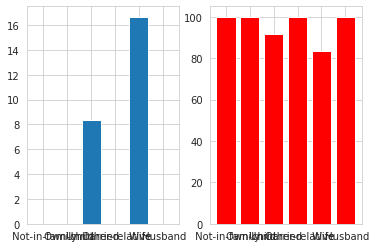

% of >50K income when Relationship is  Own-child and Native_country is  El-Salvador = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  El-Salvador = 6.666666666666667
% of >50K income when Relationship is  Husband and Native_country is  El-Salvador = 24.137931034482758
% of >50K income when Relationship is  Not-in-family and Native_country is  El-Salvador = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  El-Salvador = 0.0
% of >50K income when Relationship is  Wife and Native_country is  El-Salvador = 20.0


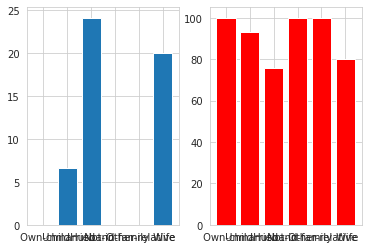

% of >50K income when Relationship is  Unmarried and Native_country is  France = 33.33333333333333
% of >50K income when Relationship is  Husband and Native_country is  France = 72.72727272727273
% of >50K income when Relationship is  Own-child and Native_country is  France = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  France = 16.666666666666664
% of >50K income when Relationship is  Wife and Native_country is  France = 100.0


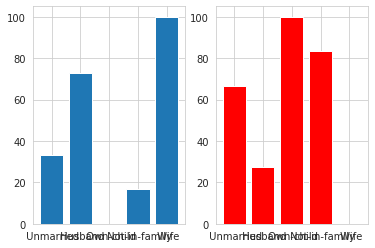

% of >50K income when Relationship is  Not-in-family and Native_country is  Guatemala = 4.761904761904762
% of >50K income when Relationship is  Husband and Native_country is  Guatemala = 7.142857142857142
% of >50K income when Relationship is  Other-relative and Native_country is  Guatemala = 7.6923076923076925
% of >50K income when Relationship is  Own-child and Native_country is  Guatemala = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Guatemala = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Guatemala = 0.0


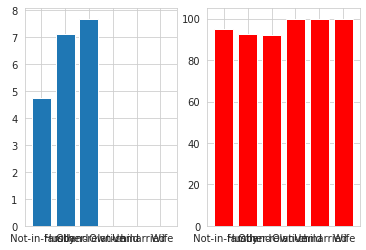

% of >50K income when Relationship is  Husband and Native_country is  China = 36.84210526315789
% of >50K income when Relationship is  Not-in-family and Native_country is  China = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  China = 20.0
% of >50K income when Relationship is  Own-child and Native_country is  China = 16.666666666666664
% of >50K income when Relationship is  Wife and Native_country is  China = 57.14285714285714
% of >50K income when Relationship is  Unmarried and Native_country is  China = 0.0


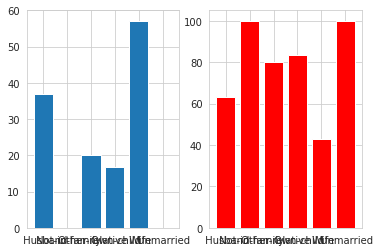

% of >50K income when Relationship is  Not-in-family and Native_country is  Japan = 25.0
% of >50K income when Relationship is  Husband and Native_country is  Japan = 59.25925925925925
% of >50K income when Relationship is  Unmarried and Native_country is  Japan = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Japan = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Japan = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Japan = 100.0


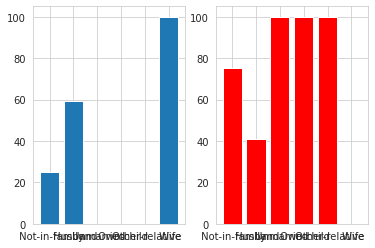

% of >50K income when Relationship is  Husband and Native_country is  Yugoslavia = 45.45454545454545
% of >50K income when Relationship is  Own-child and Native_country is  Yugoslavia = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Yugoslavia = 100.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Yugoslavia = 0.0


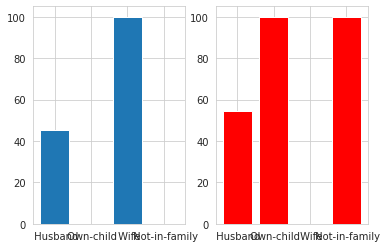

% of >50K income when Relationship is  Wife and Native_country is  Peru = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Peru = 25.0
% of >50K income when Relationship is  Other-relative and Native_country is  Peru = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Peru = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Peru = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Peru = 0.0


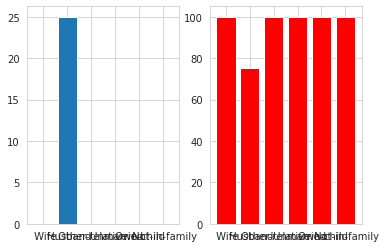

% of >50K income when Relationship is  Not-in-family and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0


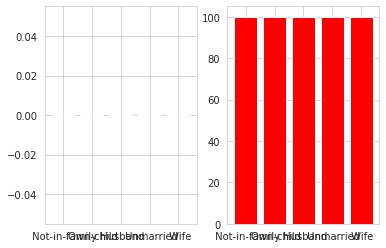

% of >50K income when Relationship is  Unmarried and Native_country is  Scotland = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Scotland = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Scotland = 33.33333333333333
% of >50K income when Relationship is  Not-in-family and Native_country is  Scotland = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Scotland = 66.66666666666666


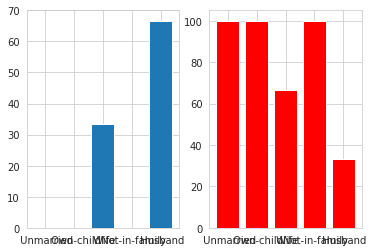

% of >50K income when Relationship is  Husband and Native_country is  Trinadad&Tobago = 28.57142857142857
% of >50K income when Relationship is  Not-in-family and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when Relationship is  Other-relative and Native_country is  Trinadad&Tobago = 0.0


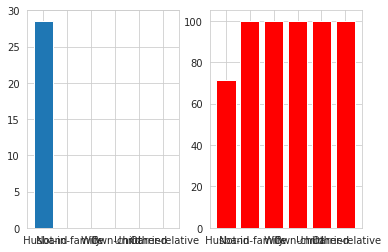

% of >50K income when Relationship is  Own-child and Native_country is  Greece = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Greece = 33.33333333333333
% of >50K income when Relationship is  Not-in-family and Native_country is  Greece = 25.0
% of >50K income when Relationship is  Wife and Native_country is  Greece = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Greece = 100.0
% of >50K income when Relationship is  Other-relative and Native_country is  Greece = 0.0


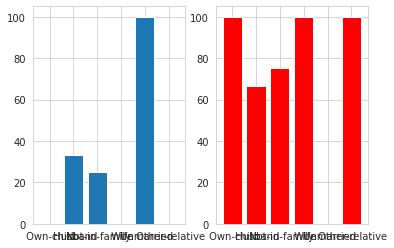

% of >50K income when Relationship is  Husband and Native_country is  Nicaragua = 8.333333333333332
% of >50K income when Relationship is  Other-relative and Native_country is  Nicaragua = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Nicaragua = 0.0
% of >50K income when Relationship is  Own-child and Native_country is  Nicaragua = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Nicaragua = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Nicaragua = 50.0


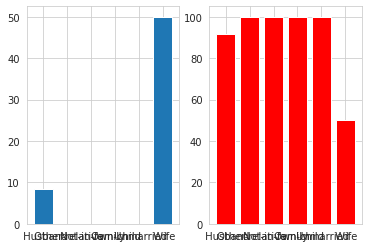

% of >50K income when Relationship is  Unmarried and Native_country is  Vietnam = 0.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Vietnam = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Vietnam = 14.285714285714285
% of >50K income when Relationship is  Wife and Native_country is  Vietnam = 33.33333333333333
% of >50K income when Relationship is  Own-child and Native_country is  Vietnam = 9.090909090909092
% of >50K income when Relationship is  Other-relative and Native_country is  Vietnam = 0.0


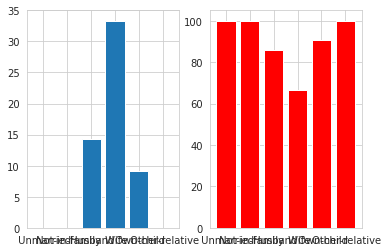

% of >50K income when Relationship is  Other-relative and Native_country is  Hong = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Hong = 55.55555555555556
% of >50K income when Relationship is  Wife and Native_country is  Hong = 25.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Hong = 0.0


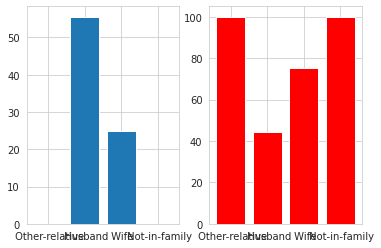

% of >50K income when Relationship is  Not-in-family and Native_country is  Ireland = 7.6923076923076925
% of >50K income when Relationship is  Own-child and Native_country is  Ireland = 0.0
% of >50K income when Relationship is  Unmarried and Native_country is  Ireland = 0.0
% of >50K income when Relationship is  Husband and Native_country is  Ireland = 57.14285714285714
% of >50K income when Relationship is  Other-relative and Native_country is  Ireland = 0.0


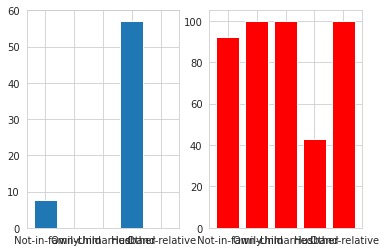

% of >50K income when Relationship is  Husband and Native_country is  Hungary = 40.0
% of >50K income when Relationship is  Not-in-family and Native_country is  Hungary = 16.666666666666664
% of >50K income when Relationship is  Other-relative and Native_country is  Hungary = 0.0
% of >50K income when Relationship is  Wife and Native_country is  Hungary = 0.0


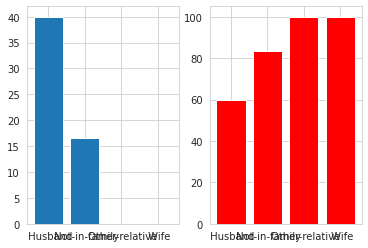

% of >50K income when Relationship is  Other-relative and Native_country is  Holand-Netherlands = 0.0


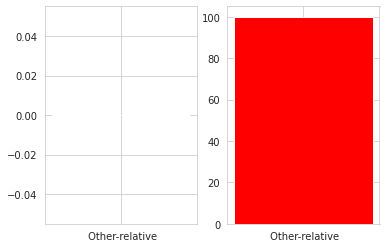

% of >50K income when Sex is  Male and Native_country is  United-States = 31.297788269102476
% of >50K income when Sex is  Female and Native_country is  United-States = 11.072092542863045


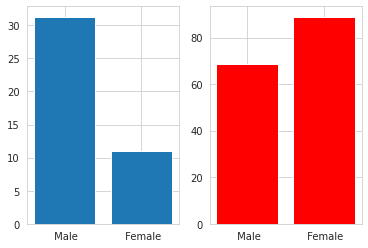

% of >50K income when Sex is  Female and Native_country is  Cuba = 7.5
% of >50K income when Sex is  Male and Native_country is  Cuba = 40.0


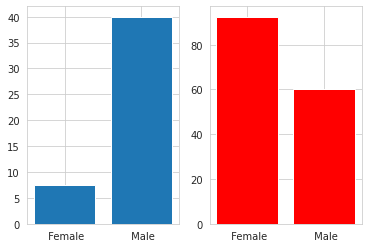

% of >50K income when Sex is  Female and Native_country is  Jamaica = 2.3255813953488373
% of >50K income when Sex is  Male and Native_country is  Jamaica = 23.684210526315788


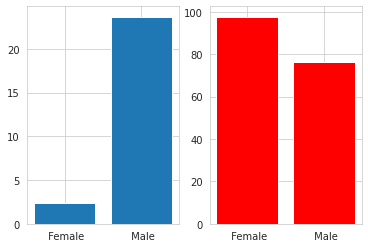

% of >50K income when Sex is  Male and Native_country is  India = 42.69662921348314
% of >50K income when Sex is  Female and Native_country is  India = 18.181818181818183


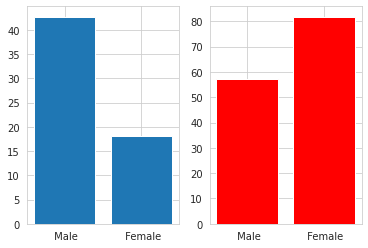

% of >50K income when Sex is  Male and Native_country is  ? = 30.714285714285715
% of >50K income when Sex is  Female and Native_country is  ? = 10.429447852760736


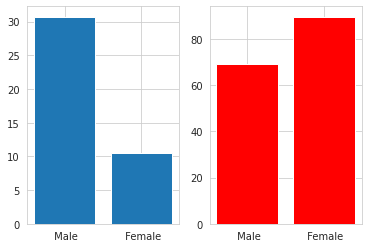

% of >50K income when Sex is  Male and Native_country is  Mexico = 6.237424547283702
% of >50K income when Sex is  Female and Native_country is  Mexico = 1.36986301369863


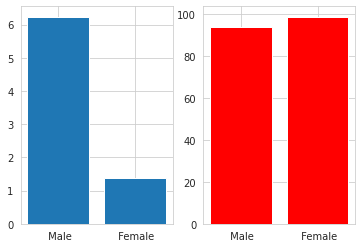

% of >50K income when Sex is  Male and Native_country is  South = 26.0
% of >50K income when Sex is  Female and Native_country is  South = 10.0


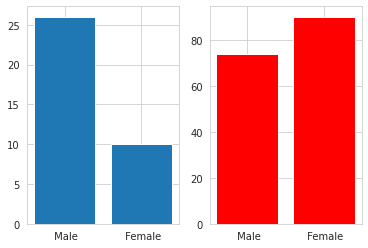

% of >50K income when Sex is  Male and Native_country is  Puerto-Rico = 16.129032258064516
% of >50K income when Sex is  Female and Native_country is  Puerto-Rico = 3.8461538461538463


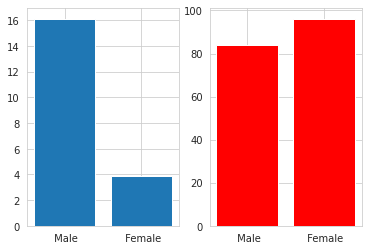

% of >50K income when Sex is  Female and Native_country is  Honduras = 14.285714285714285
% of >50K income when Sex is  Male and Native_country is  Honduras = 0.0


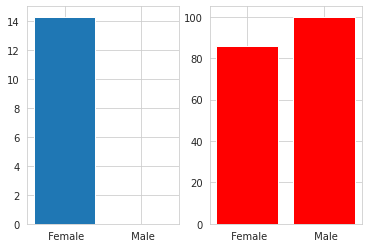

% of >50K income when Sex is  Female and Native_country is  England = 18.75
% of >50K income when Sex is  Male and Native_country is  England = 41.37931034482759


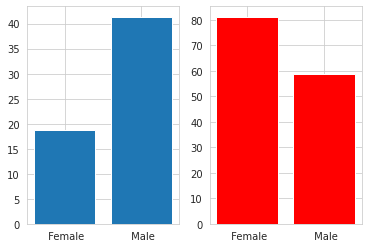

% of >50K income when Sex is  Male and Native_country is  Canada = 36.58536585365854
% of >50K income when Sex is  Female and Native_country is  Canada = 23.076923076923077


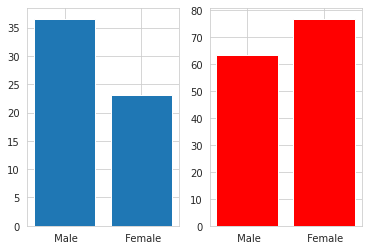

% of >50K income when Sex is  Male and Native_country is  Germany = 48.05194805194805
% of >50K income when Sex is  Female and Native_country is  Germany = 11.666666666666666


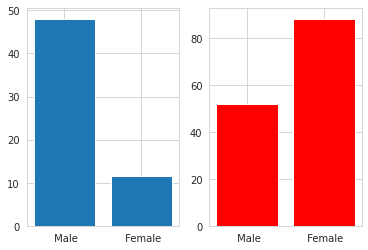

% of >50K income when Sex is  Male and Native_country is  Iran = 45.714285714285715
% of >50K income when Sex is  Female and Native_country is  Iran = 25.0


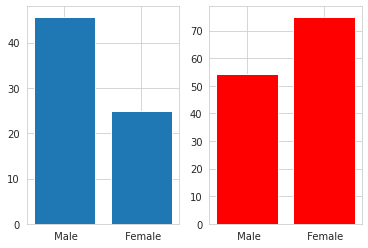

% of >50K income when Sex is  Female and Native_country is  Philippines = 16.43835616438356
% of >50K income when Sex is  Male and Native_country is  Philippines = 39.2


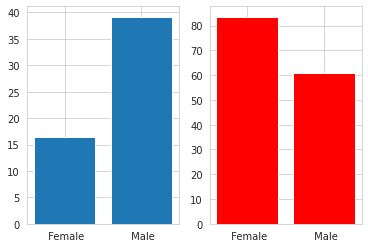

% of >50K income when Sex is  Male and Native_country is  Italy = 38.46153846153847
% of >50K income when Sex is  Female and Native_country is  Italy = 23.809523809523807


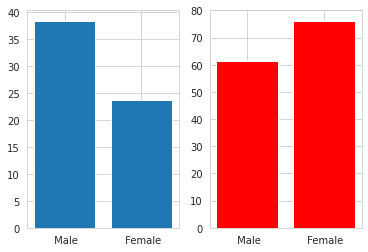

% of >50K income when Sex is  Male and Native_country is  Poland = 24.390243902439025
% of >50K income when Sex is  Female and Native_country is  Poland = 10.526315789473683


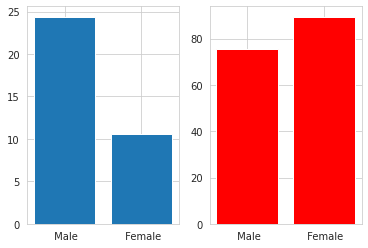

% of >50K income when Sex is  Female and Native_country is  Columbia = 0.0
% of >50K income when Sex is  Male and Native_country is  Columbia = 5.714285714285714


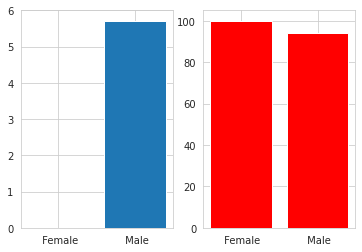

% of >50K income when Sex is  Male and Native_country is  Cambodia = 43.75
% of >50K income when Sex is  Female and Native_country is  Cambodia = 0.0


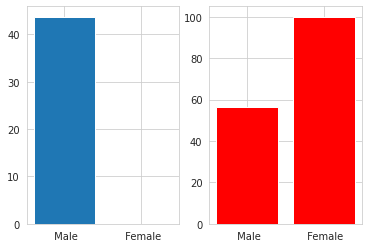

% of >50K income when Sex is  Male and Native_country is  Thailand = 28.57142857142857
% of >50K income when Sex is  Female and Native_country is  Thailand = 9.090909090909092


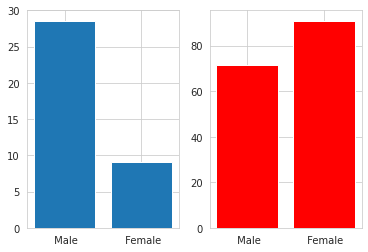

% of >50K income when Sex is  Male and Native_country is  Ecuador = 21.052631578947366
% of >50K income when Sex is  Female and Native_country is  Ecuador = 0.0


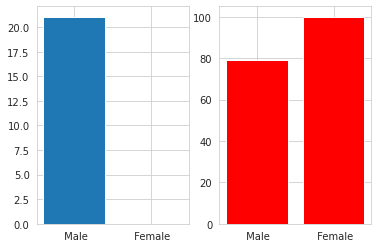

% of >50K income when Sex is  Female and Native_country is  Laos = 12.5
% of >50K income when Sex is  Male and Native_country is  Laos = 10.0


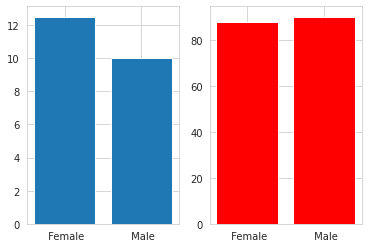

% of >50K income when Sex is  Male and Native_country is  Taiwan = 44.44444444444444
% of >50K income when Sex is  Female and Native_country is  Taiwan = 26.666666666666668


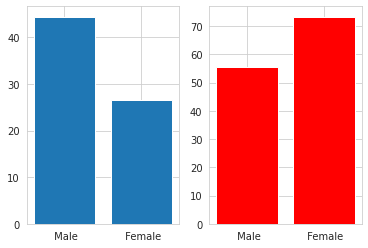

% of >50K income when Sex is  Male and Native_country is  Haiti = 12.5
% of >50K income when Sex is  Female and Native_country is  Haiti = 5.0


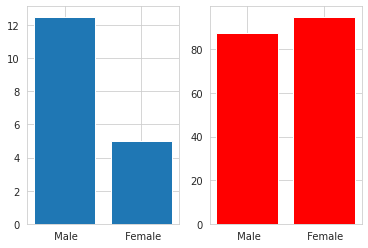

% of >50K income when Sex is  Male and Native_country is  Portugal = 8.0
% of >50K income when Sex is  Female and Native_country is  Portugal = 16.666666666666664


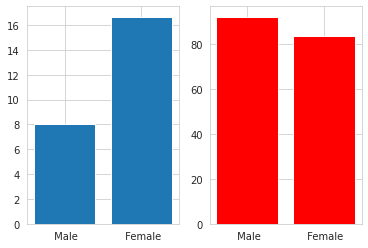

% of >50K income when Sex is  Male and Native_country is  Dominican-Republic = 0.0
% of >50K income when Sex is  Female and Native_country is  Dominican-Republic = 5.714285714285714


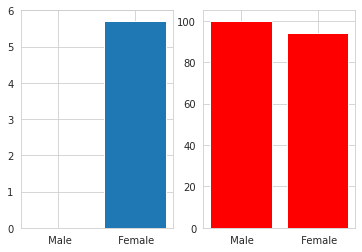

% of >50K income when Sex is  Male and Native_country is  El-Salvador = 11.267605633802818
% of >50K income when Sex is  Female and Native_country is  El-Salvador = 2.857142857142857


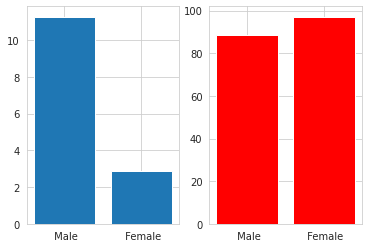

% of >50K income when Sex is  Female and Native_country is  France = 25.0
% of >50K income when Sex is  Male and Native_country is  France = 52.94117647058824


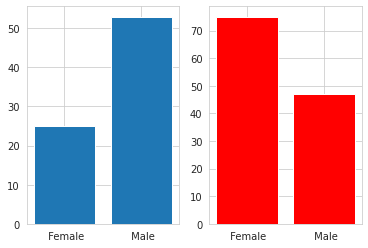

% of >50K income when Sex is  Male and Native_country is  Guatemala = 6.8181818181818175
% of >50K income when Sex is  Female and Native_country is  Guatemala = 0.0


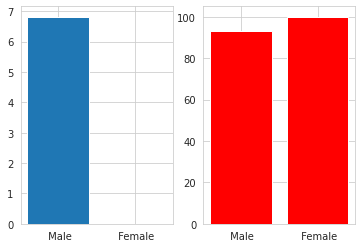

% of >50K income when Sex is  Male and Native_country is  China = 27.77777777777778
% of >50K income when Sex is  Female and Native_country is  China = 23.809523809523807


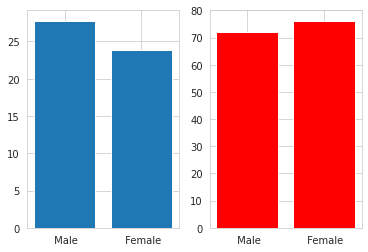

% of >50K income when Sex is  Male and Native_country is  Japan = 45.23809523809524
% of >50K income when Sex is  Female and Native_country is  Japan = 25.0


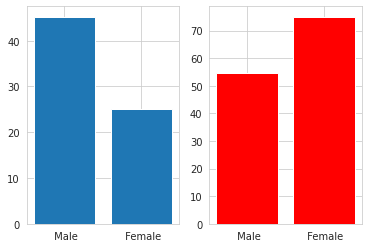

% of >50K income when Sex is  Male and Native_country is  Yugoslavia = 38.46153846153847
% of >50K income when Sex is  Female and Native_country is  Yugoslavia = 33.33333333333333


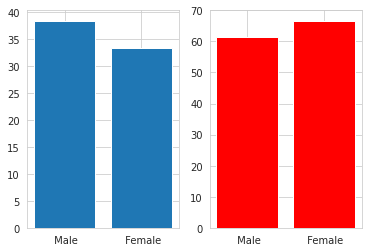

% of >50K income when Sex is  Female and Native_country is  Peru = 0.0
% of >50K income when Sex is  Male and Native_country is  Peru = 11.76470588235294


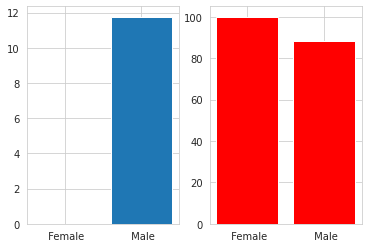

% of >50K income when Sex is  Female and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when Sex is  Male and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0


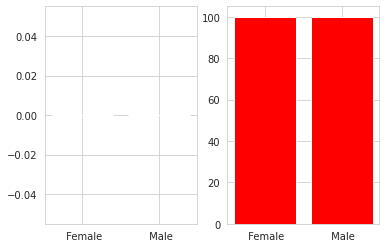

% of >50K income when Sex is  Male and Native_country is  Scotland = 28.57142857142857
% of >50K income when Sex is  Female and Native_country is  Scotland = 20.0


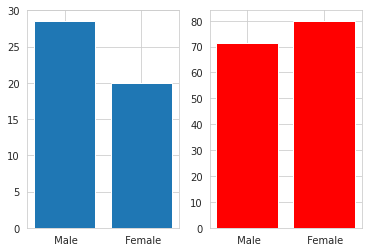

% of >50K income when Sex is  Male and Native_country is  Trinadad&Tobago = 25.0
% of >50K income when Sex is  Female and Native_country is  Trinadad&Tobago = 0.0


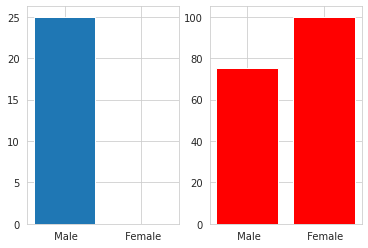

% of >50K income when Sex is  Male and Native_country is  Greece = 29.166666666666668
% of >50K income when Sex is  Female and Native_country is  Greece = 20.0


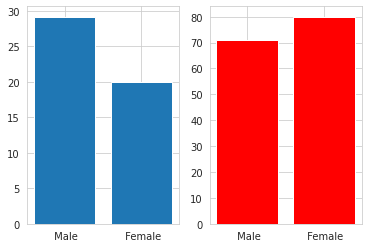

% of >50K income when Sex is  Male and Native_country is  Nicaragua = 4.545454545454546
% of >50K income when Sex is  Female and Native_country is  Nicaragua = 8.333333333333332


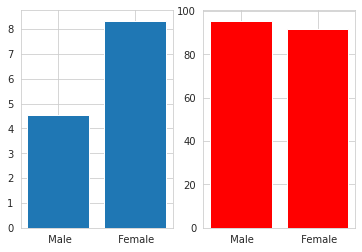

% of >50K income when Sex is  Male and Native_country is  Vietnam = 9.090909090909092
% of >50K income when Sex is  Female and Native_country is  Vietnam = 4.3478260869565215


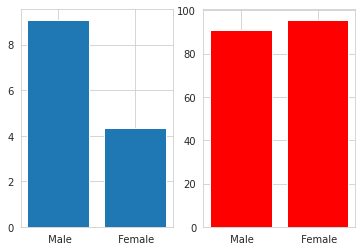

% of >50K income when Sex is  Female and Native_country is  Hong = 16.666666666666664
% of >50K income when Sex is  Male and Native_country is  Hong = 35.714285714285715


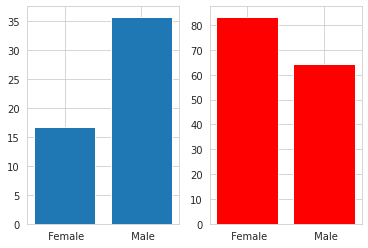

% of >50K income when Sex is  Male and Native_country is  Ireland = 23.52941176470588
% of >50K income when Sex is  Female and Native_country is  Ireland = 14.285714285714285


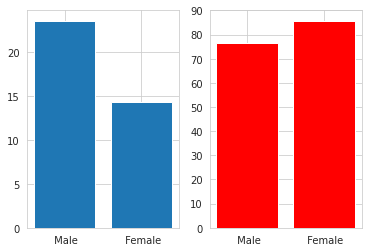

% of >50K income when Sex is  Male and Native_country is  Hungary = 28.57142857142857
% of >50K income when Sex is  Female and Native_country is  Hungary = 16.666666666666664


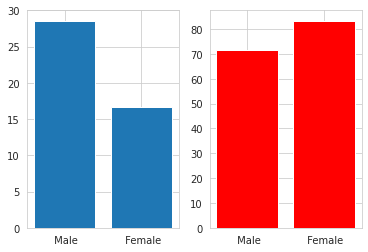

% of >50K income when Sex is  Female and Native_country is  Holand-Netherlands = 0.0


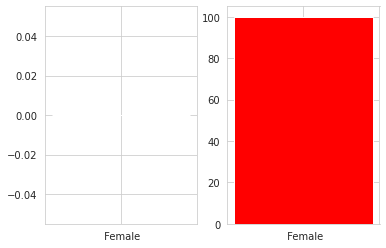

% of >50K income when age_cat is 4 and Native_country is  United-States = 39.06449553001277
% of >50K income when age_cat is 3 and Native_country is  United-States = 28.640776699029125
% of >50K income when age_cat is 5 and Native_country is  United-States = 38.217928073000536
% of >50K income when age_cat is 2 and Native_country is  United-States = 7.811704834605599
% of >50K income when age_cat is 1 and Native_country is  United-States = 0.12845215157353884
% of >50K income when age_cat is 6 and Native_country is  United-States = 23.411214953271028


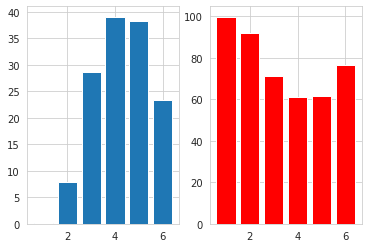

% of >50K income when age_cat is 2 and Native_country is  Cuba = 16.666666666666664
% of >50K income when age_cat is 5 and Native_country is  Cuba = 17.391304347826086
% of >50K income when age_cat is 4 and Native_country is  Cuba = 23.809523809523807
% of >50K income when age_cat is 3 and Native_country is  Cuba = 50.0
% of >50K income when age_cat is 6 and Native_country is  Cuba = 7.6923076923076925


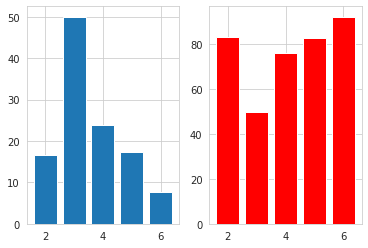

% of >50K income when age_cat is 4 and Native_country is  Jamaica = 23.076923076923077
% of >50K income when age_cat is 3 and Native_country is  Jamaica = 17.391304347826086
% of >50K income when age_cat is 1 and Native_country is  Jamaica = 0.0
% of >50K income when age_cat is 5 and Native_country is  Jamaica = 10.0
% of >50K income when age_cat is 2 and Native_country is  Jamaica = 3.225806451612903
% of >50K income when age_cat is 6 and Native_country is  Jamaica = 50.0


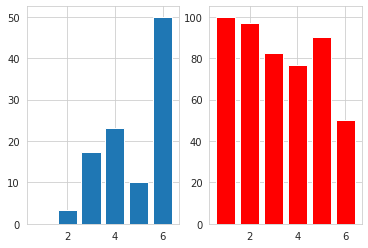

% of >50K income when age_cat is 2 and Native_country is  India = 27.586206896551722
% of >50K income when age_cat is 4 and Native_country is  India = 50.0
% of >50K income when age_cat is 5 and Native_country is  India = 60.0
% of >50K income when age_cat is 3 and Native_country is  India = 34.61538461538461
% of >50K income when age_cat is 1 and Native_country is  India = 0.0
% of >50K income when age_cat is 6 and Native_country is  India = 50.0


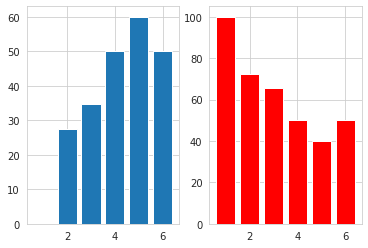

% of >50K income when age_cat is 3 and Native_country is  ? = 25.806451612903224
% of >50K income when age_cat is 1 and Native_country is  ? = 0.0
% of >50K income when age_cat is 2 and Native_country is  ? = 6.802721088435375
% of >50K income when age_cat is 5 and Native_country is  ? = 41.935483870967744
% of >50K income when age_cat is 4 and Native_country is  ? = 36.76470588235294
% of >50K income when age_cat is 6 and Native_country is  ? = 32.432432432432435


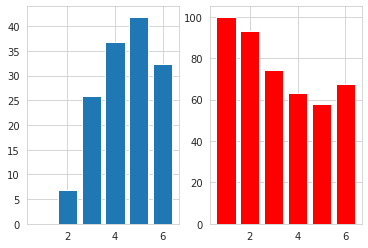

% of >50K income when age_cat is 3 and Native_country is  Mexico = 7.865168539325842
% of >50K income when age_cat is 4 and Native_country is  Mexico = 10.416666666666668
% of >50K income when age_cat is 2 and Native_country is  Mexico = 1.4184397163120568
% of >50K income when age_cat is 1 and Native_country is  Mexico = 0.0
% of >50K income when age_cat is 5 and Native_country is  Mexico = 7.8431372549019605
% of >50K income when age_cat is 6 and Native_country is  Mexico = 10.0


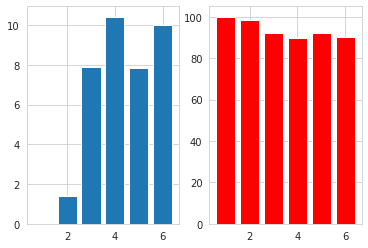

% of >50K income when age_cat is 5 and Native_country is  South = 44.44444444444444
% of >50K income when age_cat is 2 and Native_country is  South = 8.0
% of >50K income when age_cat is 4 and Native_country is  South = 42.10526315789473
% of >50K income when age_cat is 3 and Native_country is  South = 11.11111111111111
% of >50K income when age_cat is 1 and Native_country is  South = 0.0
% of >50K income when age_cat is 6 and Native_country is  South = 0.0


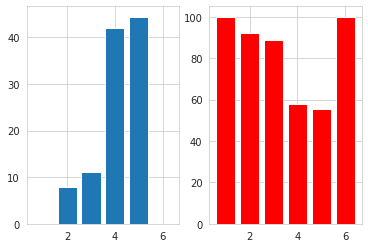

% of >50K income when age_cat is 4 and Native_country is  Puerto-Rico = 6.0606060606060606
% of >50K income when age_cat is 3 and Native_country is  Puerto-Rico = 12.903225806451612
% of >50K income when age_cat is 2 and Native_country is  Puerto-Rico = 0.0
% of >50K income when age_cat is 6 and Native_country is  Puerto-Rico = 14.285714285714285
% of >50K income when age_cat is 5 and Native_country is  Puerto-Rico = 31.25
% of >50K income when age_cat is 1 and Native_country is  Puerto-Rico = 0.0


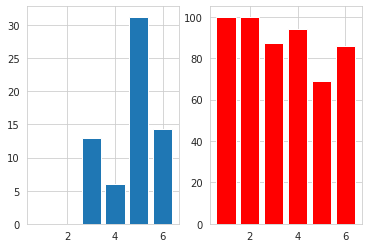

% of >50K income when age_cat is 4 and Native_country is  Honduras = 33.33333333333333
% of >50K income when age_cat is 3 and Native_country is  Honduras = 0.0
% of >50K income when age_cat is 2 and Native_country is  Honduras = 0.0
% of >50K income when age_cat is 5 and Native_country is  Honduras = 0.0
% of >50K income when age_cat is 1 and Native_country is  Honduras = 0.0


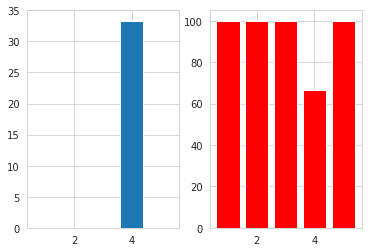

% of >50K income when age_cat is 4 and Native_country is  England = 45.45454545454545
% of >50K income when age_cat is 2 and Native_country is  England = 10.0
% of >50K income when age_cat is 5 and Native_country is  England = 30.76923076923077
% of >50K income when age_cat is 3 and Native_country is  England = 41.66666666666667
% of >50K income when age_cat is 6 and Native_country is  England = 50.0
% of >50K income when age_cat is 1 and Native_country is  England = 0.0


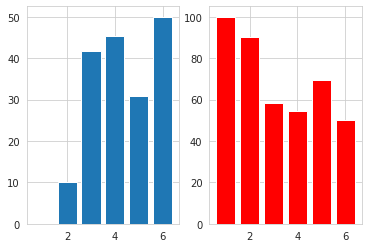

% of >50K income when age_cat is 5 and Native_country is  Canada = 45.0
% of >50K income when age_cat is 1 and Native_country is  Canada = 0.0
% of >50K income when age_cat is 3 and Native_country is  Canada = 42.857142857142854
% of >50K income when age_cat is 4 and Native_country is  Canada = 52.17391304347826
% of >50K income when age_cat is 2 and Native_country is  Canada = 7.142857142857142
% of >50K income when age_cat is 6 and Native_country is  Canada = 22.22222222222222


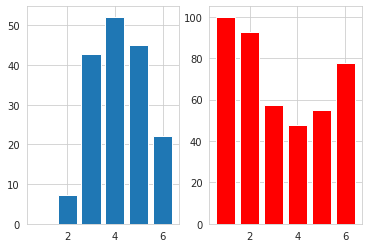

% of >50K income when age_cat is 2 and Native_country is  Germany = 11.904761904761903
% of >50K income when age_cat is 5 and Native_country is  Germany = 61.111111111111114
% of >50K income when age_cat is 6 and Native_country is  Germany = 30.0
% of >50K income when age_cat is 4 and Native_country is  Germany = 36.666666666666664
% of >50K income when age_cat is 3 and Native_country is  Germany = 38.88888888888889
% of >50K income when age_cat is 1 and Native_country is  Germany = 0.0


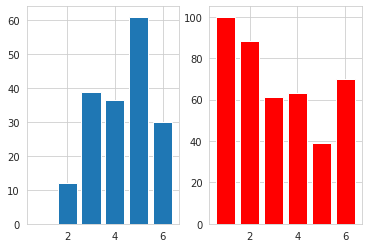

% of >50K income when age_cat is 3 and Native_country is  Iran = 55.00000000000001
% of >50K income when age_cat is 4 and Native_country is  Iran = 44.44444444444444
% of >50K income when age_cat is 5 and Native_country is  Iran = 40.0
% of >50K income when age_cat is 2 and Native_country is  Iran = 0.0
% of >50K income when age_cat is 6 and Native_country is  Iran = 50.0


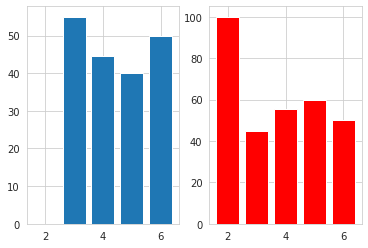

% of >50K income when age_cat is 3 and Native_country is  Philippines = 38.70967741935484
% of >50K income when age_cat is 2 and Native_country is  Philippines = 7.8431372549019605
% of >50K income when age_cat is 4 and Native_country is  Philippines = 48.93617021276596
% of >50K income when age_cat is 5 and Native_country is  Philippines = 36.84210526315789
% of >50K income when age_cat is 1 and Native_country is  Philippines = 0.0
% of >50K income when age_cat is 6 and Native_country is  Philippines = 21.428571428571427


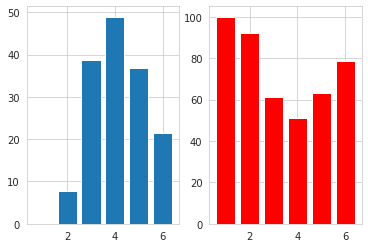

% of >50K income when age_cat is 1 and Native_country is  Italy = 0.0
% of >50K income when age_cat is 4 and Native_country is  Italy = 65.0
% of >50K income when age_cat is 5 and Native_country is  Italy = 25.0
% of >50K income when age_cat is 2 and Native_country is  Italy = 12.5
% of >50K income when age_cat is 3 and Native_country is  Italy = 14.285714285714285
% of >50K income when age_cat is 6 and Native_country is  Italy = 40.0


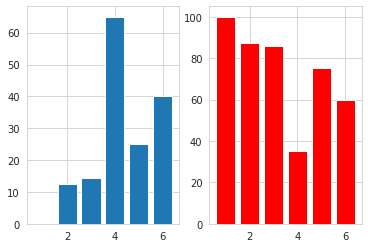

% of >50K income when age_cat is 3 and Native_country is  Poland = 15.384615384615385
% of >50K income when age_cat is 2 and Native_country is  Poland = 13.333333333333334
% of >50K income when age_cat is 4 and Native_country is  Poland = 7.142857142857142
% of >50K income when age_cat is 5 and Native_country is  Poland = 36.36363636363637
% of >50K income when age_cat is 6 and Native_country is  Poland = 50.0
% of >50K income when age_cat is 1 and Native_country is  Poland = 0.0


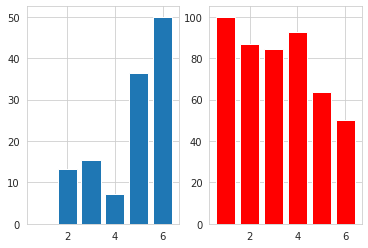

% of >50K income when age_cat is 6 and Native_country is  Columbia = 25.0
% of >50K income when age_cat is 2 and Native_country is  Columbia = 0.0
% of >50K income when age_cat is 4 and Native_country is  Columbia = 7.6923076923076925
% of >50K income when age_cat is 3 and Native_country is  Columbia = 0.0
% of >50K income when age_cat is 5 and Native_country is  Columbia = 0.0
% of >50K income when age_cat is 1 and Native_country is  Columbia = 0.0


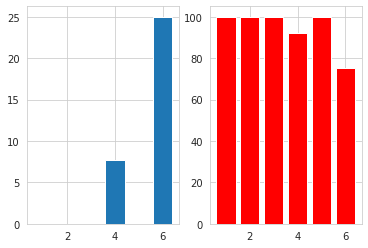

% of >50K income when age_cat is 4 and Native_country is  Cambodia = 100.0
% of >50K income when age_cat is 3 and Native_country is  Cambodia = 25.0
% of >50K income when age_cat is 2 and Native_country is  Cambodia = 25.0
% of >50K income when age_cat is 5 and Native_country is  Cambodia = 0.0
% of >50K income when age_cat is 6 and Native_country is  Cambodia = 0.0
% of >50K income when age_cat is 1 and Native_country is  Cambodia = 0.0


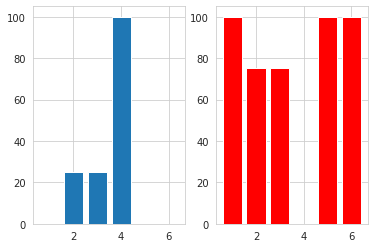

% of >50K income when age_cat is 3 and Native_country is  Thailand = 50.0
% of >50K income when age_cat is 4 and Native_country is  Thailand = 0.0
% of >50K income when age_cat is 2 and Native_country is  Thailand = 20.0
% of >50K income when age_cat is 1 and Native_country is  Thailand = 0.0
% of >50K income when age_cat is 5 and Native_country is  Thailand = 0.0


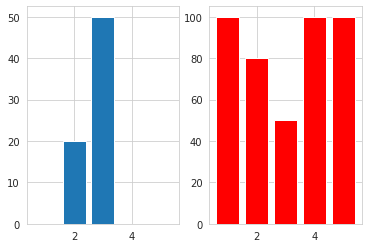

% of >50K income when age_cat is 4 and Native_country is  Ecuador = 0.0
% of >50K income when age_cat is 2 and Native_country is  Ecuador = 7.6923076923076925
% of >50K income when age_cat is 3 and Native_country is  Ecuador = 33.33333333333333
% of >50K income when age_cat is 6 and Native_country is  Ecuador = 50.0


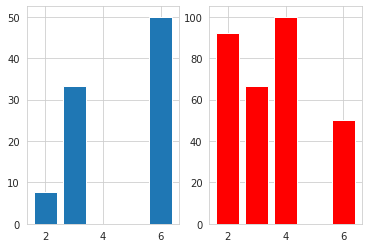

% of >50K income when age_cat is 2 and Native_country is  Laos = 0.0
% of >50K income when age_cat is 5 and Native_country is  Laos = 0.0
% of >50K income when age_cat is 3 and Native_country is  Laos = 33.33333333333333
% of >50K income when age_cat is 1 and Native_country is  Laos = 0.0
% of >50K income when age_cat is 4 and Native_country is  Laos = 25.0


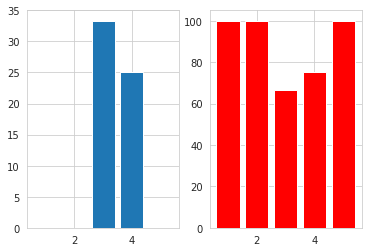

% of >50K income when age_cat is 3 and Native_country is  Taiwan = 64.28571428571429
% of >50K income when age_cat is 2 and Native_country is  Taiwan = 4.166666666666666
% of >50K income when age_cat is 4 and Native_country is  Taiwan = 77.77777777777779
% of >50K income when age_cat is 5 and Native_country is  Taiwan = 66.66666666666666
% of >50K income when age_cat is 6 and Native_country is  Taiwan = 100.0


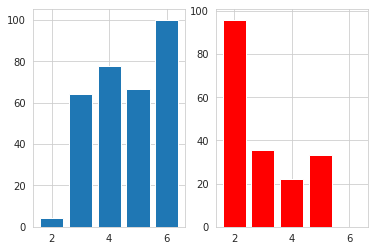

% of >50K income when age_cat is 1 and Native_country is  Haiti = 0.0
% of >50K income when age_cat is 2 and Native_country is  Haiti = 0.0
% of >50K income when age_cat is 3 and Native_country is  Haiti = 0.0
% of >50K income when age_cat is 4 and Native_country is  Haiti = 22.22222222222222
% of >50K income when age_cat is 5 and Native_country is  Haiti = 20.0
% of >50K income when age_cat is 6 and Native_country is  Haiti = 0.0


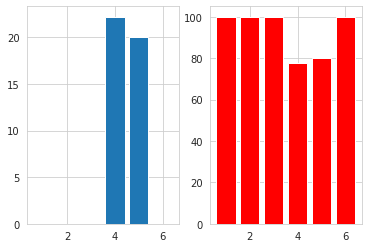

% of >50K income when age_cat is 2 and Native_country is  Portugal = 10.0
% of >50K income when age_cat is 3 and Native_country is  Portugal = 10.0
% of >50K income when age_cat is 5 and Native_country is  Portugal = 20.0
% of >50K income when age_cat is 4 and Native_country is  Portugal = 12.5
% of >50K income when age_cat is 1 and Native_country is  Portugal = 0.0
% of >50K income when age_cat is 6 and Native_country is  Portugal = 0.0


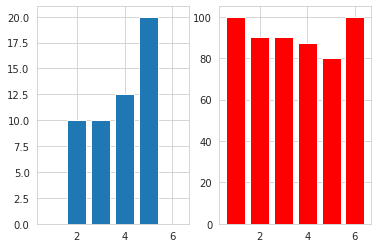

% of >50K income when age_cat is 2 and Native_country is  Dominican-Republic = 3.571428571428571
% of >50K income when age_cat is 4 and Native_country is  Dominican-Republic = 0.0
% of >50K income when age_cat is 1 and Native_country is  Dominican-Republic = 0.0
% of >50K income when age_cat is 3 and Native_country is  Dominican-Republic = 8.333333333333332
% of >50K income when age_cat is 5 and Native_country is  Dominican-Republic = 0.0
% of >50K income when age_cat is 6 and Native_country is  Dominican-Republic = 0.0


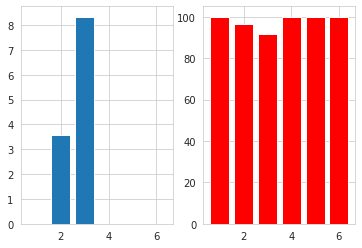

% of >50K income when age_cat is 2 and Native_country is  El-Salvador = 0.0
% of >50K income when age_cat is 4 and Native_country is  El-Salvador = 21.052631578947366
% of >50K income when age_cat is 6 and Native_country is  El-Salvador = 33.33333333333333
% of >50K income when age_cat is 3 and Native_country is  El-Salvador = 4.0
% of >50K income when age_cat is 5 and Native_country is  El-Salvador = 33.33333333333333
% of >50K income when age_cat is 1 and Native_country is  El-Salvador = 0.0


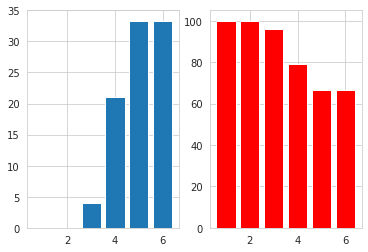

% of >50K income when age_cat is 5 and Native_country is  France = 50.0
% of >50K income when age_cat is 2 and Native_country is  France = 25.0
% of >50K income when age_cat is 3 and Native_country is  France = 60.0
% of >50K income when age_cat is 4 and Native_country is  France = 20.0
% of >50K income when age_cat is 6 and Native_country is  France = 50.0


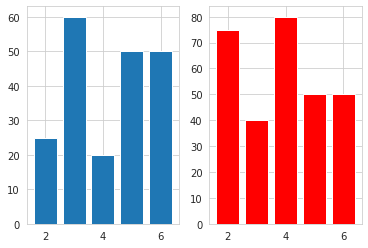

% of >50K income when age_cat is 3 and Native_country is  Guatemala = 8.333333333333332
% of >50K income when age_cat is 4 and Native_country is  Guatemala = 11.11111111111111
% of >50K income when age_cat is 2 and Native_country is  Guatemala = 2.941176470588235
% of >50K income when age_cat is 1 and Native_country is  Guatemala = 0.0
% of >50K income when age_cat is 5 and Native_country is  Guatemala = 0.0
% of >50K income when age_cat is 6 and Native_country is  Guatemala = 0.0


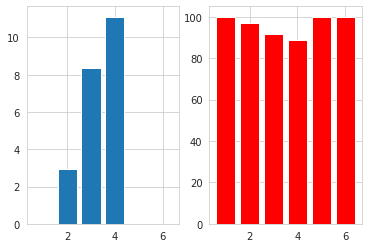

% of >50K income when age_cat is 5 and Native_country is  China = 25.0
% of >50K income when age_cat is 3 and Native_country is  China = 29.166666666666668
% of >50K income when age_cat is 4 and Native_country is  China = 27.77777777777778
% of >50K income when age_cat is 2 and Native_country is  China = 15.384615384615385
% of >50K income when age_cat is 6 and Native_country is  China = 37.5


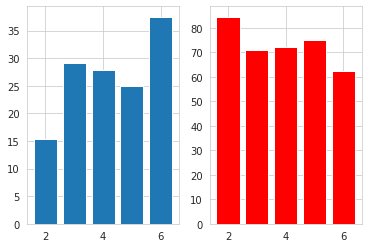

% of >50K income when age_cat is 4 and Native_country is  Japan = 52.63157894736842
% of >50K income when age_cat is 5 and Native_country is  Japan = 80.0
% of >50K income when age_cat is 2 and Native_country is  Japan = 0.0
% of >50K income when age_cat is 3 and Native_country is  Japan = 43.47826086956522
% of >50K income when age_cat is 1 and Native_country is  Japan = 0.0
% of >50K income when age_cat is 6 and Native_country is  Japan = 0.0


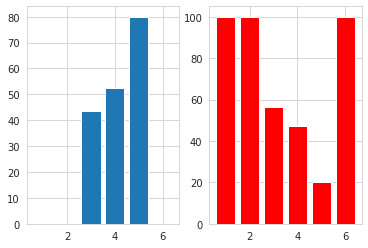

% of >50K income when age_cat is 5 and Native_country is  Yugoslavia = 0.0
% of >50K income when age_cat is 2 and Native_country is  Yugoslavia = 25.0
% of >50K income when age_cat is 3 and Native_country is  Yugoslavia = 80.0
% of >50K income when age_cat is 6 and Native_country is  Yugoslavia = 100.0
% of >50K income when age_cat is 4 and Native_country is  Yugoslavia = 0.0


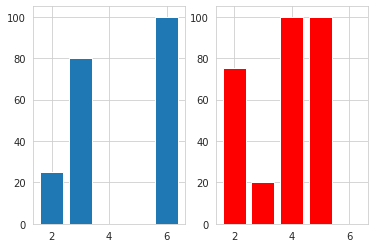

% of >50K income when age_cat is 4 and Native_country is  Peru = 0.0
% of >50K income when age_cat is 3 and Native_country is  Peru = 40.0
% of >50K income when age_cat is 2 and Native_country is  Peru = 0.0
% of >50K income when age_cat is 6 and Native_country is  Peru = 0.0
% of >50K income when age_cat is 1 and Native_country is  Peru = 0.0


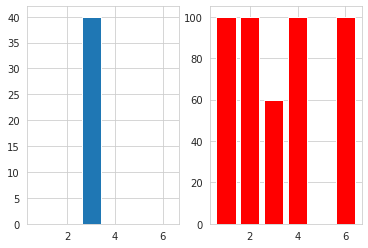

% of >50K income when age_cat is 4 and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when age_cat is 2 and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when age_cat is 6 and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0
% of >50K income when age_cat is 5 and Native_country is  Outlying-US(Guam-USVI-etc) = 0.0


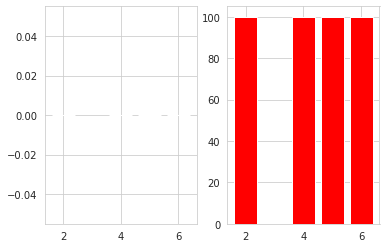

% of >50K income when age_cat is 5 and Native_country is  Scotland = 0.0
% of >50K income when age_cat is 1 and Native_country is  Scotland = 0.0
% of >50K income when age_cat is 4 and Native_country is  Scotland = 66.66666666666666
% of >50K income when age_cat is 2 and Native_country is  Scotland = 0.0
% of >50K income when age_cat is 3 and Native_country is  Scotland = 0.0
% of >50K income when age_cat is 6 and Native_country is  Scotland = 100.0


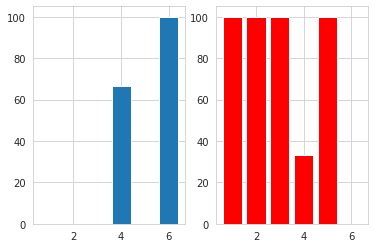

% of >50K income when age_cat is 3 and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when age_cat is 6 and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when age_cat is 4 and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when age_cat is 1 and Native_country is  Trinadad&Tobago = 0.0
% of >50K income when age_cat is 5 and Native_country is  Trinadad&Tobago = 50.0
% of >50K income when age_cat is 2 and Native_country is  Trinadad&Tobago = 100.0


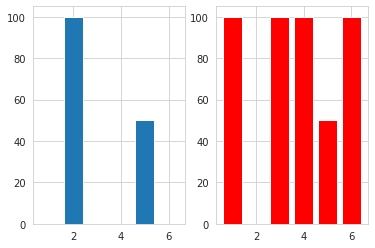

% of >50K income when age_cat is 2 and Native_country is  Greece = 20.0
% of >50K income when age_cat is 5 and Native_country is  Greece = 50.0
% of >50K income when age_cat is 3 and Native_country is  Greece = 0.0
% of >50K income when age_cat is 4 and Native_country is  Greece = 14.285714285714285
% of >50K income when age_cat is 6 and Native_country is  Greece = 0.0


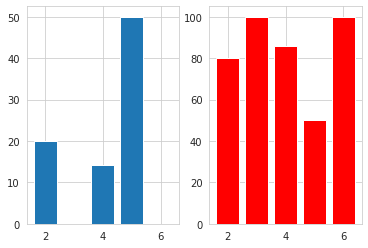

% of >50K income when age_cat is 2 and Native_country is  Nicaragua = 7.142857142857142
% of >50K income when age_cat is 3 and Native_country is  Nicaragua = 11.11111111111111
% of >50K income when age_cat is 5 and Native_country is  Nicaragua = 0.0
% of >50K income when age_cat is 4 and Native_country is  Nicaragua = 0.0
% of >50K income when age_cat is 1 and Native_country is  Nicaragua = 0.0
% of >50K income when age_cat is 6 and Native_country is  Nicaragua = 0.0


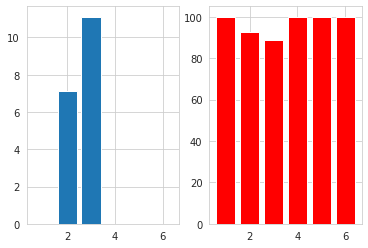

% of >50K income when age_cat is 3 and Native_country is  Vietnam = 0.0
% of >50K income when age_cat is 1 and Native_country is  Vietnam = 0.0
% of >50K income when age_cat is 2 and Native_country is  Vietnam = 8.571428571428571
% of >50K income when age_cat is 4 and Native_country is  Vietnam = 8.333333333333332
% of >50K income when age_cat is 6 and Native_country is  Vietnam = 0.0
% of >50K income when age_cat is 5 and Native_country is  Vietnam = 25.0


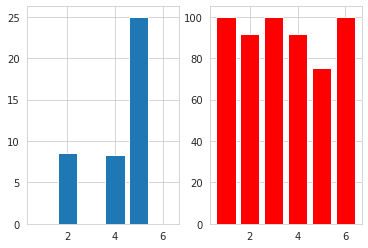

% of >50K income when age_cat is 2 and Native_country is  Hong = 50.0
% of >50K income when age_cat is 5 and Native_country is  Hong = 0.0
% of >50K income when age_cat is 4 and Native_country is  Hong = 0.0
% of >50K income when age_cat is 3 and Native_country is  Hong = 25.0
% of >50K income when age_cat is 1 and Native_country is  Hong = 0.0


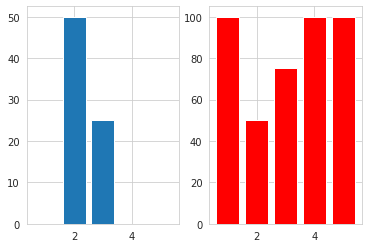

% of >50K income when age_cat is 2 and Native_country is  Ireland = 11.11111111111111
% of >50K income when age_cat is 3 and Native_country is  Ireland = 22.22222222222222
% of >50K income when age_cat is 4 and Native_country is  Ireland = 33.33333333333333
% of >50K income when age_cat is 5 and Native_country is  Ireland = 0.0
% of >50K income when age_cat is 6 and Native_country is  Ireland = 100.0


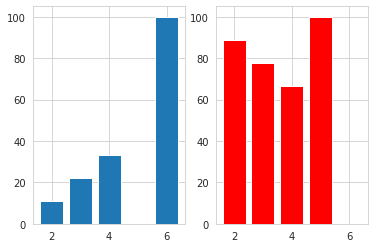

% of >50K income when age_cat is 4 and Native_country is  Hungary = 0.0
% of >50K income when age_cat is 6 and Native_country is  Hungary = 0.0
% of >50K income when age_cat is 5 and Native_country is  Hungary = 75.0
% of >50K income when age_cat is 2 and Native_country is  Hungary = 0.0


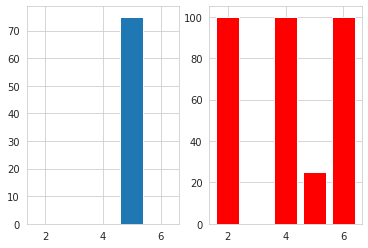

% of >50K income when age_cat is 3 and Native_country is  Holand-Netherlands = 0.0


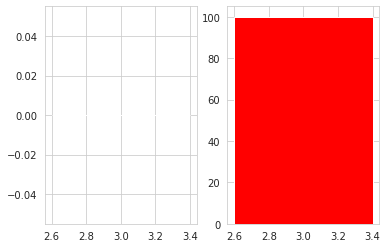

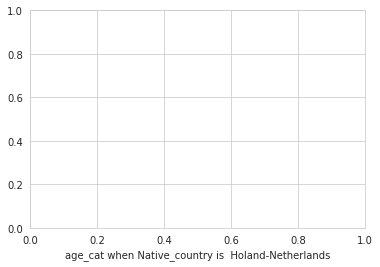

In [38]:
new_feature=pd.DataFrame()
temp_cat.remove('Income')
temp_cat.remove('pro')
for i in temp_cat:
  for j in temp_cat:
    if i != j:
      for k in df[i].unique():
        temp=df.loc[df[i]==k]
        #sns.countplot(x=j,data=temp)
        #plt.show()
        temp=per_cat(temp,j,k,i)
        df.loc[df[i]==k]=temp
      new_feature[i+'_'+j]=df['pro']

        
  temp_cat.remove(i)


Data filtering:-

In [39]:
nf=new_feature.T.drop_duplicates(subset=None, keep='first', inplace=False).T

In [40]:
nf['Income']=df['Income']

In [41]:
temp_cat=list(pd.DataFrame(nf.corr()['Income']).sort_values(by='Income',ascending=False)[:11].index)

In [42]:
df.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income,age_cat,pro
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0,4,0
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0,3,0
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0,5,0
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0,2,0
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,0,3,0


In [43]:
df['Income'].value_counts()

0    24719
1     7841
Name: Income, dtype: int64

Dataset is imbalanced

## **Encoding**:- categories are encoded according to the percentage of value represents edible class (percentage encoding)

In [44]:
cat

['Workclass',
 'Education',
 'Marital_status',
 'Occupation',
 'Relationship',
 'Race',
 'Sex',
 'Native_country']

In [45]:

df_cat=pd.DataFrame(columns=['Education','Occupation','Native_country'])
df_e=df.loc[df['Income']==1]
df_p=df.loc[df['Income']==0]
df_encoding=pd.DataFrame(df,copy=True)
for i in df_cat.columns:
  for j in df[i].unique():
    per_e=(df_e[i].loc[df[i]==j].count()/df[i].loc[df[i]==j].count())*100
    per_p=(df_p[i].loc[df[i]==j].count()/df[i].loc[df[i]==j].count())*100
    df_encoding[i].loc[df_encoding[i]==j]=per_p


In [46]:
for i in ['Education','Occupation','Native_country']:
  cat.remove(i)
ohe=pd.get_dummies(df[cat],drop_first=True)

In [47]:
df_encoding=pd.concat([ohe,nf[temp_cat],df[num]],axis=1)

In [48]:
df_encoding.head()

,Workclass_ Federal-gov,Workclass_ Local-gov,Workclass_ Never-worked,Workclass_ Private,Workclass_ Self-emp-inc,Workclass_ Self-emp-not-inc,Workclass_ State-gov,Workclass_ Without-pay,Marital_status_ Married-AF-spouse,Marital_status_ Married-civ-spouse,Marital_status_ Married-spouse-absent,Marital_status_ Never-married,Marital_status_ Separated,Marital_status_ Widowed,Relationship_ Not-in-family,Relationship_ Other-relative,Relationship_ Own-child,Relationship_ Unmarried,Relationship_ Wife,Race_ Asian-Pac-Islander,Race_ Black,Race_ Other,Race_ White,Sex_ Male,Income,Occupation_Relationship,Education_num_Relationship,Occupation_Marital_status,Education_num_Marital_status,Native_country_Relationship,Native_country_Marital_status,Race_Relationship,Race_Marital_status,Workclass_Relationship,Workclass_Marital_status,Age,Fnlwgt,Capital_gain,Capital_loss,Hours_per_week
0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,1,1,1,1,1,1,0,0,50,83311,0,0,13
1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,38,215646,0,0,40
2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,1,53,234721,0,0,40
3,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,1,1,1,1,1,0,0,1,1,28,338409,0,0,40
4,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,1,1,1,1,1,1,1,1,37,284582,0,0,40


## **Changing Data type**

In [49]:
df_encoding=df_encoding.astype(float)

In [50]:
x=df_encoding.drop('Income',axis=1)
y=df_encoding['Income']

In [51]:
df_encoding.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 40 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Workclass_ Federal-gov                 32560 non-null  float64
 1   Workclass_ Local-gov                   32560 non-null  float64
 2   Workclass_ Never-worked                32560 non-null  float64
 3   Workclass_ Private                     32560 non-null  float64
 4   Workclass_ Self-emp-inc                32560 non-null  float64
 5   Workclass_ Self-emp-not-inc            32560 non-null  float64
 6   Workclass_ State-gov                   32560 non-null  float64
 7   Workclass_ Without-pay                 32560 non-null  float64
 8   Marital_status_ Married-AF-spouse      32560 non-null  float64
 9   Marital_status_ Married-civ-spouse     32560 non-null  float64
 10  Marital_status_ Married-spouse-absent  32560 non-null  float64
 11  Ma

In [52]:
from sklearn.preprocessing import power_transform as PT
pt=pd.DataFrame()
for i in num:
  if df[i].min()<=0:
    pt1=(df[i]-df[i].min()+0.0001)
  else:
    pt1=df[i]
  pt=pd.concat([pt,pd.DataFrame(pt1)],axis=1)

pt1=PT(pt)
pt1=pd.DataFrame(pt1,columns=num)


In [53]:
pt1

,Age,Fnlwgt,Capital_gain,Capital_loss,Hours_per_week
0,0.891503,-1.089888,-0.301370,-0.221213,-2.221043
1,0.103216,0.398742,-0.301370,-0.221213,-0.035681
2,1.063790,0.562540,-0.301370,-0.221213,-0.035681
3,-0.730689,1.340398,-0.301370,-0.221213,-0.035681
4,0.028608,0.957182,-0.301370,-0.221213,-0.035681
...,...,...,...,...,...
32555,-0.827068,0.746749,-0.301370,-0.221213,-0.197664
32556,0.247694,-0.193298,-0.301370,-0.221213,-0.035681
32557,1.333822,-0.219755,-0.301370,-0.221213,-0.035681
32558,-1.358523,0.271668,-0.301370,-0.221213,-1.654836


In [54]:
def pplot(df,i):
  plt.figure(figsize=(20,5))
  plt.subplot(1,3,1)
  
  sns.histplot(x=i,data=df,kde=True)
  plt.subplot(1,3,2)
  stat.probplot(df[i],dist='norm',plot=pylab)
  plt.subplot(1,3,3)
  sns.boxplot(y=i,data=df)
  plt.show()

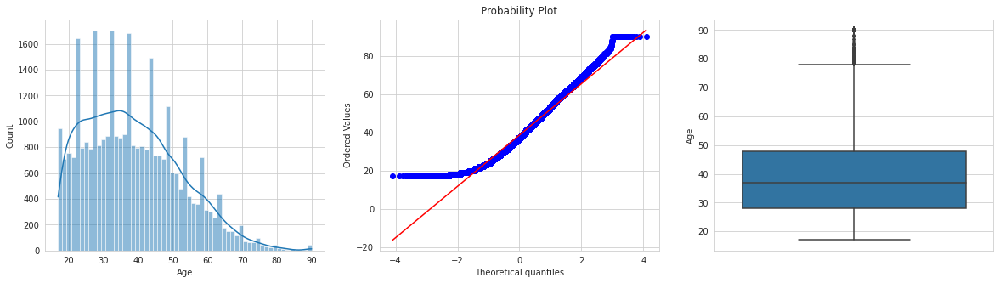

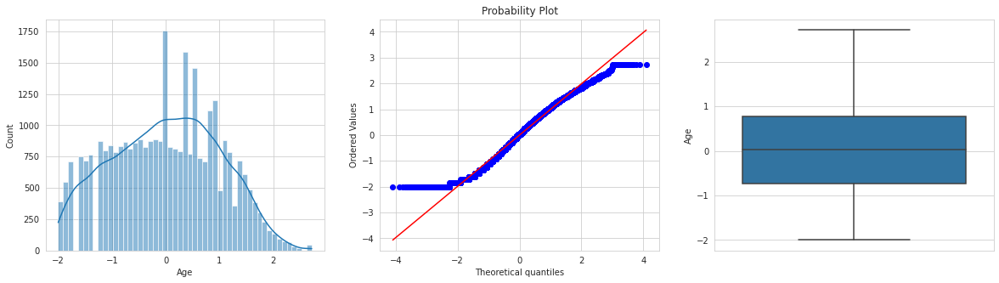

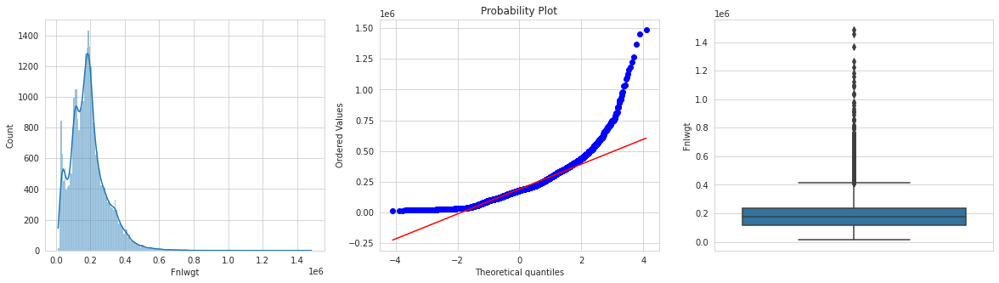

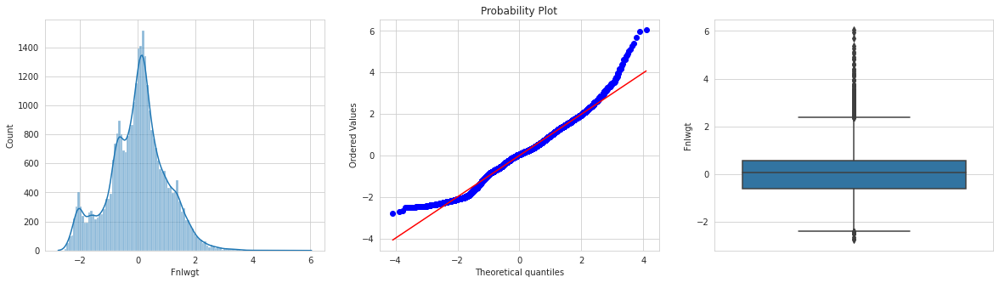

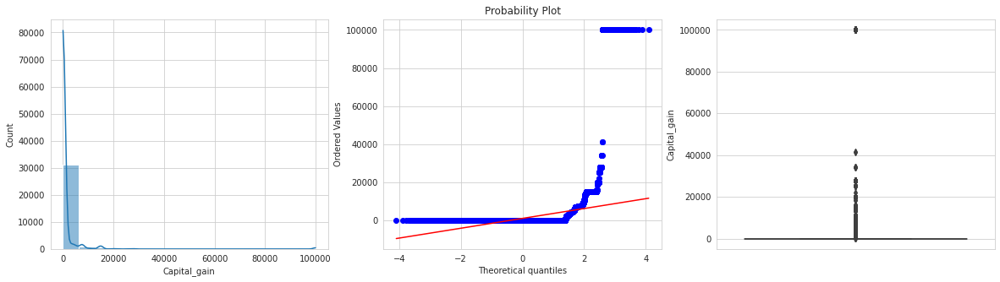

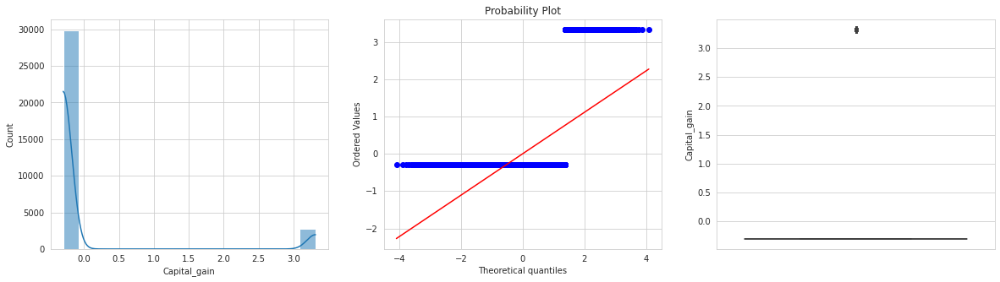

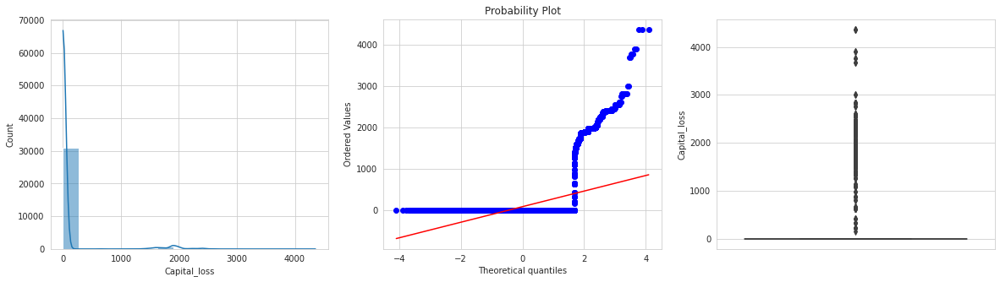

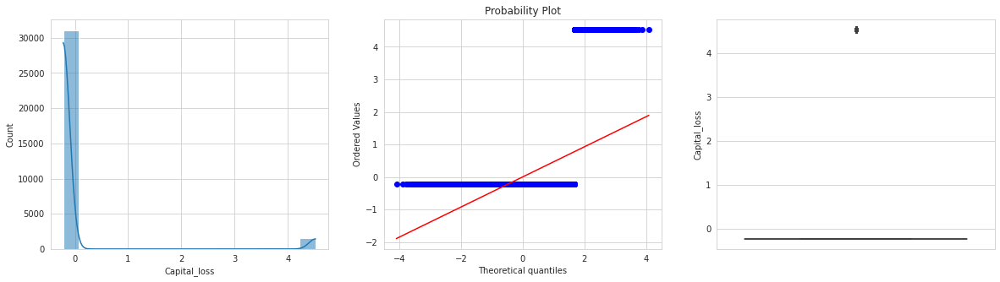

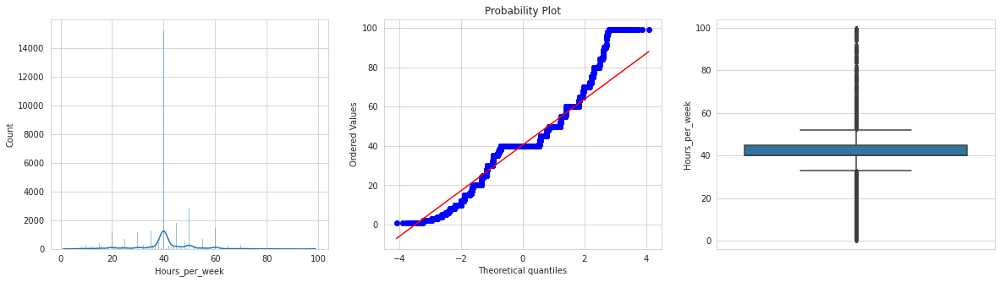

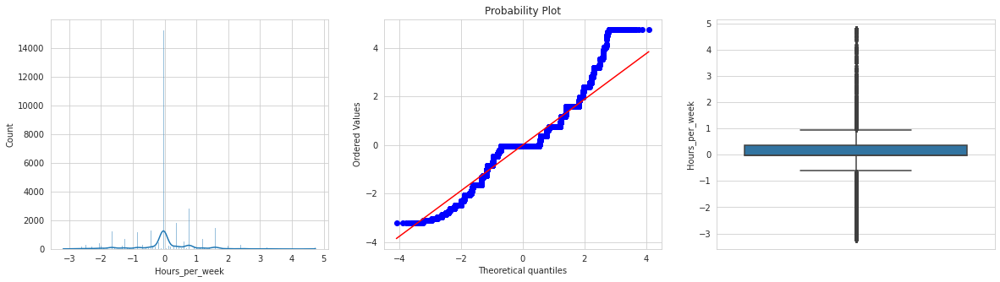

In [55]:
import scipy.stats as stat
import pylab 
pt1=pd.DataFrame(pt1,columns=num)
#pd.concat([pt1,df.quality],axis=1)
for i in num:
  pplot(df,i)
  pplot(pt1,i)

Age and Fnlwgt are Normalized and outlieres are taken care of 

In [56]:
df_encoding[num]=pt1[num]

## **Correlation**

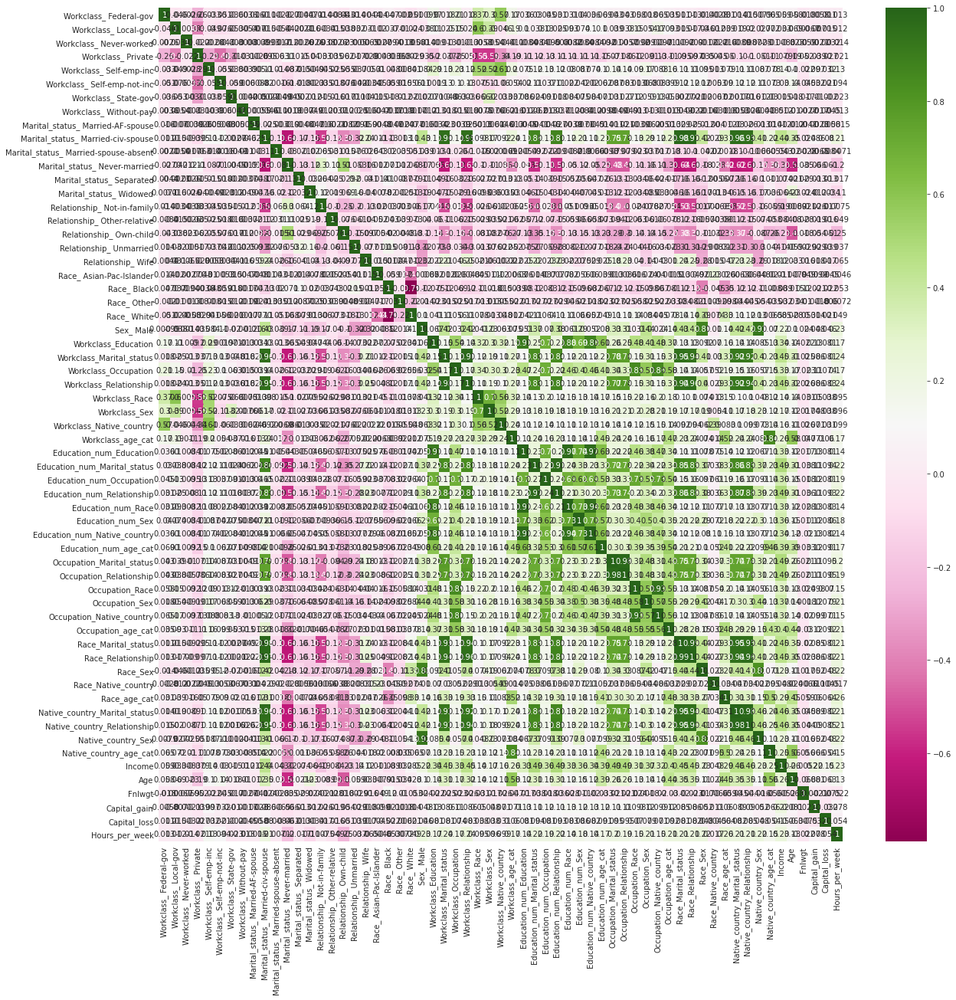

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(df_encoding.corr(),annot=True,cmap='PiYG')

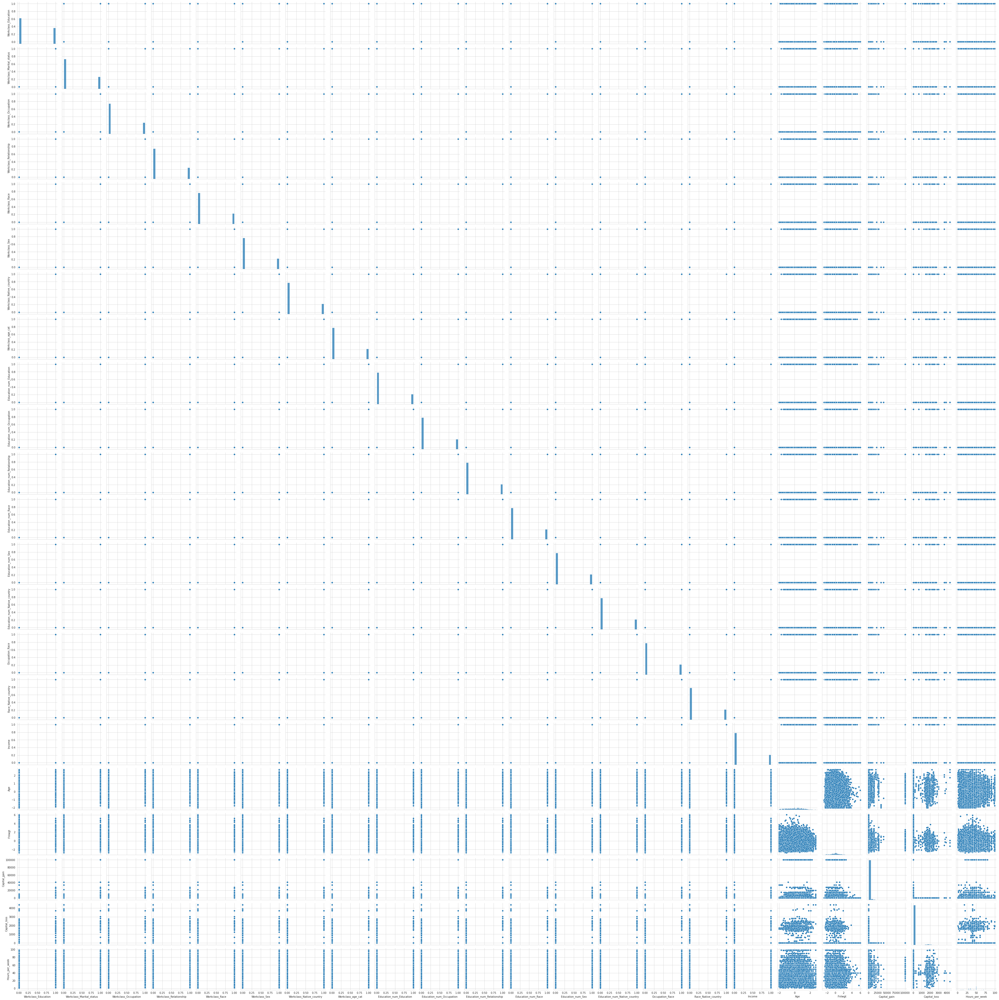

In [ ]:
sns.pairplot(df_encoding)

## **chi-square test**

In [57]:
from sklearn.feature_selection import SelectKBest,chi2
s = SelectKBest(chi2, k=12)
s.fit(x,y)

SelectKBest(k=12, score_func=<function chi2 at 0x7f3f875cb5f0>)

In [58]:
pd.DataFrame([s.scores_,s.pvalues_],columns=x.columns).T.sort_values(by=0)

,0,1
Workclass_ Never-worked,2.220438e+00,1.361944e-01
Race_ Asian-Pac-Islander,3.501817e+00,6.130152e-02
Workclass_ Without-pay,4.440875e+00,3.508825e-02
Marital_status_ Married-AF-spouse,4.733081e+00,2.958784e-02
Workclass_ State-gov,6.972203e+00,8.278553e-03
Workclass_ Self-emp-not-inc,2.704269e+01,1.990109e-07
Race_ Other,3.271710e+01,1.065954e-08
Workclass_ Local-gov,3.335219e+01,7.689115e-09
Race_ White,3.447025e+01,4.328164e-09
Marital_status_ Married-spouse-absent,5.814872e+01,2.430325e-14


## **Separating dependent and independent variables**

In [100]:
from sklearn.model_selection import train_test_split as TTS
x_train,x_test,y_train,y_test=TTS(x,y,test_size=0.1,random_state=42)

In [101]:
from sklearn.preprocessing import StandardScaler as SS
ss=SS()
x_train_scaler=ss.fit_transform(x_train)
x_test_scaler= ss.transform(x_test)

In [90]:
def z_outlier(a,b):
  df_z=pd.concat([a,b],axis=1)
  z=np.abs(stat.zscore(df_z[num]))
  a=int(df_z.size)
  df_z = df_z[(z<3).all(axis=1)]
  print('Percent of data retained = '+ str(int(df_z.size)/a))
  x_z=df_z.drop('Income',axis=1)
  y_z=df_z.Income
  return(x_z,y_z)

In [91]:
x_train,y_train=z_outlier(x_train,y_train)


Percent of data retained = 0.9219560469560469


In [92]:
x_train_scaler= ss.transform(x_train)

# **Model Evaluation**

## **Logistic Regression**

In [102]:
from sklearn.linear_model import LogisticRegression
clf_lr = LogisticRegression(random_state=0).fit(x_train_scaler, y_train)
y_pred=clf_lr.predict(x_test_scaler)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
lr_acc=f1_score(y_test,y_pred)

[[2271  201]
 [ 303  481]]
0.8452088452088452
              precision    recall  f1-score   support

         0.0       0.88      0.92      0.90      2472
         1.0       0.71      0.61      0.66       784

    accuracy                           0.85      3256
   macro avg       0.79      0.77      0.78      3256
weighted avg       0.84      0.85      0.84      3256



In [103]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(clf_lr, ss.transform(x), y, cv=10,scoring='f1')

lr_score=cv_results['test_score'].mean()



In [104]:
lr_score

0.6561427725507882

## **Random Forest Classifier**

In [105]:
from sklearn.ensemble import RandomForestClassifier as RFC 
clf_rfc = RFC().fit(x_train, y_train)
y_pred=clf_rfc.predict(x_test)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
rfc_acc=f1_score(y_test,y_pred)

[[2244  228]
 [ 292  492]]
0.8402948402948403
              precision    recall  f1-score   support

         0.0       0.88      0.91      0.90      2472
         1.0       0.68      0.63      0.65       784

    accuracy                           0.84      3256
   macro avg       0.78      0.77      0.78      3256
weighted avg       0.84      0.84      0.84      3256



In [106]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(RFC(), x, y, cv=10,scoring='f1')

rfc_score=cv_results['test_score'].mean()


## **XGB Classifier**

In [107]:
from xgboost import XGBClassifier as XBC
xgc=XBC().fit(x_train,y_train)

y_pred = xgc.predict(x_test)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
xgc_acc=f1_score(y_test,y_pred)

[[2326  146]
 [ 289  495]]
0.8664004914004914
              precision    recall  f1-score   support

         0.0       0.89      0.94      0.91      2472
         1.0       0.77      0.63      0.69       784

    accuracy                           0.87      3256
   macro avg       0.83      0.79      0.80      3256
weighted avg       0.86      0.87      0.86      3256



In [108]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(XBC(), x, y, cv=10,scoring='f1')

xgc_score=cv_results['test_score'].mean()


xgc=XBC().fit(x_train,y_train)

y_pred = xgc.predict(x_test)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
xgc_acc=f1_score(y_test,y_pred)

[[2326  146]
 [ 289  495]]
0.8664004914004914
              precision    recall  f1-score   support

         0.0       0.89      0.94      0.91      2472
         1.0       0.77      0.63      0.69       784

    accuracy                           0.87      3256
   macro avg       0.83      0.79      0.80      3256
weighted avg       0.86      0.87      0.86      3256



## **Ada Boost Classifier**

In [109]:
from sklearn.ensemble import AdaBoostClassifier as ABC 
abc=ABC().fit(x_train,y_train)

y_pred = abc.predict(x_test)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
abc_acc=f1_score(y_test,y_pred)

[[2305  167]
 [ 298  486]]
0.8571867321867321
              precision    recall  f1-score   support

         0.0       0.89      0.93      0.91      2472
         1.0       0.74      0.62      0.68       784

    accuracy                           0.86      3256
   macro avg       0.81      0.78      0.79      3256
weighted avg       0.85      0.86      0.85      3256



In [110]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(ABC(), x, y, cv=10,scoring='f1')

abc_score=cv_results['test_score'].mean()



## **Extra Tree Classifier**

In [111]:
from sklearn.ensemble import ExtraTreesClassifier as ETC 

etc = ETC(random_state=123)
etc.fit(x_train, y_train)
y_pred=etc.predict(x_test)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
etc_acc=f1_score(y_test,y_pred)

[[2224  248]
 [ 298  486]]
0.8323095823095823
              precision    recall  f1-score   support

         0.0       0.88      0.90      0.89      2472
         1.0       0.66      0.62      0.64       784

    accuracy                           0.83      3256
   macro avg       0.77      0.76      0.77      3256
weighted avg       0.83      0.83      0.83      3256



In [112]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(ETC(), x, y, cv=10,scoring='f1')

etc_score=cv_results['test_score'].mean()


## **Support vector classifier**

In [113]:
from sklearn.svm import SVC

svc = SVC(random_state=123)
svc.fit(x_train_scaler, y_train)
y_pred=svc.predict(x_test_scaler)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
svc_acc=f1_score(y_test,y_pred)

[[2279  193]
 [ 292  492]]
0.851044226044226
              precision    recall  f1-score   support

         0.0       0.89      0.92      0.90      2472
         1.0       0.72      0.63      0.67       784

    accuracy                           0.85      3256
   macro avg       0.80      0.77      0.79      3256
weighted avg       0.85      0.85      0.85      3256



In [114]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(SVC(), ss.transform(x), y, cv=10,scoring='f1')

svc_score=cv_results['test_score'].mean()


## **Comparing models**

In [115]:
score=[lr_score,rfc_score,xgc_score,etc_score,svc_score]
error=[lr_acc,rfc_acc,xgc_acc,etc_acc,svc_acc]
name=['LR','RFC','XGB','ETC','SVC']
diff=[]
for i in range(5):
  diff.append(score[i]-error[i])
pd.DataFrame([name,score,error,diff]).T

,0,1,2,3
0,LR,0.656143,0.656207,-6.45944e-05
1,RFC,0.657051,0.654255,0.00279584
2,XGB,0.688961,0.694737,-0.00577561
3,ETC,0.631793,0.640316,-0.00852333
4,SVC,0.660877,0.669843,-0.00896642


Difference of all the model is very small so its better tochoose the model having best score i.e XGB

# Over-Sampeling

In [124]:
from imblearn.combine import SMOTETomek
os=SMOTETomek(1)
x_train_ns,y_train_ns=os.fit_sample(x_train,y_train)

x_train_ns=pd.DataFrame(x_train_ns)
x_train_ns.columns=x_train.columns
xgc=XBC().fit(x_train_ns,y_train_ns)

y_pred = xgc.predict(x_test)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import f1_score
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))
xgc_acc=f1_score(y_test,y_pred)

[[2265  207]
 [ 256  528]]
0.8578009828009828
              precision    recall  f1-score   support

         0.0       0.90      0.92      0.91      2472
         1.0       0.72      0.67      0.70       784

    accuracy                           0.86      3256
   macro avg       0.81      0.79      0.80      3256
weighted avg       0.86      0.86      0.86      3256



# **Hyper-parameter tuning** 

## **XG Boost**




In [125]:
from sklearn.model_selection import GridSearchCV
params = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01,0.05,0.1],
    'gamma': [0, 0.5, 1],
    'reg_alpha': [0, 0.5, 1],
    'reg_lambda': [0.5, 1, 5],
    
}

xg_grid = GridSearchCV(XBC(n_jobs=-1), params, n_jobs=-1, cv=3,scoring='f1')
xg_grid.fit(x_train_ns, y_train_ns)

print('Best score:', xg_grid.best_score_)
print('Best score:', xg_grid.best_params_)
print('Best score:', xg_grid.best_estimator_)

Best score: 0.8647701894815345
Best score: {'gamma': 1, 'learning_rate': 0.05, 'n_estimators': 100, 'reg_alpha': 1, 'reg_lambda': 5}
Best score: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=1, reg_lambda=5, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


In [68]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(XBC(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=1, reg_lambda=5, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1), x, y, cv=10,scoring='f1')

cv_results['test_score'].mean()

0.7031249440809874

# **Best Model Evaluation**

In [127]:
model=XBC(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1,
              learning_rate=0.05, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=1, reg_lambda=5, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

x_ns,y_ns=os.fit_sample(x,y)

from sklearn.model_selection import cross_val_predict
y_pred = cross_val_predict(model, x_ns, y_ns, cv=10)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
print(confusion_matrix(y_ns,y_pred))
print(accuracy_score(y_ns,y_pred))
print(classification_report(y_ns,y_pred))


[[20200  2011]
 [ 2423 19788]]
0.9001845932195759
              precision    recall  f1-score   support

         0.0       0.89      0.91      0.90     22211
         1.0       0.91      0.89      0.90     22211

    accuracy                           0.90     44422
   macro avg       0.90      0.90      0.90     44422
weighted avg       0.90      0.90      0.90     44422



In [128]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(model, x_ns, y_ns, cv=10)

cv_results['test_score']

array([0.79405807, 0.79833446, 0.81179649, 0.94146781, 0.9385412 ,
       0.93876632, 0.94552004, 0.95092301, 0.94552004, 0.93696533])

In [130]:
pred_prob1 = xgc.predict_proba(x_test)

0.9060327711181559


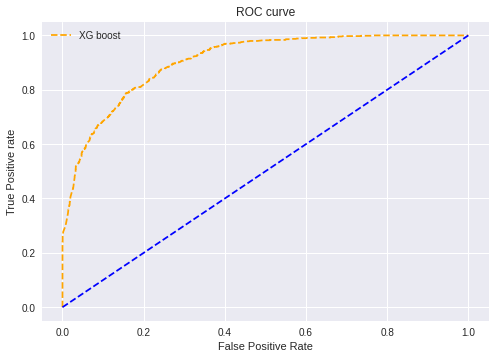

In [131]:
from sklearn.metrics import roc_curve
model.fit(x_train_ns,y_train_ns)
pred_prob1 = model.predict_proba(x_test)
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)


from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])


print(auc_score1)


plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='XG boost')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

# **Saving the model** 

In [132]:
import pickle

filename = '/content/drive/MyDrive/datatrained/census_income/model.sav'
pickle.dump(model, open(filename, 'wb'))

# **Conclusion**

In [137]:

filename = '/content/drive/MyDrive/datatrained/census_income/model.sav'
model = pickle.load(open(filename, 'rb'))

In [138]:
from sklearn.model_selection import cross_val_predict
y_pred = model.predict(x)
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
print(confusion_matrix(y,y_pred))
print(accuracy_score(y,y_pred))
print(classification_report(y,y_pred))

[[22320  2399]
 [ 2425  5416]]
0.8518427518427518
              precision    recall  f1-score   support

         0.0       0.90      0.90      0.90     24719
         1.0       0.69      0.69      0.69      7841

    accuracy                           0.85     32560
   macro avg       0.80      0.80      0.80     32560
weighted avg       0.85      0.85      0.85     32560



In [139]:
pd.concat([pd.DataFrame(y_pred),pd.DataFrame(y)],axis=1).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,32520,32521,32522,32523,32524,32525,32526,32527,32528,32529,32530,32531,32532,32533,32534,32535,32536,32537,32538,32539,32540,32541,32542,32543,32544,32545,32546,32547,32548,32549,32550,32551,32552,32553,32554,32555,32556,32557,32558,32559
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
Income,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
